In [3]:
from os import scandir, path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from pycytominer import feature_select
import seaborn as sns

from abc import ABC, abstractmethod
from scipy import stats
from functools import reduce
from scipy.stats import shapiro,kstest
from sklearn.preprocessing import *
from math import ceil
from Spherize import *

In [4]:
def zscore_outliers(df, thr, per_thr):
    if not (isinstance(thr, float) or isinstance(thr, int)):
        raise TypeError("thr must be numeric value")

    original_columns,categorical_data, numeric_data= df_seperate_columns(df)
    thr_data = numeric_data.where(np.abs(stats.zscore(numeric_data)) < thr, inplace=False)
    outliers_perc = thr_data.apply(lambda x: x.isna().sum()/thr_data.shape[1], axis=1)
    df =  pd.concat([numeric_data, categorical_data],axis="columns")
    df.drop(axis= "index", index = outliers_perc[outliers_perc>per_thr].index,inplace=True)
    del numeric_data, categorical_data, thr_data, outliers_perc
    return df[original_columns]


def quantile_outliers(df, thr, per_thr):
    if not isinstance(thr, float):
        raise TypeError("thr must be numeric value")
    if not isinstance(df,pd.core.frame.DataFrame):
        raise TypeError("df must be pandas dataframe")
    original_columns,categorical_data, numeric_data= df_seperate_columns(df)
    low,high = thr,1- thr
    quant_df = numeric_data.quantile([low, high])
    filt_df = numeric_data.apply(lambda x: x[(x>quant_df.loc[low,x.name]) & 
                                    (x < quant_df.loc[high,x.name])], axis=0)
    outliers_perc = filt_df.apply(lambda x: x.isna().sum()/numeric_data.shape[1], axis=1)
    df =  pd.concat([numeric_data,categorical_data], axis="columns")
    df.drop(axis= "index", index = outliers_perc[outliers_perc>per_thr].index,inplace=True)
    del quant_df, filt_df, numeric_data, categorical_data
    return df[original_columns] 

def df_seperate_columns(df,others=""):
    if not isinstance(df,pd.core.frame.DataFrame):
        raise TypeError("df must be pandas dataframe")
    original_columns = df.columns
    categorical_data = df.select_dtypes(exclude=[np.number])
    numeric_data = df.select_dtypes(include=[np.number])
    categorical_data = pd.concat([categorical_data, numeric_data.loc[:, numeric_data.columns.str.contains("Meta")]],axis="columns")
    numeric_data.drop(numeric_data.loc[:, numeric_data.columns.str.contains("Meta")], axis=1,
                                      inplace=True)
    return original_columns, categorical_data, numeric_data

def zscore_normalization( df):
    st_sc = StandardScaler(with_mean = True, with_std = True)
    org_columns = df.columns
    return pd.DataFrame(st_sc.fit_transform(df),columns = org_columns)

class DataSetOr():
    def __init__(self, data_dir):
        dir_main = ""
        self.comp_data = pd.read_csv(dir_main + data_dir,header=0)
        self.all_channel = ["DNA", "AGP", "RNA", "ER", "Mito"]
        self.or_features_number = self.comp_data.shape[1]

    


In [19]:

class DataSetChannel(DataSetOr):
    def __init__(self, data_dir):
        super().__init__(data_dir)
#         self.channel_name = Organelle_name
#         self.exclude_other_channels()
        self.__outliers_flag = False
        self.ch_df = self.comp_data.copy()

    def exclude_other_channels(self, Organelle_name):
        self.channel_name = Organelle_name
        self.general = self.ch_df.loc[:, self.ch_df.columns.str.contains("Meta")].copy()
        [self.general.drop(self.general.loc[:, self.general.columns.str.contains(_)], axis=1,
                                      inplace=True) for _ in self.all_channel]
        self.org_ch_df = self.ch_df.loc[:, self.ch_df.columns.str.contains(Organelle_name)].copy()
        [self.org_ch_df.drop(self.org_ch_df.loc[:, self.org_ch_df.columns.str.contains(_)], axis=1,
                                      inplace=True) for _ in self.all_channel if _ != Organelle_name]
        
        return self.org_ch_df
        
    def drop_null_columns(self):
        self.ch_df.dropna(axis= 1, how='all', inplace=True)
        
    
    def variance_threshold_FS(self, thr):
        pass
    
    def exclude_pertubation (self):
        ctrl_df = self.ch_df[self.ch_df["pert_type"]=="control"]
        #pert_df = self.ch_df[self.ch_df["pert_type"]!="control"]
        self.ch_df = ctrl_df
        

        
        

    def outliers_removal(self, method = "zscore", thr = 3 , per_thr =0.3, *arg):
        
        if method not in ["zscore", "quantile"]:
            raise ValueError ("should be zscore or quantile")
        ctrl_df = self.ch_df[self.ch_df["pert_type"]=="control"]
        pert_df = self.ch_df[self.ch_df["pert_type"]!="control"]
        if method == "zscore":
            ctrl_df = zscore_outliers(ctrl_df, thr, per_thr)
        else:
            ctrl_df = quantile_outliers(ctrl_df, thr, per_thr)
        self.ch_df = pd.concat([ctrl_df,pert_df],axis ="index").sort_index()
        self.__outliers_flag = True
    

    def correlation_FS(self):
        pass


    def dimensionality_reduction(self):
        pass


    def aggregate(self):
        pass


    def batch_correct(self):
        ctrl_df = self.org_ch_df[self.org_ch_df["pert_type"]=="control"]
        pert_df = self.org_ch_df[self.org_ch_df["pert_type"]!="control"]
        Spherize_model = Spherize()
        
        Spherize_model = Spherize_model.fit(ctrl_df)
        ctrl_df = Spherize_model.transform(ctrl_df)
        pert_df = Spherize_model.transform(pert_df)
        self.ch_df = pd.concat([ctrl_df,pert_df],axis ="index").sort_index()
        return self.ch_df.copy()

In [20]:
def display_plots(df):
    prog_bar = tqdm(df.columns, desc='Start running')
            
    for col in prog_bar:
        stat, p = kstest(df[col], 'norm') #shapiro(df[col])
        
        prog_bar.set_description(f'Plotting {col}', refresh=True)
        print(f"distribution is normal") if p>0.05 else print("Not normal")
        df[col].plot.hist()
        plt.title(col)
        plt.show()

    del df

In [21]:
# This is a sample Python script.

# Press ⌃R to execute it or replace it with your code.
# Press Double ⇧ to search everywhere for classes, files, tool windows, actions, and settings.


def print_hi(name):
    # Use a breakpoint in the code line below to debug your script.
    print(f'Hi, {name}')  # Press ⌘F8 to toggle the breakpoint.


# Press the green button in the gutter to run the script.
if __name__ == '__main__':
    print_hi('PyCharm')
    Data_object = DataSetChannel("/Users/esraan/Documents/PhD-projects/from_scratch/exp_data/replicate_level_cp_augmented.csv.gz")
    

# See PyCharm help at https://www.jetbrains.com/help/pycharm/


Hi, PyCharm


# pre-distribution:


droping null columns, removing outliers only from control samples 
and seperating the control to visulize their distributon

In [22]:
Data_object.drop_null_columns()
Data_object.outliers_removal()
Data_object.exclude_pertubation()

# DNA distribution

Plotting Cells_Intensity_IntegratedIntensityEdge_DNA:   0%|          | 0/235 [00:00<?, ?it/s]

Not normal


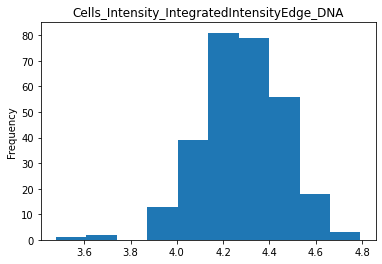

Plotting Cells_Intensity_IntegratedIntensity_DNA:   0%|          | 1/235 [00:00<01:13,  3.19it/s]    

Not normal


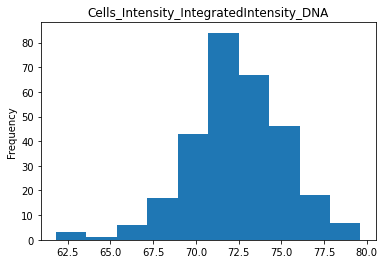

Plotting Cells_Intensity_LowerQuartileIntensity_DNA:   1%|          | 2/235 [00:00<01:15,  3.08it/s]

Not normal


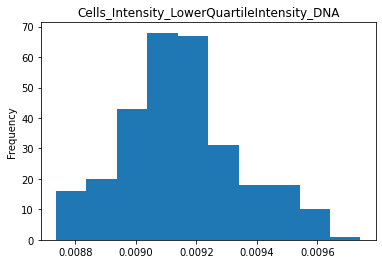

Plotting Cells_Intensity_MADIntensity_DNA:   1%|▏         | 3/235 [00:00<01:06,  3.48it/s]          

Not normal


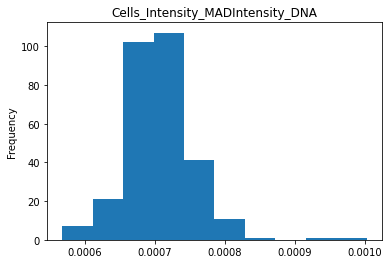

Plotting Cells_Intensity_MassDisplacement_DNA:   2%|▏         | 4/235 [00:01<01:00,  3.84it/s]

Not normal


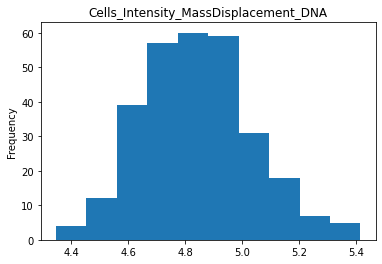

Plotting Cells_Intensity_MaxIntensityEdge_DNA:   2%|▏         | 5/235 [00:01<00:58,  3.96it/s]

Not normal


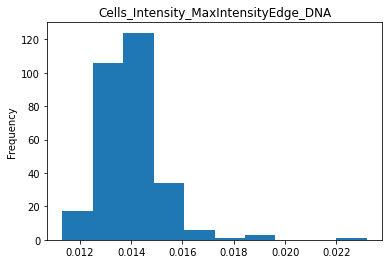

Plotting Cells_Intensity_MaxIntensity_DNA:   3%|▎         | 6/235 [00:01<00:57,  3.99it/s]    

Not normal


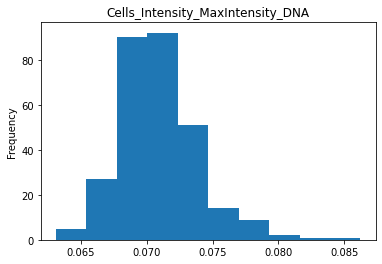

Plotting Cells_Intensity_MeanIntensityEdge_DNA:   3%|▎         | 7/235 [00:01<00:55,  4.12it/s]

Not normal


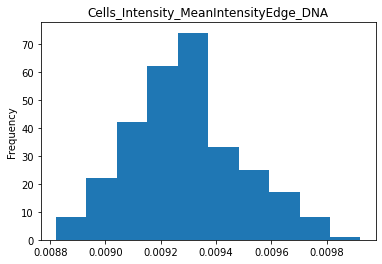

Plotting Cells_Intensity_MeanIntensity_DNA:   3%|▎         | 8/235 [00:02<00:57,  3.95it/s]    

Not normal


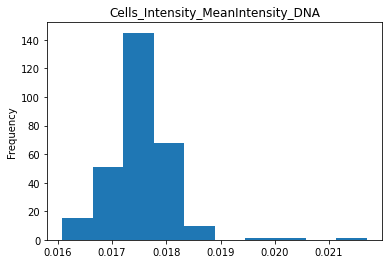

Plotting Cells_Intensity_MedianIntensity_DNA:   4%|▍         | 9/235 [00:02<00:59,  3.82it/s]

Not normal


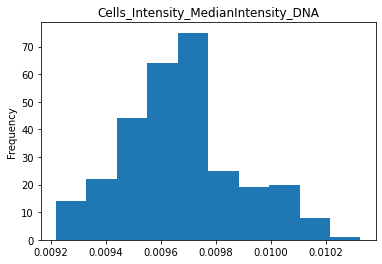

Plotting Cells_Intensity_MinIntensityEdge_DNA:   4%|▍         | 10/235 [00:02<00:59,  3.81it/s]

Not normal


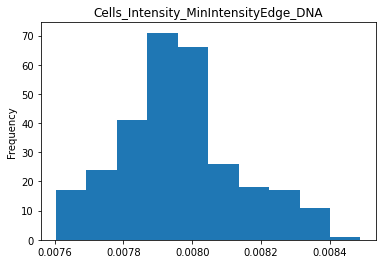

Plotting Cells_Intensity_MinIntensity_DNA:   5%|▍         | 11/235 [00:02<00:57,  3.87it/s]    

Not normal


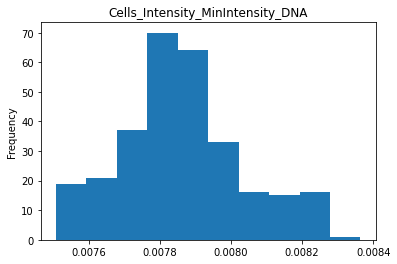

Plotting Cells_Intensity_StdIntensityEdge_DNA:   5%|▌         | 12/235 [00:03<00:58,  3.81it/s]

Not normal


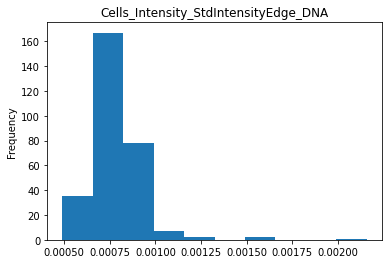

Plotting Cells_Intensity_StdIntensity_DNA:   6%|▌         | 13/235 [00:03<01:06,  3.36it/s]    

Not normal


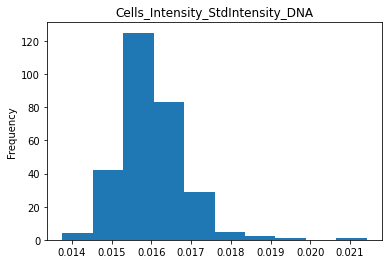

Plotting Cells_Intensity_UpperQuartileIntensity_DNA:   6%|▌         | 14/235 [00:03<01:01,  3.59it/s]

Not normal


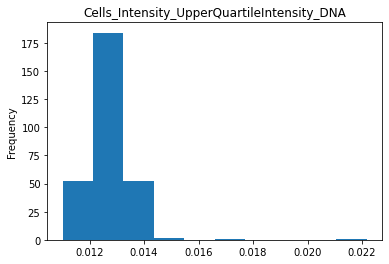

Plotting Cells_Location_CenterMassIntensity_X_DNA:   6%|▋         | 15/235 [00:04<01:00,  3.66it/s]  

Not normal


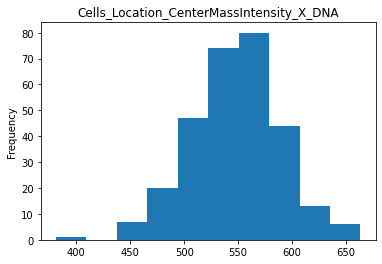

Plotting Cells_Location_CenterMassIntensity_Y_DNA:   7%|▋         | 16/235 [00:04<00:58,  3.72it/s]

Not normal


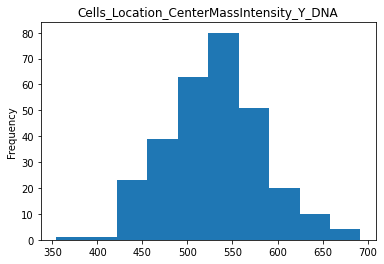

Plotting Cells_Location_MaxIntensity_X_DNA:   7%|▋         | 17/235 [00:04<00:59,  3.69it/s]       

Not normal


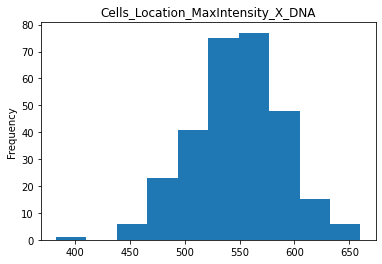

Plotting Cells_Location_MaxIntensity_Y_DNA:   8%|▊         | 18/235 [00:04<00:59,  3.67it/s]

Not normal


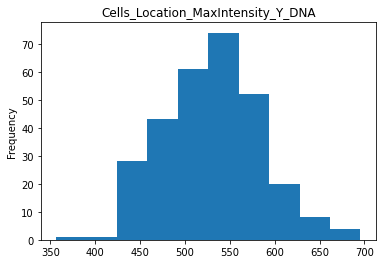

Plotting Cells_RadialDistribution_FracAtD_DNA_1of4:   8%|▊         | 19/235 [00:05<01:00,  3.57it/s]

Not normal


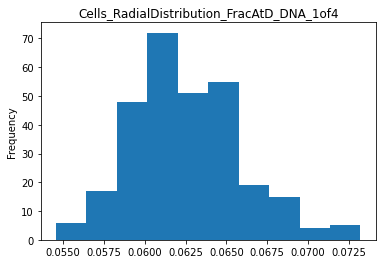

Plotting Cells_RadialDistribution_FracAtD_DNA_2of4:   9%|▊         | 20/235 [00:05<01:02,  3.44it/s]

Not normal


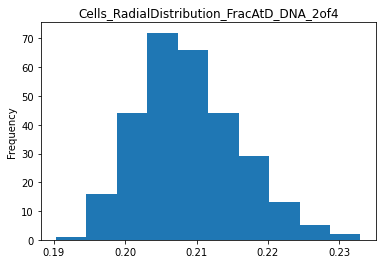

Plotting Cells_RadialDistribution_FracAtD_DNA_3of4:   9%|▉         | 21/235 [00:05<00:59,  3.58it/s]

Not normal


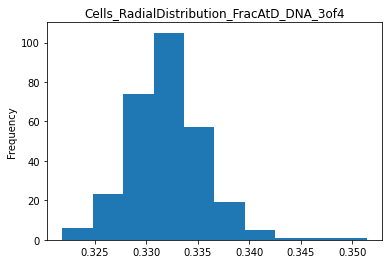

Plotting Cells_RadialDistribution_FracAtD_DNA_4of4:   9%|▉         | 22/235 [00:06<01:09,  3.07it/s]

Not normal


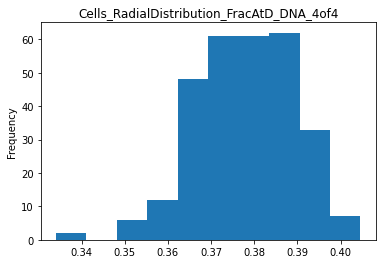

Plotting Cells_RadialDistribution_MeanFrac_DNA_1of4:  10%|▉         | 23/235 [00:06<01:04,  3.31it/s]

Not normal


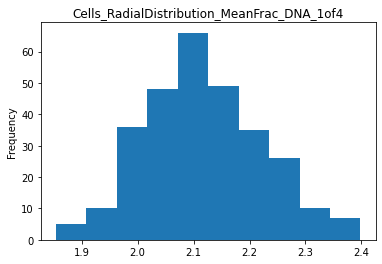

Plotting Cells_RadialDistribution_MeanFrac_DNA_2of4:  10%|█         | 24/235 [00:06<01:00,  3.47it/s]

Not normal


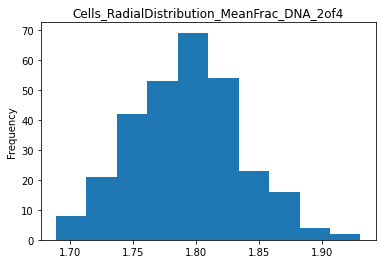

Plotting Cells_RadialDistribution_MeanFrac_DNA_3of4:  11%|█         | 25/235 [00:06<00:59,  3.51it/s]

Not normal


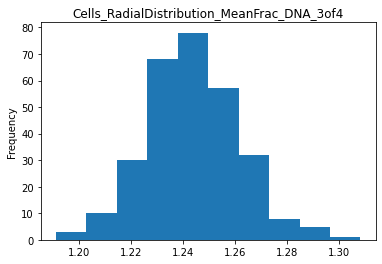

Plotting Cells_RadialDistribution_MeanFrac_DNA_4of4:  11%|█         | 26/235 [00:07<00:58,  3.55it/s]

Not normal


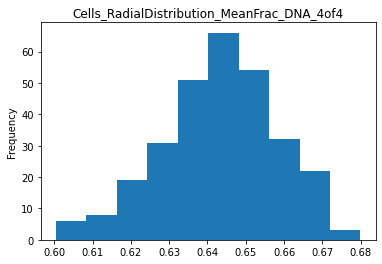

Plotting Cells_RadialDistribution_RadialCV_DNA_1of4:  11%|█▏        | 27/235 [00:07<00:57,  3.62it/s]

Not normal


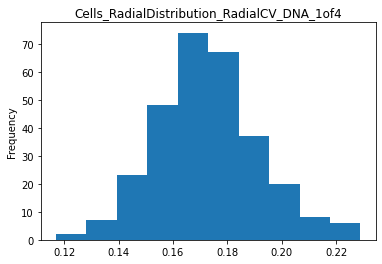

Plotting Cells_RadialDistribution_RadialCV_DNA_2of4:  12%|█▏        | 28/235 [00:07<00:58,  3.53it/s]

Not normal


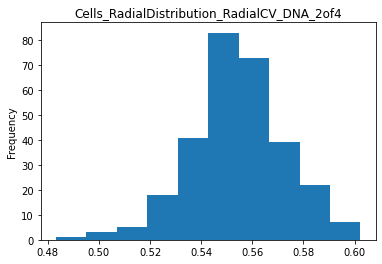

Plotting Cells_RadialDistribution_RadialCV_DNA_3of4:  12%|█▏        | 29/235 [00:08<00:57,  3.61it/s]

Not normal


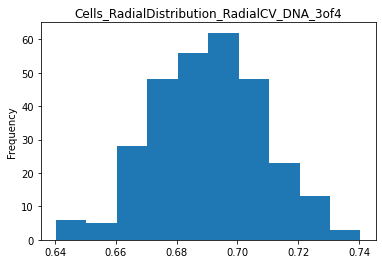

Plotting Cells_RadialDistribution_RadialCV_DNA_4of4:  13%|█▎        | 30/235 [00:08<00:58,  3.52it/s]

Not normal


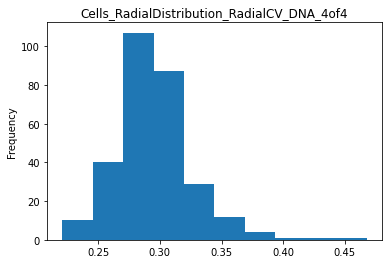

Plotting Cells_Texture_AngularSecondMoment_DNA_10_0:  13%|█▎        | 31/235 [00:08<00:55,  3.66it/s]

Not normal


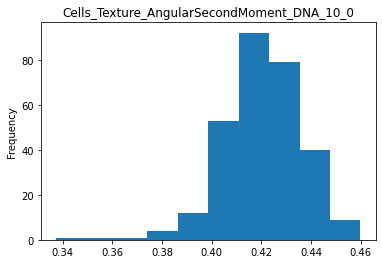

Plotting Cells_Texture_AngularSecondMoment_DNA_3_0:  14%|█▎        | 32/235 [00:08<00:52,  3.84it/s] 

Not normal


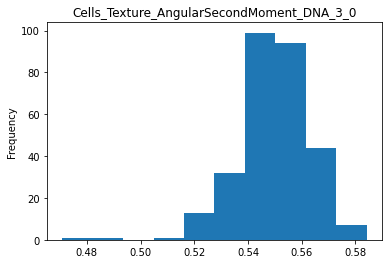

Plotting Cells_Texture_AngularSecondMoment_DNA_5_0:  14%|█▍        | 33/235 [00:09<00:51,  3.94it/s]

Not normal


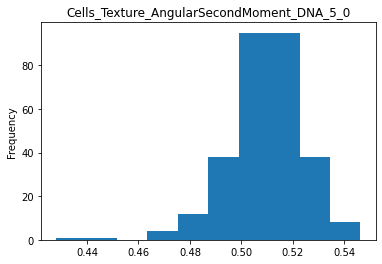

Plotting Cells_Texture_Contrast_DNA_10_0:  14%|█▍        | 34/235 [00:09<00:51,  3.91it/s]          

Not normal


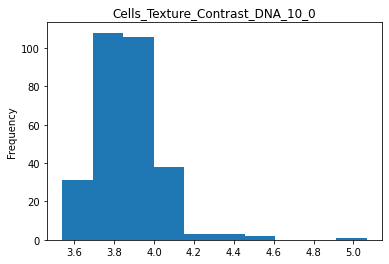

Plotting Cells_Texture_Contrast_DNA_3_0:  15%|█▍        | 35/235 [00:09<00:53,  3.75it/s] 

Not normal


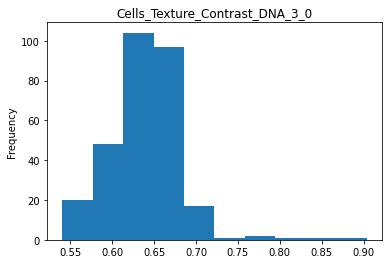

Plotting Cells_Texture_Contrast_DNA_5_0:  15%|█▌        | 36/235 [00:09<00:50,  3.94it/s]

Not normal


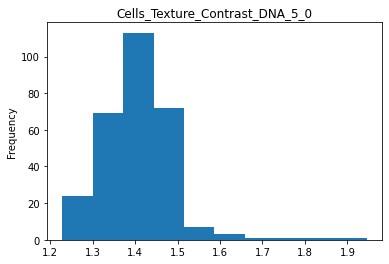

Plotting Cells_Texture_Correlation_DNA_10_0:  16%|█▌        | 37/235 [00:10<00:48,  4.05it/s]

Not normal


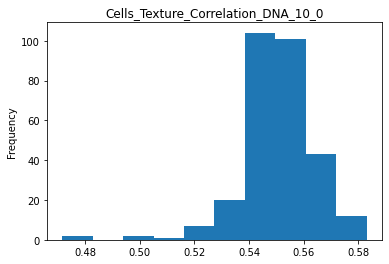

Plotting Cells_Texture_Correlation_DNA_3_0:  16%|█▌        | 38/235 [00:10<00:47,  4.17it/s] 

Not normal


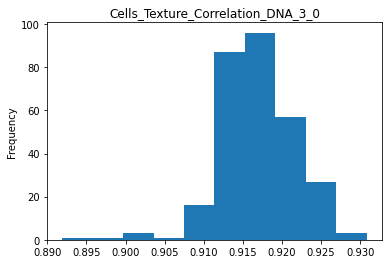

Plotting Cells_Texture_Correlation_DNA_5_0:  17%|█▋        | 39/235 [00:10<00:47,  4.15it/s]

Not normal


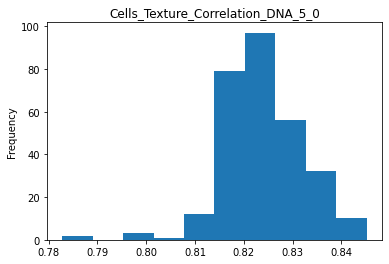

Plotting Cells_Texture_DifferenceEntropy_DNA_10_0:  17%|█▋        | 40/235 [00:10<00:45,  4.25it/s]

Not normal


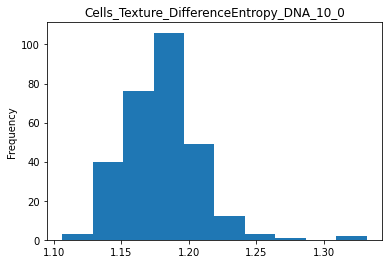

Plotting Cells_Texture_DifferenceEntropy_DNA_3_0:  17%|█▋        | 41/235 [00:10<00:45,  4.26it/s] 

Not normal


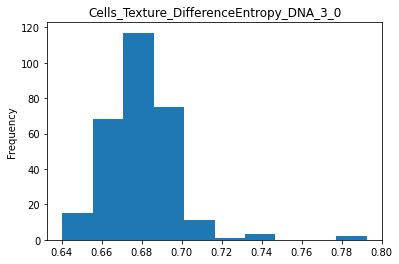

Plotting Cells_Texture_DifferenceEntropy_DNA_5_0:  18%|█▊        | 42/235 [00:11<00:46,  4.17it/s]

Not normal


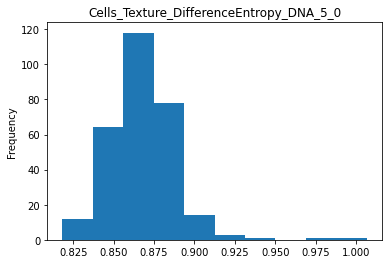

Plotting Cells_Texture_DifferenceVariance_DNA_10_0:  18%|█▊        | 43/235 [00:11<00:44,  4.34it/s]

Not normal


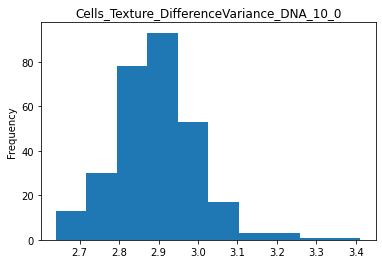

Plotting Cells_Texture_DifferenceVariance_DNA_3_0:  19%|█▊        | 44/235 [00:11<00:43,  4.42it/s] 

Not normal


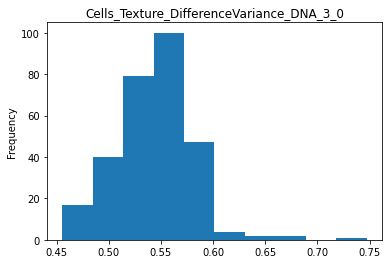

Plotting Cells_Texture_DifferenceVariance_DNA_5_0:  19%|█▉        | 45/235 [00:11<00:41,  4.55it/s]

Not normal


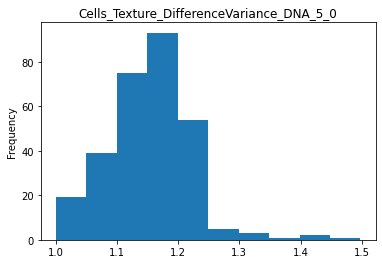

Plotting Cells_Texture_Entropy_DNA_10_0:  20%|█▉        | 46/235 [00:12<00:40,  4.67it/s]          

Not normal


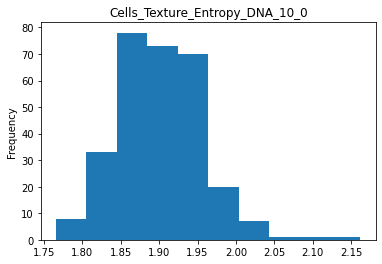

Plotting Cells_Texture_Entropy_DNA_3_0:  20%|██        | 47/235 [00:12<00:41,  4.51it/s] 

Not normal


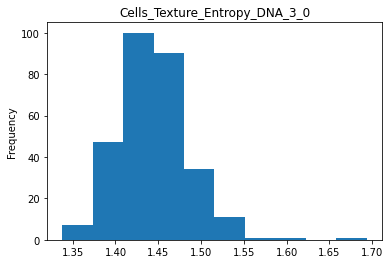

Plotting Cells_Texture_Entropy_DNA_5_0:  20%|██        | 48/235 [00:12<00:40,  4.57it/s]

Not normal


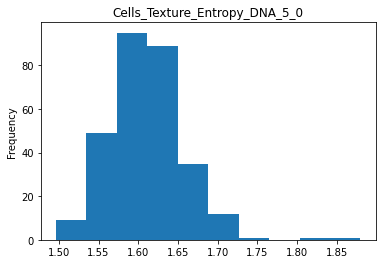

Plotting Cells_Texture_Gabor_DNA_10:  21%|██        | 49/235 [00:12<00:41,  4.52it/s]   

Not normal


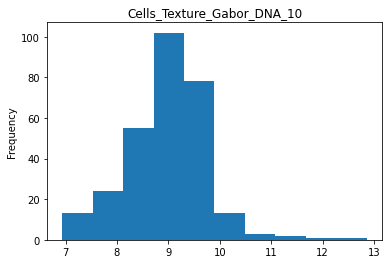

Plotting Cells_Texture_Gabor_DNA_3:  21%|██▏       | 50/235 [00:12<00:40,  4.60it/s] 

Not normal


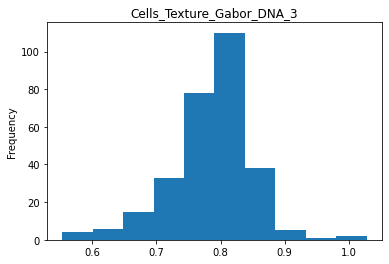

Plotting Cells_Texture_Gabor_DNA_5:  22%|██▏       | 51/235 [00:13<00:39,  4.63it/s]

Not normal


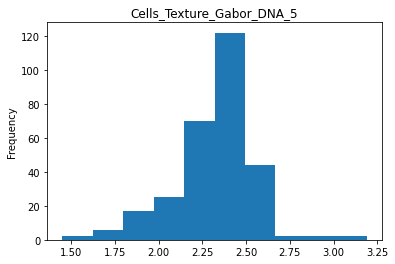

Plotting Cells_Texture_InfoMeas1_DNA_10_0:  22%|██▏       | 52/235 [00:13<00:42,  4.26it/s]

Not normal


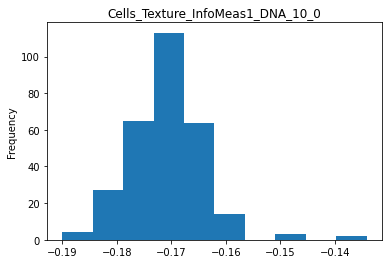

Plotting Cells_Texture_InfoMeas1_DNA_3_0:  23%|██▎       | 53/235 [00:13<00:52,  3.47it/s] 

Not normal


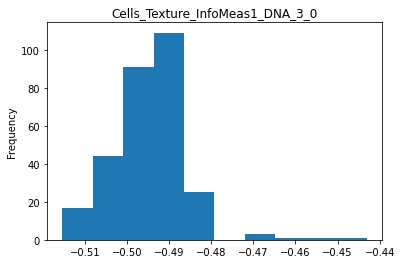

Plotting Cells_Texture_InfoMeas1_DNA_5_0:  23%|██▎       | 54/235 [00:14<00:48,  3.71it/s]

Not normal


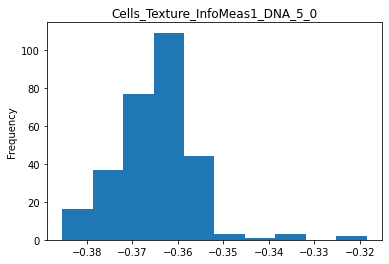

Plotting Cells_Texture_InfoMeas2_DNA_10_0:  23%|██▎       | 55/235 [00:14<00:47,  3.75it/s]

Not normal


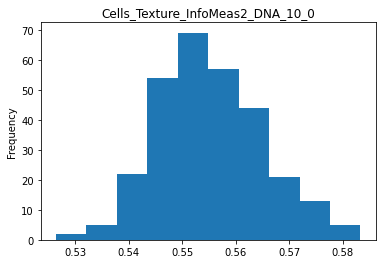

Plotting Cells_Texture_InfoMeas2_DNA_3_0:  24%|██▍       | 56/235 [00:14<00:48,  3.72it/s] 

Not normal


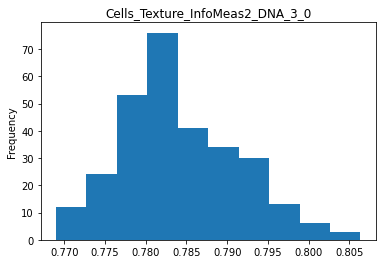

Plotting Cells_Texture_InfoMeas2_DNA_5_0:  24%|██▍       | 57/235 [00:14<00:52,  3.37it/s]

Not normal


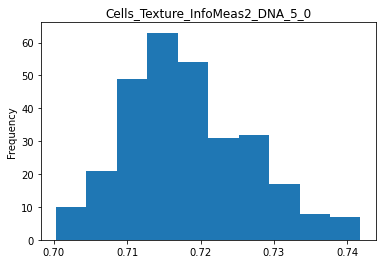

Plotting Cells_Texture_InverseDifferenceMoment_DNA_10_0:  25%|██▍       | 58/235 [00:15<00:50,  3.53it/s]

Not normal


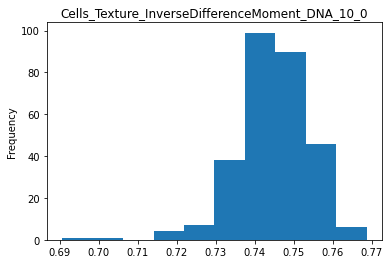

Plotting Cells_Texture_InverseDifferenceMoment_DNA_3_0:  25%|██▌       | 59/235 [00:15<00:48,  3.66it/s] 

Not normal


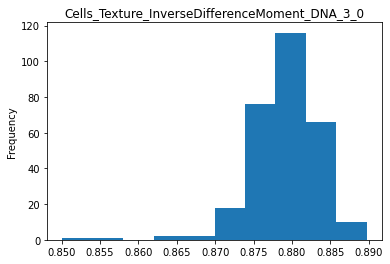

Plotting Cells_Texture_InverseDifferenceMoment_DNA_5_0:  26%|██▌       | 60/235 [00:15<00:45,  3.84it/s]

Not normal


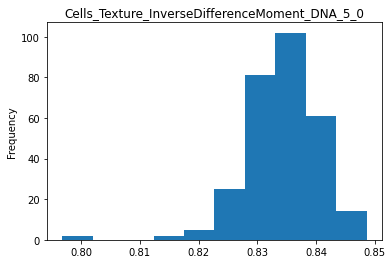

Plotting Cells_Texture_SumAverage_DNA_10_0:  26%|██▌       | 61/235 [00:15<00:43,  4.01it/s]            

Not normal


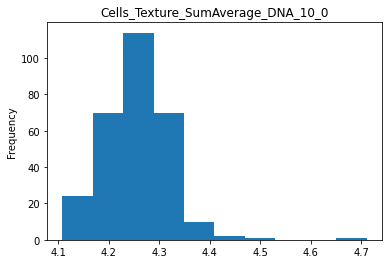

Plotting Cells_Texture_SumAverage_DNA_3_0:  26%|██▋       | 62/235 [00:16<00:41,  4.16it/s] 

Not normal


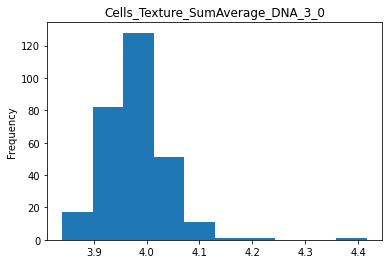

Plotting Cells_Texture_SumAverage_DNA_5_0:  27%|██▋       | 63/235 [00:16<00:39,  4.32it/s]

Not normal


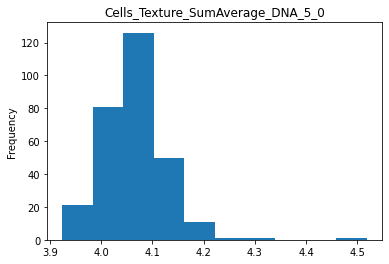

Plotting Cells_Texture_SumEntropy_DNA_10_0:  27%|██▋       | 64/235 [00:16<00:39,  4.36it/s]

Not normal


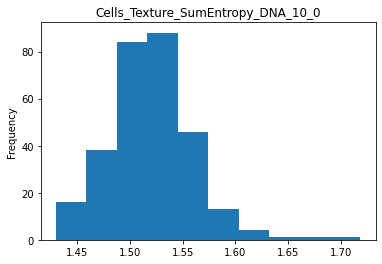

Plotting Cells_Texture_SumEntropy_DNA_3_0:  28%|██▊       | 65/235 [00:16<00:38,  4.46it/s] 

Not normal


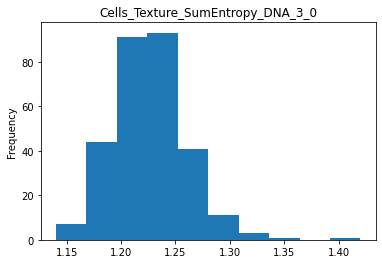

Plotting Cells_Texture_SumEntropy_DNA_5_0:  28%|██▊       | 66/235 [00:16<00:36,  4.63it/s]

Not normal


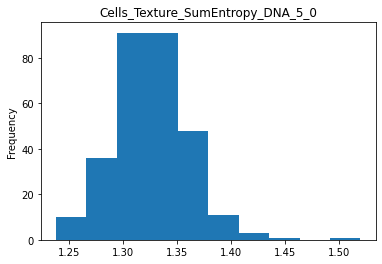

Plotting Cells_Texture_SumVariance_DNA_10_0:  29%|██▊       | 67/235 [00:17<00:35,  4.78it/s]

Not normal


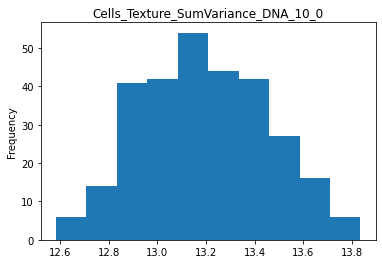

Plotting Cells_Texture_SumVariance_DNA_3_0:  29%|██▉       | 68/235 [00:17<00:35,  4.70it/s] 

Not normal


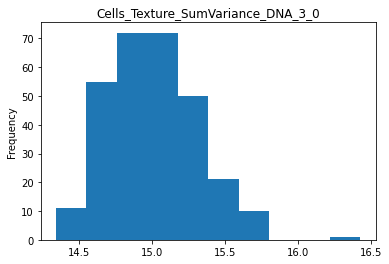

Plotting Cells_Texture_SumVariance_DNA_5_0:  29%|██▉       | 69/235 [00:17<00:35,  4.68it/s]

Not normal


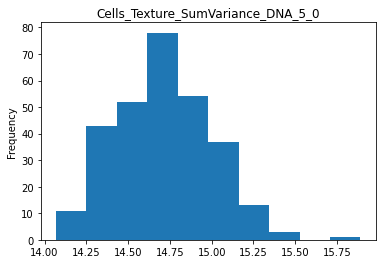

Plotting Cells_Texture_Variance_DNA_10_0:  30%|██▉       | 70/235 [00:17<00:36,  4.55it/s]  

Not normal


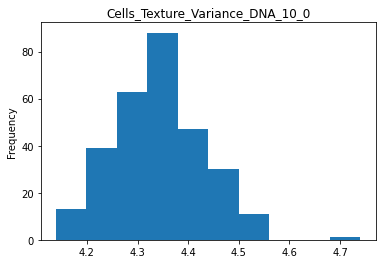

Plotting Cells_Texture_Variance_DNA_3_0:  30%|███       | 71/235 [00:18<00:34,  4.75it/s] 

Not normal


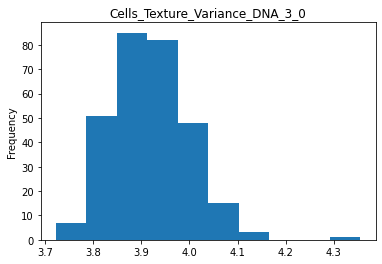

Plotting Cells_Texture_Variance_DNA_5_0:  31%|███       | 72/235 [00:18<00:35,  4.61it/s]

Not normal


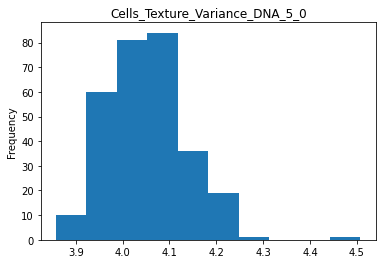

Plotting Cytoplasm_Intensity_IntegratedIntensityEdge_DNA:  31%|███       | 73/235 [00:18<00:35,  4.57it/s]

Not normal


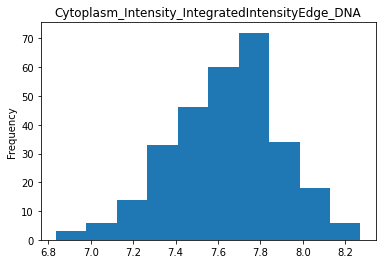

Plotting Cytoplasm_Intensity_IntegratedIntensity_DNA:  31%|███▏      | 74/235 [00:18<00:36,  4.46it/s]    

Not normal


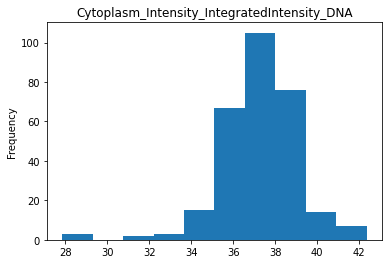

Plotting Cytoplasm_Intensity_LowerQuartileIntensity_DNA:  32%|███▏      | 75/235 [00:18<00:35,  4.53it/s]

Not normal


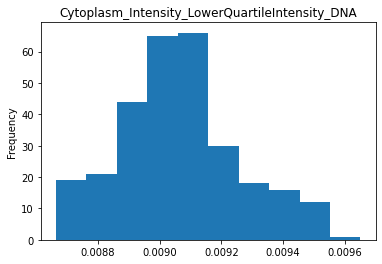

Plotting Cytoplasm_Intensity_MADIntensity_DNA:  32%|███▏      | 76/235 [00:19<00:34,  4.63it/s]          

Not normal


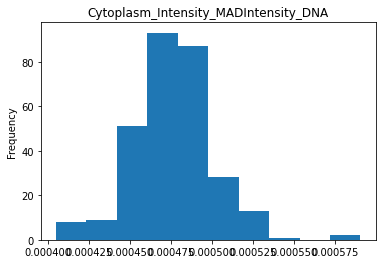

Plotting Cytoplasm_Intensity_MassDisplacement_DNA:  33%|███▎      | 77/235 [00:19<00:33,  4.68it/s]

Not normal


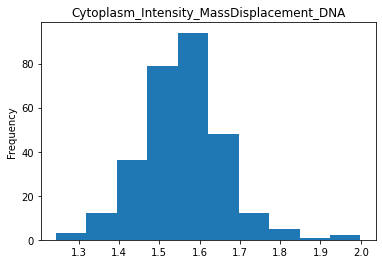

Plotting Cytoplasm_Intensity_MaxIntensityEdge_DNA:  33%|███▎      | 78/235 [00:19<00:33,  4.74it/s]

Not normal


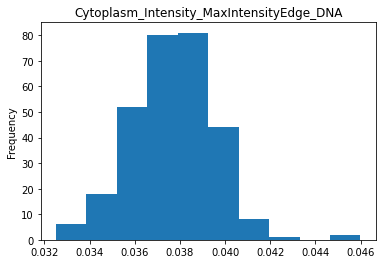

Plotting Cytoplasm_Intensity_MaxIntensity_DNA:  34%|███▎      | 79/235 [00:19<00:35,  4.37it/s]    

Not normal


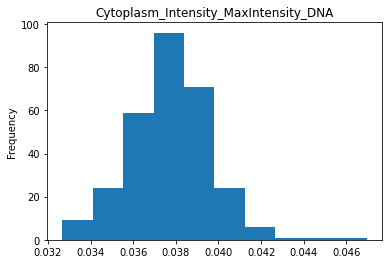

Plotting Cytoplasm_Intensity_MeanIntensityEdge_DNA:  34%|███▍      | 80/235 [00:20<00:37,  4.17it/s]

Not normal


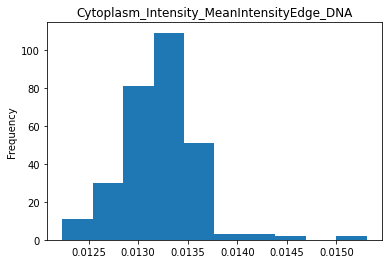

Plotting Cytoplasm_Intensity_MeanIntensity_DNA:  34%|███▍      | 81/235 [00:20<00:34,  4.43it/s]    

Not normal


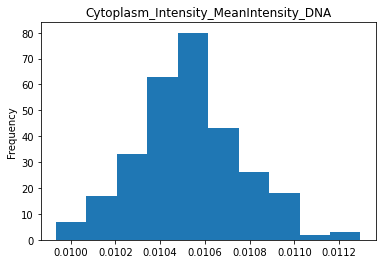

Plotting Cytoplasm_Intensity_MedianIntensity_DNA:  35%|███▍      | 82/235 [00:20<00:37,  4.10it/s]

Not normal


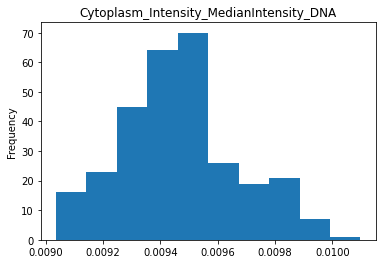

Plotting Cytoplasm_Intensity_MinIntensityEdge_DNA:  35%|███▌      | 83/235 [00:20<00:37,  4.03it/s]

Not normal


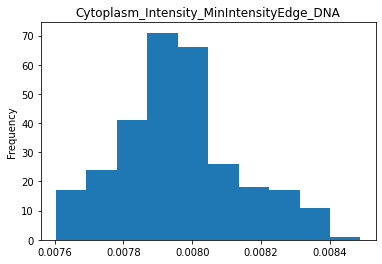

Plotting Cytoplasm_Intensity_MinIntensity_DNA:  36%|███▌      | 84/235 [00:21<00:45,  3.34it/s]    

Not normal


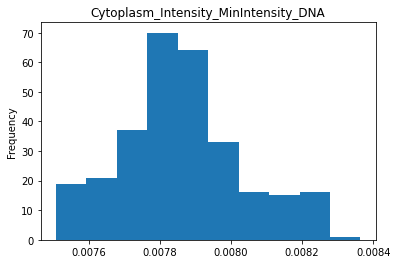

Plotting Cytoplasm_Intensity_StdIntensityEdge_DNA:  36%|███▌      | 85/235 [00:21<00:42,  3.52it/s]

Not normal


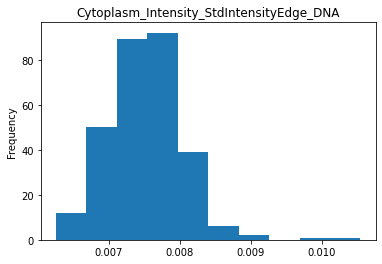

Plotting Cytoplasm_Intensity_StdIntensity_DNA:  37%|███▋      | 86/235 [00:21<00:38,  3.92it/s]    

Not normal


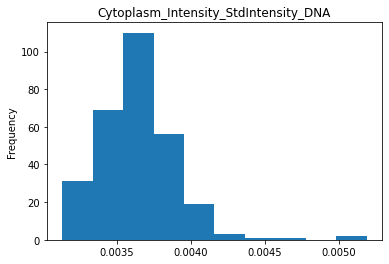

Plotting Cytoplasm_Intensity_UpperQuartileIntensity_DNA:  37%|███▋      | 87/235 [00:21<00:36,  4.01it/s]

Not normal


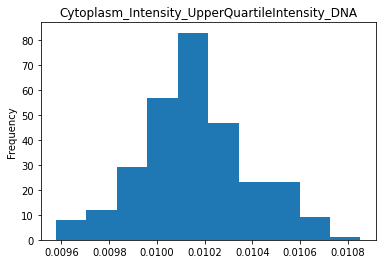

Plotting Cytoplasm_Location_CenterMassIntensity_X_DNA:  37%|███▋      | 88/235 [00:22<00:37,  3.90it/s]  

Not normal


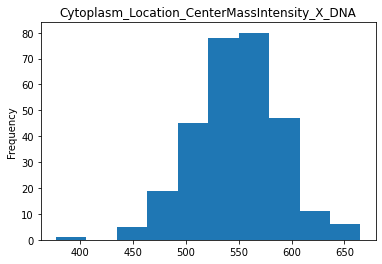

Plotting Cytoplasm_Location_CenterMassIntensity_Y_DNA:  38%|███▊      | 89/235 [00:22<00:38,  3.84it/s]

Not normal


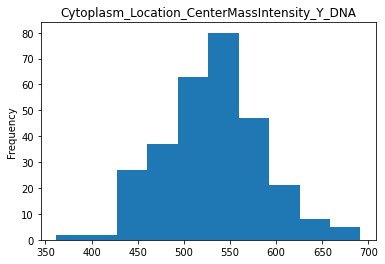

Plotting Cytoplasm_Location_MaxIntensity_X_DNA:  38%|███▊      | 90/235 [00:22<00:38,  3.75it/s]       

Not normal


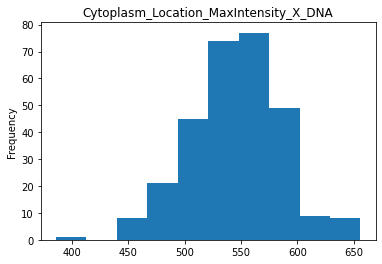

Plotting Cytoplasm_Location_MaxIntensity_Y_DNA:  39%|███▊      | 91/235 [00:22<00:37,  3.84it/s]

Not normal


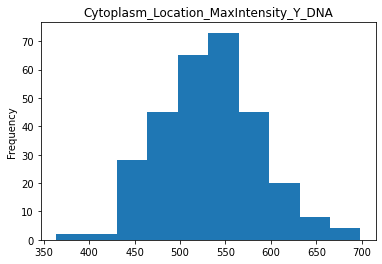

Plotting Cytoplasm_RadialDistribution_FracAtD_DNA_1of4:  39%|███▉      | 92/235 [00:23<00:36,  3.91it/s]

Not normal


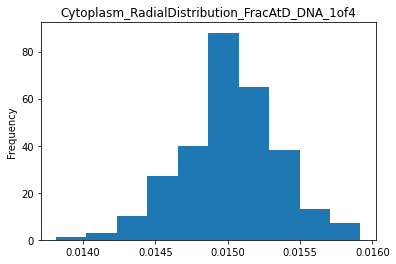

Plotting Cytoplasm_RadialDistribution_FracAtD_DNA_2of4:  40%|███▉      | 93/235 [00:23<00:34,  4.17it/s]

Not normal


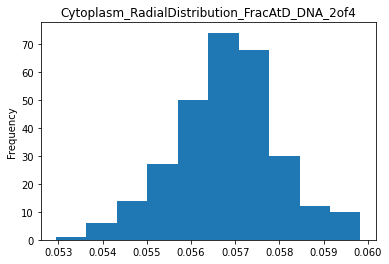

Plotting Cytoplasm_RadialDistribution_FracAtD_DNA_3of4:  40%|████      | 94/235 [00:23<00:34,  4.13it/s]

Not normal


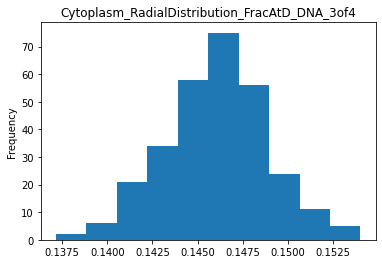

Plotting Cytoplasm_RadialDistribution_FracAtD_DNA_4of4:  40%|████      | 95/235 [00:23<00:33,  4.17it/s]

Not normal


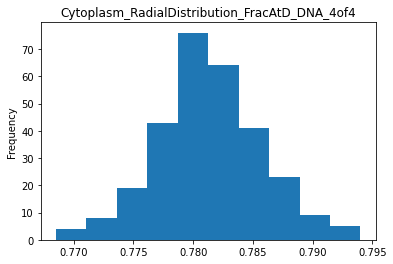

Plotting Cytoplasm_RadialDistribution_MeanFrac_DNA_1of4:  41%|████      | 96/235 [00:24<00:31,  4.35it/s]

Not normal


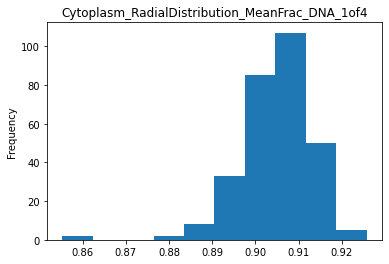

Plotting Cytoplasm_RadialDistribution_MeanFrac_DNA_2of4:  41%|████▏     | 97/235 [00:24<00:31,  4.39it/s]

Not normal


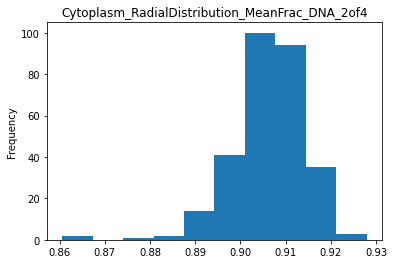

Plotting Cytoplasm_RadialDistribution_MeanFrac_DNA_3of4:  42%|████▏     | 98/235 [00:24<00:33,  4.10it/s]

Not normal


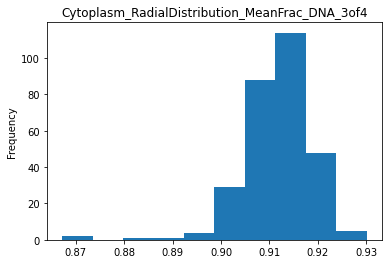

Plotting Cytoplasm_RadialDistribution_MeanFrac_DNA_4of4:  42%|████▏     | 99/235 [00:24<00:32,  4.21it/s]

Not normal


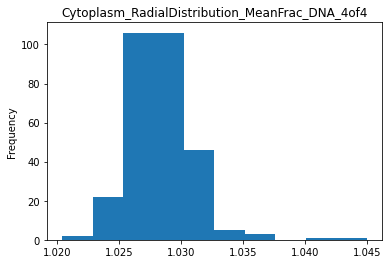

Plotting Cytoplasm_RadialDistribution_RadialCV_DNA_1of4:  43%|████▎     | 100/235 [00:25<00:33,  4.08it/s]

Not normal


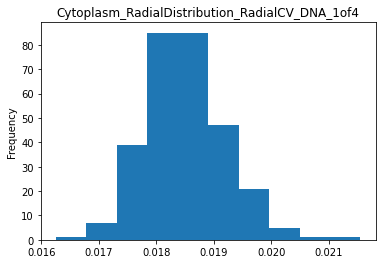

Plotting Cytoplasm_RadialDistribution_RadialCV_DNA_2of4:  43%|████▎     | 101/235 [00:25<00:33,  4.00it/s]

Not normal


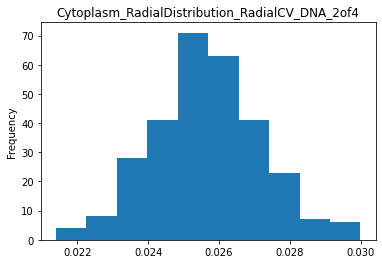

Plotting Cytoplasm_RadialDistribution_RadialCV_DNA_3of4:  43%|████▎     | 102/235 [00:25<00:32,  4.06it/s]

Not normal


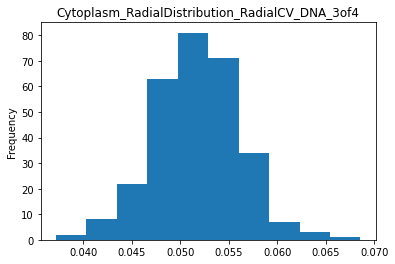

Plotting Cytoplasm_RadialDistribution_RadialCV_DNA_4of4:  44%|████▍     | 103/235 [00:25<00:33,  3.94it/s]

Not normal


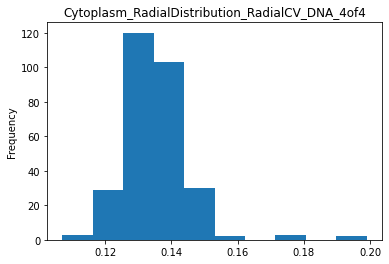

Plotting Cytoplasm_Texture_AngularSecondMoment_DNA_10_0:  44%|████▍     | 104/235 [00:26<00:32,  4.00it/s]

Not normal


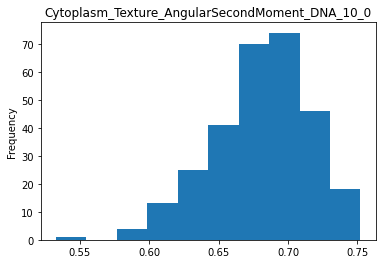

Plotting Cytoplasm_Texture_AngularSecondMoment_DNA_3_0:  45%|████▍     | 105/235 [00:26<00:32,  4.01it/s] 

Not normal


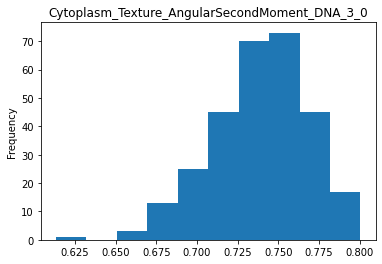

Plotting Cytoplasm_Texture_AngularSecondMoment_DNA_5_0:  45%|████▌     | 106/235 [00:26<00:33,  3.89it/s]

Not normal


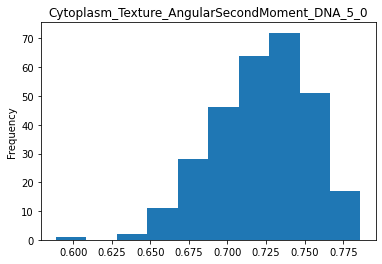

Plotting Cytoplasm_Texture_Contrast_DNA_10_0:  46%|████▌     | 107/235 [00:26<00:32,  3.94it/s]          

Not normal


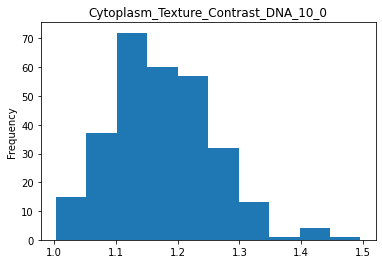

Plotting Cytoplasm_Texture_Contrast_DNA_3_0:  46%|████▌     | 108/235 [00:27<00:32,  3.97it/s] 

Not normal


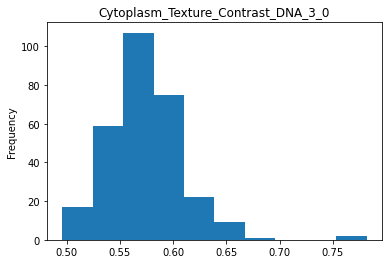

Plotting Cytoplasm_Texture_Contrast_DNA_5_0:  46%|████▋     | 109/235 [00:27<00:31,  3.97it/s]

Not normal


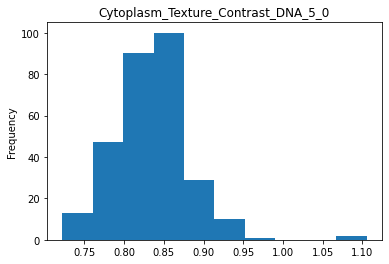

Plotting Cytoplasm_Texture_Correlation_DNA_10_0:  47%|████▋     | 110/235 [00:27<00:30,  4.11it/s]

Not normal


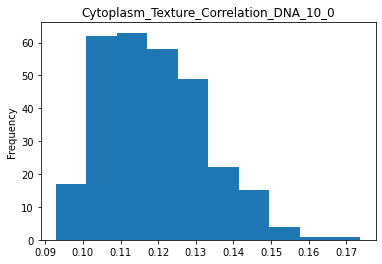

Plotting Cytoplasm_Texture_Correlation_DNA_3_0:  47%|████▋     | 111/235 [00:27<00:32,  3.86it/s] 

Not normal


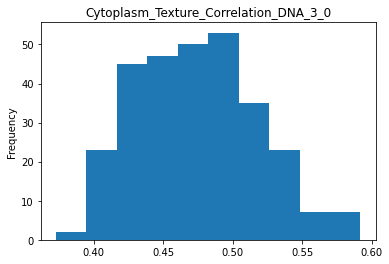

Plotting Cytoplasm_Texture_Correlation_DNA_5_0:  48%|████▊     | 112/235 [00:28<00:30,  4.08it/s]

Not normal


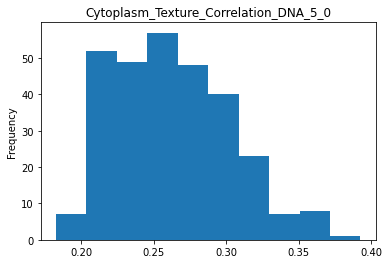

Plotting Cytoplasm_Texture_DifferenceEntropy_DNA_10_0:  48%|████▊     | 113/235 [00:28<00:28,  4.25it/s]

Not normal


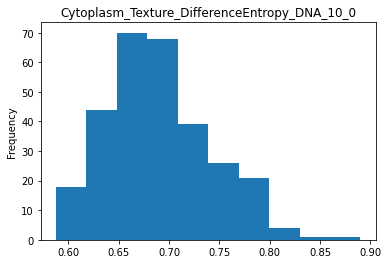

Plotting Cytoplasm_Texture_DifferenceEntropy_DNA_3_0:  49%|████▊     | 114/235 [00:28<00:34,  3.50it/s] 

Not normal


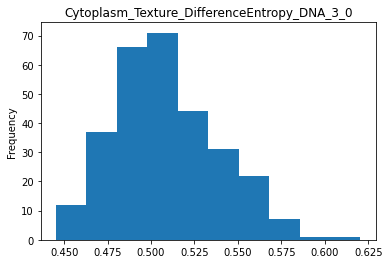

Plotting Cytoplasm_Texture_DifferenceEntropy_DNA_5_0:  49%|████▉     | 115/235 [00:29<00:33,  3.62it/s]

Not normal


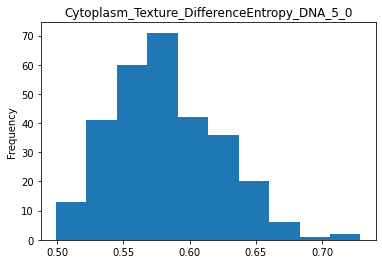

Plotting Cytoplasm_Texture_DifferenceVariance_DNA_10_0:  49%|████▉     | 116/235 [00:29<00:31,  3.75it/s]

Not normal


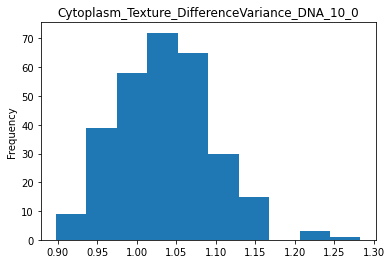

Plotting Cytoplasm_Texture_DifferenceVariance_DNA_3_0:  50%|████▉     | 117/235 [00:29<00:33,  3.51it/s] 

Not normal


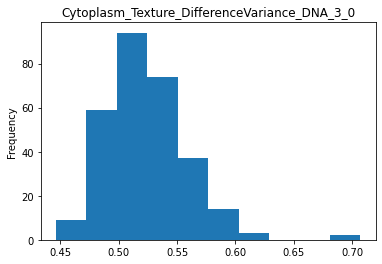

Plotting Cytoplasm_Texture_DifferenceVariance_DNA_5_0:  50%|█████     | 118/235 [00:29<00:32,  3.64it/s]

Not normal


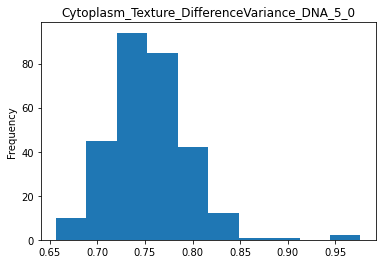

Plotting Cytoplasm_Texture_Entropy_DNA_10_0:  51%|█████     | 119/235 [00:30<00:30,  3.82it/s]          

Not normal


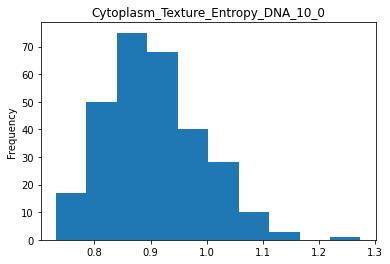

Plotting Cytoplasm_Texture_Entropy_DNA_3_0:  51%|█████     | 120/235 [00:30<00:30,  3.82it/s] 

Not normal


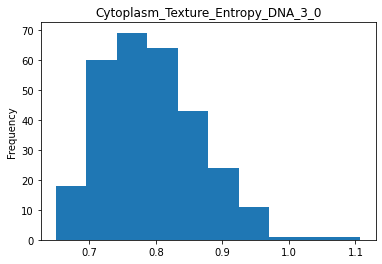

Plotting Cytoplasm_Texture_Entropy_DNA_5_0:  51%|█████▏    | 121/235 [00:30<00:28,  3.96it/s]

Not normal


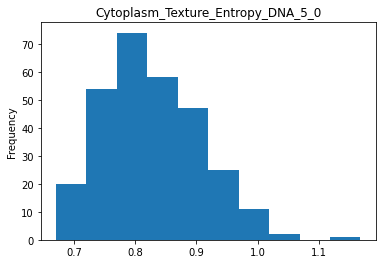

Plotting Cytoplasm_Texture_Gabor_DNA_10:  52%|█████▏    | 122/235 [00:30<00:28,  3.94it/s]   

Not normal


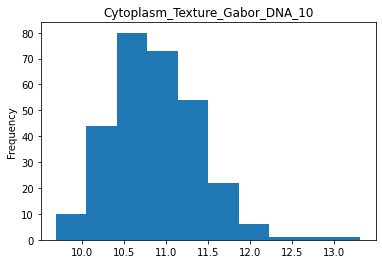

Plotting Cytoplasm_Texture_Gabor_DNA_3:  52%|█████▏    | 123/235 [00:31<00:28,  3.88it/s] 

Not normal


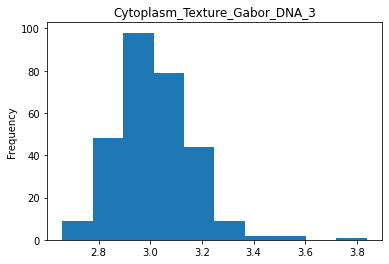

Plotting Cytoplasm_Texture_Gabor_DNA_5:  53%|█████▎    | 124/235 [00:31<00:27,  4.10it/s]

Not normal


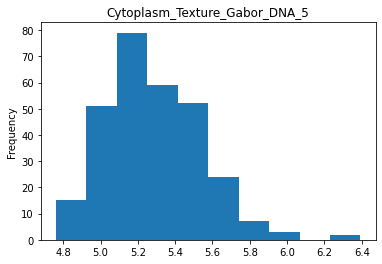

Plotting Cytoplasm_Texture_InfoMeas1_DNA_10_0:  53%|█████▎    | 125/235 [00:31<00:26,  4.10it/s]

Not normal


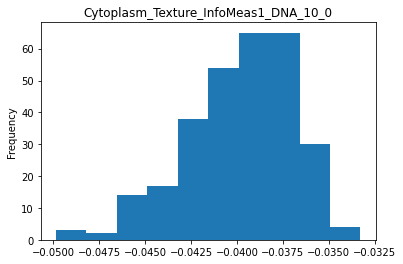

Plotting Cytoplasm_Texture_InfoMeas1_DNA_3_0:  54%|█████▎    | 126/235 [00:31<00:26,  4.17it/s] 

Not normal


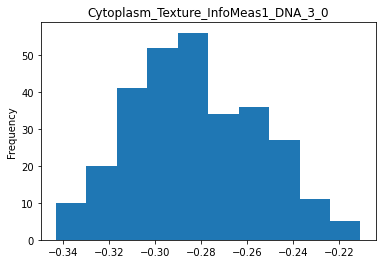

Plotting Cytoplasm_Texture_InfoMeas1_DNA_5_0:  54%|█████▍    | 127/235 [00:32<00:25,  4.17it/s]

Not normal


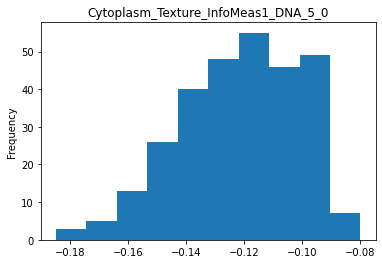

Plotting Cytoplasm_Texture_InfoMeas2_DNA_10_0:  54%|█████▍    | 128/235 [00:32<00:25,  4.16it/s]

Not normal


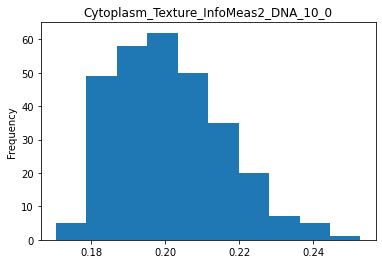

Plotting Cytoplasm_Texture_InfoMeas2_DNA_3_0:  55%|█████▍    | 129/235 [00:32<00:24,  4.30it/s] 

Not normal


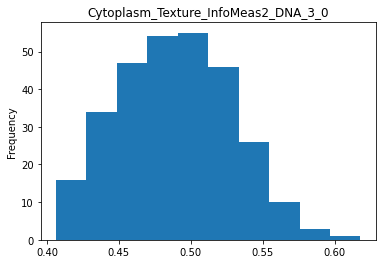

Plotting Cytoplasm_Texture_InfoMeas2_DNA_5_0:  55%|█████▌    | 130/235 [00:32<00:24,  4.22it/s]

Not normal


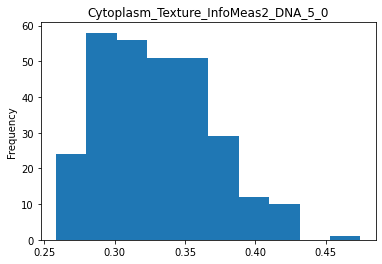

Plotting Cytoplasm_Texture_InverseDifferenceMoment_DNA_10_0:  56%|█████▌    | 131/235 [00:32<00:23,  4.39it/s]

Not normal


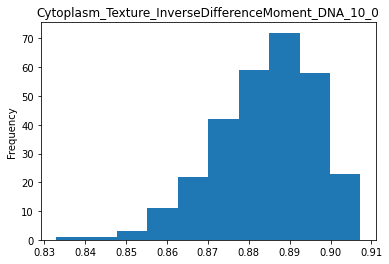

Plotting Cytoplasm_Texture_InverseDifferenceMoment_DNA_3_0:  56%|█████▌    | 132/235 [00:33<00:25,  4.11it/s] 

Not normal


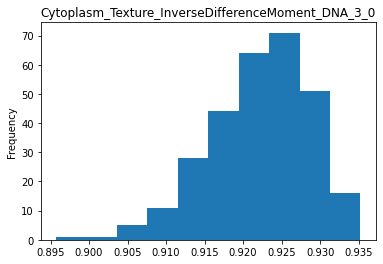

Plotting Cytoplasm_Texture_InverseDifferenceMoment_DNA_5_0:  57%|█████▋    | 133/235 [00:33<00:24,  4.15it/s]

Not normal


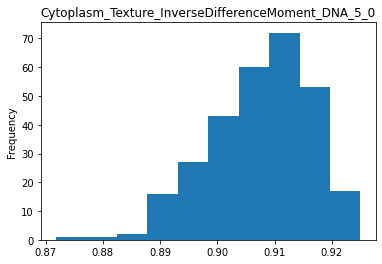

Plotting Cytoplasm_Texture_SumAverage_DNA_10_0:  57%|█████▋    | 134/235 [00:33<00:25,  4.00it/s]            

Not normal


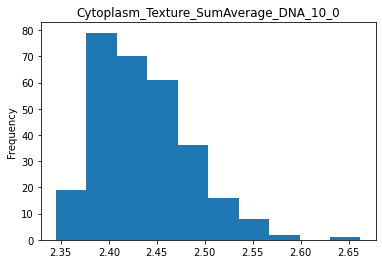

Plotting Cytoplasm_Texture_SumAverage_DNA_3_0:  57%|█████▋    | 135/235 [00:33<00:25,  3.97it/s] 

Not normal


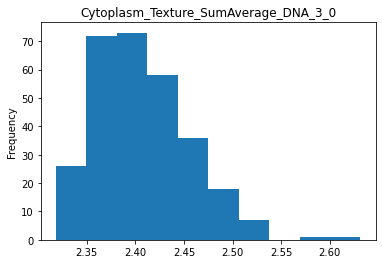

Plotting Cytoplasm_Texture_SumAverage_DNA_5_0:  58%|█████▊    | 136/235 [00:34<00:23,  4.25it/s]

Not normal


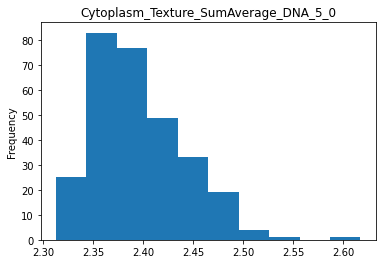

Plotting Cytoplasm_Texture_SumEntropy_DNA_10_0:  58%|█████▊    | 137/235 [00:34<00:24,  3.95it/s]

Not normal


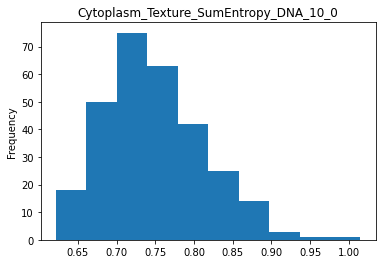

Plotting Cytoplasm_Texture_SumEntropy_DNA_3_0:  59%|█████▊    | 138/235 [00:34<00:23,  4.10it/s] 

Not normal


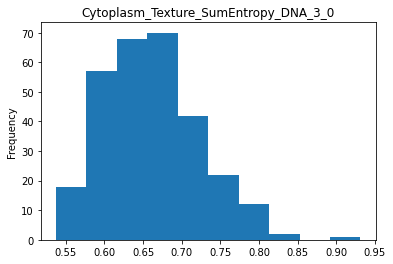

Plotting Cytoplasm_Texture_SumEntropy_DNA_5_0:  59%|█████▉    | 139/235 [00:34<00:23,  4.14it/s]

Not normal


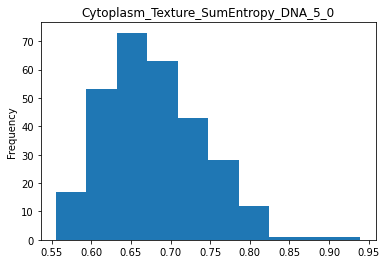

Plotting Cytoplasm_Texture_SumVariance_DNA_10_0:  60%|█████▉    | 140/235 [00:35<00:23,  4.11it/s]

Not normal


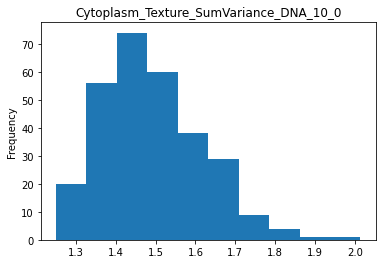

Plotting Cytoplasm_Texture_SumVariance_DNA_3_0:  60%|██████    | 141/235 [00:35<00:21,  4.32it/s] 

Not normal


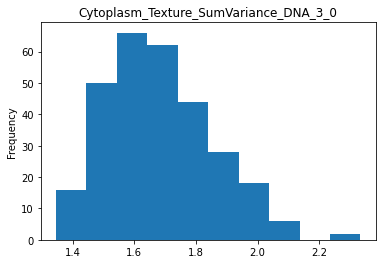

Plotting Cytoplasm_Texture_SumVariance_DNA_5_0:  60%|██████    | 142/235 [00:35<00:20,  4.61it/s]

Not normal


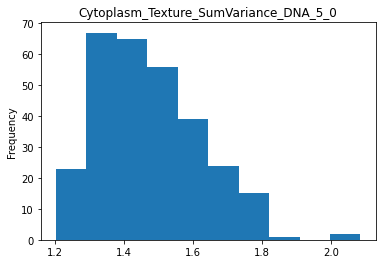

Plotting Cytoplasm_Texture_Variance_DNA_10_0:  61%|██████    | 143/235 [00:35<00:19,  4.71it/s]  

Not normal


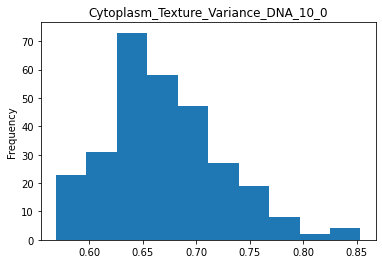

Plotting Cytoplasm_Texture_Variance_DNA_3_0:  61%|██████▏   | 144/235 [00:35<00:18,  4.79it/s] 

Not normal


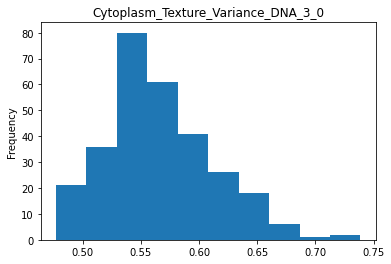

Plotting Cytoplasm_Texture_Variance_DNA_5_0:  62%|██████▏   | 145/235 [00:36<00:22,  3.99it/s]

Not normal


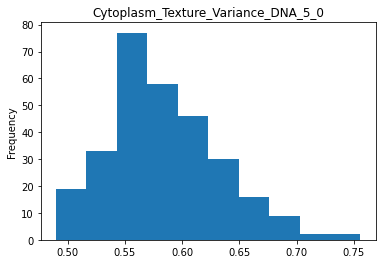

Plotting Nuclei_Granularity_10_DNA:  62%|██████▏   | 146/235 [00:36<00:21,  4.21it/s]         

Not normal


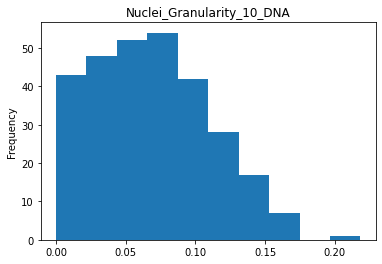

Plotting Nuclei_Granularity_11_DNA:  63%|██████▎   | 147/235 [00:36<00:19,  4.54it/s]

Not normal


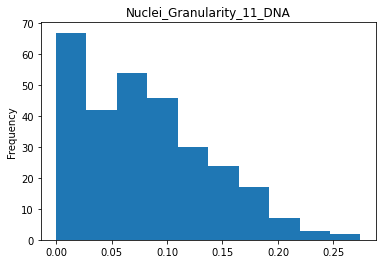

Plotting Nuclei_Granularity_12_DNA:  63%|██████▎   | 148/235 [00:36<00:18,  4.69it/s]

Not normal


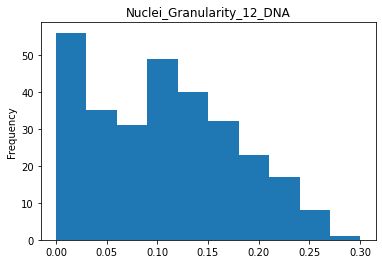

Plotting Nuclei_Granularity_13_DNA:  63%|██████▎   | 149/235 [00:37<00:17,  4.88it/s]

Not normal


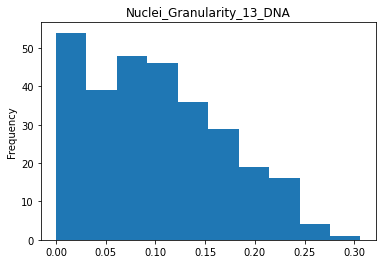

Plotting Nuclei_Granularity_14_DNA:  64%|██████▍   | 150/235 [00:37<00:17,  4.96it/s]

Not normal


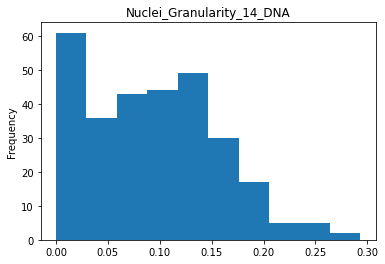

Plotting Nuclei_Granularity_15_DNA:  64%|██████▍   | 151/235 [00:37<00:16,  4.99it/s]

Not normal


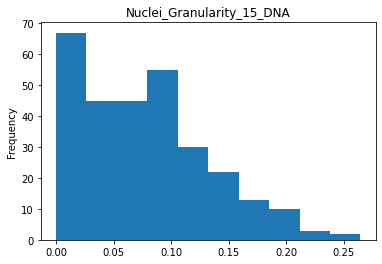

Plotting Nuclei_Granularity_16_DNA:  65%|██████▍   | 152/235 [00:37<00:16,  5.00it/s]

Not normal


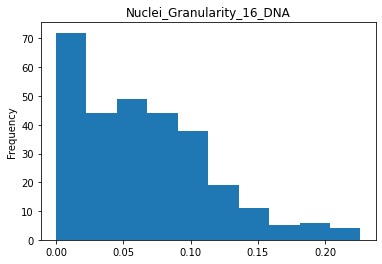

Plotting Nuclei_Granularity_1_DNA:  65%|██████▌   | 153/235 [00:37<00:16,  5.04it/s] 

Not normal


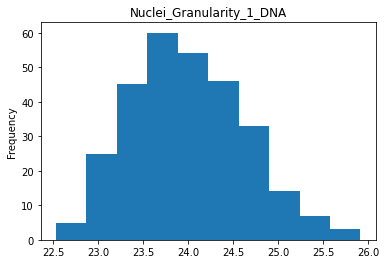

Plotting Nuclei_Granularity_2_DNA:  66%|██████▌   | 154/235 [00:38<00:15,  5.12it/s]

Not normal


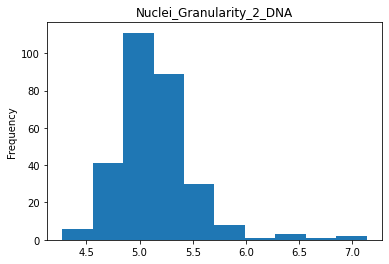

Plotting Nuclei_Granularity_3_DNA:  66%|██████▌   | 155/235 [00:38<00:15,  5.24it/s]

Not normal


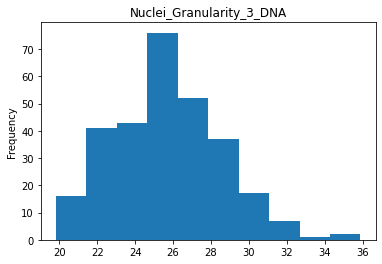

Plotting Nuclei_Granularity_4_DNA:  66%|██████▋   | 156/235 [00:38<00:15,  5.15it/s]

Not normal


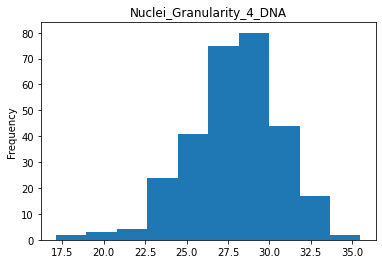

Plotting Nuclei_Granularity_5_DNA:  67%|██████▋   | 157/235 [00:38<00:15,  4.96it/s]

Not normal


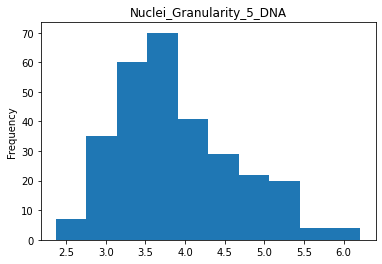

Plotting Nuclei_Granularity_6_DNA:  67%|██████▋   | 158/235 [00:38<00:15,  4.92it/s]

Not normal


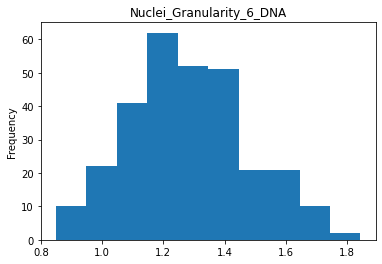

Plotting Nuclei_Granularity_7_DNA:  68%|██████▊   | 159/235 [00:39<00:15,  5.04it/s]

Not normal


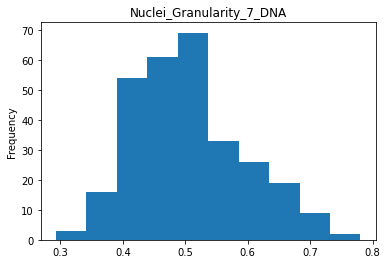

Plotting Nuclei_Granularity_8_DNA:  68%|██████▊   | 160/235 [00:39<00:14,  5.04it/s]

Not normal


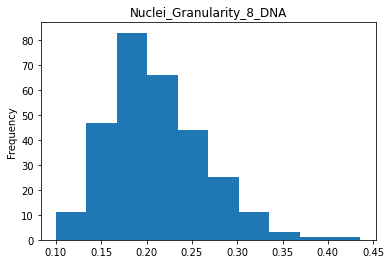

Plotting Nuclei_Granularity_9_DNA:  69%|██████▊   | 161/235 [00:39<00:14,  4.96it/s]

Not normal


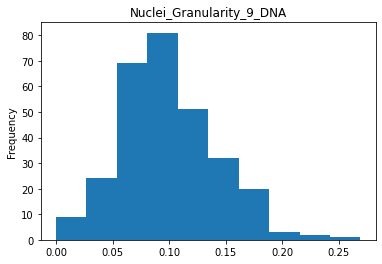

Plotting Nuclei_Intensity_IntegratedIntensityEdge_DNA:  69%|██████▉   | 162/235 [00:39<00:14,  4.94it/s]

Not normal


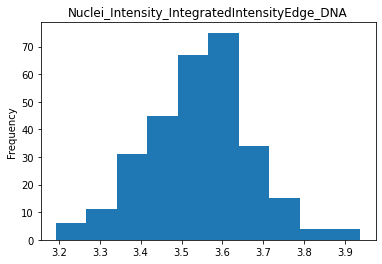

Plotting Nuclei_Intensity_IntegratedIntensity_DNA:  69%|██████▉   | 163/235 [00:39<00:14,  4.90it/s]    

Not normal


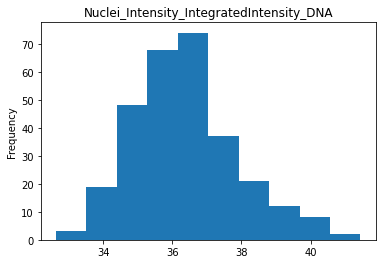

Plotting Nuclei_Intensity_LowerQuartileIntensity_DNA:  70%|██████▉   | 164/235 [00:40<00:14,  5.07it/s]

Not normal


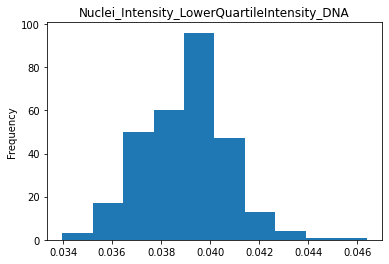

Plotting Nuclei_Intensity_MADIntensity_DNA:  70%|███████   | 165/235 [00:40<00:13,  5.09it/s]          

Not normal


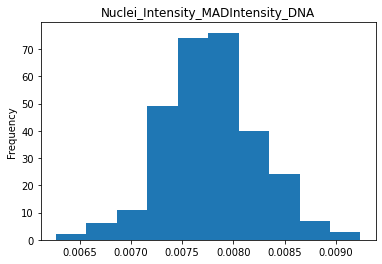

Plotting Nuclei_Intensity_MassDisplacement_DNA:  71%|███████   | 166/235 [00:40<00:13,  5.01it/s]

Not normal


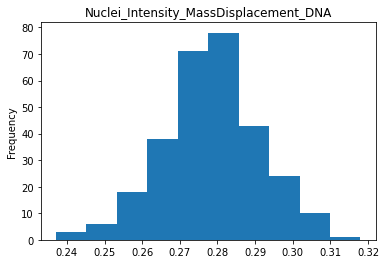

Plotting Nuclei_Intensity_MaxIntensityEdge_DNA:  71%|███████   | 167/235 [00:40<00:13,  4.91it/s]

Not normal


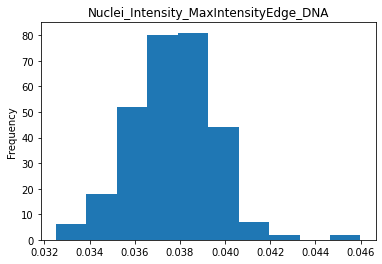

Plotting Nuclei_Intensity_MaxIntensity_DNA:  71%|███████▏  | 168/235 [00:40<00:13,  4.83it/s]    

Not normal


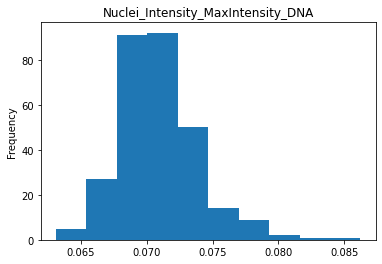

Plotting Nuclei_Intensity_MeanIntensityEdge_DNA:  72%|███████▏  | 169/235 [00:41<00:12,  5.08it/s]

Not normal


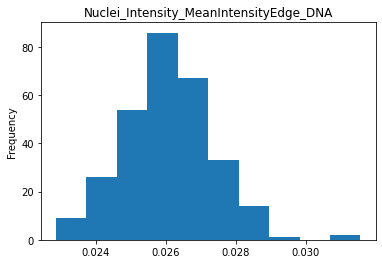

Plotting Nuclei_Intensity_MeanIntensity_DNA:  72%|███████▏  | 170/235 [00:41<00:12,  5.25it/s]    

Not normal


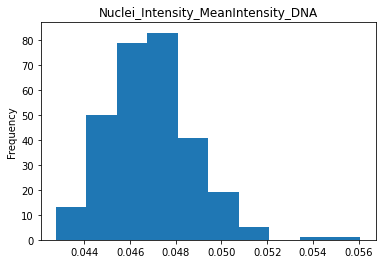

Plotting Nuclei_Intensity_MedianIntensity_DNA:  73%|███████▎  | 171/235 [00:41<00:12,  5.09it/s]

Not normal


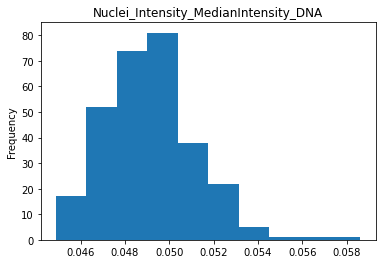

Plotting Nuclei_Intensity_MinIntensityEdge_DNA:  73%|███████▎  | 172/235 [00:41<00:13,  4.61it/s]

Not normal


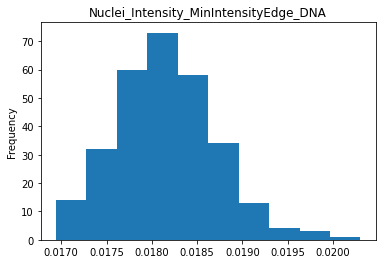

Plotting Nuclei_Intensity_MinIntensity_DNA:  74%|███████▎  | 173/235 [00:41<00:14,  4.31it/s]    

Not normal


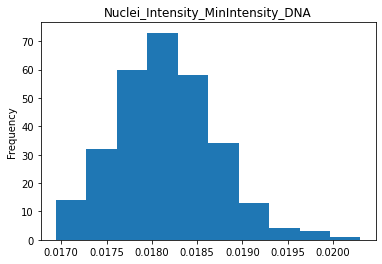

Plotting Nuclei_Intensity_StdIntensityEdge_DNA:  74%|███████▍  | 174/235 [00:42<00:16,  3.67it/s]

Not normal


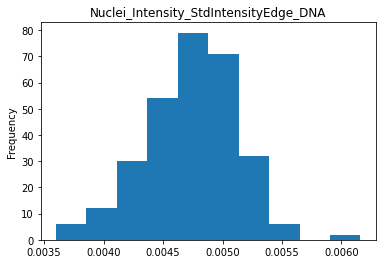

Plotting Nuclei_Intensity_StdIntensity_DNA:  74%|███████▍  | 175/235 [00:42<00:15,  3.88it/s]    

Not normal


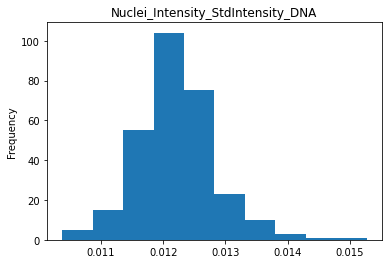

Plotting Nuclei_Intensity_UpperQuartileIntensity_DNA:  75%|███████▍  | 176/235 [00:42<00:13,  4.24it/s]

Not normal


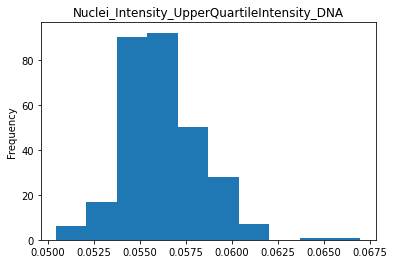

Plotting Nuclei_Location_CenterMassIntensity_X_DNA:  75%|███████▌  | 177/235 [00:42<00:13,  4.33it/s]  

Not normal


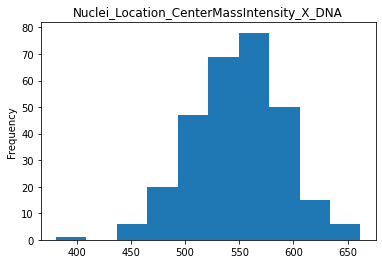

Plotting Nuclei_Location_CenterMassIntensity_Y_DNA:  76%|███████▌  | 178/235 [00:43<00:13,  4.26it/s]

Not normal


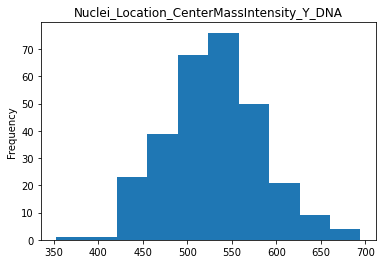

Plotting Nuclei_Location_MaxIntensity_X_DNA:  76%|███████▌  | 179/235 [00:43<00:13,  4.30it/s]       

Not normal


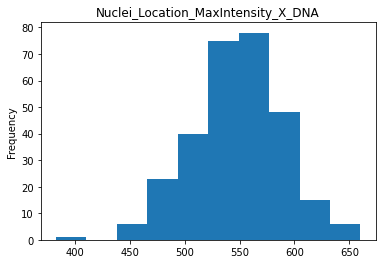

Plotting Nuclei_Location_MaxIntensity_Y_DNA:  77%|███████▋  | 180/235 [00:43<00:12,  4.26it/s]

Not normal


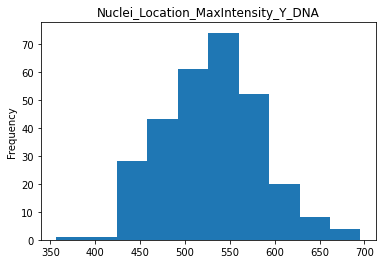

Plotting Nuclei_RadialDistribution_FracAtD_DNA_1of4:  77%|███████▋  | 181/235 [00:43<00:12,  4.29it/s]

Not normal


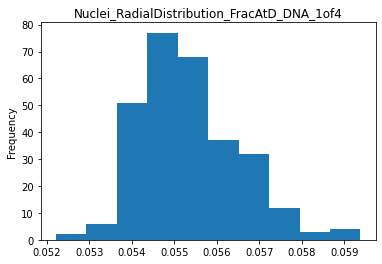

Plotting Nuclei_RadialDistribution_FracAtD_DNA_2of4:  77%|███████▋  | 182/235 [00:44<00:12,  4.31it/s]

Not normal


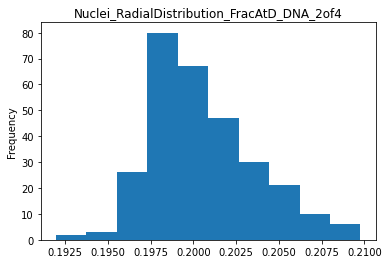

Plotting Nuclei_RadialDistribution_FracAtD_DNA_3of4:  78%|███████▊  | 183/235 [00:44<00:12,  4.23it/s]

Not normal


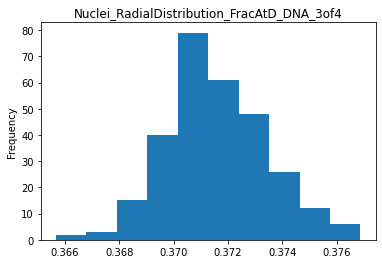

Plotting Nuclei_RadialDistribution_FracAtD_DNA_4of4:  78%|███████▊  | 184/235 [00:44<00:12,  4.19it/s]

Not normal


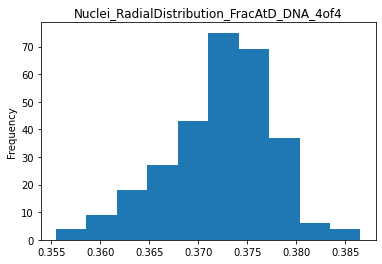

Plotting Nuclei_RadialDistribution_MeanFrac_DNA_1of4:  79%|███████▊  | 185/235 [00:44<00:11,  4.32it/s]

Not normal


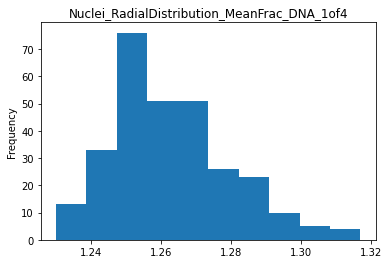

Plotting Nuclei_RadialDistribution_MeanFrac_DNA_2of4:  79%|███████▉  | 186/235 [00:45<00:11,  4.38it/s]

Not normal


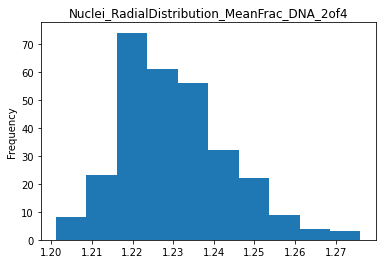

Plotting Nuclei_RadialDistribution_MeanFrac_DNA_3of4:  80%|███████▉  | 187/235 [00:45<00:11,  4.31it/s]

Not normal


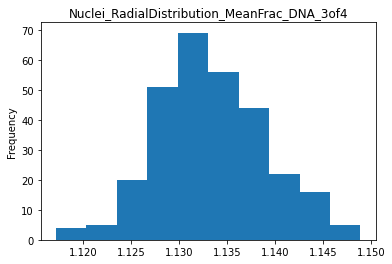

Plotting Nuclei_RadialDistribution_MeanFrac_DNA_4of4:  80%|████████  | 188/235 [00:45<00:10,  4.31it/s]

Not normal


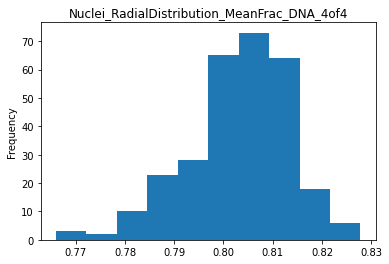

Plotting Nuclei_RadialDistribution_RadialCV_DNA_1of4:  80%|████████  | 189/235 [00:45<00:10,  4.30it/s]

Not normal


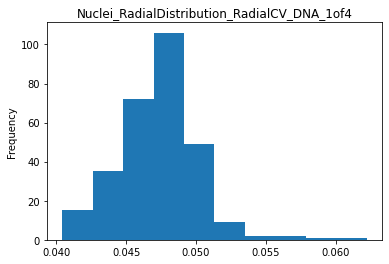

Plotting Nuclei_RadialDistribution_RadialCV_DNA_2of4:  81%|████████  | 190/235 [00:45<00:10,  4.43it/s]

Not normal


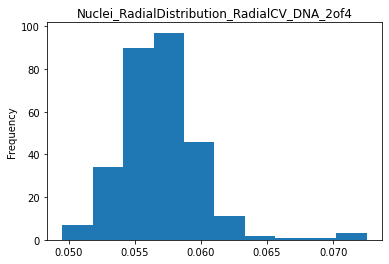

Plotting Nuclei_RadialDistribution_RadialCV_DNA_3of4:  81%|████████▏ | 191/235 [00:46<00:09,  4.52it/s]

Not normal


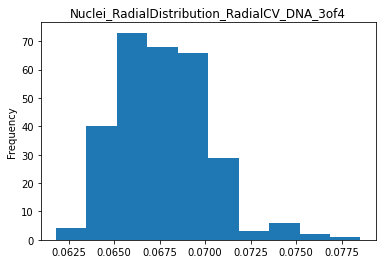

Plotting Nuclei_RadialDistribution_RadialCV_DNA_4of4:  82%|████████▏ | 192/235 [00:46<00:09,  4.41it/s]

Not normal


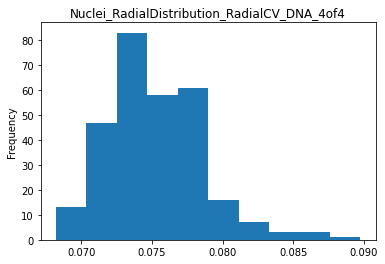

Plotting Nuclei_Texture_AngularSecondMoment_DNA_10_0:  82%|████████▏ | 193/235 [00:46<00:09,  4.30it/s]

Not normal


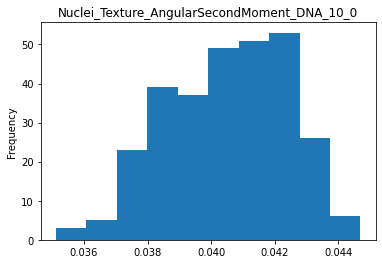

Plotting Nuclei_Texture_AngularSecondMoment_DNA_3_0:  83%|████████▎ | 194/235 [00:46<00:09,  4.22it/s] 

Not normal


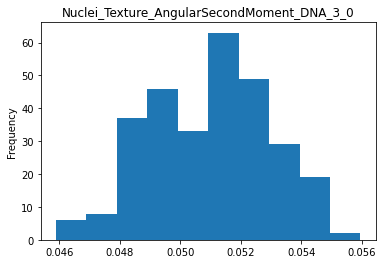

Plotting Nuclei_Texture_AngularSecondMoment_DNA_5_0:  83%|████████▎ | 195/235 [00:47<00:09,  4.26it/s]

Not normal


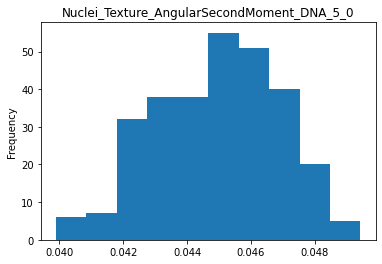

Plotting Nuclei_Texture_Contrast_DNA_10_0:  83%|████████▎ | 196/235 [00:47<00:08,  4.36it/s]          

Not normal


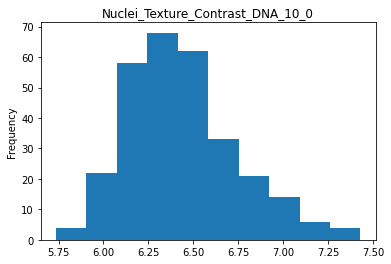

Plotting Nuclei_Texture_Contrast_DNA_3_0:  84%|████████▍ | 197/235 [00:47<00:08,  4.26it/s] 

Not normal


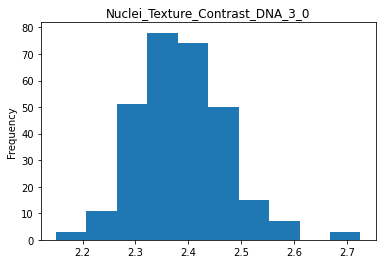

Plotting Nuclei_Texture_Contrast_DNA_5_0:  84%|████████▍ | 198/235 [00:47<00:08,  4.31it/s]

Not normal


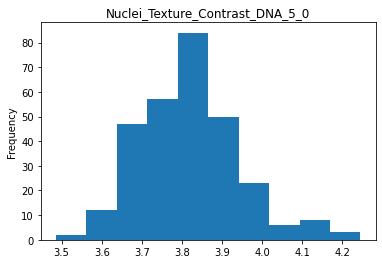

Plotting Nuclei_Texture_Correlation_DNA_10_0:  85%|████████▍ | 199/235 [00:48<00:08,  4.28it/s]

Not normal


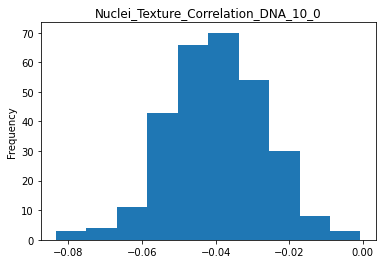

Plotting Nuclei_Texture_Correlation_DNA_3_0:  85%|████████▌ | 200/235 [00:48<00:08,  4.32it/s] 

Not normal


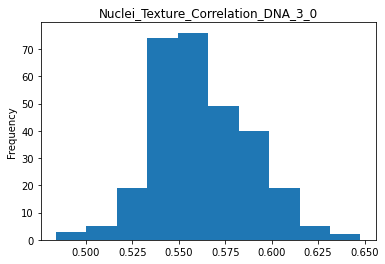

Plotting Nuclei_Texture_Correlation_DNA_5_0:  86%|████████▌ | 201/235 [00:48<00:08,  4.19it/s]

Not normal


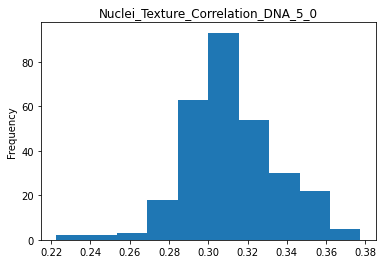

Plotting Nuclei_Texture_DifferenceEntropy_DNA_10_0:  86%|████████▌ | 202/235 [00:48<00:09,  3.50it/s]

Not normal


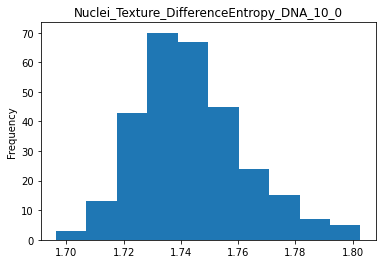

Plotting Nuclei_Texture_DifferenceEntropy_DNA_3_0:  86%|████████▋ | 203/235 [00:49<00:08,  3.72it/s] 

Not normal


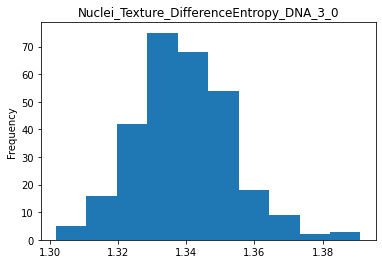

Plotting Nuclei_Texture_DifferenceEntropy_DNA_5_0:  87%|████████▋ | 204/235 [00:49<00:08,  3.86it/s]

Not normal


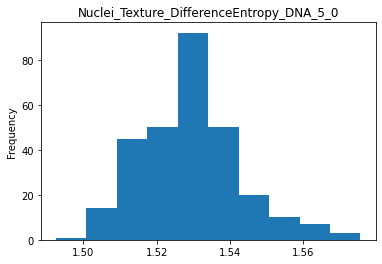

Plotting Nuclei_Texture_DifferenceVariance_DNA_10_0:  87%|████████▋ | 205/235 [00:49<00:07,  4.18it/s]

Not normal


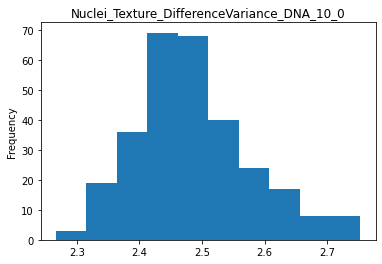

Plotting Nuclei_Texture_DifferenceVariance_DNA_3_0:  88%|████████▊ | 206/235 [00:49<00:06,  4.30it/s] 

Not normal


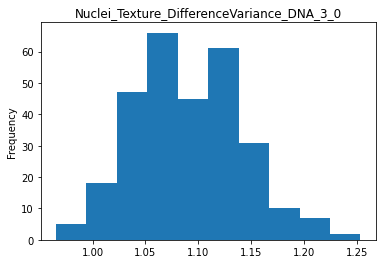

Plotting Nuclei_Texture_DifferenceVariance_DNA_5_0:  88%|████████▊ | 207/235 [00:50<00:06,  4.31it/s]

Not normal


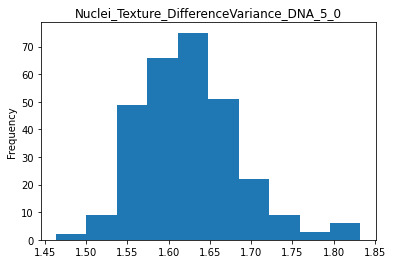

Plotting Nuclei_Texture_Entropy_DNA_10_0:  89%|████████▊ | 208/235 [00:50<00:06,  4.23it/s]          

Not normal


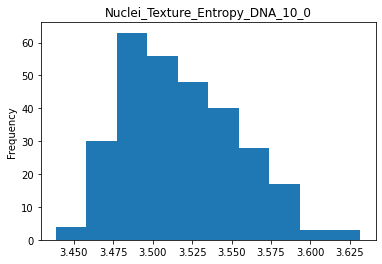

Plotting Nuclei_Texture_Entropy_DNA_3_0:  89%|████████▉ | 209/235 [00:50<00:06,  4.28it/s] 

Not normal


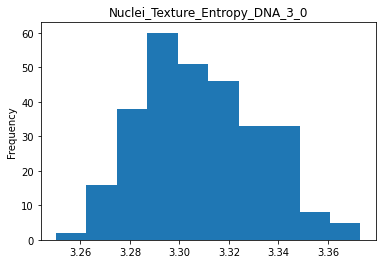

Plotting Nuclei_Texture_Entropy_DNA_5_0:  89%|████████▉ | 210/235 [00:50<00:05,  4.25it/s]

Not normal


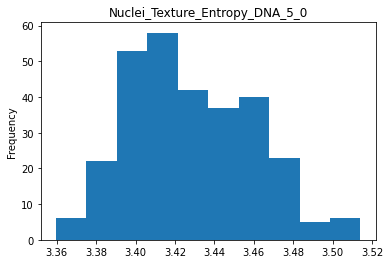

Plotting Nuclei_Texture_Gabor_DNA_10:  90%|████████▉ | 211/235 [00:51<00:05,  4.16it/s]   

Not normal


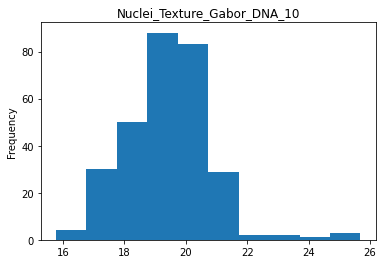

Plotting Nuclei_Texture_Gabor_DNA_3:  90%|█████████ | 212/235 [00:51<00:05,  4.15it/s] 

Not normal


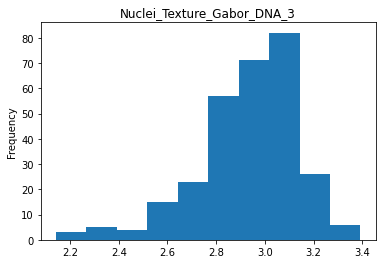

Plotting Nuclei_Texture_Gabor_DNA_5:  91%|█████████ | 213/235 [00:51<00:05,  4.10it/s]

Not normal


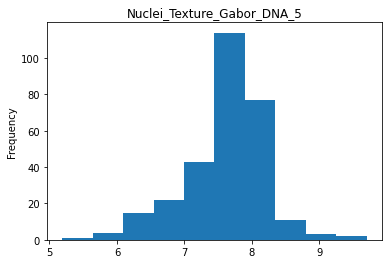

Plotting Nuclei_Texture_InfoMeas1_DNA_10_0:  91%|█████████ | 214/235 [00:51<00:04,  4.33it/s]

Not normal


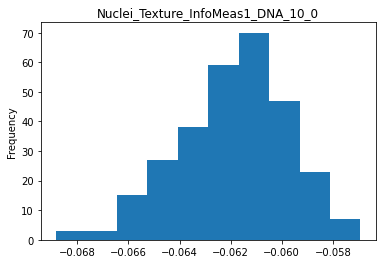

Plotting Nuclei_Texture_InfoMeas1_DNA_3_0:  91%|█████████▏| 215/235 [00:51<00:04,  4.53it/s] 

Not normal


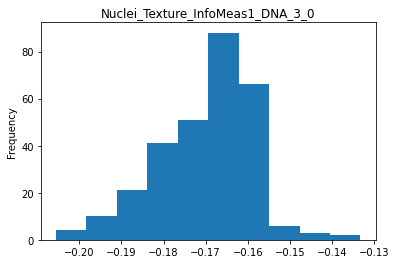

Plotting Nuclei_Texture_InfoMeas1_DNA_5_0:  92%|█████████▏| 216/235 [00:52<00:04,  4.52it/s]

Not normal


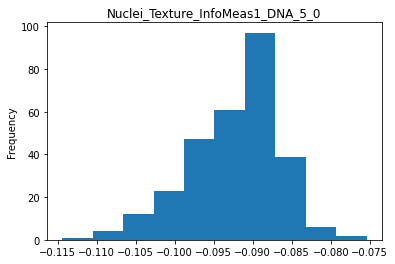

Plotting Nuclei_Texture_InfoMeas2_DNA_10_0:  92%|█████████▏| 217/235 [00:52<00:03,  4.56it/s]

Not normal


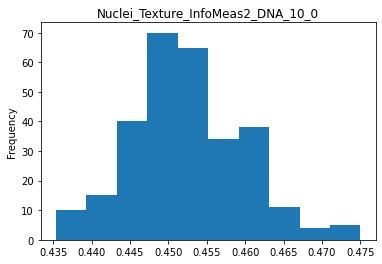

Plotting Nuclei_Texture_InfoMeas2_DNA_3_0:  93%|█████████▎| 218/235 [00:52<00:03,  4.28it/s] 

Not normal


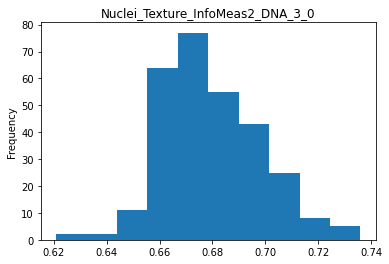

Plotting Nuclei_Texture_InfoMeas2_DNA_5_0:  93%|█████████▎| 219/235 [00:52<00:03,  4.03it/s]

Not normal


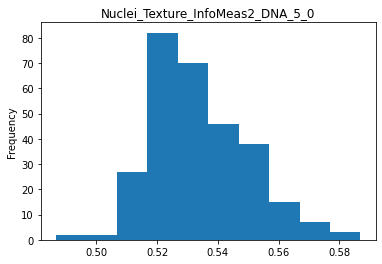

Plotting Nuclei_Texture_InverseDifferenceMoment_DNA_10_0:  94%|█████████▎| 220/235 [00:53<00:04,  3.72it/s]

Not normal


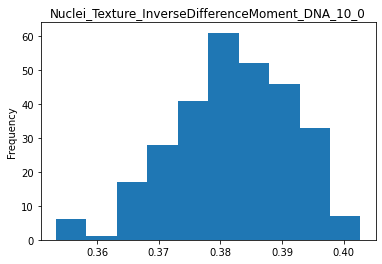

Plotting Nuclei_Texture_InverseDifferenceMoment_DNA_3_0:  94%|█████████▍| 221/235 [00:53<00:03,  3.89it/s] 

Not normal


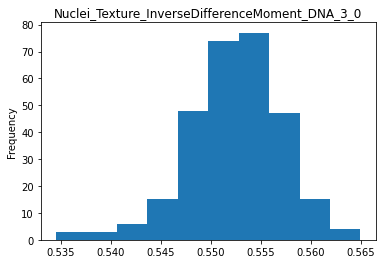

Plotting Nuclei_Texture_InverseDifferenceMoment_DNA_5_0:  94%|█████████▍| 222/235 [00:53<00:03,  3.90it/s]

Not normal


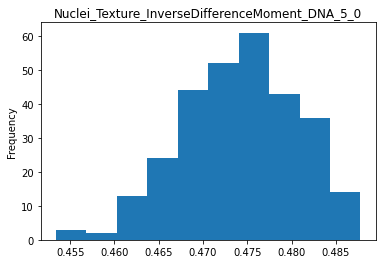

Plotting Nuclei_Texture_SumAverage_DNA_10_0:  95%|█████████▍| 223/235 [00:53<00:02,  4.08it/s]            

Not normal


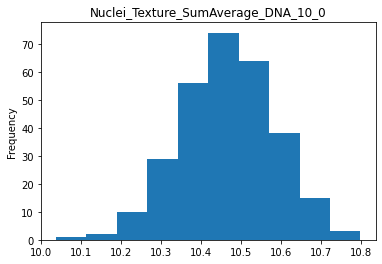

Plotting Nuclei_Texture_SumAverage_DNA_3_0:  95%|█████████▌| 224/235 [00:54<00:02,  4.12it/s] 

Not normal


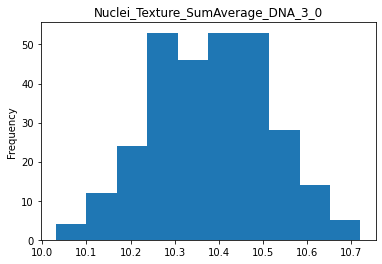

Plotting Nuclei_Texture_SumAverage_DNA_5_0:  96%|█████████▌| 225/235 [00:54<00:02,  4.27it/s]

Not normal


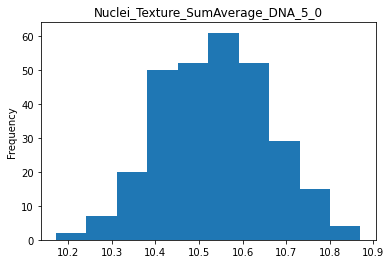

Plotting Nuclei_Texture_SumEntropy_DNA_10_0:  96%|█████████▌| 226/235 [00:54<00:02,  4.26it/s]

Not normal


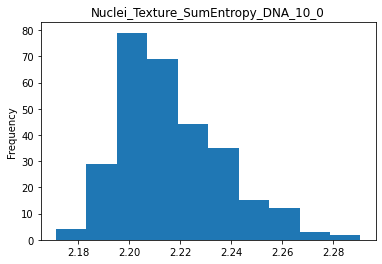

Plotting Nuclei_Texture_SumEntropy_DNA_3_0:  97%|█████████▋| 227/235 [00:54<00:01,  4.35it/s] 

Not normal


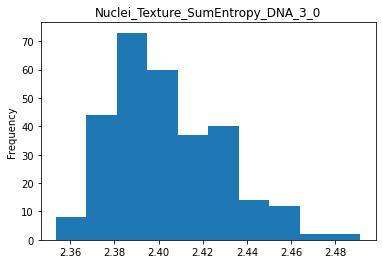

Plotting Nuclei_Texture_SumEntropy_DNA_5_0:  97%|█████████▋| 228/235 [00:55<00:01,  4.10it/s]

Not normal


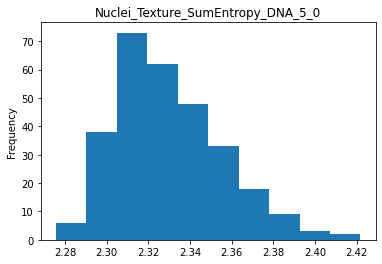

Plotting Nuclei_Texture_SumVariance_DNA_10_0:  97%|█████████▋| 229/235 [00:55<00:01,  4.02it/s]

Not normal


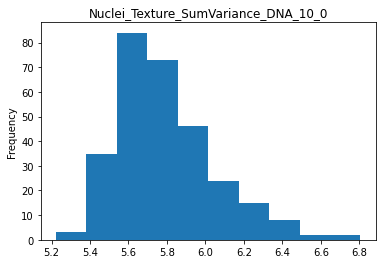

Plotting Nuclei_Texture_SumVariance_DNA_3_0:  98%|█████████▊| 230/235 [00:55<00:01,  3.35it/s] 

Not normal


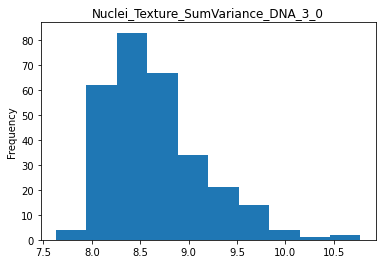

Plotting Nuclei_Texture_SumVariance_DNA_5_0:  98%|█████████▊| 231/235 [00:56<00:01,  3.54it/s]

Not normal


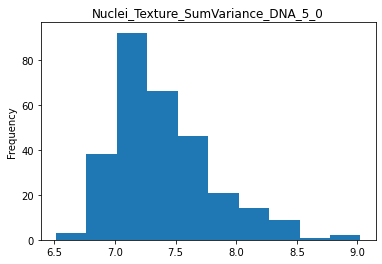

Plotting Nuclei_Texture_Variance_DNA_10_0:  99%|█████████▊| 232/235 [00:56<00:00,  3.64it/s]  

Not normal


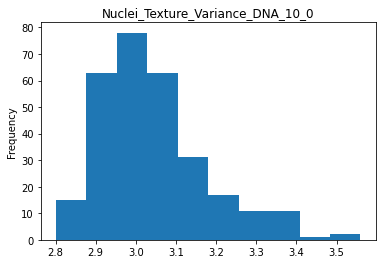

Plotting Nuclei_Texture_Variance_DNA_3_0:  99%|█████████▉| 233/235 [00:56<00:00,  3.77it/s] 

Not normal


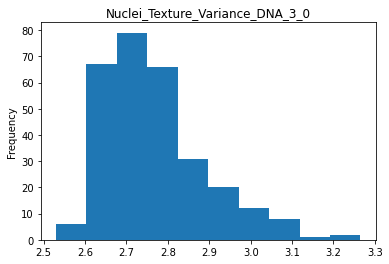

Plotting Nuclei_Texture_Variance_DNA_5_0: 100%|█████████▉| 234/235 [00:56<00:00,  3.91it/s]

Not normal


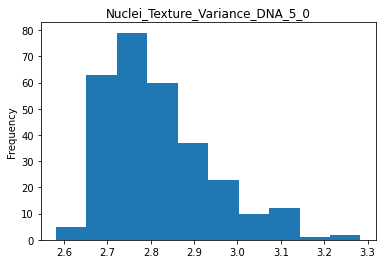

Plotting Nuclei_Texture_Variance_DNA_5_0: 100%|██████████| 235/235 [00:56<00:00,  4.12it/s]


In [23]:

DNA_df = Data_object.exclude_other_channels("DNA")
display_plots(DNA_df)

# AGP distribution

Plotting Cells_Granularity_10_AGP:   0%|          | 0/267 [00:00<?, ?it/s]

Not normal


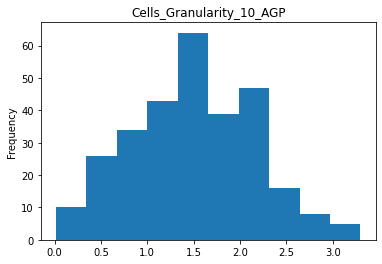

Plotting Cells_Granularity_11_AGP:   0%|          | 1/267 [00:00<01:04,  4.11it/s]

Not normal


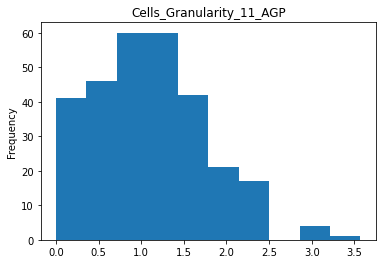

Plotting Cells_Granularity_12_AGP:   1%|          | 2/267 [00:00<00:58,  4.52it/s]

Not normal


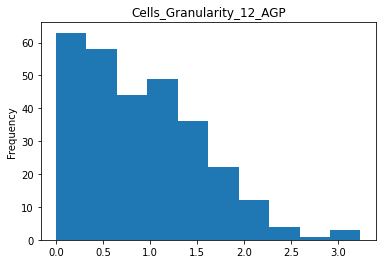

Plotting Cells_Granularity_13_AGP:   1%|          | 3/267 [00:00<00:55,  4.76it/s]

Not normal


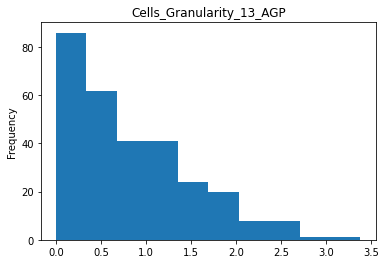

Plotting Cells_Granularity_14_AGP:   1%|▏         | 4/267 [00:00<00:52,  4.99it/s]

Not normal


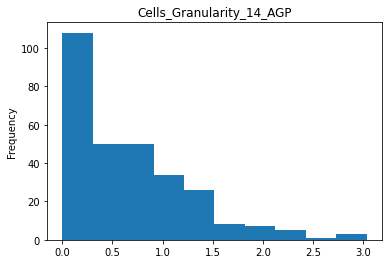

Plotting Cells_Granularity_15_AGP:   2%|▏         | 5/267 [00:01<00:52,  5.03it/s]

Not normal


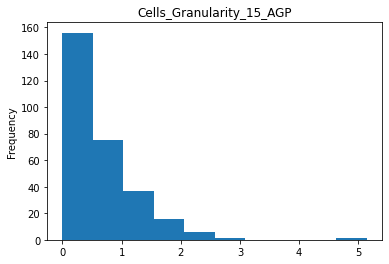

Plotting Cells_Granularity_16_AGP:   2%|▏         | 6/267 [00:01<00:52,  4.99it/s]

Not normal


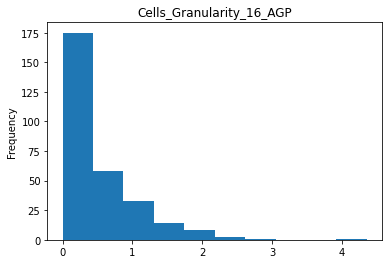

Plotting Cells_Granularity_1_AGP:   3%|▎         | 7/267 [00:01<00:51,  5.02it/s] 

Not normal


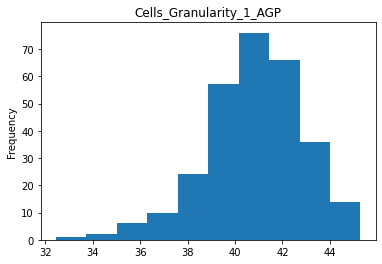

Plotting Cells_Granularity_2_AGP:   3%|▎         | 8/267 [00:01<01:18,  3.32it/s]

Not normal


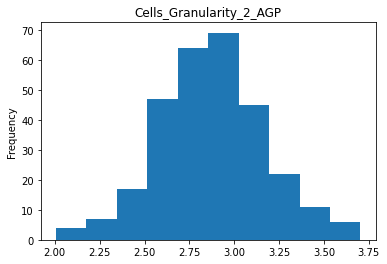

Plotting Cells_Granularity_3_AGP:   3%|▎         | 9/267 [00:02<01:38,  2.62it/s]

Not normal


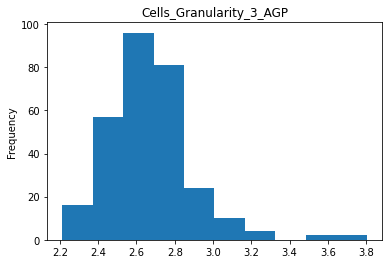

Plotting Cells_Granularity_4_AGP:   4%|▎         | 10/267 [00:03<01:47,  2.39it/s]

Not normal


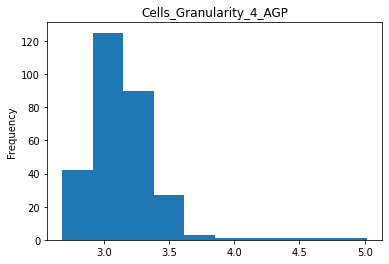

Plotting Cells_Granularity_5_AGP:   4%|▍         | 11/267 [00:03<01:44,  2.44it/s]

Not normal


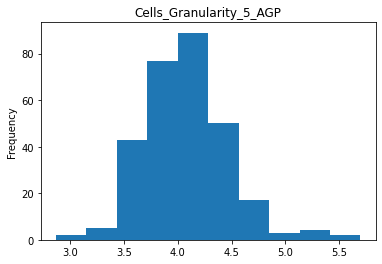

Plotting Cells_Granularity_6_AGP:   4%|▍         | 12/267 [00:03<01:37,  2.61it/s]

Not normal


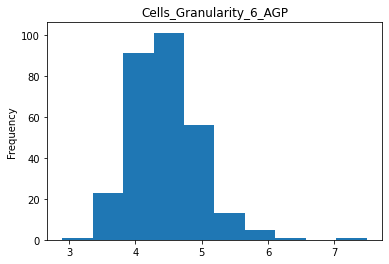

Plotting Cells_Granularity_7_AGP:   5%|▍         | 13/267 [00:03<01:21,  3.13it/s]

Not normal


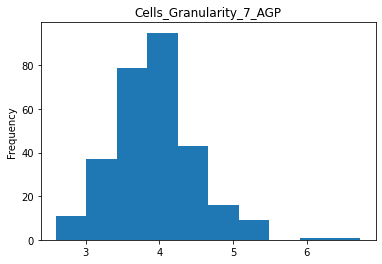

Plotting Cells_Granularity_8_AGP:   5%|▌         | 14/267 [00:04<01:08,  3.68it/s]

Not normal


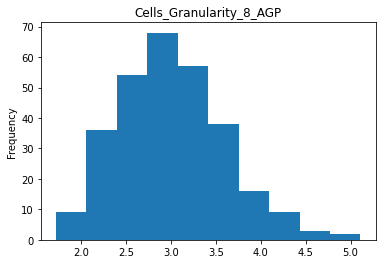

Plotting Cells_Granularity_9_AGP:   6%|▌         | 15/267 [00:04<01:02,  4.01it/s]

Not normal


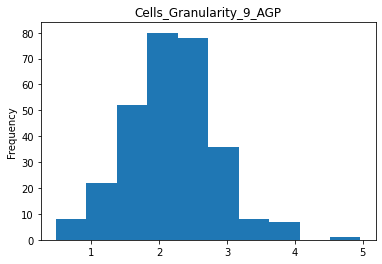

Plotting Cells_Intensity_IntegratedIntensityEdge_AGP:   6%|▌         | 16/267 [00:04<00:59,  4.24it/s]

Not normal


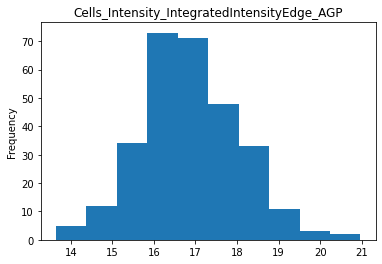

Plotting Cells_Intensity_IntegratedIntensity_AGP:   6%|▋         | 17/267 [00:04<01:02,  3.97it/s]    

Not normal


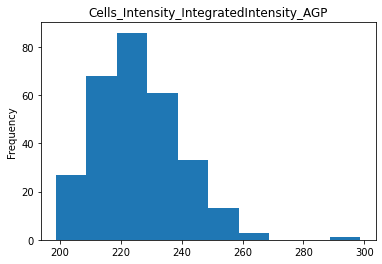

Plotting Cells_Intensity_LowerQuartileIntensity_AGP:   7%|▋         | 18/267 [00:05<01:07,  3.68it/s]

Not normal


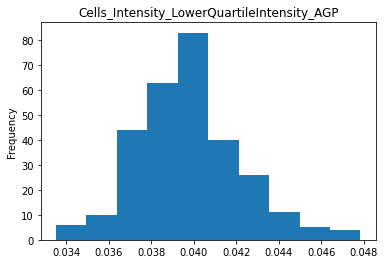

Plotting Cells_Intensity_MADIntensity_AGP:   7%|▋         | 19/267 [00:05<01:24,  2.93it/s]          

Not normal


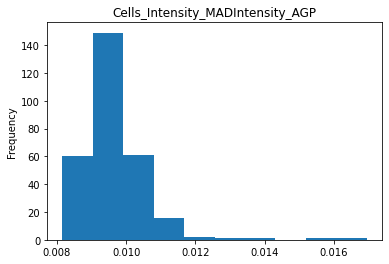

Plotting Cells_Intensity_MassDisplacement_AGP:   7%|▋         | 20/267 [00:05<01:24,  2.93it/s]

Not normal


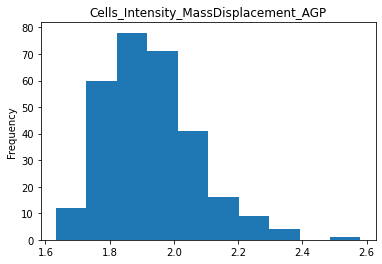

Plotting Cells_Intensity_MaxIntensityEdge_AGP:   8%|▊         | 21/267 [00:06<01:13,  3.35it/s]

Not normal


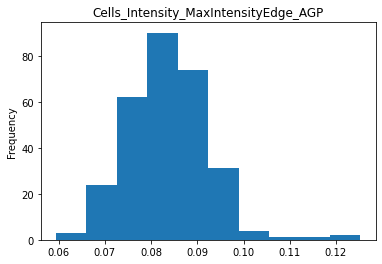

Plotting Cells_Intensity_MaxIntensity_AGP:   8%|▊         | 22/267 [00:06<01:04,  3.77it/s]    

Not normal


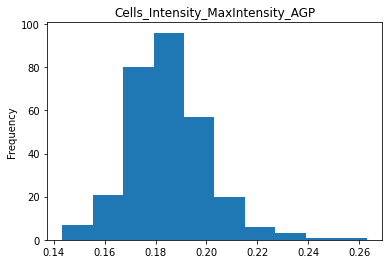

Plotting Cells_Intensity_MeanIntensityEdge_AGP:   9%|▊         | 23/267 [00:06<01:07,  3.63it/s]

Not normal


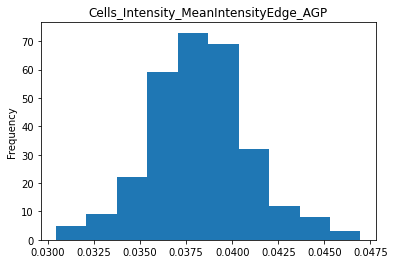

Plotting Cells_Intensity_MeanIntensity_AGP:   9%|▉         | 24/267 [00:07<01:18,  3.11it/s]    

Not normal


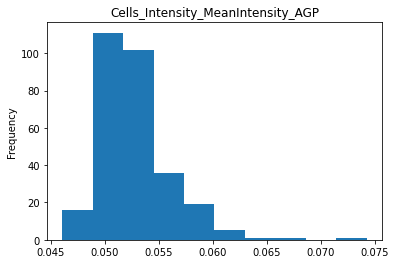

Plotting Cells_Intensity_MedianIntensity_AGP:   9%|▉         | 25/267 [00:07<01:07,  3.57it/s]

Not normal


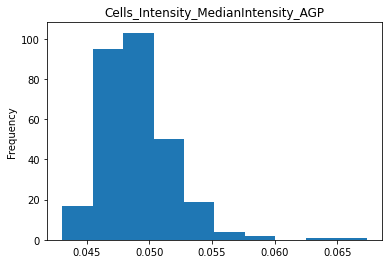

Plotting Cells_Intensity_MinIntensityEdge_AGP:  10%|▉         | 26/267 [00:07<01:11,  3.35it/s]

Not normal


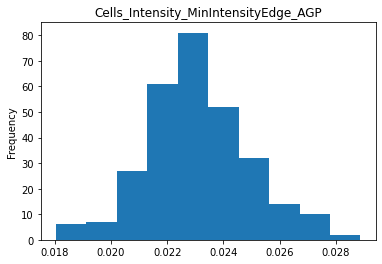

Plotting Cells_Intensity_MinIntensity_AGP:  10%|█         | 27/267 [00:07<01:04,  3.72it/s]    

Not normal


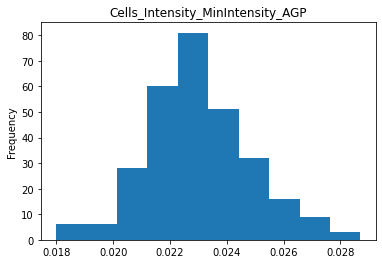

Plotting Cells_Intensity_StdIntensityEdge_AGP:  10%|█         | 28/267 [00:07<00:59,  4.02it/s]

Not normal


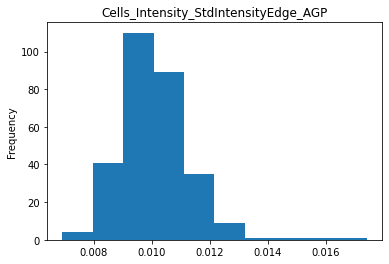

Plotting Cells_Intensity_StdIntensity_AGP:  11%|█         | 29/267 [00:08<00:54,  4.36it/s]    

Not normal


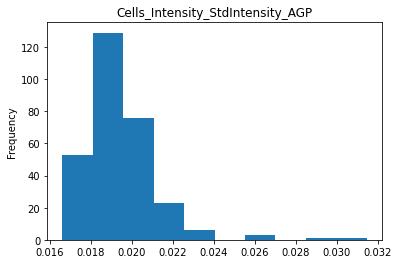

Plotting Cells_Intensity_UpperQuartileIntensity_AGP:  11%|█         | 30/267 [00:08<00:51,  4.58it/s]

Not normal


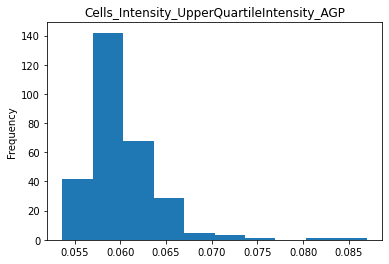

Plotting Cells_Location_CenterMassIntensity_X_AGP:  12%|█▏        | 31/267 [00:08<00:50,  4.69it/s]  

Not normal


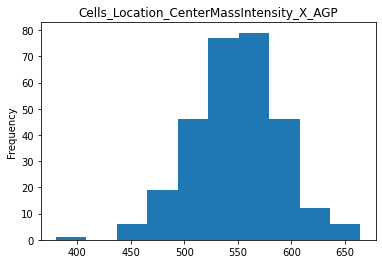

Plotting Cells_Location_CenterMassIntensity_Y_AGP:  12%|█▏        | 32/267 [00:08<00:49,  4.77it/s]

Not normal


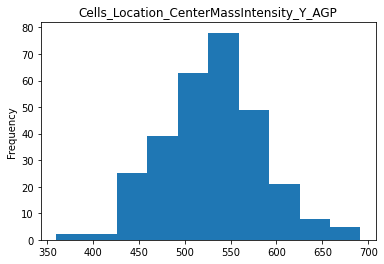

Plotting Cells_Location_MaxIntensity_X_AGP:  12%|█▏        | 33/267 [00:08<00:49,  4.71it/s]       

Not normal


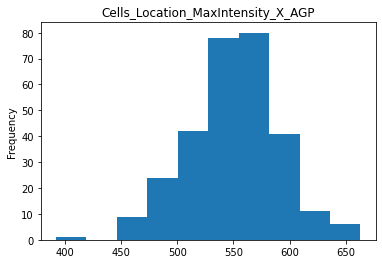

Plotting Cells_Location_MaxIntensity_Y_AGP:  13%|█▎        | 34/267 [00:09<00:48,  4.84it/s]

Not normal


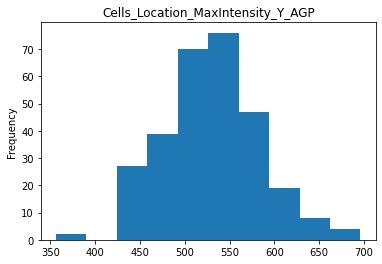

Plotting Cells_RadialDistribution_FracAtD_AGP_1of4:  13%|█▎        | 35/267 [00:09<00:48,  4.83it/s]

Not normal


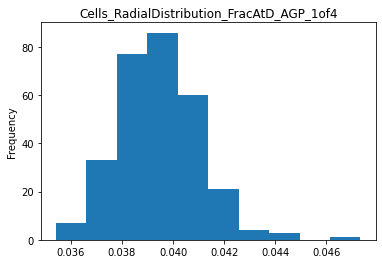

Plotting Cells_RadialDistribution_FracAtD_AGP_2of4:  13%|█▎        | 36/267 [00:09<00:46,  4.99it/s]

Not normal


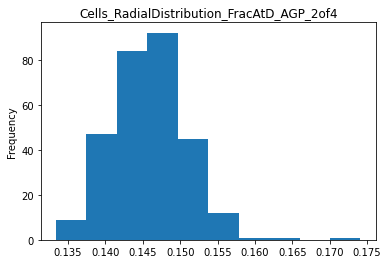

Plotting Cells_RadialDistribution_FracAtD_AGP_3of4:  14%|█▍        | 37/267 [00:09<00:45,  5.00it/s]

Not normal


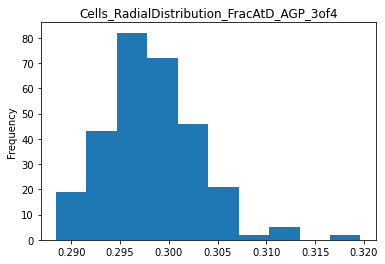

Plotting Cells_RadialDistribution_FracAtD_AGP_4of4:  14%|█▍        | 38/267 [00:09<00:46,  4.95it/s]

Not normal


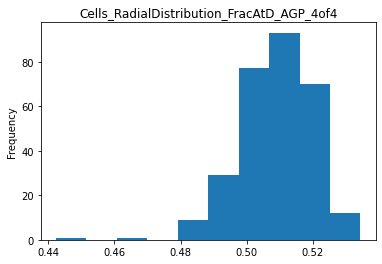

Plotting Cells_RadialDistribution_MeanFrac_AGP_1of4:  15%|█▍        | 39/267 [00:10<00:57,  3.99it/s]

Not normal


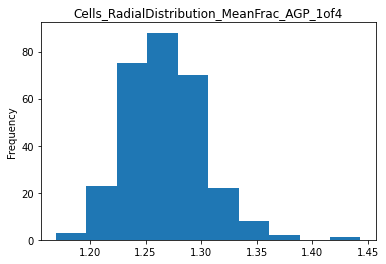

Plotting Cells_RadialDistribution_MeanFrac_AGP_2of4:  15%|█▍        | 40/267 [00:10<01:02,  3.66it/s]

Not normal


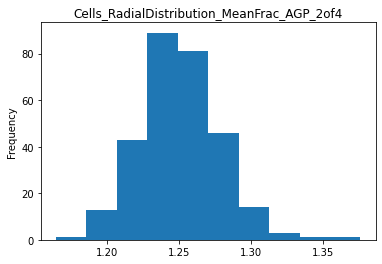

Plotting Cells_RadialDistribution_MeanFrac_AGP_3of4:  15%|█▌        | 41/267 [00:10<01:05,  3.46it/s]

Not normal


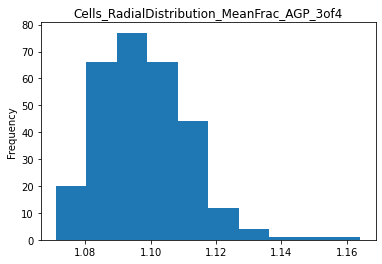

Plotting Cells_RadialDistribution_MeanFrac_AGP_4of4:  16%|█▌        | 42/267 [00:11<01:02,  3.60it/s]

Not normal


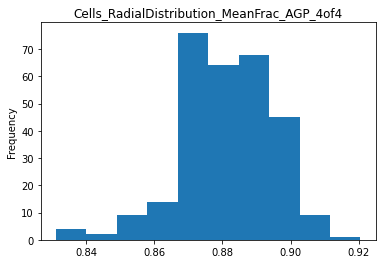

Plotting Cells_RadialDistribution_RadialCV_AGP_1of4:  16%|█▌        | 43/267 [00:11<01:07,  3.32it/s]

Not normal


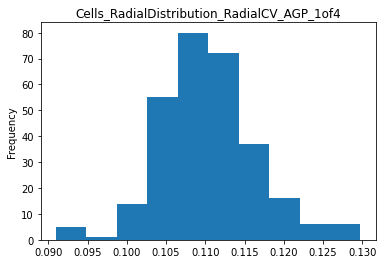

Plotting Cells_RadialDistribution_RadialCV_AGP_2of4:  16%|█▋        | 44/267 [00:12<01:17,  2.90it/s]

Not normal


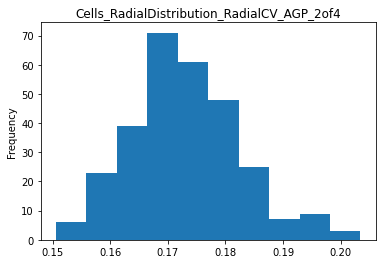

Plotting Cells_RadialDistribution_RadialCV_AGP_3of4:  17%|█▋        | 45/267 [00:12<01:26,  2.55it/s]

Not normal


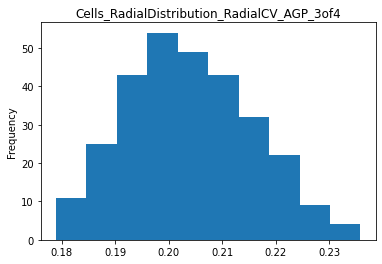

Plotting Cells_RadialDistribution_RadialCV_AGP_4of4:  17%|█▋        | 46/267 [00:12<01:30,  2.43it/s]

Not normal


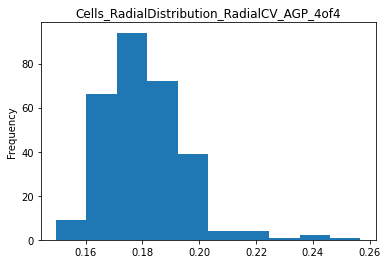

Plotting Cells_Texture_AngularSecondMoment_AGP_10_0:  18%|█▊        | 47/267 [00:13<01:23,  2.63it/s]

Not normal


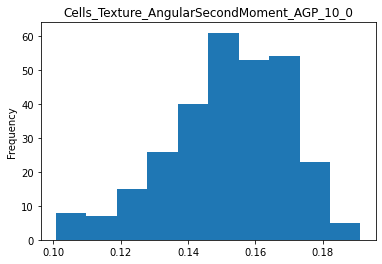

Plotting Cells_Texture_AngularSecondMoment_AGP_3_0:  18%|█▊        | 48/267 [00:13<01:15,  2.91it/s] 

Not normal


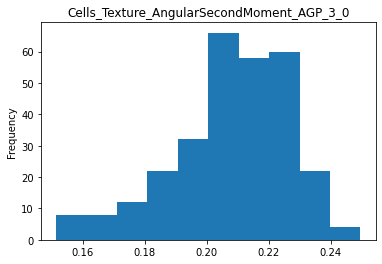

Plotting Cells_Texture_AngularSecondMoment_AGP_5_0:  18%|█▊        | 49/267 [00:13<01:22,  2.65it/s]

Not normal


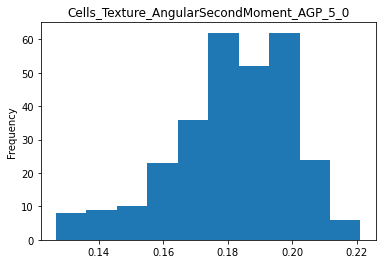

Plotting Cells_Texture_Contrast_AGP_10_0:  19%|█▊        | 50/267 [00:14<01:23,  2.59it/s]          

Not normal


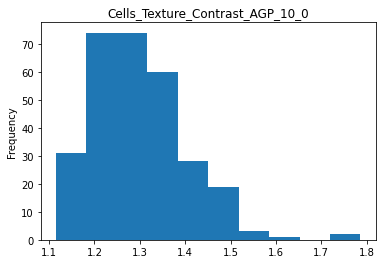

Plotting Cells_Texture_Contrast_AGP_3_0:  19%|█▉        | 51/267 [00:14<01:18,  2.75it/s] 

Not normal


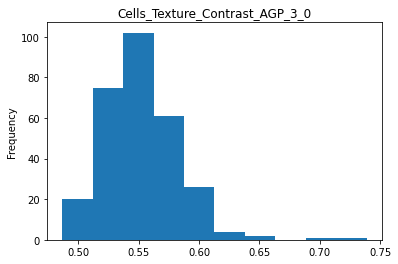

Plotting Cells_Texture_Contrast_AGP_5_0:  19%|█▉        | 52/267 [00:15<01:26,  2.48it/s]

Not normal


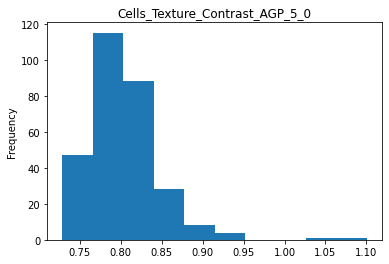

Plotting Cells_Texture_Correlation_AGP_10_0:  20%|█▉        | 53/267 [00:15<01:21,  2.64it/s]

Not normal


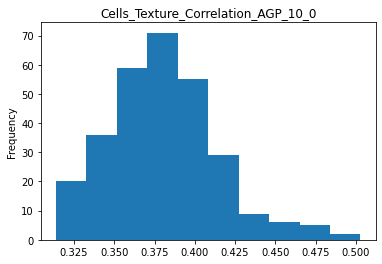

Plotting Cells_Texture_Correlation_AGP_3_0:  20%|██        | 54/267 [00:15<01:09,  3.07it/s] 

Not normal


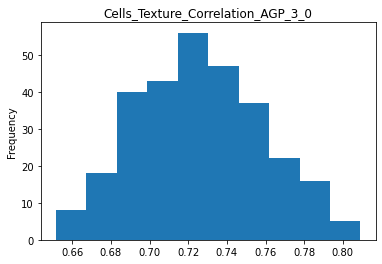

Plotting Cells_Texture_Correlation_AGP_5_0:  21%|██        | 55/267 [00:15<01:01,  3.46it/s]

Not normal


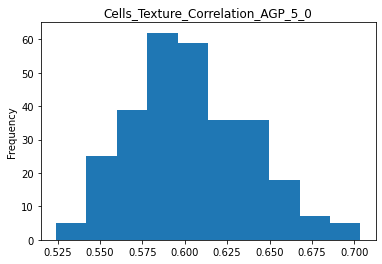

Plotting Cells_Texture_DifferenceEntropy_AGP_10_0:  21%|██        | 56/267 [00:16<00:55,  3.81it/s]

Not normal


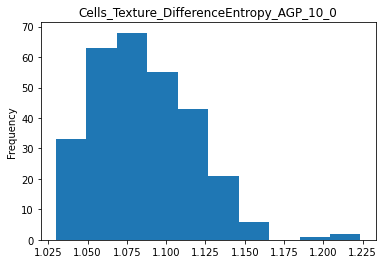

Plotting Cells_Texture_DifferenceEntropy_AGP_3_0:  21%|██▏       | 57/267 [00:16<01:00,  3.49it/s] 

Not normal


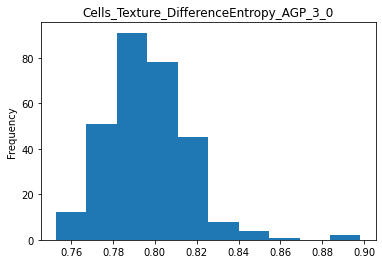

Plotting Cells_Texture_DifferenceEntropy_AGP_5_0:  22%|██▏       | 58/267 [00:16<00:53,  3.90it/s]

Not normal


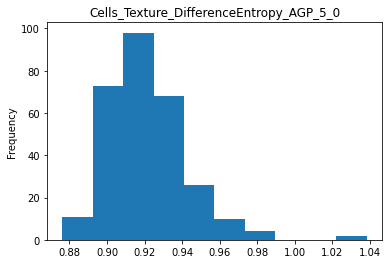

Plotting Cells_Texture_DifferenceVariance_AGP_10_0:  22%|██▏       | 59/267 [00:16<00:49,  4.18it/s]

Not normal


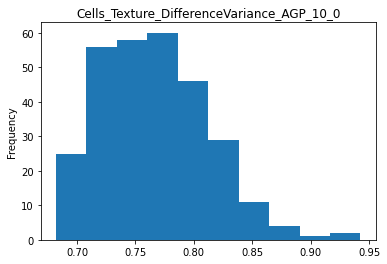

Plotting Cells_Texture_DifferenceVariance_AGP_3_0:  22%|██▏       | 60/267 [00:17<00:46,  4.45it/s] 

Not normal


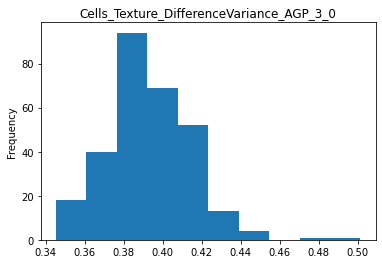

Plotting Cells_Texture_DifferenceVariance_AGP_5_0:  23%|██▎       | 61/267 [00:17<00:44,  4.67it/s]

Not normal


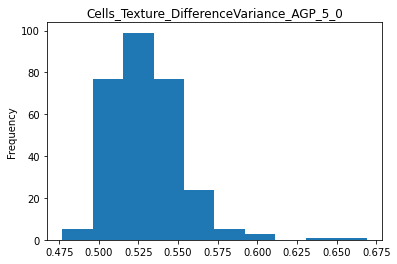

Plotting Cells_Texture_Entropy_AGP_10_0:  23%|██▎       | 62/267 [00:17<00:42,  4.78it/s]          

Not normal


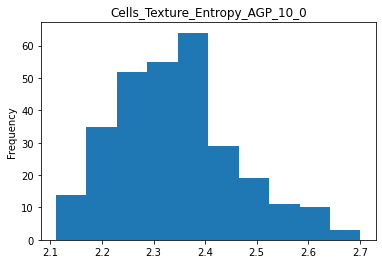

Plotting Cells_Texture_Entropy_AGP_3_0:  24%|██▎       | 63/267 [00:17<00:42,  4.85it/s] 

Not normal


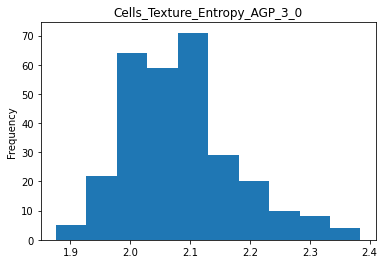

Plotting Cells_Texture_Entropy_AGP_5_0:  24%|██▍       | 64/267 [00:17<00:40,  4.97it/s]

Not normal


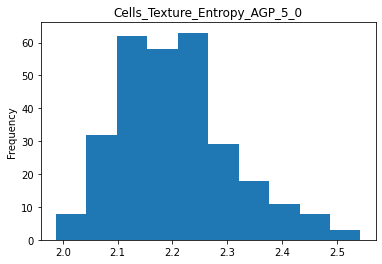

Plotting Cells_Texture_Gabor_AGP_10:  24%|██▍       | 65/267 [00:18<00:40,  4.95it/s]   

Not normal


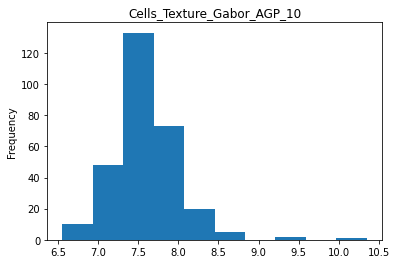

Plotting Cells_Texture_Gabor_AGP_3:  25%|██▍       | 66/267 [00:18<00:40,  4.93it/s] 

Not normal


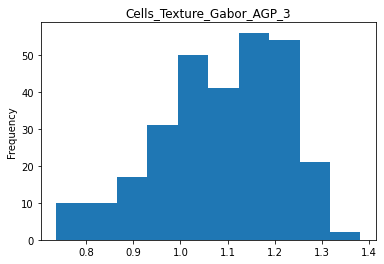

Plotting Cells_Texture_Gabor_AGP_5:  25%|██▌       | 67/267 [00:18<00:39,  5.00it/s]

Not normal


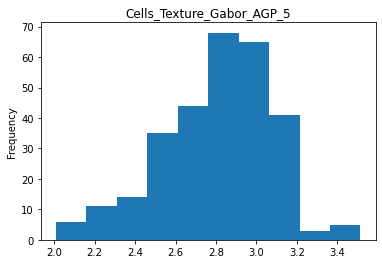

Plotting Cells_Texture_InfoMeas1_AGP_10_0:  25%|██▌       | 68/267 [00:18<00:40,  4.97it/s]

Not normal


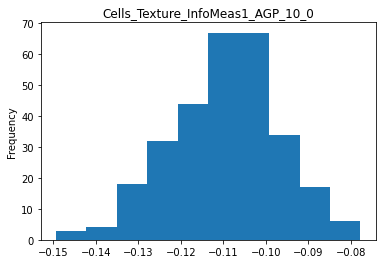

Plotting Cells_Texture_InfoMeas1_AGP_3_0:  26%|██▌       | 69/267 [00:18<00:40,  4.94it/s] 

Not normal


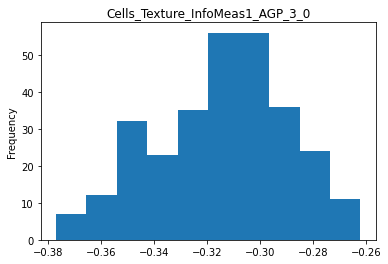

Plotting Cells_Texture_InfoMeas1_AGP_5_0:  26%|██▌       | 70/267 [00:19<00:38,  5.07it/s]

Not normal


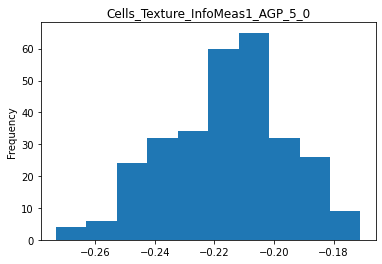

Plotting Cells_Texture_InfoMeas2_AGP_10_0:  27%|██▋       | 71/267 [00:19<00:37,  5.19it/s]

Not normal


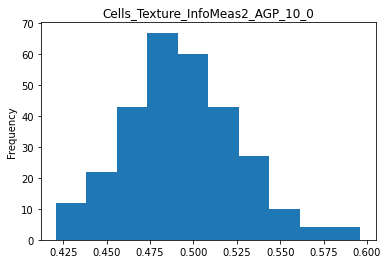

Plotting Cells_Texture_InfoMeas2_AGP_3_0:  27%|██▋       | 72/267 [00:19<00:38,  5.02it/s] 

Not normal


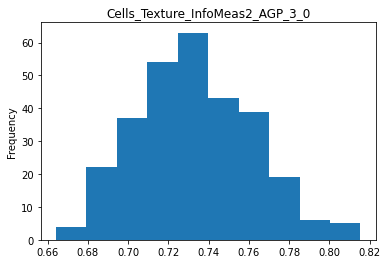

Plotting Cells_Texture_InfoMeas2_AGP_5_0:  27%|██▋       | 73/267 [00:19<00:38,  4.98it/s]

Not normal


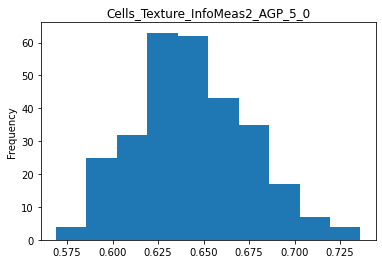

Plotting Cells_Texture_InverseDifferenceMoment_AGP_10_0:  28%|██▊       | 74/267 [00:19<00:38,  5.00it/s]

Not normal


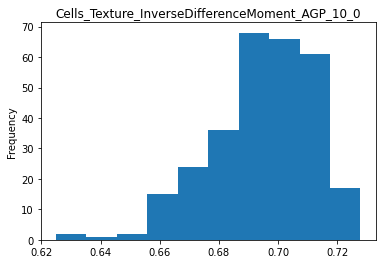

Plotting Cells_Texture_InverseDifferenceMoment_AGP_3_0:  28%|██▊       | 75/267 [00:20<00:38,  4.99it/s] 

Not normal


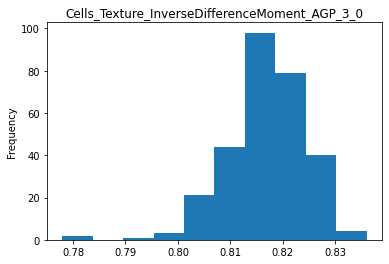

Plotting Cells_Texture_InverseDifferenceMoment_AGP_5_0:  28%|██▊       | 76/267 [00:20<00:37,  5.09it/s]

Not normal


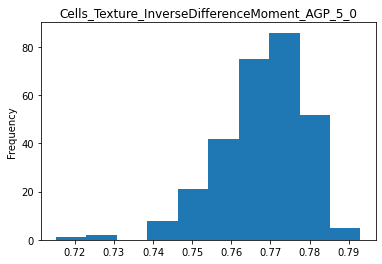

Plotting Cells_Texture_SumAverage_AGP_10_0:  29%|██▉       | 77/267 [00:20<00:37,  5.13it/s]            

Not normal


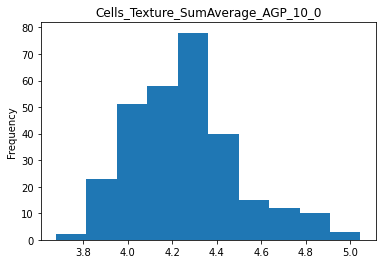

Plotting Cells_Texture_SumAverage_AGP_3_0:  29%|██▉       | 78/267 [00:20<00:40,  4.70it/s] 

Not normal


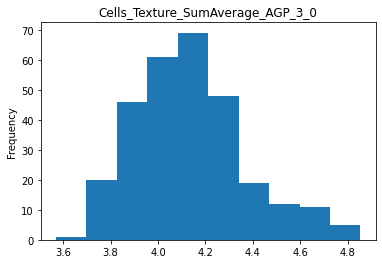

Plotting Cells_Texture_SumAverage_AGP_5_0:  30%|██▉       | 79/267 [00:20<00:40,  4.61it/s]

Not normal


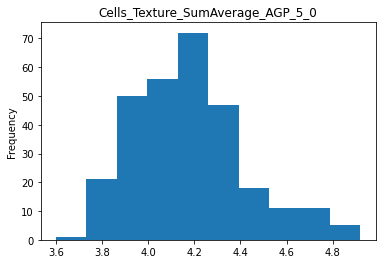

Plotting Cells_Texture_SumEntropy_AGP_10_0:  30%|██▉       | 80/267 [00:21<00:41,  4.51it/s]

Not normal


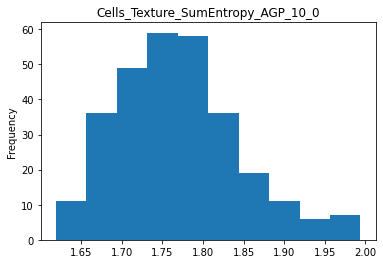

Plotting Cells_Texture_SumEntropy_AGP_3_0:  30%|███       | 81/267 [00:21<00:41,  4.53it/s] 

Not normal


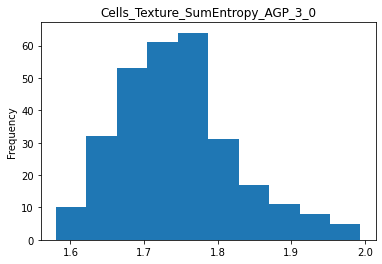

Plotting Cells_Texture_SumEntropy_AGP_5_0:  31%|███       | 82/267 [00:21<00:41,  4.47it/s]

Not normal


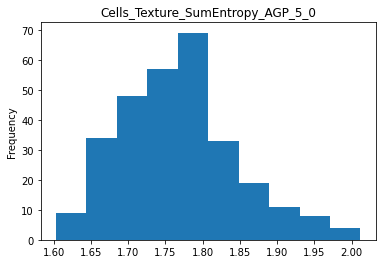

Plotting Cells_Texture_SumVariance_AGP_10_0:  31%|███       | 83/267 [00:21<00:46,  3.93it/s]

Not normal


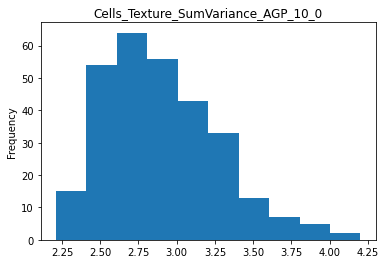

Plotting Cells_Texture_SumVariance_AGP_3_0:  31%|███▏      | 84/267 [00:22<00:44,  4.10it/s] 

Not normal


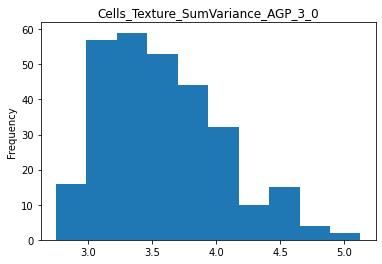

Plotting Cells_Texture_SumVariance_AGP_5_0:  32%|███▏      | 85/267 [00:22<00:43,  4.22it/s]

Not normal


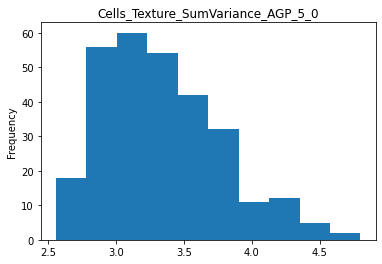

Plotting Cells_Texture_Variance_AGP_10_0:  32%|███▏      | 86/267 [00:22<00:49,  3.68it/s]  

Not normal


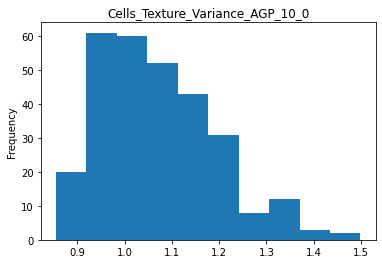

Plotting Cells_Texture_Variance_AGP_3_0:  33%|███▎      | 87/267 [00:22<00:46,  3.90it/s] 

Not normal


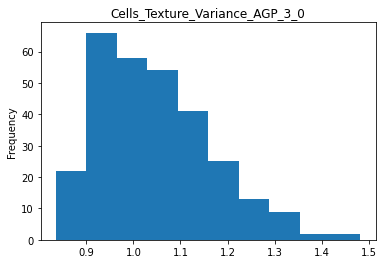

Plotting Cells_Texture_Variance_AGP_5_0:  33%|███▎      | 88/267 [00:23<00:44,  4.05it/s]

Not normal


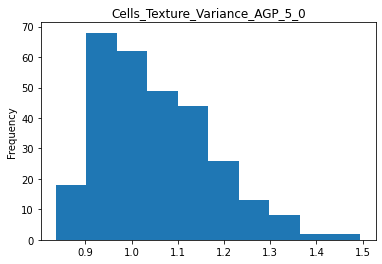

Plotting Cytoplasm_Granularity_10_AGP:  33%|███▎      | 89/267 [00:23<00:50,  3.52it/s]  

Not normal


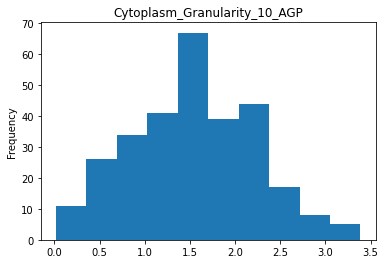

Plotting Cytoplasm_Granularity_11_AGP:  34%|███▎      | 90/267 [00:23<00:53,  3.33it/s]

Not normal


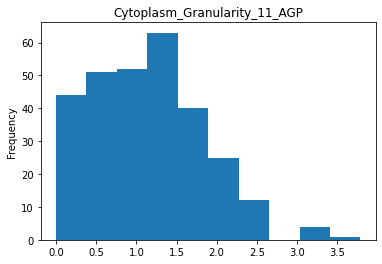

Plotting Cytoplasm_Granularity_12_AGP:  34%|███▍      | 91/267 [00:24<00:52,  3.36it/s]

Not normal


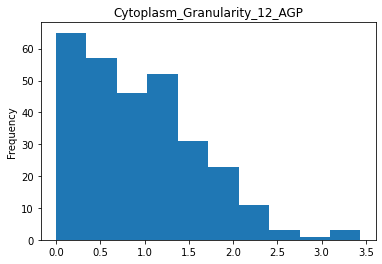

Plotting Cytoplasm_Granularity_13_AGP:  34%|███▍      | 92/267 [00:24<00:48,  3.59it/s]

Not normal


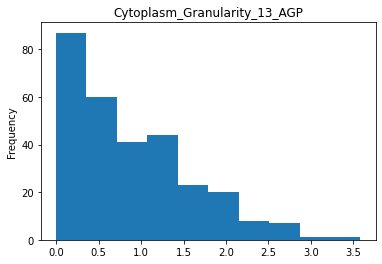

Plotting Cytoplasm_Granularity_14_AGP:  35%|███▍      | 93/267 [00:24<00:44,  3.87it/s]

Not normal


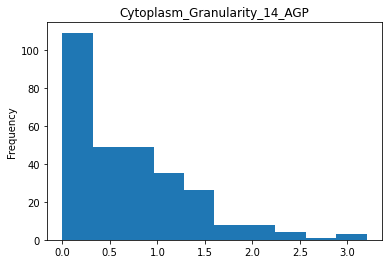

Plotting Cytoplasm_Granularity_15_AGP:  35%|███▌      | 94/267 [00:24<00:42,  4.09it/s]

Not normal


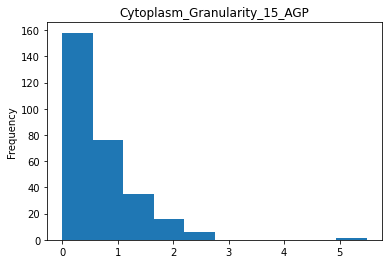

Plotting Cytoplasm_Granularity_16_AGP:  36%|███▌      | 95/267 [00:25<00:41,  4.14it/s]

Not normal


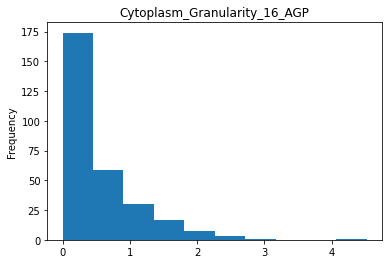

Plotting Cytoplasm_Granularity_1_AGP:  36%|███▌      | 96/267 [00:25<00:41,  4.15it/s] 

Not normal


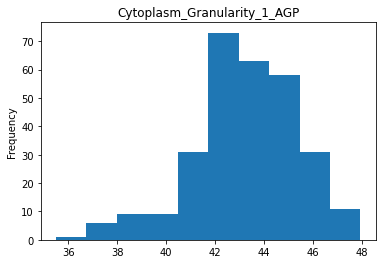

Plotting Cytoplasm_Granularity_2_AGP:  36%|███▋      | 97/267 [00:25<00:40,  4.23it/s]

Not normal


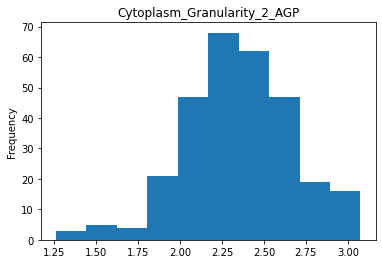

Plotting Cytoplasm_Granularity_3_AGP:  37%|███▋      | 98/267 [00:25<00:39,  4.33it/s]

Not normal


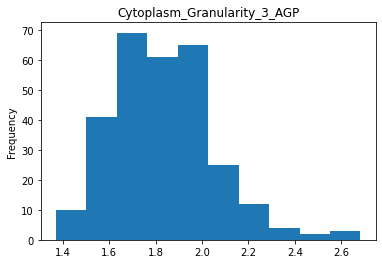

Plotting Cytoplasm_Granularity_4_AGP:  37%|███▋      | 99/267 [00:25<00:38,  4.35it/s]

Not normal


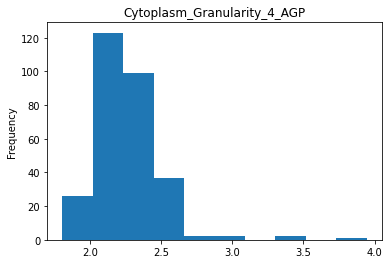

Plotting Cytoplasm_Granularity_5_AGP:  37%|███▋      | 100/267 [00:26<00:37,  4.43it/s]

Not normal


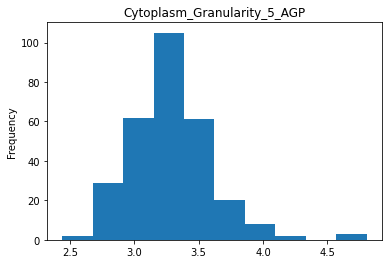

Plotting Cytoplasm_Granularity_6_AGP:  38%|███▊      | 101/267 [00:26<00:37,  4.44it/s]

Not normal


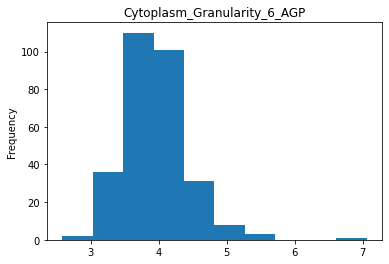

Plotting Cytoplasm_Granularity_7_AGP:  38%|███▊      | 102/267 [00:26<00:35,  4.69it/s]

Not normal


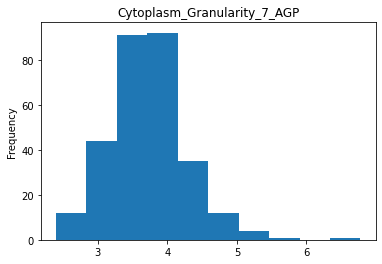

Plotting Cytoplasm_Granularity_8_AGP:  39%|███▊      | 103/267 [00:26<00:34,  4.79it/s]

Not normal


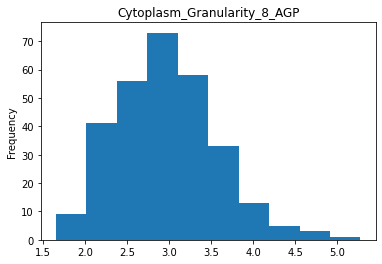

Plotting Cytoplasm_Granularity_9_AGP:  39%|███▉      | 104/267 [00:26<00:34,  4.68it/s]

Not normal


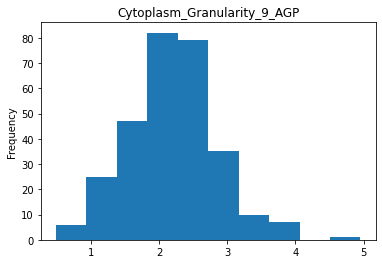

Plotting Cytoplasm_Intensity_IntegratedIntensityEdge_AGP:  39%|███▉      | 105/267 [00:27<00:33,  4.77it/s]

Not normal


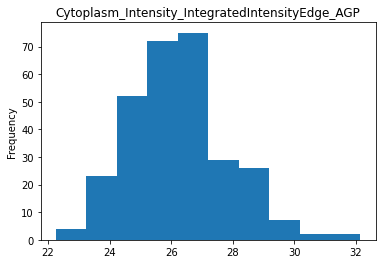

Plotting Cytoplasm_Intensity_IntegratedIntensity_AGP:  40%|███▉      | 106/267 [00:27<00:39,  4.08it/s]    

Not normal


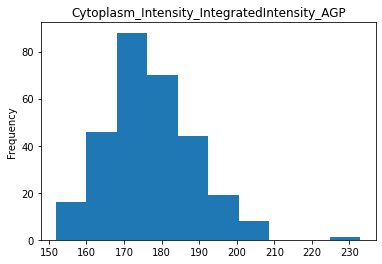

Plotting Cytoplasm_Intensity_LowerQuartileIntensity_AGP:  40%|████      | 107/267 [00:27<00:43,  3.66it/s]

Not normal


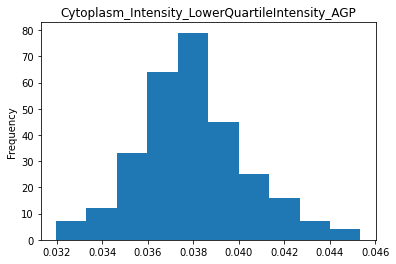

Plotting Cytoplasm_Intensity_MADIntensity_AGP:  40%|████      | 108/267 [00:28<00:46,  3.43it/s]          

Not normal


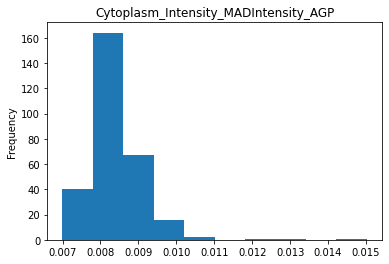

Plotting Cytoplasm_Intensity_MassDisplacement_AGP:  41%|████      | 109/267 [00:28<00:42,  3.69it/s]

Not normal


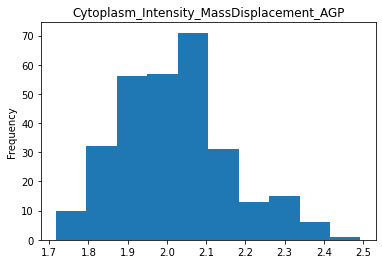

Plotting Cytoplasm_Intensity_MaxIntensityEdge_AGP:  41%|████      | 110/267 [00:28<00:40,  3.85it/s]

Not normal


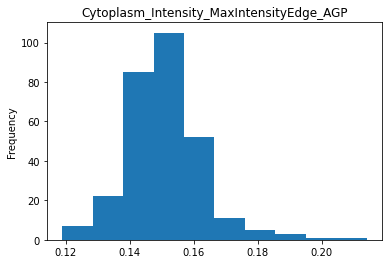

Plotting Cytoplasm_Intensity_MaxIntensity_AGP:  42%|████▏     | 111/267 [00:28<00:37,  4.19it/s]    

Not normal


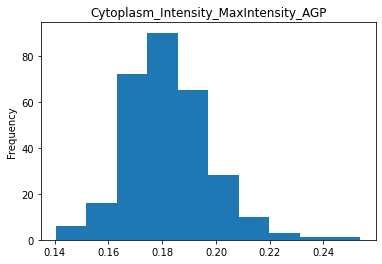

Plotting Cytoplasm_Intensity_MeanIntensityEdge_AGP:  42%|████▏     | 112/267 [00:29<00:34,  4.52it/s]

Not normal


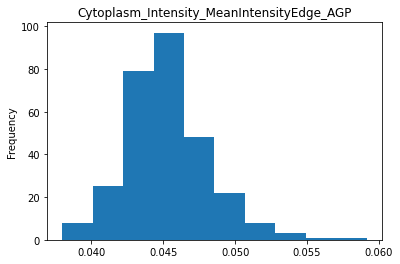

Plotting Cytoplasm_Intensity_MeanIntensity_AGP:  42%|████▏     | 113/267 [00:29<00:36,  4.23it/s]    

Not normal


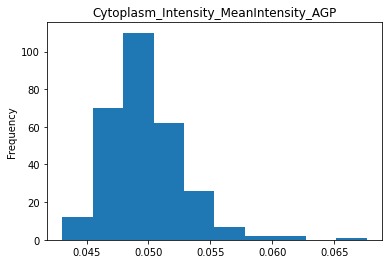

Plotting Cytoplasm_Intensity_MedianIntensity_AGP:  43%|████▎     | 114/267 [00:30<00:58,  2.63it/s]

Not normal


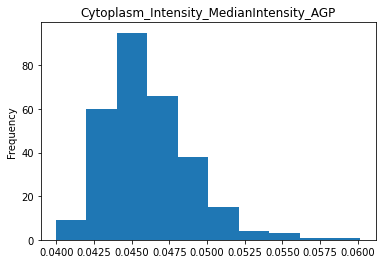

Plotting Cytoplasm_Intensity_MinIntensityEdge_AGP:  43%|████▎     | 115/267 [00:30<00:59,  2.56it/s]

Not normal


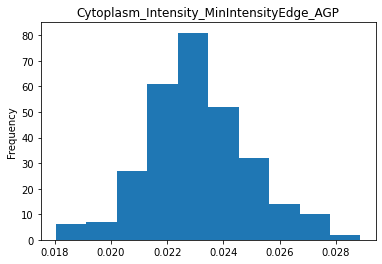

Plotting Cytoplasm_Intensity_MinIntensity_AGP:  43%|████▎     | 116/267 [00:30<00:51,  2.92it/s]    

Not normal


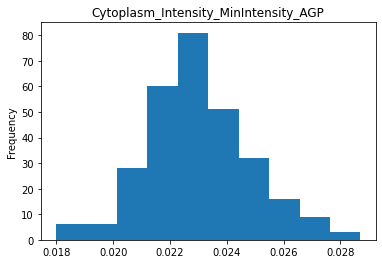

Plotting Cytoplasm_Intensity_StdIntensityEdge_AGP:  44%|████▍     | 117/267 [00:30<00:46,  3.25it/s]

Not normal


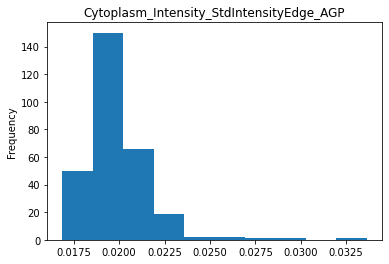

Plotting Cytoplasm_Intensity_StdIntensity_AGP:  44%|████▍     | 118/267 [00:31<00:42,  3.50it/s]    

Not normal


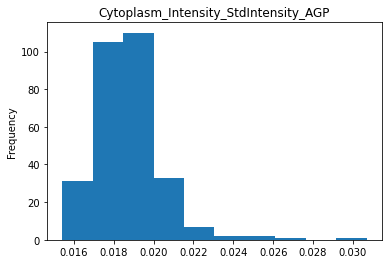

Plotting Cytoplasm_Intensity_UpperQuartileIntensity_AGP:  45%|████▍     | 119/267 [00:31<00:40,  3.65it/s]

Not normal


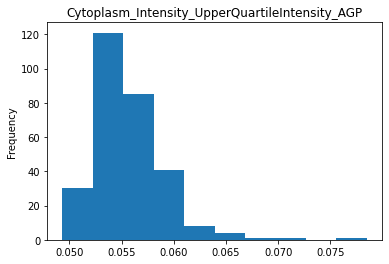

Plotting Cytoplasm_Location_CenterMassIntensity_X_AGP:  45%|████▍     | 120/267 [00:31<00:37,  3.96it/s]  

Not normal


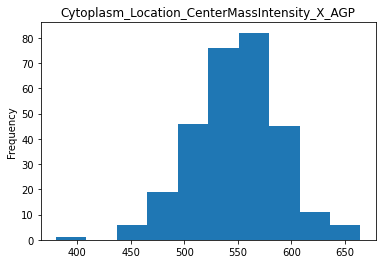

Plotting Cytoplasm_Location_CenterMassIntensity_Y_AGP:  45%|████▌     | 121/267 [00:31<00:36,  3.98it/s]

Not normal


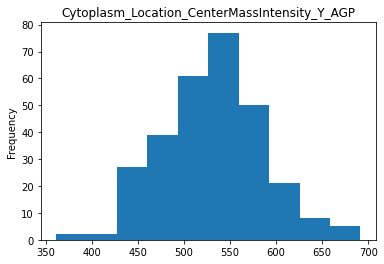

Plotting Cytoplasm_Location_MaxIntensity_X_AGP:  46%|████▌     | 122/267 [00:32<00:35,  4.11it/s]       

Not normal


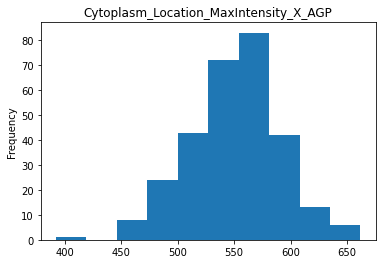

Plotting Cytoplasm_Location_MaxIntensity_Y_AGP:  46%|████▌     | 123/267 [00:32<00:35,  4.10it/s]

Not normal


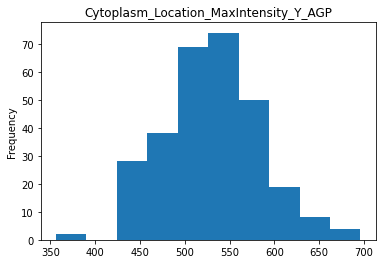

Plotting Cytoplasm_RadialDistribution_FracAtD_AGP_1of4:  46%|████▋     | 124/267 [00:32<00:35,  4.07it/s]

Not normal


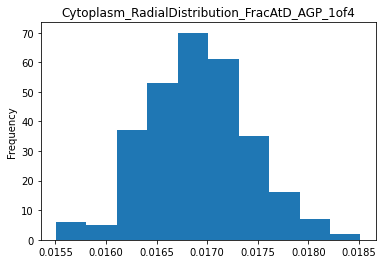

Plotting Cytoplasm_RadialDistribution_FracAtD_AGP_2of4:  47%|████▋     | 125/267 [00:32<00:34,  4.11it/s]

Not normal


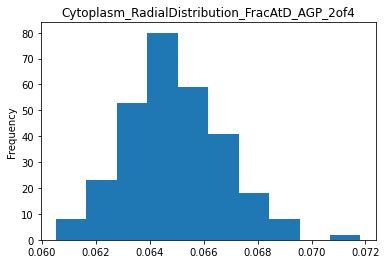

Plotting Cytoplasm_RadialDistribution_FracAtD_AGP_3of4:  47%|████▋     | 126/267 [00:32<00:34,  4.13it/s]

Not normal


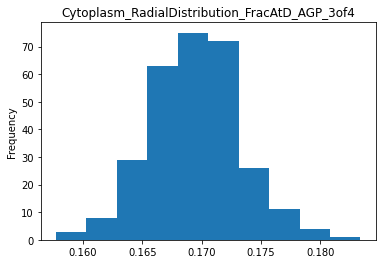

Plotting Cytoplasm_RadialDistribution_FracAtD_AGP_4of4:  48%|████▊     | 127/267 [00:33<00:33,  4.20it/s]

Not normal


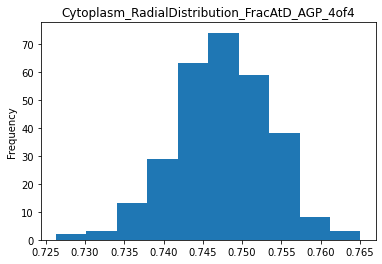

Plotting Cytoplasm_RadialDistribution_MeanFrac_AGP_1of4:  48%|████▊     | 128/267 [00:33<00:33,  4.16it/s]

Not normal


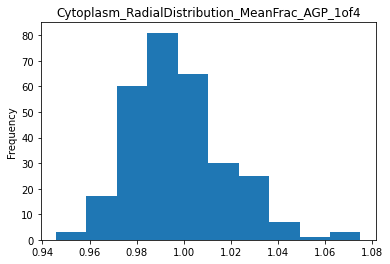

Plotting Cytoplasm_RadialDistribution_MeanFrac_AGP_2of4:  48%|████▊     | 129/267 [00:33<00:33,  4.08it/s]

Not normal


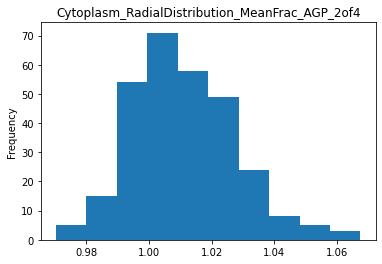

Plotting Cytoplasm_RadialDistribution_MeanFrac_AGP_3of4:  49%|████▊     | 130/267 [00:33<00:32,  4.21it/s]

Not normal


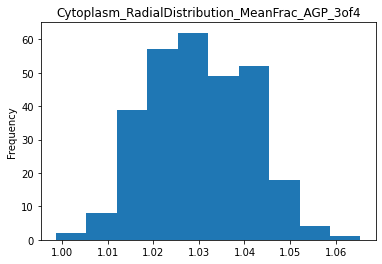

Plotting Cytoplasm_RadialDistribution_MeanFrac_AGP_4of4:  49%|████▉     | 131/267 [00:34<00:32,  4.22it/s]

Not normal


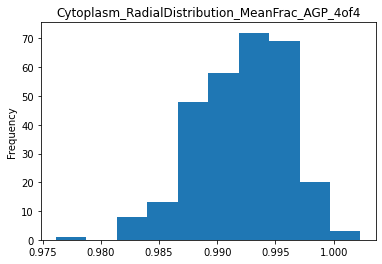

Plotting Cytoplasm_RadialDistribution_RadialCV_AGP_1of4:  49%|████▉     | 132/267 [00:34<00:30,  4.44it/s]

Not normal


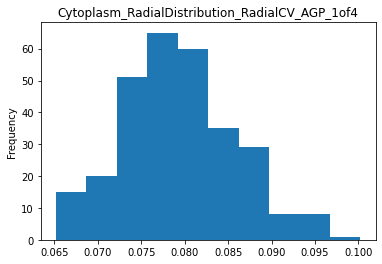

Plotting Cytoplasm_RadialDistribution_RadialCV_AGP_2of4:  50%|████▉     | 133/267 [00:34<00:29,  4.55it/s]

Not normal


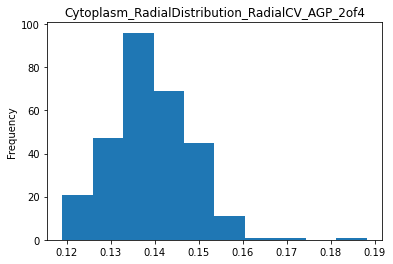

Plotting Cytoplasm_RadialDistribution_RadialCV_AGP_3of4:  50%|█████     | 134/267 [00:34<00:28,  4.73it/s]

Not normal


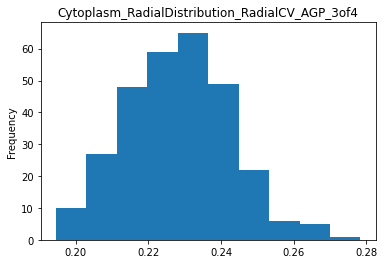

Plotting Cytoplasm_RadialDistribution_RadialCV_AGP_4of4:  51%|█████     | 135/267 [00:34<00:27,  4.83it/s]

Not normal


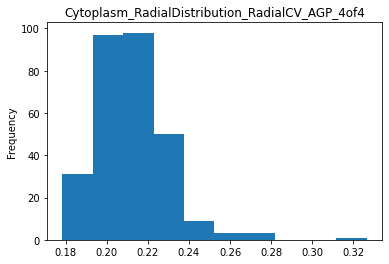

Plotting Cytoplasm_Texture_AngularSecondMoment_AGP_10_0:  51%|█████     | 136/267 [00:35<00:27,  4.69it/s]

Not normal


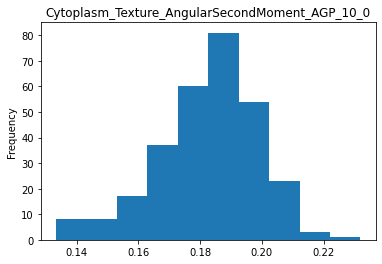

Plotting Cytoplasm_Texture_AngularSecondMoment_AGP_3_0:  51%|█████▏    | 137/267 [00:35<00:28,  4.59it/s] 

Not normal


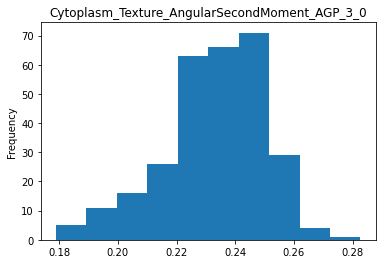

Plotting Cytoplasm_Texture_AngularSecondMoment_AGP_5_0:  52%|█████▏    | 138/267 [00:35<00:28,  4.55it/s]

Not normal


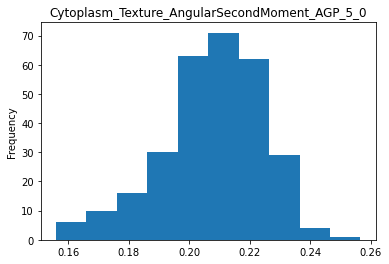

Plotting Cytoplasm_Texture_Contrast_AGP_10_0:  52%|█████▏    | 139/267 [00:35<00:28,  4.46it/s]          

Not normal


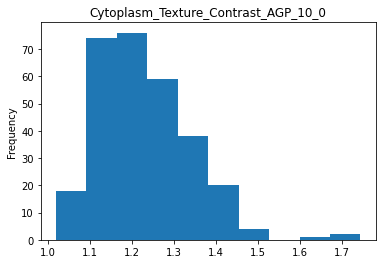

Plotting Cytoplasm_Texture_Contrast_AGP_3_0:  52%|█████▏    | 140/267 [00:36<00:29,  4.32it/s] 

Not normal


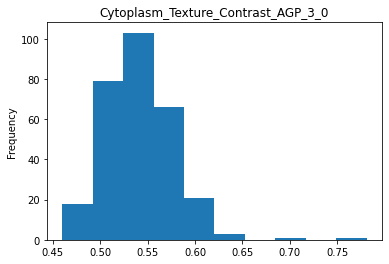

Plotting Cytoplasm_Texture_Contrast_AGP_5_0:  53%|█████▎    | 141/267 [00:36<00:29,  4.23it/s]

Not normal


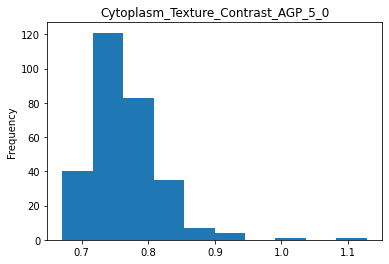

Plotting Cytoplasm_Texture_Correlation_AGP_10_0:  53%|█████▎    | 142/267 [00:36<00:29,  4.30it/s]

Not normal


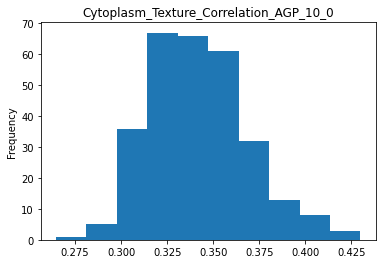

Plotting Cytoplasm_Texture_Correlation_AGP_3_0:  54%|█████▎    | 143/267 [00:36<00:29,  4.24it/s] 

Not normal


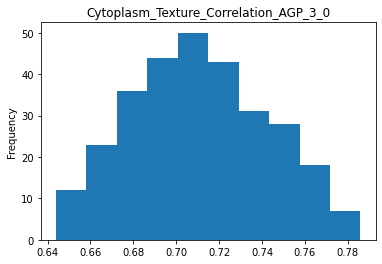

Plotting Cytoplasm_Texture_Correlation_AGP_5_0:  54%|█████▍    | 144/267 [00:37<00:28,  4.33it/s]

Not normal


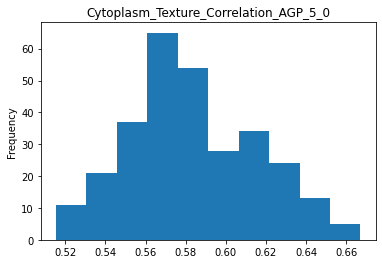

Plotting Cytoplasm_Texture_DifferenceEntropy_AGP_10_0:  54%|█████▍    | 145/267 [00:37<00:33,  3.59it/s]

Not normal


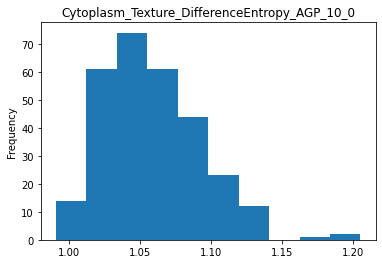

Plotting Cytoplasm_Texture_DifferenceEntropy_AGP_3_0:  55%|█████▍    | 146/267 [00:37<00:31,  3.83it/s] 

Not normal


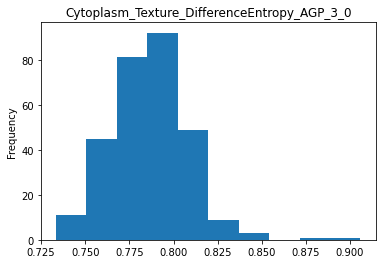

Plotting Cytoplasm_Texture_DifferenceEntropy_AGP_5_0:  55%|█████▌    | 147/267 [00:37<00:29,  4.05it/s]

Not normal


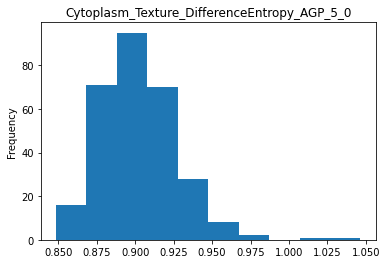

Plotting Cytoplasm_Texture_DifferenceVariance_AGP_10_0:  55%|█████▌    | 148/267 [00:38<00:28,  4.12it/s]

Not normal


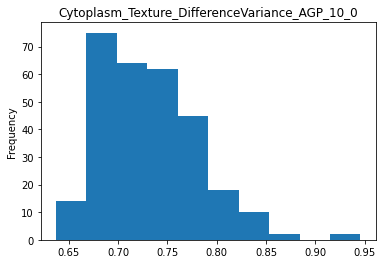

Plotting Cytoplasm_Texture_DifferenceVariance_AGP_3_0:  56%|█████▌    | 149/267 [00:38<00:29,  3.98it/s] 

Not normal


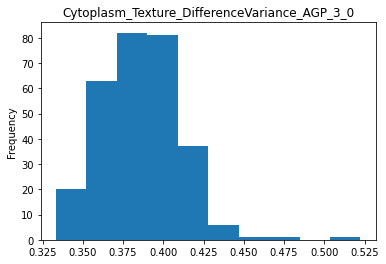

Plotting Cytoplasm_Texture_DifferenceVariance_AGP_5_0:  56%|█████▌    | 150/267 [00:38<00:32,  3.57it/s]

Not normal


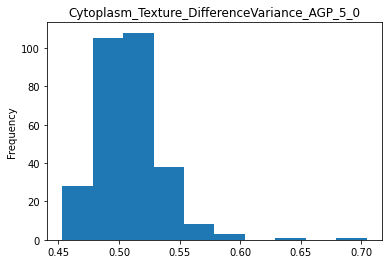

Plotting Cytoplasm_Texture_Entropy_AGP_10_0:  57%|█████▋    | 151/267 [00:38<00:30,  3.75it/s]          

Not normal


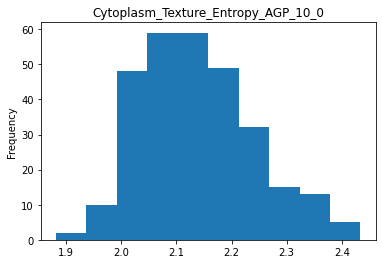

Plotting Cytoplasm_Texture_Entropy_AGP_3_0:  57%|█████▋    | 152/267 [00:39<00:28,  4.01it/s] 

Not normal


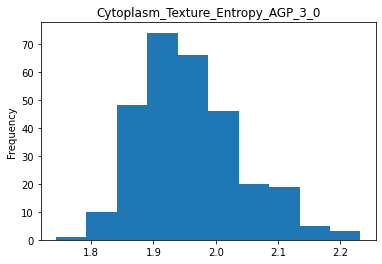

Plotting Cytoplasm_Texture_Entropy_AGP_5_0:  57%|█████▋    | 153/267 [00:39<00:26,  4.28it/s]

Not normal


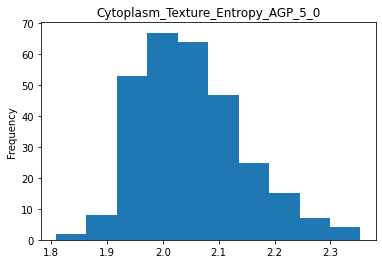

Plotting Cytoplasm_Texture_Gabor_AGP_10:  58%|█████▊    | 154/267 [00:39<00:25,  4.49it/s]   

Not normal


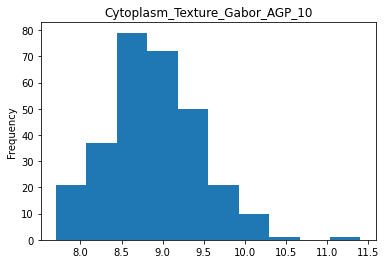

Plotting Cytoplasm_Texture_Gabor_AGP_3:  58%|█████▊    | 155/267 [00:39<00:24,  4.61it/s] 

Not normal


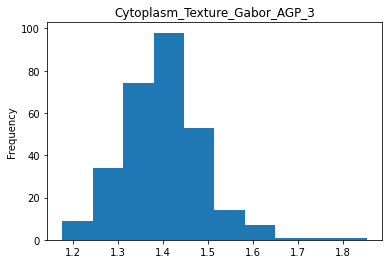

Plotting Cytoplasm_Texture_Gabor_AGP_5:  58%|█████▊    | 156/267 [00:39<00:23,  4.80it/s]

Not normal


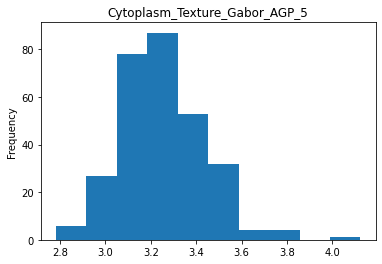

Plotting Cytoplasm_Texture_InfoMeas1_AGP_10_0:  59%|█████▉    | 157/267 [00:40<00:22,  4.95it/s]

Not normal


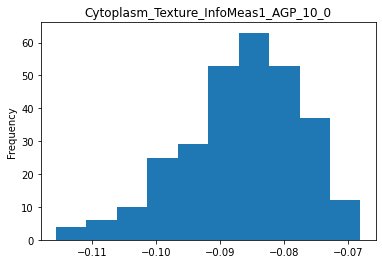

Plotting Cytoplasm_Texture_InfoMeas1_AGP_3_0:  59%|█████▉    | 158/267 [00:40<00:21,  5.06it/s] 

Not normal


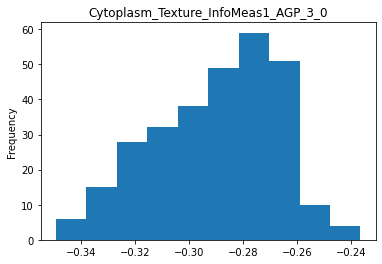

Plotting Cytoplasm_Texture_InfoMeas1_AGP_5_0:  60%|█████▉    | 159/267 [00:40<00:21,  5.11it/s]

Not normal


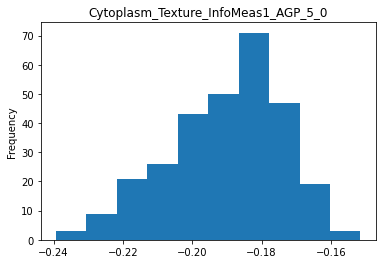

Plotting Cytoplasm_Texture_InfoMeas2_AGP_10_0:  60%|█████▉    | 160/267 [00:40<00:28,  3.73it/s]

Not normal


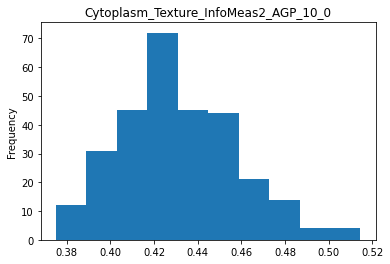

Plotting Cytoplasm_Texture_InfoMeas2_AGP_3_0:  60%|██████    | 161/267 [00:41<00:35,  2.98it/s] 

Not normal


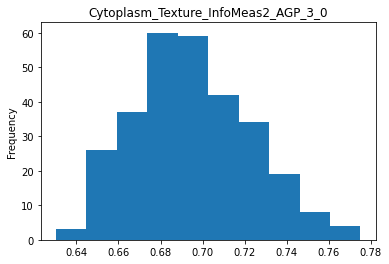

Plotting Cytoplasm_Texture_InfoMeas2_AGP_5_0:  61%|██████    | 162/267 [00:41<00:34,  3.05it/s]

Not normal


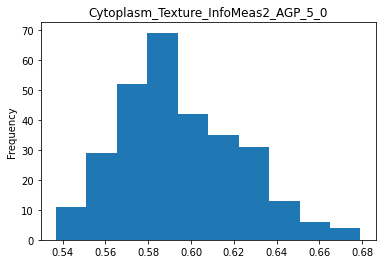

Plotting Cytoplasm_Texture_InverseDifferenceMoment_AGP_10_0:  61%|██████    | 163/267 [00:42<00:40,  2.59it/s]

Not normal


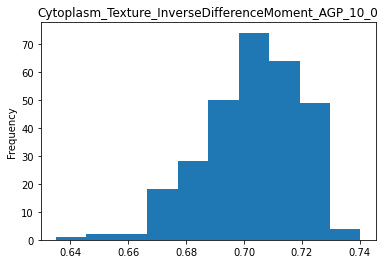

Plotting Cytoplasm_Texture_InverseDifferenceMoment_AGP_3_0:  61%|██████▏   | 164/267 [00:42<00:41,  2.50it/s] 

Not normal


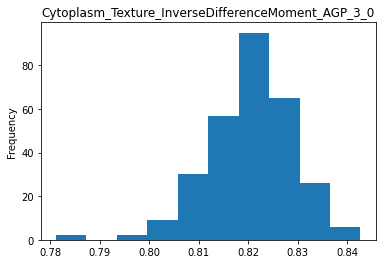

Plotting Cytoplasm_Texture_InverseDifferenceMoment_AGP_5_0:  62%|██████▏   | 165/267 [00:43<00:40,  2.54it/s]

Not normal


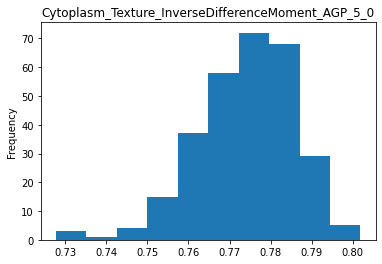

Plotting Cytoplasm_Texture_SumAverage_AGP_10_0:  62%|██████▏   | 166/267 [00:43<00:43,  2.33it/s]            

Not normal


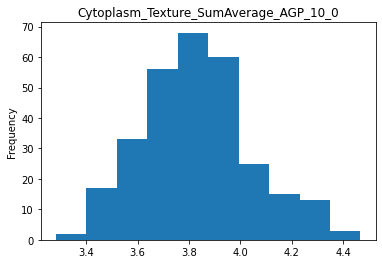

Plotting Cytoplasm_Texture_SumAverage_AGP_3_0:  63%|██████▎   | 167/267 [00:44<00:43,  2.30it/s] 

Not normal


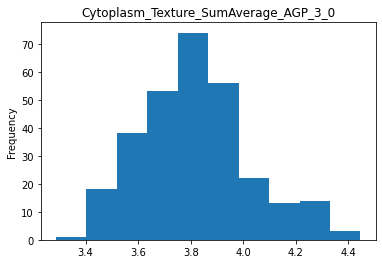

Plotting Cytoplasm_Texture_SumAverage_AGP_5_0:  63%|██████▎   | 168/267 [00:44<00:44,  2.24it/s]

Not normal


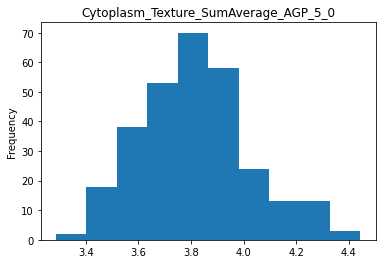

Plotting Cytoplasm_Texture_SumEntropy_AGP_10_0:  63%|██████▎   | 169/267 [00:44<00:41,  2.37it/s]

Not normal


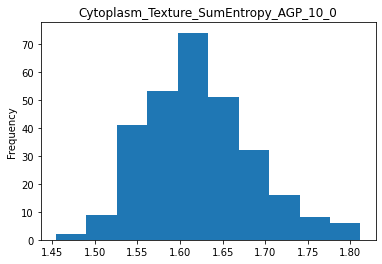

Plotting Cytoplasm_Texture_SumEntropy_AGP_3_0:  64%|██████▎   | 170/267 [00:45<00:34,  2.78it/s] 

Not normal


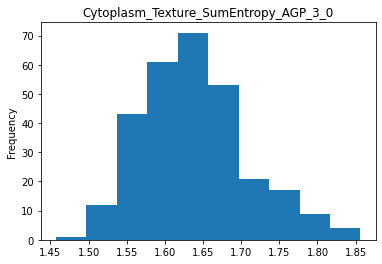

Plotting Cytoplasm_Texture_SumEntropy_AGP_5_0:  64%|██████▍   | 171/267 [00:45<00:30,  3.18it/s]

Not normal


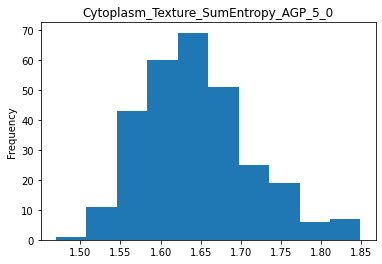

Plotting Cytoplasm_Texture_SumVariance_AGP_10_0:  64%|██████▍   | 172/267 [00:45<00:26,  3.55it/s]

Not normal


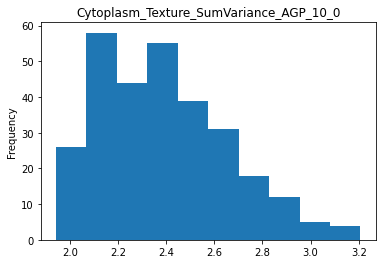

Plotting Cytoplasm_Texture_SumVariance_AGP_3_0:  65%|██████▍   | 173/267 [00:45<00:28,  3.33it/s] 

Not normal


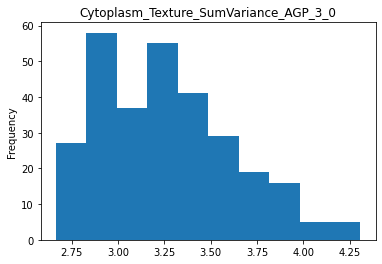

Plotting Cytoplasm_Texture_SumVariance_AGP_5_0:  65%|██████▌   | 174/267 [00:46<00:25,  3.71it/s]

Not normal


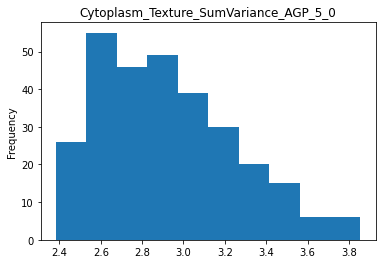

Plotting Cytoplasm_Texture_Variance_AGP_10_0:  66%|██████▌   | 175/267 [00:46<00:22,  4.03it/s]  

Not normal


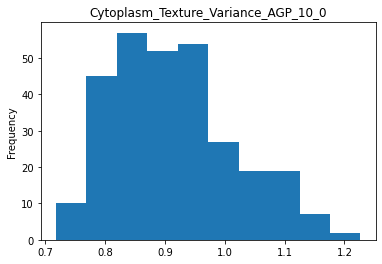

Plotting Cytoplasm_Texture_Variance_AGP_3_0:  66%|██████▌   | 176/267 [00:46<00:20,  4.34it/s] 

Not normal


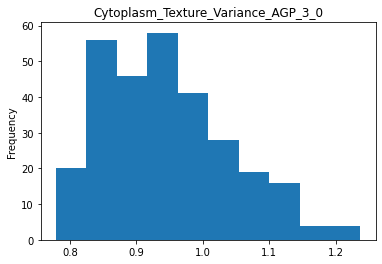

Plotting Cytoplasm_Texture_Variance_AGP_5_0:  66%|██████▋   | 177/267 [00:46<00:19,  4.58it/s]

Not normal


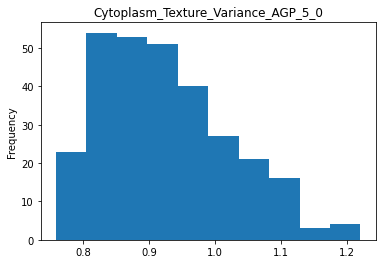

Plotting Nuclei_Granularity_10_AGP:  67%|██████▋   | 178/267 [00:46<00:18,  4.85it/s]         

Not normal


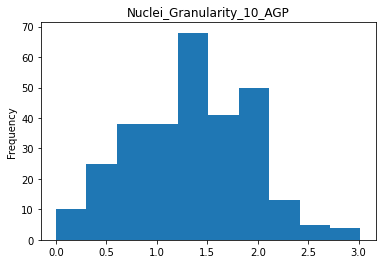

Plotting Nuclei_Granularity_11_AGP:  67%|██████▋   | 179/267 [00:47<00:17,  4.89it/s]

Not normal


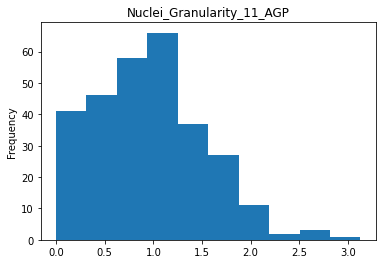

Plotting Nuclei_Granularity_12_AGP:  67%|██████▋   | 180/267 [00:47<00:22,  3.83it/s]

Not normal


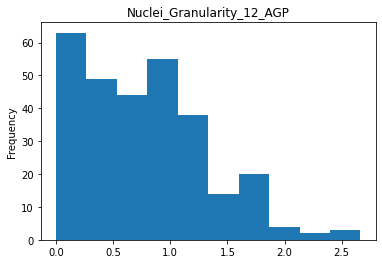

Plotting Nuclei_Granularity_13_AGP:  68%|██████▊   | 181/267 [00:47<00:23,  3.63it/s]

Not normal


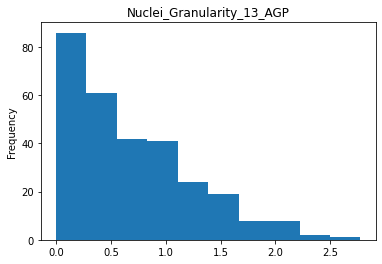

Plotting Nuclei_Granularity_14_AGP:  68%|██████▊   | 182/267 [00:48<00:25,  3.39it/s]

Not normal


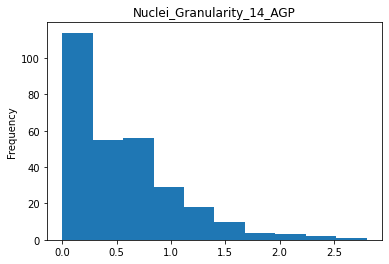

Plotting Nuclei_Granularity_15_AGP:  69%|██████▊   | 183/267 [00:48<00:23,  3.57it/s]

Not normal


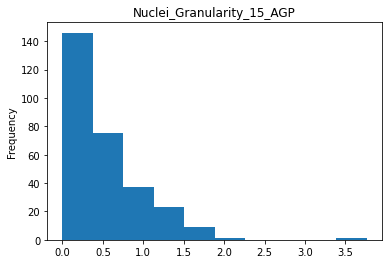

Plotting Nuclei_Granularity_16_AGP:  69%|██████▉   | 184/267 [00:48<00:21,  3.90it/s]

Not normal


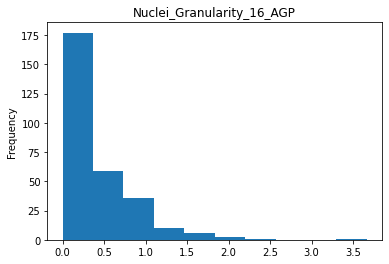

Plotting Nuclei_Granularity_1_AGP:  69%|██████▉   | 185/267 [00:48<00:19,  4.17it/s] 

Not normal


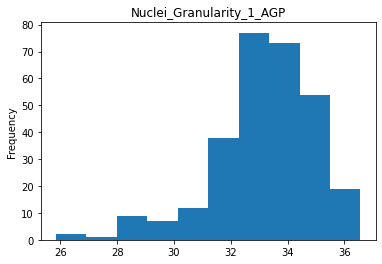

Plotting Nuclei_Granularity_2_AGP:  70%|██████▉   | 186/267 [00:49<00:20,  3.90it/s]

Not normal


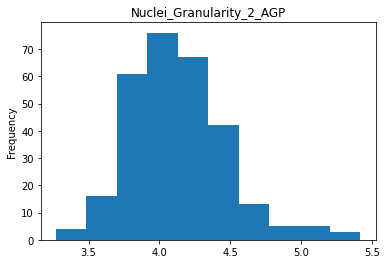

Plotting Nuclei_Granularity_3_AGP:  70%|███████   | 187/267 [00:49<00:26,  3.06it/s]

Not normal


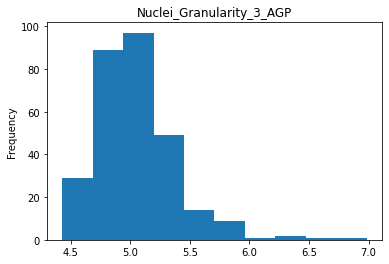

Plotting Nuclei_Granularity_4_AGP:  70%|███████   | 188/267 [00:49<00:25,  3.12it/s]

Not normal


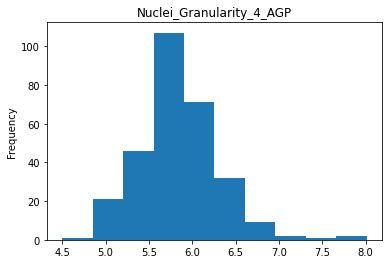

Plotting Nuclei_Granularity_5_AGP:  71%|███████   | 189/267 [00:50<00:26,  2.94it/s]

Not normal


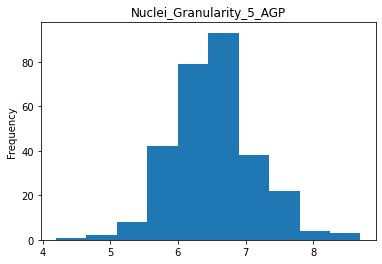

Plotting Nuclei_Granularity_6_AGP:  71%|███████   | 190/267 [00:50<00:29,  2.61it/s]

Not normal


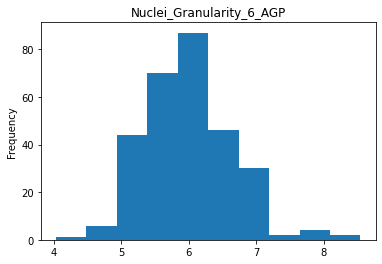

Plotting Nuclei_Granularity_7_AGP:  72%|███████▏  | 191/267 [00:51<00:28,  2.63it/s]

Not normal


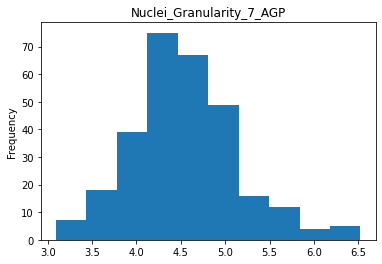

Plotting Nuclei_Granularity_8_AGP:  72%|███████▏  | 192/267 [00:51<00:31,  2.40it/s]

Not normal


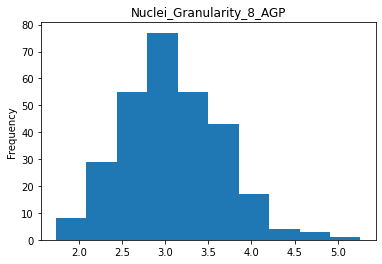

Plotting Nuclei_Granularity_9_AGP:  72%|███████▏  | 193/267 [00:52<00:31,  2.31it/s]

Not normal


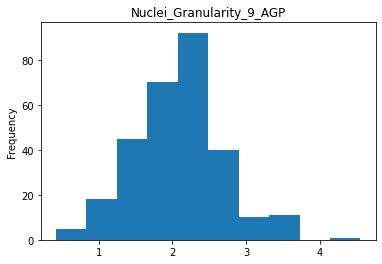

Plotting Nuclei_Intensity_IntegratedIntensityEdge_AGP:  73%|███████▎  | 194/267 [00:52<00:30,  2.42it/s]

Not normal


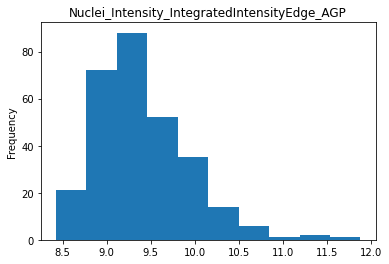

Plotting Nuclei_Intensity_IntegratedIntensity_AGP:  73%|███████▎  | 195/267 [00:52<00:26,  2.68it/s]    

Not normal


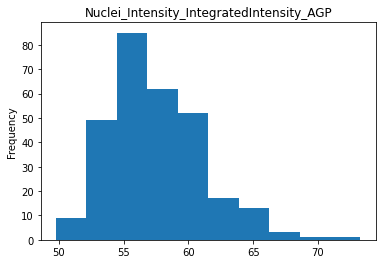

Plotting Nuclei_Intensity_LowerQuartileIntensity_AGP:  73%|███████▎  | 196/267 [00:53<00:26,  2.69it/s]

Not normal


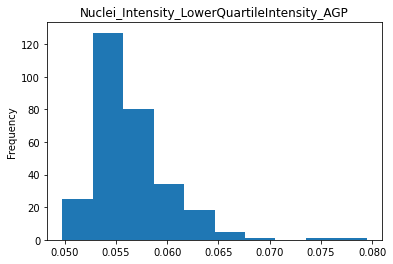

Plotting Nuclei_Intensity_MADIntensity_AGP:  74%|███████▍  | 197/267 [00:53<00:26,  2.69it/s]          

Not normal


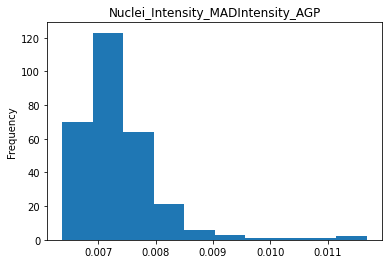

Plotting Nuclei_Intensity_MassDisplacement_AGP:  74%|███████▍  | 198/267 [00:53<00:24,  2.81it/s]

Not normal


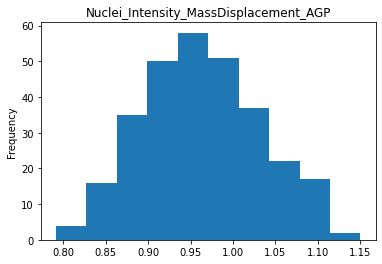

Plotting Nuclei_Intensity_MaxIntensityEdge_AGP:  75%|███████▍  | 199/267 [00:54<00:24,  2.80it/s]

Not normal


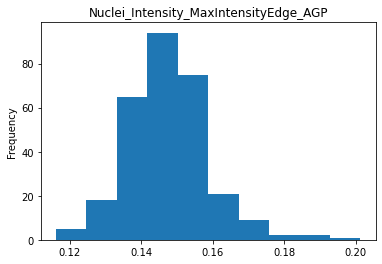

Plotting Nuclei_Intensity_MaxIntensity_AGP:  75%|███████▍  | 200/267 [00:54<00:24,  2.74it/s]    

Not normal


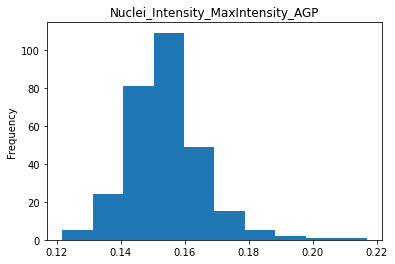

Plotting Nuclei_Intensity_MeanIntensityEdge_AGP:  75%|███████▌  | 201/267 [00:54<00:25,  2.60it/s]

Not normal


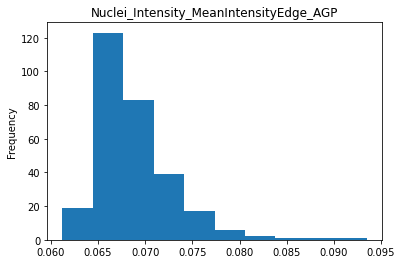

Plotting Nuclei_Intensity_MeanIntensity_AGP:  76%|███████▌  | 202/267 [00:55<00:24,  2.66it/s]    

Not normal


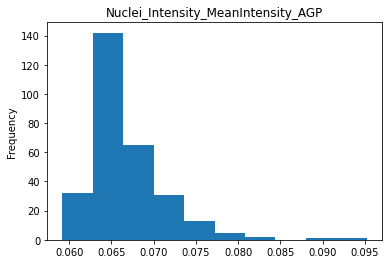

Plotting Nuclei_Intensity_MedianIntensity_AGP:  76%|███████▌  | 203/267 [00:55<00:23,  2.72it/s]

Not normal


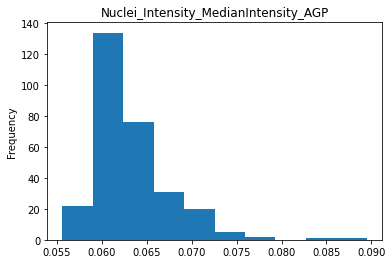

Plotting Nuclei_Intensity_MinIntensityEdge_AGP:  76%|███████▋  | 204/267 [00:56<00:32,  1.96it/s]

Not normal


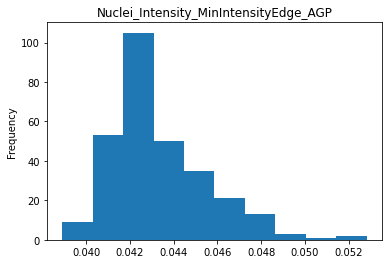

Plotting Nuclei_Intensity_MinIntensity_AGP:  77%|███████▋  | 205/267 [00:57<00:32,  1.90it/s]    

Not normal


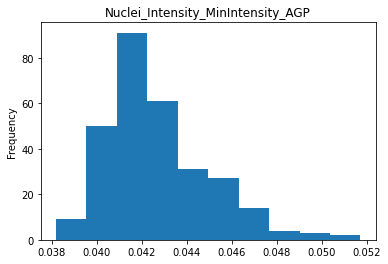

Plotting Nuclei_Intensity_StdIntensityEdge_AGP:  77%|███████▋  | 206/267 [00:57<00:29,  2.04it/s]

Not normal


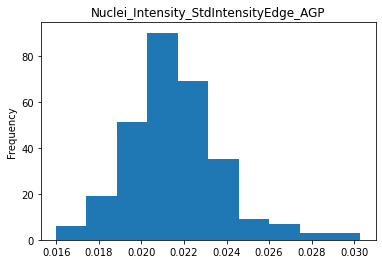

Plotting Nuclei_Intensity_StdIntensity_AGP:  78%|███████▊  | 207/267 [00:57<00:27,  2.16it/s]    

Not normal


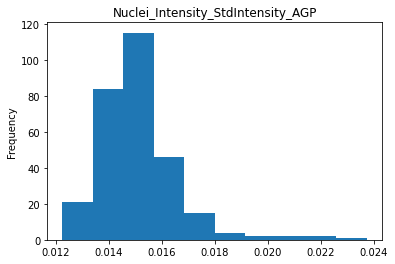

Plotting Nuclei_Intensity_UpperQuartileIntensity_AGP:  78%|███████▊  | 208/267 [00:58<00:27,  2.14it/s]

Not normal


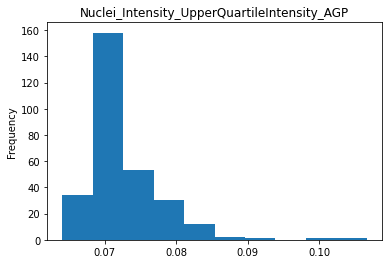

Plotting Nuclei_Location_CenterMassIntensity_X_AGP:  78%|███████▊  | 209/267 [00:58<00:25,  2.24it/s]  

Not normal


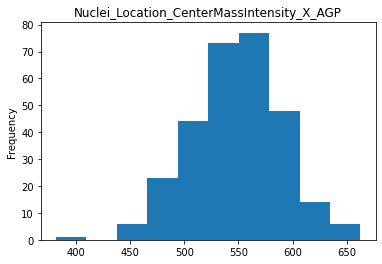

Plotting Nuclei_Location_CenterMassIntensity_Y_AGP:  79%|███████▊  | 210/267 [00:59<00:22,  2.51it/s]

Not normal


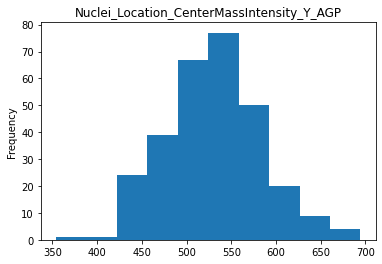

Plotting Nuclei_Location_MaxIntensity_X_AGP:  79%|███████▉  | 211/267 [00:59<00:20,  2.67it/s]       

Not normal


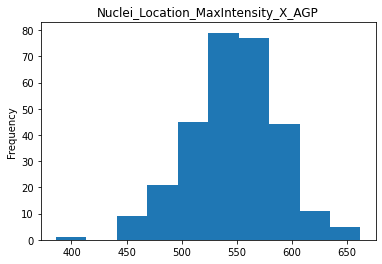

Plotting Nuclei_Location_MaxIntensity_Y_AGP:  79%|███████▉  | 212/267 [00:59<00:17,  3.12it/s]

Not normal


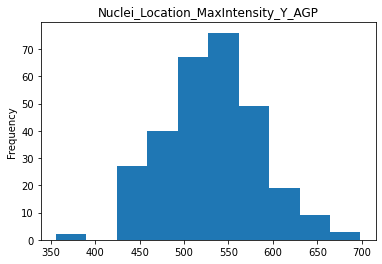

Plotting Nuclei_RadialDistribution_FracAtD_AGP_1of4:  80%|███████▉  | 213/267 [00:59<00:15,  3.48it/s]

Not normal


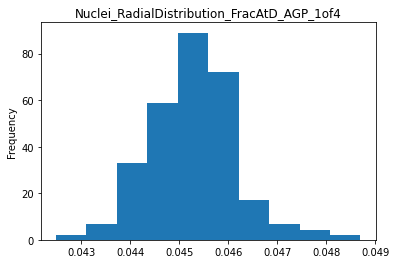

Plotting Nuclei_RadialDistribution_FracAtD_AGP_2of4:  80%|████████  | 214/267 [00:59<00:13,  3.89it/s]

Not normal


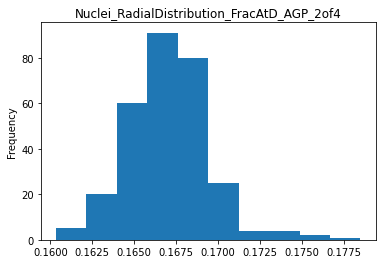

Plotting Nuclei_RadialDistribution_FracAtD_AGP_3of4:  81%|████████  | 215/267 [01:00<00:12,  4.23it/s]

Not normal


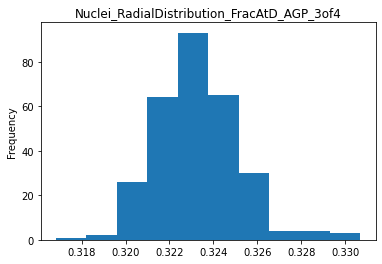

Plotting Nuclei_RadialDistribution_FracAtD_AGP_4of4:  81%|████████  | 216/267 [01:00<00:11,  4.49it/s]

Not normal


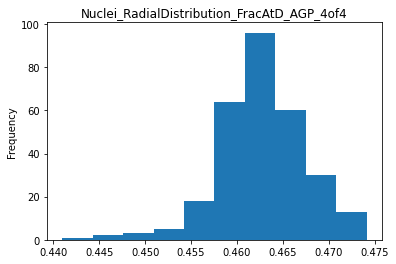

Plotting Nuclei_RadialDistribution_MeanFrac_AGP_1of4:  81%|████████▏ | 217/267 [01:00<00:14,  3.43it/s]

Not normal


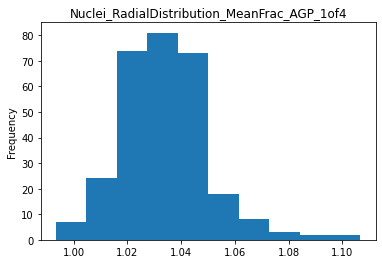

Plotting Nuclei_RadialDistribution_MeanFrac_AGP_2of4:  82%|████████▏ | 218/267 [01:01<00:15,  3.12it/s]

Not normal


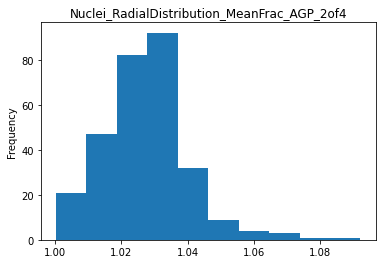

Plotting Nuclei_RadialDistribution_MeanFrac_AGP_3of4:  82%|████████▏ | 219/267 [01:01<00:15,  3.03it/s]

Not normal


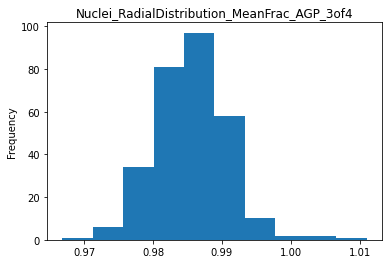

Plotting Nuclei_RadialDistribution_MeanFrac_AGP_4of4:  82%|████████▏ | 220/267 [01:01<00:17,  2.75it/s]

Not normal


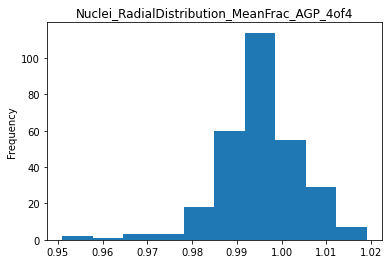

Plotting Nuclei_RadialDistribution_RadialCV_AGP_1of4:  83%|████████▎ | 221/267 [01:02<00:16,  2.75it/s]

Not normal


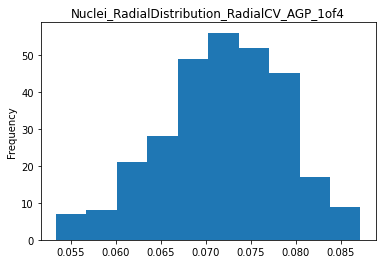

Plotting Nuclei_RadialDistribution_RadialCV_AGP_2of4:  83%|████████▎ | 222/267 [01:02<00:15,  2.92it/s]

Not normal


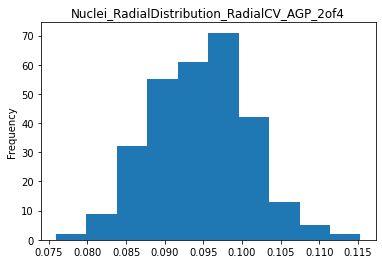

Plotting Nuclei_RadialDistribution_RadialCV_AGP_3of4:  84%|████████▎ | 223/267 [01:02<00:13,  3.32it/s]

Not normal


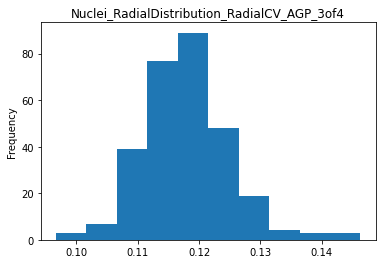

Plotting Nuclei_RadialDistribution_RadialCV_AGP_4of4:  84%|████████▍ | 224/267 [01:02<00:11,  3.77it/s]

Not normal


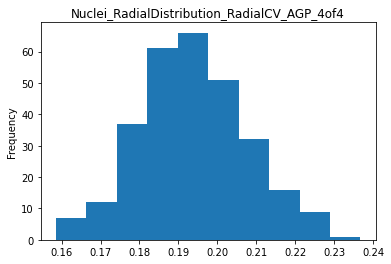

Plotting Nuclei_Texture_AngularSecondMoment_AGP_10_0:  84%|████████▍ | 225/267 [01:03<00:10,  4.01it/s]

Not normal


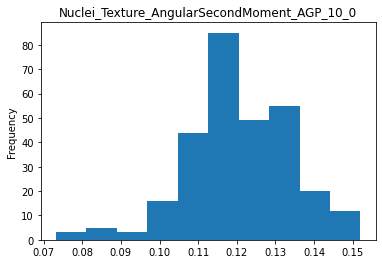

Plotting Nuclei_Texture_AngularSecondMoment_AGP_3_0:  85%|████████▍ | 226/267 [01:03<00:09,  4.19it/s] 

Not normal


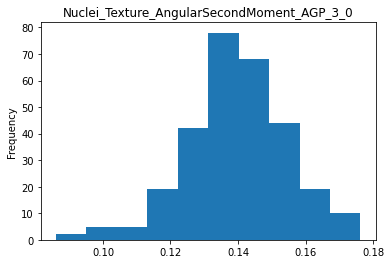

Plotting Nuclei_Texture_AngularSecondMoment_AGP_5_0:  85%|████████▌ | 227/267 [01:03<00:09,  4.42it/s]

Not normal


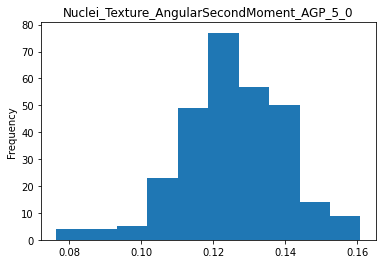

Plotting Nuclei_Texture_Contrast_AGP_10_0:  85%|████████▌ | 228/267 [01:03<00:08,  4.55it/s]          

Not normal


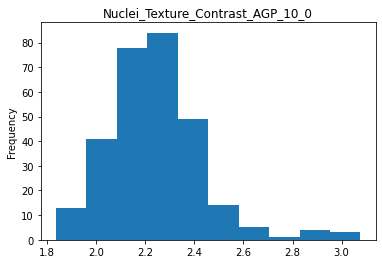

Plotting Nuclei_Texture_Contrast_AGP_3_0:  86%|████████▌ | 229/267 [01:03<00:08,  4.66it/s] 

Not normal


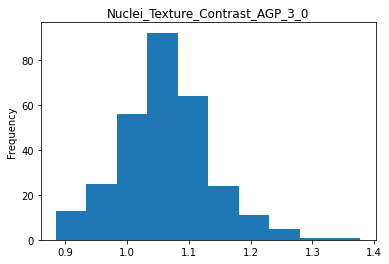

Plotting Nuclei_Texture_Contrast_AGP_5_0:  86%|████████▌ | 230/267 [01:04<00:07,  4.87it/s]

Not normal


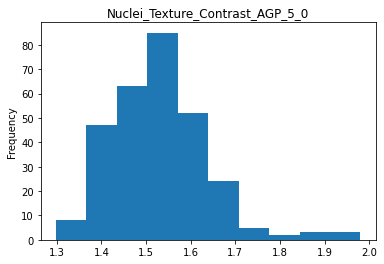

Plotting Nuclei_Texture_Correlation_AGP_10_0:  87%|████████▋ | 231/267 [01:04<00:07,  4.80it/s]

Not normal


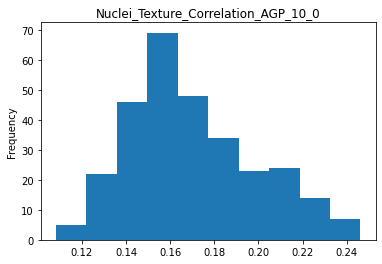

Plotting Nuclei_Texture_Correlation_AGP_3_0:  87%|████████▋ | 232/267 [01:04<00:07,  4.84it/s] 

Not normal


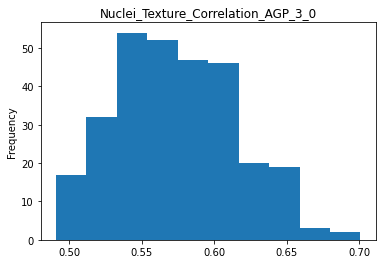

Plotting Nuclei_Texture_Correlation_AGP_5_0:  87%|████████▋ | 233/267 [01:04<00:06,  4.99it/s]

Not normal


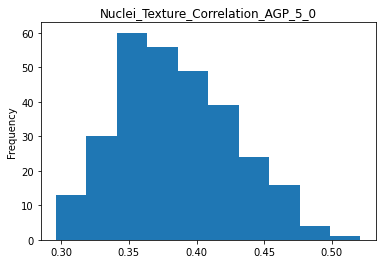

Plotting Nuclei_Texture_DifferenceEntropy_AGP_10_0:  88%|████████▊ | 234/267 [01:05<00:07,  4.44it/s]

Not normal


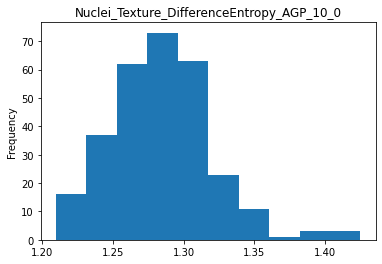

Plotting Nuclei_Texture_DifferenceEntropy_AGP_3_0:  88%|████████▊ | 235/267 [01:05<00:08,  3.84it/s] 

Not normal


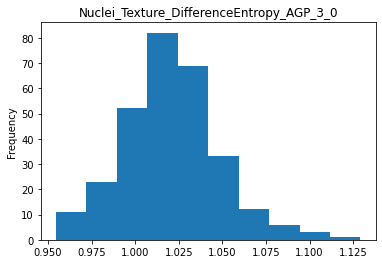

Plotting Nuclei_Texture_DifferenceEntropy_AGP_5_0:  88%|████████▊ | 236/267 [01:05<00:07,  4.10it/s]

Not normal


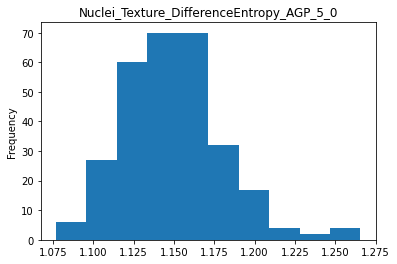

Plotting Nuclei_Texture_DifferenceVariance_AGP_10_0:  89%|████████▉ | 237/267 [01:05<00:07,  4.25it/s]

Not normal


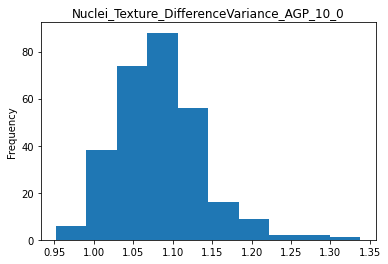

Plotting Nuclei_Texture_DifferenceVariance_AGP_3_0:  89%|████████▉ | 238/267 [01:06<00:06,  4.46it/s] 

Not normal


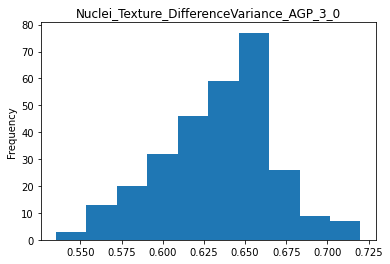

Plotting Nuclei_Texture_DifferenceVariance_AGP_5_0:  90%|████████▉ | 239/267 [01:06<00:06,  4.58it/s]

Not normal


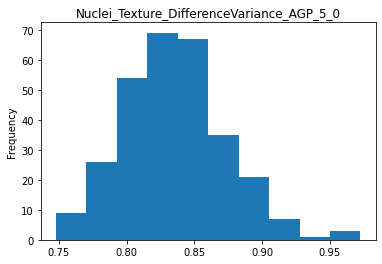

Plotting Nuclei_Texture_Entropy_AGP_10_0:  90%|████████▉ | 240/267 [01:06<00:05,  4.82it/s]          

Not normal


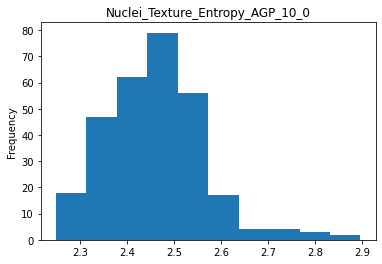

Plotting Nuclei_Texture_Entropy_AGP_3_0:  90%|█████████ | 241/267 [01:06<00:05,  4.79it/s] 

Not normal


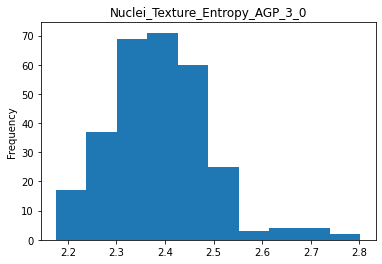

Plotting Nuclei_Texture_Entropy_AGP_5_0:  91%|█████████ | 242/267 [01:06<00:05,  4.81it/s]

Not normal


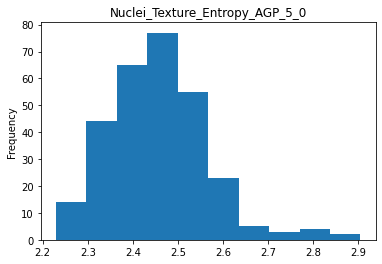

Plotting Nuclei_Texture_Gabor_AGP_10:  91%|█████████ | 243/267 [01:07<00:04,  4.81it/s]   

Not normal


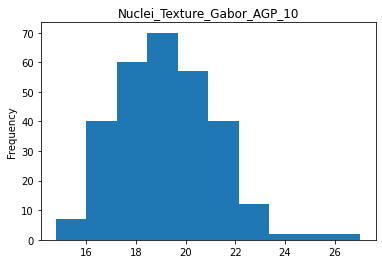

Plotting Nuclei_Texture_Gabor_AGP_3:  91%|█████████▏| 244/267 [01:07<00:04,  4.93it/s] 

Not normal


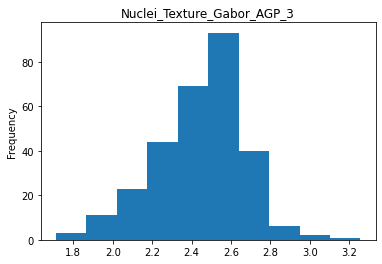

Plotting Nuclei_Texture_Gabor_AGP_5:  92%|█████████▏| 245/267 [01:07<00:04,  5.00it/s]

Not normal


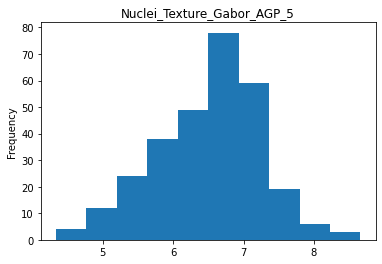

Plotting Nuclei_Texture_InfoMeas1_AGP_10_0:  92%|█████████▏| 246/267 [01:07<00:04,  5.02it/s]

Not normal


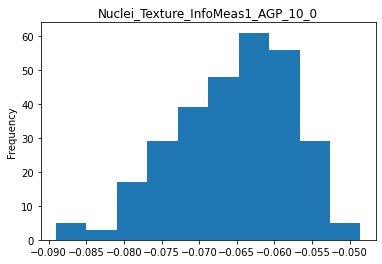

Plotting Nuclei_Texture_InfoMeas1_AGP_3_0:  93%|█████████▎| 247/267 [01:07<00:04,  4.90it/s] 

Not normal


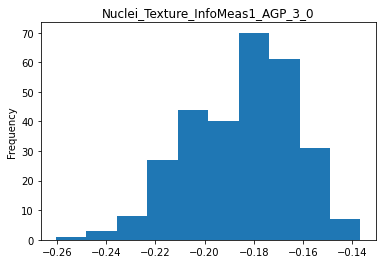

Plotting Nuclei_Texture_InfoMeas1_AGP_5_0:  93%|█████████▎| 248/267 [01:08<00:03,  4.91it/s]

Not normal


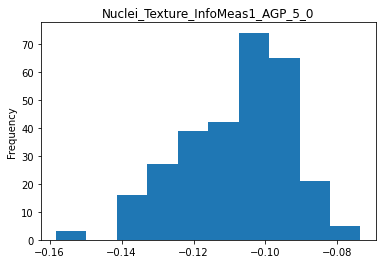

Plotting Nuclei_Texture_InfoMeas2_AGP_10_0:  93%|█████████▎| 249/267 [01:08<00:03,  5.00it/s]

Not normal


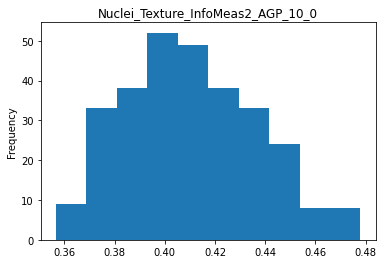

Plotting Nuclei_Texture_InfoMeas2_AGP_3_0:  94%|█████████▎| 250/267 [01:08<00:03,  5.06it/s] 

Not normal


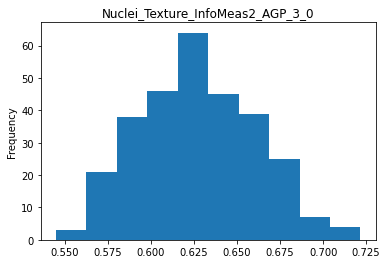

Plotting Nuclei_Texture_InfoMeas2_AGP_5_0:  94%|█████████▍| 251/267 [01:08<00:03,  4.68it/s]

Not normal


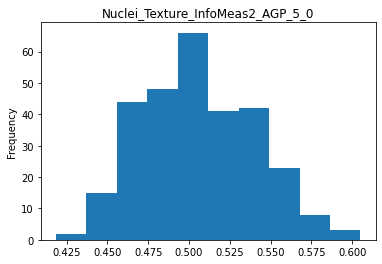

Plotting Nuclei_Texture_InverseDifferenceMoment_AGP_10_0:  94%|█████████▍| 252/267 [01:08<00:03,  4.52it/s]

Not normal


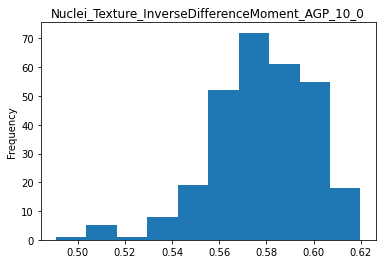

Plotting Nuclei_Texture_InverseDifferenceMoment_AGP_3_0:  95%|█████████▍| 253/267 [01:09<00:03,  4.66it/s] 

Not normal


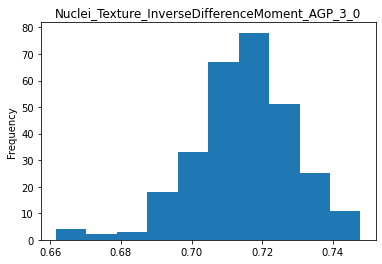

Plotting Nuclei_Texture_InverseDifferenceMoment_AGP_5_0:  95%|█████████▌| 254/267 [01:09<00:02,  4.39it/s]

Not normal


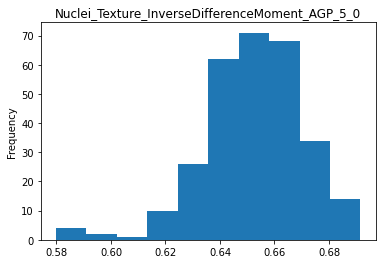

Plotting Nuclei_Texture_SumAverage_AGP_10_0:  96%|█████████▌| 255/267 [01:09<00:02,  4.48it/s]            

Not normal


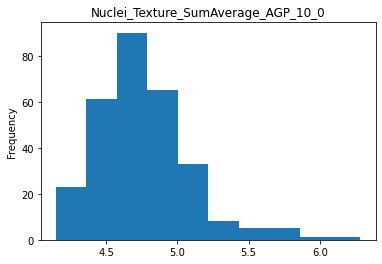

Plotting Nuclei_Texture_SumAverage_AGP_3_0:  96%|█████████▌| 256/267 [01:09<00:02,  4.66it/s] 

Not normal


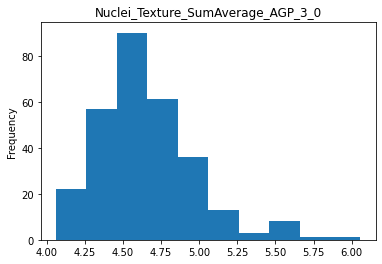

Plotting Nuclei_Texture_SumAverage_AGP_5_0:  96%|█████████▋| 257/267 [01:09<00:02,  4.77it/s]

Not normal


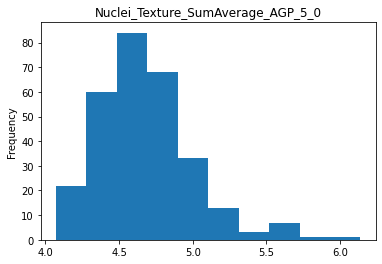

Plotting Nuclei_Texture_SumEntropy_AGP_10_0:  97%|█████████▋| 258/267 [01:10<00:01,  4.83it/s]

Not normal


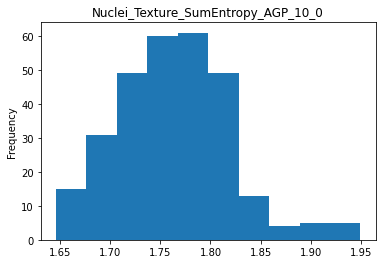

Plotting Nuclei_Texture_SumEntropy_AGP_3_0:  97%|█████████▋| 259/267 [01:10<00:01,  4.86it/s] 

Not normal


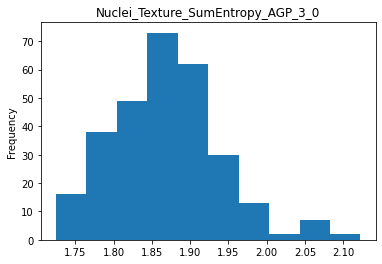

Plotting Nuclei_Texture_SumEntropy_AGP_5_0:  97%|█████████▋| 260/267 [01:10<00:01,  4.85it/s]

Not normal


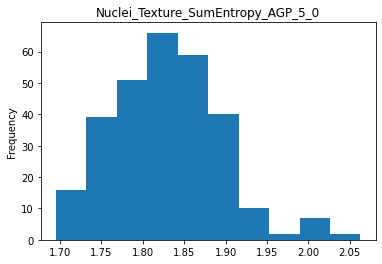

Plotting Nuclei_Texture_SumVariance_AGP_10_0:  98%|█████████▊| 261/267 [01:10<00:01,  4.92it/s]

Not normal


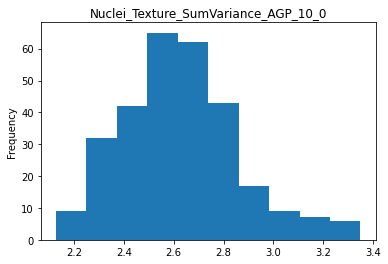

Plotting Nuclei_Texture_SumVariance_AGP_3_0:  98%|█████████▊| 262/267 [01:10<00:00,  5.01it/s] 

Not normal


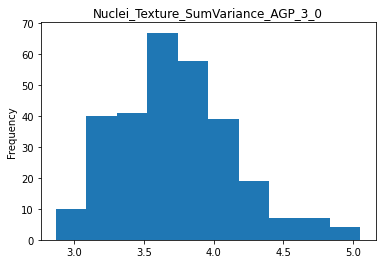

Plotting Nuclei_Texture_SumVariance_AGP_5_0:  99%|█████████▊| 263/267 [01:11<00:00,  5.16it/s]

Not normal


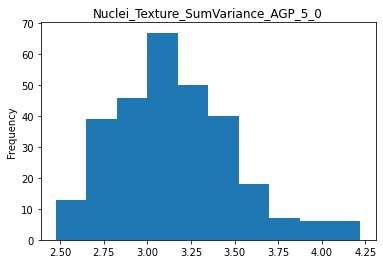

Plotting Nuclei_Texture_Variance_AGP_10_0:  99%|█████████▉| 264/267 [01:11<00:00,  4.12it/s]  

Not normal


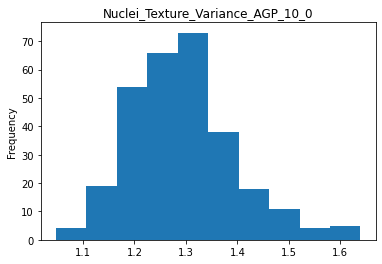

Plotting Nuclei_Texture_Variance_AGP_3_0:  99%|█████████▉| 265/267 [01:11<00:00,  4.38it/s] 

Not normal


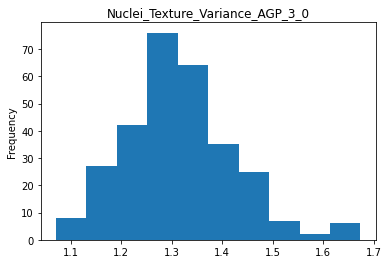

Plotting Nuclei_Texture_Variance_AGP_5_0: 100%|█████████▉| 266/267 [01:12<00:00,  4.06it/s]

Not normal


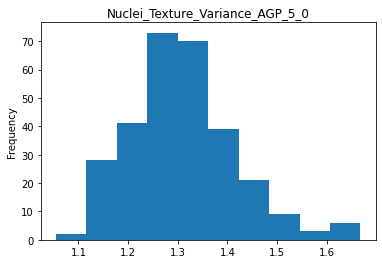

Plotting Nuclei_Texture_Variance_AGP_5_0: 100%|██████████| 267/267 [01:12<00:00,  3.69it/s]


In [24]:
AGP_df = Data_object.exclude_other_channels("AGP")
display_plots(AGP_df)

# ER distribution

Plotting Cells_Granularity_10_ER:   0%|          | 0/267 [00:00<?, ?it/s]

Not normal


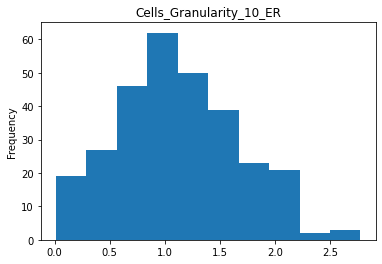

Plotting Cells_Granularity_11_ER:   0%|          | 1/267 [00:00<01:01,  4.36it/s]

Not normal


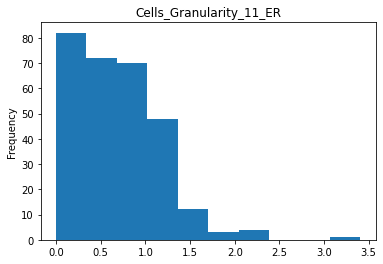

Plotting Cells_Granularity_12_ER:   1%|          | 2/267 [00:00<01:08,  3.87it/s]

Not normal


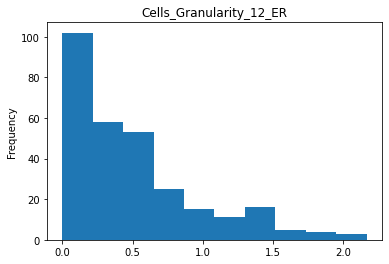

Plotting Cells_Granularity_13_ER:   1%|          | 3/267 [00:00<01:00,  4.36it/s]

Not normal


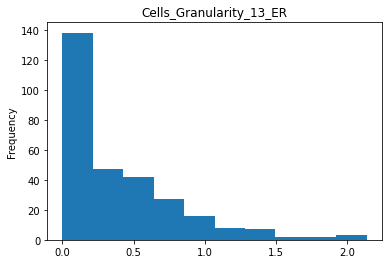

Plotting Cells_Granularity_14_ER:   1%|▏         | 4/267 [00:00<00:58,  4.51it/s]

Not normal


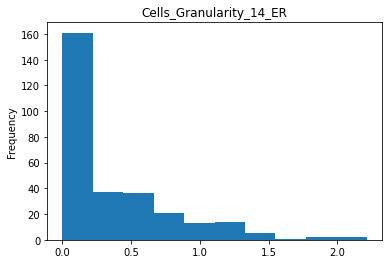

Plotting Cells_Granularity_15_ER:   2%|▏         | 5/267 [00:01<01:00,  4.37it/s]

Not normal


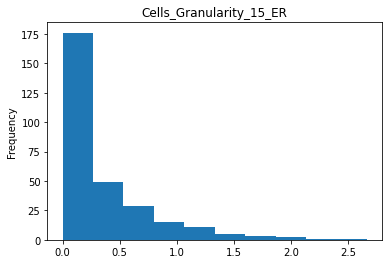

Plotting Cells_Granularity_16_ER:   2%|▏         | 6/267 [00:01<00:59,  4.39it/s]

Not normal


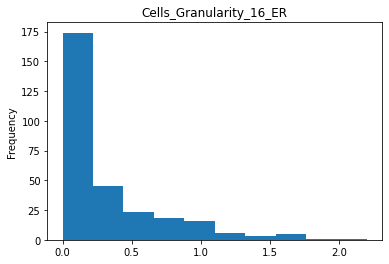

Plotting Cells_Granularity_1_ER:   3%|▎         | 7/267 [00:01<00:56,  4.61it/s] 

Not normal


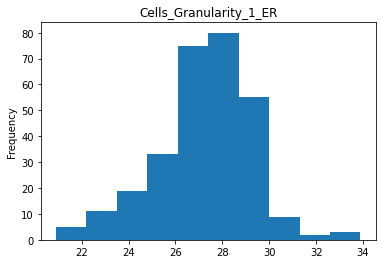

Plotting Cells_Granularity_2_ER:   3%|▎         | 8/267 [00:01<00:57,  4.51it/s]

Not normal


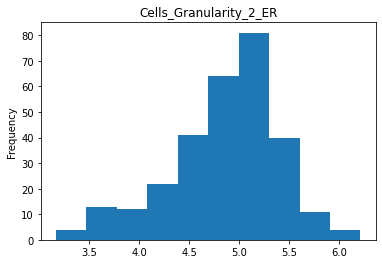

Plotting Cells_Granularity_3_ER:   3%|▎         | 9/267 [00:02<00:57,  4.48it/s]

Not normal


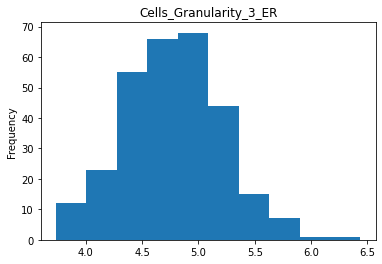

Plotting Cells_Granularity_4_ER:   4%|▎         | 10/267 [00:02<00:57,  4.45it/s]

Not normal


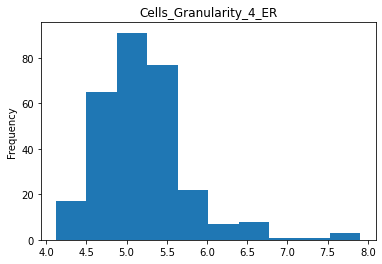

Plotting Cells_Granularity_5_ER:   4%|▍         | 11/267 [00:02<00:56,  4.57it/s]

Not normal


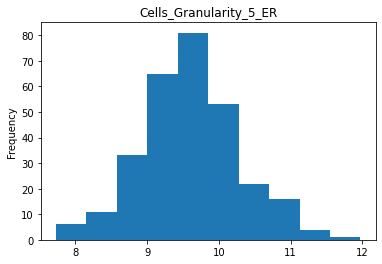

Plotting Cells_Granularity_6_ER:   4%|▍         | 12/267 [00:02<00:57,  4.44it/s]

Not normal


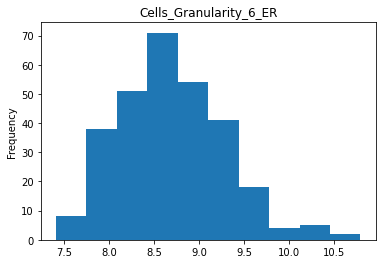

Plotting Cells_Granularity_7_ER:   5%|▍         | 13/267 [00:02<00:57,  4.43it/s]

Not normal


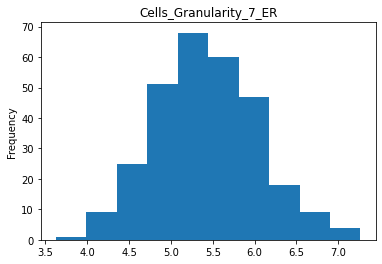

Plotting Cells_Granularity_8_ER:   5%|▌         | 14/267 [00:03<01:00,  4.18it/s]

Not normal


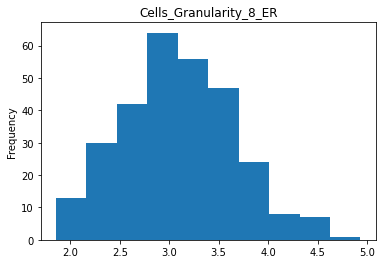

Plotting Cells_Granularity_9_ER:   6%|▌         | 15/267 [00:03<01:00,  4.18it/s]

Not normal


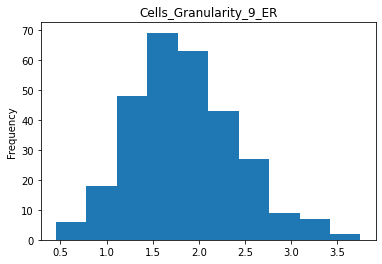

Plotting Cells_Intensity_IntegratedIntensityEdge_ER:   6%|▌         | 16/267 [00:03<00:58,  4.29it/s]

Not normal


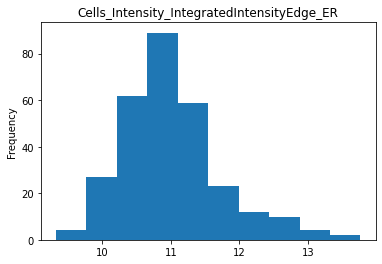

Plotting Cells_Intensity_IntegratedIntensity_ER:   6%|▋         | 17/267 [00:03<00:58,  4.29it/s]    

Not normal


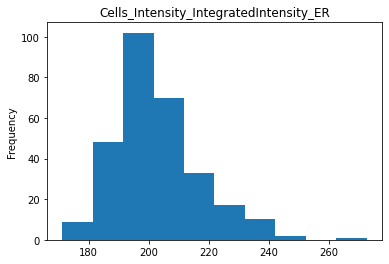

Plotting Cells_Intensity_LowerQuartileIntensity_ER:   7%|▋         | 18/267 [00:04<00:57,  4.34it/s]

Not normal


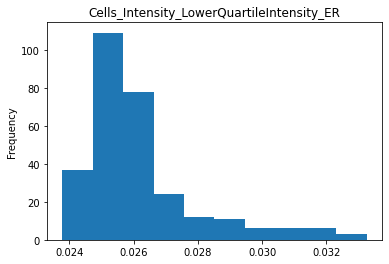

Plotting Cells_Intensity_MADIntensity_ER:   7%|▋         | 19/267 [00:04<00:57,  4.34it/s]          

Not normal


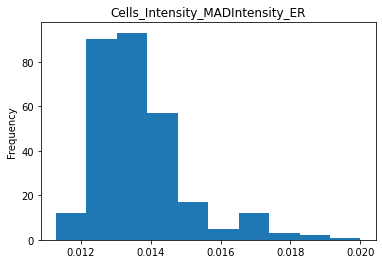

Plotting Cells_Intensity_MassDisplacement_ER:   7%|▋         | 20/267 [00:04<01:00,  4.10it/s]

Not normal


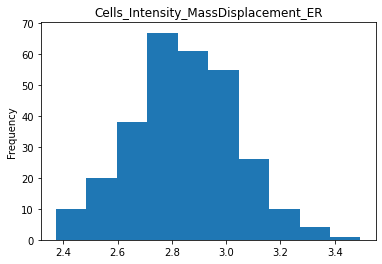

Plotting Cells_Intensity_MaxIntensityEdge_ER:   8%|▊         | 21/267 [00:04<01:00,  4.10it/s]

Not normal


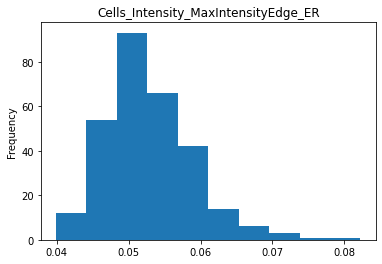

Plotting Cells_Intensity_MaxIntensity_ER:   8%|▊         | 22/267 [00:05<00:55,  4.39it/s]    

Not normal


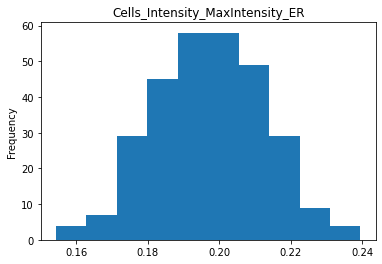

Plotting Cells_Intensity_MeanIntensityEdge_ER:   9%|▊         | 23/267 [00:05<01:07,  3.63it/s]

Not normal


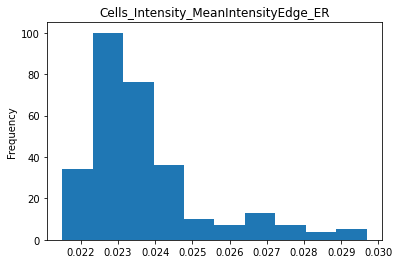

Plotting Cells_Intensity_MeanIntensity_ER:   9%|▉         | 24/267 [00:05<01:04,  3.78it/s]    

Not normal


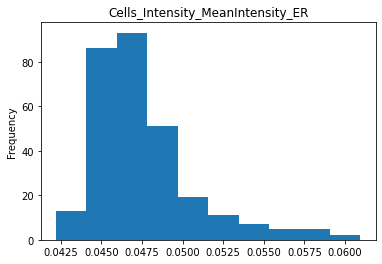

Plotting Cells_Intensity_MedianIntensity_ER:   9%|▉         | 25/267 [00:05<01:01,  3.92it/s]

Not normal


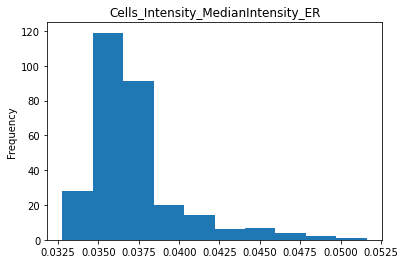

Plotting Cells_Intensity_MinIntensityEdge_ER:  10%|▉         | 26/267 [00:06<01:02,  3.88it/s]

Not normal


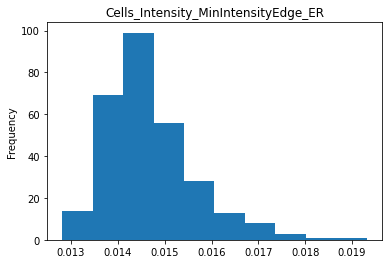

Plotting Cells_Intensity_MinIntensity_ER:  10%|█         | 27/267 [00:06<01:01,  3.93it/s]    

Not normal


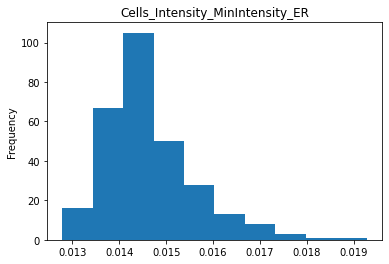

Plotting Cells_Intensity_StdIntensityEdge_ER:  10%|█         | 28/267 [00:06<00:56,  4.22it/s]

Not normal


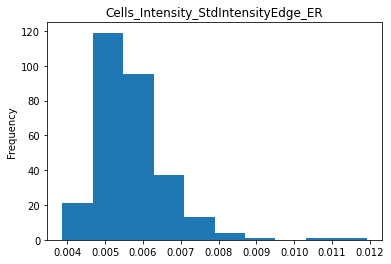

Plotting Cells_Intensity_StdIntensity_ER:  11%|█         | 29/267 [00:06<00:58,  4.10it/s]    

Not normal


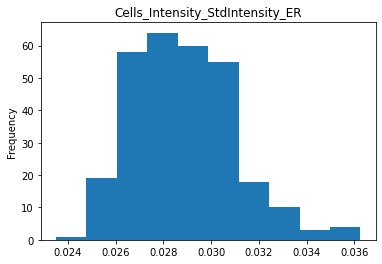

Plotting Cells_Intensity_UpperQuartileIntensity_ER:  11%|█         | 30/267 [00:07<00:54,  4.33it/s]

Not normal


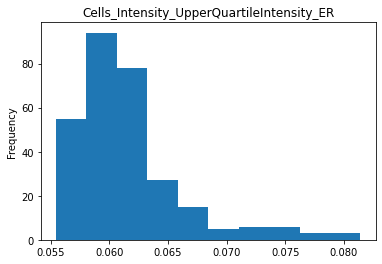

Plotting Cells_Location_CenterMassIntensity_X_ER:  12%|█▏        | 31/267 [00:07<00:51,  4.57it/s]  

Not normal


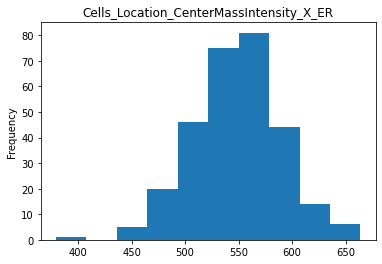

Plotting Cells_Location_CenterMassIntensity_Y_ER:  12%|█▏        | 32/267 [00:07<00:50,  4.62it/s]

Not normal


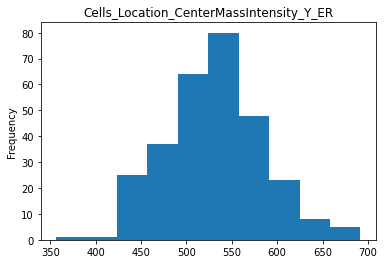

Plotting Cells_Location_MaxIntensity_X_ER:  12%|█▏        | 33/267 [00:07<00:50,  4.62it/s]       

Not normal


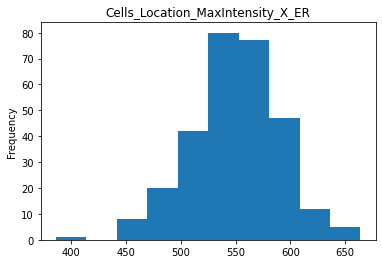

Plotting Cells_Location_MaxIntensity_Y_ER:  13%|█▎        | 34/267 [00:07<00:50,  4.63it/s]

Not normal


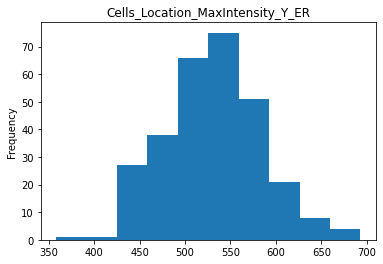

Plotting Cells_RadialDistribution_FracAtD_ER_1of4:  13%|█▎        | 35/267 [00:08<00:50,  4.63it/s]

Not normal


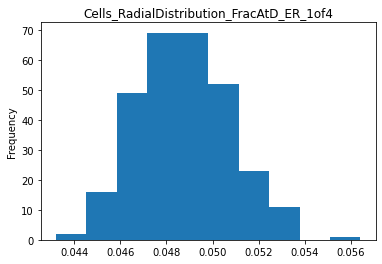

Plotting Cells_RadialDistribution_FracAtD_ER_2of4:  13%|█▎        | 36/267 [00:08<00:50,  4.61it/s]

Not normal


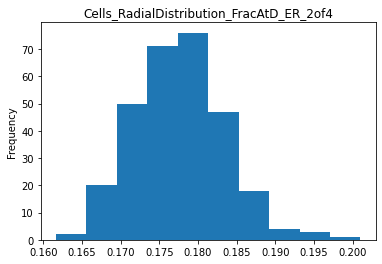

Plotting Cells_RadialDistribution_FracAtD_ER_3of4:  14%|█▍        | 37/267 [00:08<00:49,  4.61it/s]

Not normal


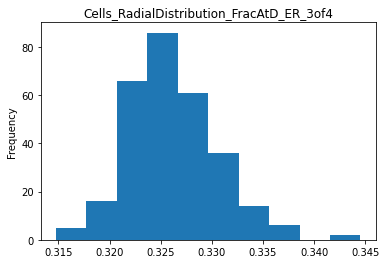

Plotting Cells_RadialDistribution_FracAtD_ER_4of4:  14%|█▍        | 38/267 [00:08<00:47,  4.83it/s]

Not normal


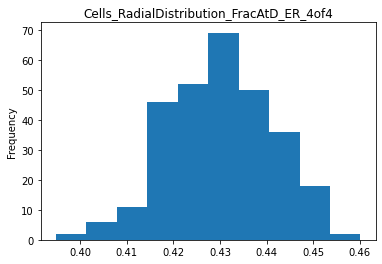

Plotting Cells_RadialDistribution_MeanFrac_ER_1of4:  15%|█▍        | 39/267 [00:08<00:47,  4.81it/s]

Not normal


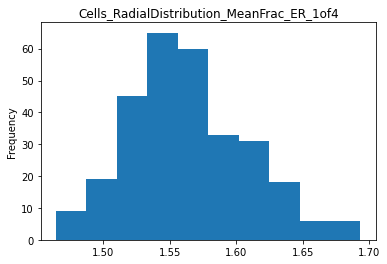

Plotting Cells_RadialDistribution_MeanFrac_ER_2of4:  15%|█▍        | 40/267 [00:09<00:48,  4.64it/s]

Not normal


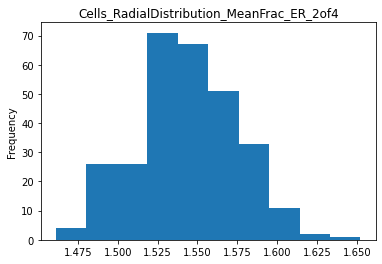

Plotting Cells_RadialDistribution_MeanFrac_ER_3of4:  15%|█▌        | 41/267 [00:09<00:54,  4.14it/s]

Not normal


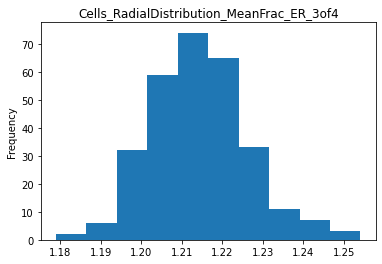

Plotting Cells_RadialDistribution_MeanFrac_ER_4of4:  16%|█▌        | 42/267 [00:09<00:58,  3.86it/s]

Not normal


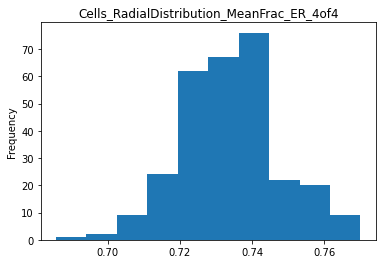

Plotting Cells_RadialDistribution_RadialCV_ER_1of4:  16%|█▌        | 43/267 [00:10<00:53,  4.16it/s]

Not normal


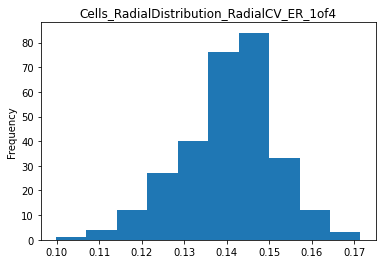

Plotting Cells_RadialDistribution_RadialCV_ER_2of4:  16%|█▋        | 44/267 [00:10<00:52,  4.22it/s]

Not normal


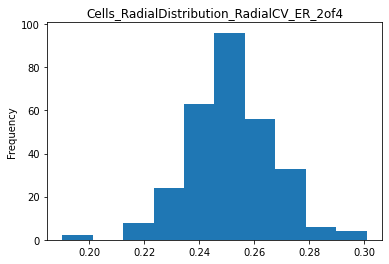

Plotting Cells_RadialDistribution_RadialCV_ER_3of4:  17%|█▋        | 45/267 [00:10<00:49,  4.45it/s]

Not normal


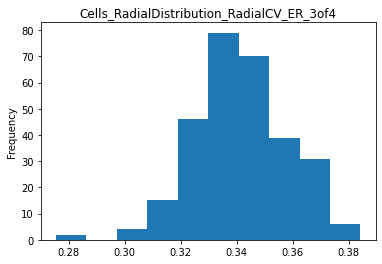

Plotting Cells_RadialDistribution_RadialCV_ER_4of4:  17%|█▋        | 46/267 [00:10<00:48,  4.52it/s]

Not normal


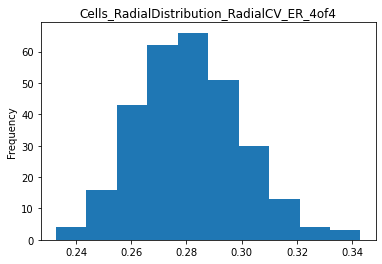

Plotting Cells_Texture_AngularSecondMoment_ER_10_0:  18%|█▊        | 47/267 [00:10<00:47,  4.62it/s]

Not normal


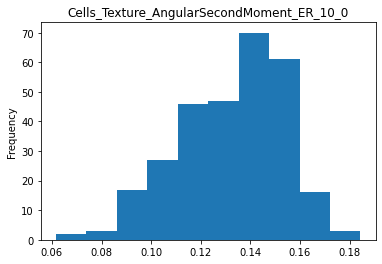

Plotting Cells_Texture_AngularSecondMoment_ER_3_0:  18%|█▊        | 48/267 [00:11<00:48,  4.53it/s] 

Not normal


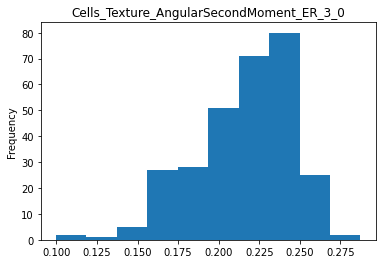

Plotting Cells_Texture_AngularSecondMoment_ER_5_0:  18%|█▊        | 49/267 [00:11<00:50,  4.36it/s]

Not normal


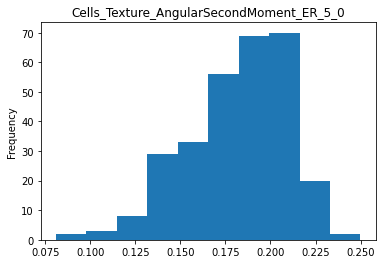

Plotting Cells_Texture_Contrast_ER_10_0:  19%|█▊        | 50/267 [00:11<00:48,  4.45it/s]          

Not normal


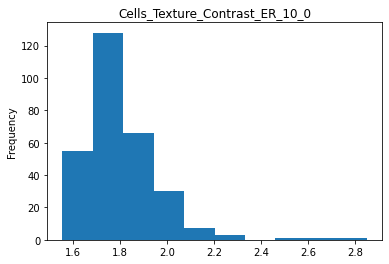

Plotting Cells_Texture_Contrast_ER_3_0:  19%|█▉        | 51/267 [00:11<00:49,  4.41it/s] 

Not normal


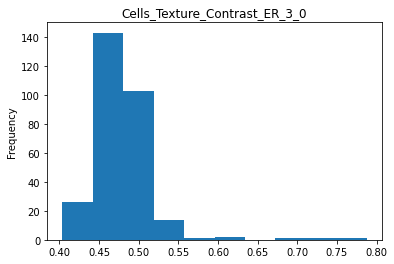

Plotting Cells_Texture_Contrast_ER_5_0:  19%|█▉        | 52/267 [00:11<00:48,  4.43it/s]

Not normal


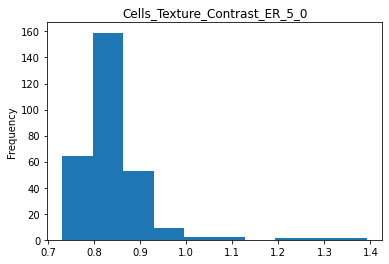

Plotting Cells_Texture_Correlation_ER_10_0:  20%|█▉        | 53/267 [00:12<00:48,  4.42it/s]

Not normal


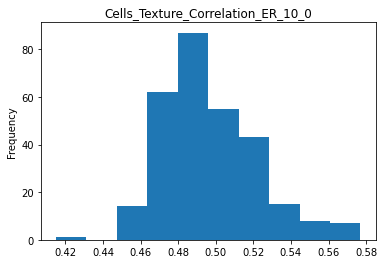

Plotting Cells_Texture_Correlation_ER_3_0:  20%|██        | 54/267 [00:12<00:46,  4.59it/s] 

Not normal


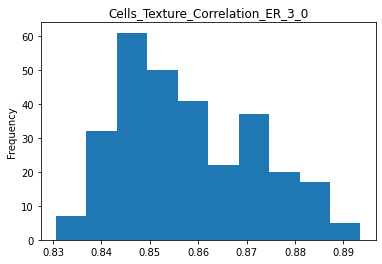

Plotting Cells_Texture_Correlation_ER_5_0:  21%|██        | 55/267 [00:12<00:45,  4.62it/s]

Not normal


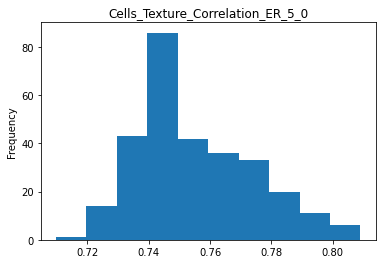

Plotting Cells_Texture_DifferenceEntropy_ER_10_0:  21%|██        | 56/267 [00:12<00:43,  4.83it/s]

Not normal


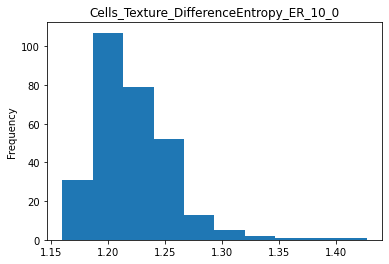

Plotting Cells_Texture_DifferenceEntropy_ER_3_0:  21%|██▏       | 57/267 [00:13<00:43,  4.88it/s] 

Not normal


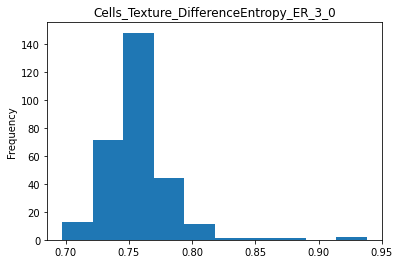

Plotting Cells_Texture_DifferenceEntropy_ER_5_0:  22%|██▏       | 58/267 [00:13<00:43,  4.83it/s]

Not normal


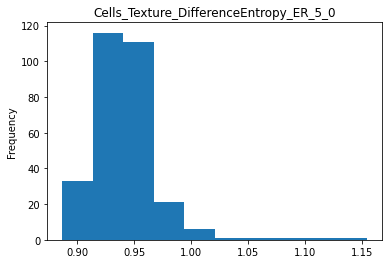

Plotting Cells_Texture_DifferenceVariance_ER_10_0:  22%|██▏       | 59/267 [00:13<00:42,  4.87it/s]

Not normal


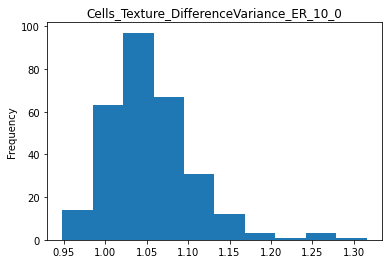

Plotting Cells_Texture_DifferenceVariance_ER_3_0:  22%|██▏       | 60/267 [00:13<00:42,  4.87it/s] 

Not normal


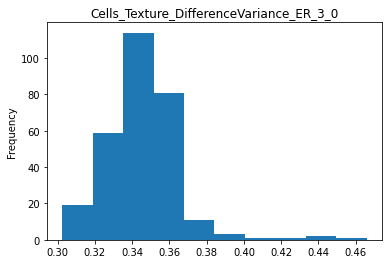

Plotting Cells_Texture_DifferenceVariance_ER_5_0:  23%|██▎       | 61/267 [00:13<00:42,  4.84it/s]

Not normal


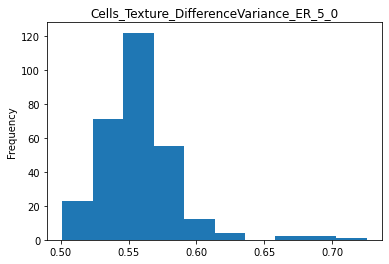

Plotting Cells_Texture_Entropy_ER_10_0:  23%|██▎       | 62/267 [00:14<00:41,  4.91it/s]          

Not normal


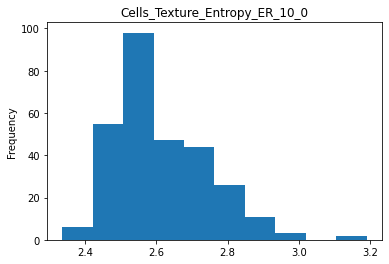

Plotting Cells_Texture_Entropy_ER_3_0:  24%|██▎       | 63/267 [00:14<00:40,  5.00it/s] 

Not normal


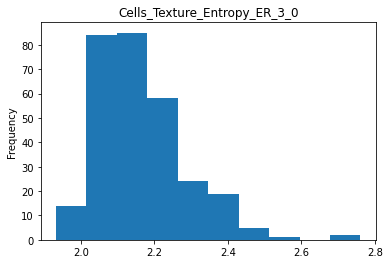

Plotting Cells_Texture_Entropy_ER_5_0:  24%|██▍       | 64/267 [00:14<00:54,  3.70it/s]

Not normal


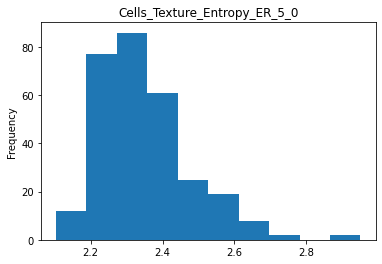

Plotting Cells_Texture_Gabor_ER_10:  24%|██▍       | 65/267 [00:14<00:48,  4.18it/s]   

Not normal


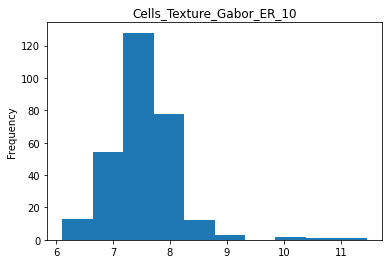

Plotting Cells_Texture_Gabor_ER_3:  25%|██▍       | 66/267 [00:15<00:45,  4.41it/s] 

Not normal


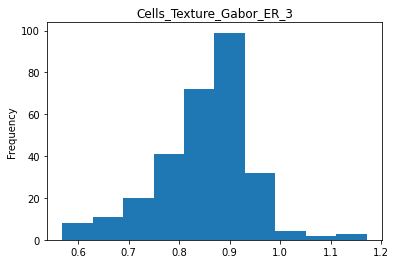

Plotting Cells_Texture_Gabor_ER_5:  25%|██▌       | 67/267 [00:15<00:43,  4.59it/s]

Not normal


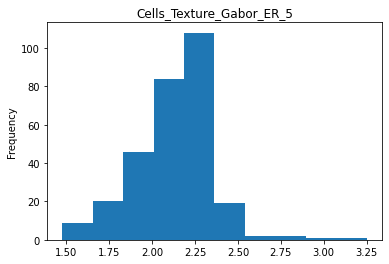

Plotting Cells_Texture_InfoMeas1_ER_10_0:  25%|██▌       | 68/267 [00:15<00:42,  4.71it/s]

Not normal


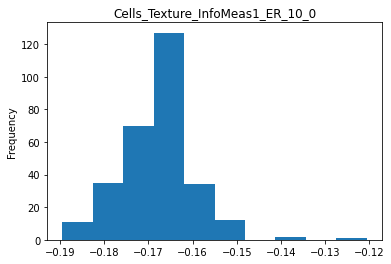

Plotting Cells_Texture_InfoMeas1_ER_3_0:  26%|██▌       | 69/267 [00:15<00:41,  4.75it/s] 

Not normal


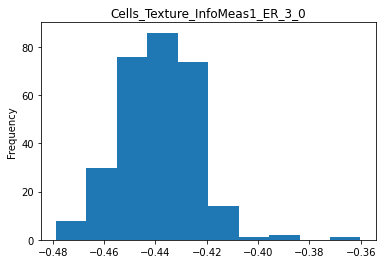

Plotting Cells_Texture_InfoMeas1_ER_5_0:  26%|██▌       | 70/267 [00:15<00:40,  4.88it/s]

Not normal


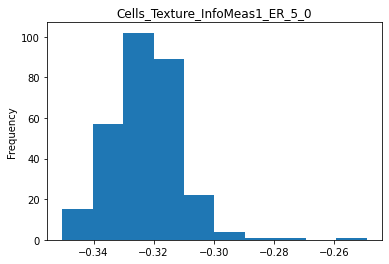

Plotting Cells_Texture_InfoMeas2_ER_10_0:  27%|██▋       | 71/267 [00:16<00:39,  4.96it/s]

Not normal


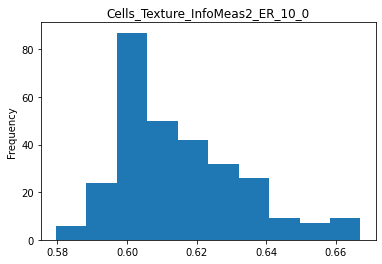

Plotting Cells_Texture_InfoMeas2_ER_3_0:  27%|██▋       | 72/267 [00:16<00:39,  5.00it/s] 

Not normal


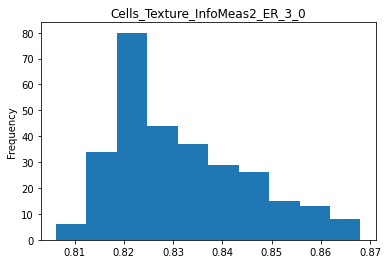

Plotting Cells_Texture_InfoMeas2_ER_5_0:  27%|██▋       | 73/267 [00:16<00:40,  4.84it/s]

Not normal


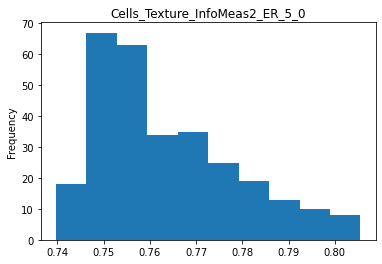

Plotting Cells_Texture_InverseDifferenceMoment_ER_10_0:  28%|██▊       | 74/267 [00:16<00:40,  4.74it/s]

Not normal


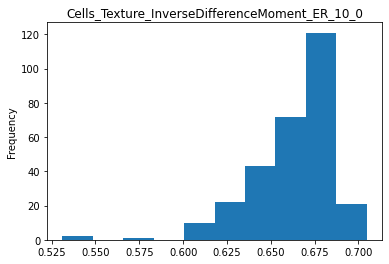

Plotting Cells_Texture_InverseDifferenceMoment_ER_3_0:  28%|██▊       | 75/267 [00:16<00:43,  4.43it/s] 

Not normal


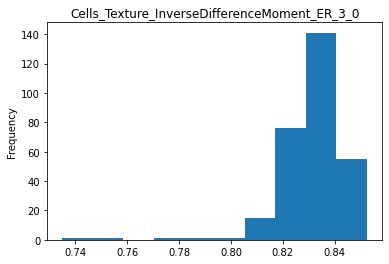

Plotting Cells_Texture_InverseDifferenceMoment_ER_5_0:  28%|██▊       | 76/267 [00:17<00:43,  4.37it/s]

Not normal


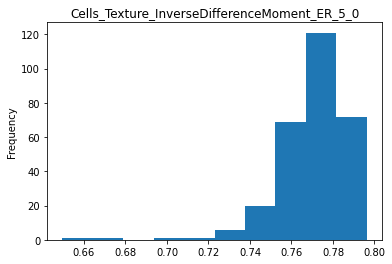

Plotting Cells_Texture_SumAverage_ER_10_0:  29%|██▉       | 77/267 [00:17<00:43,  4.38it/s]            

Not normal


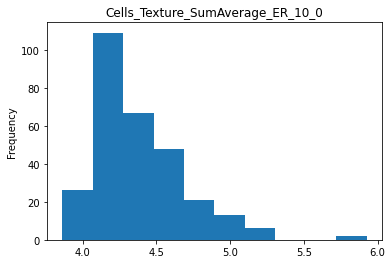

Plotting Cells_Texture_SumAverage_ER_3_0:  29%|██▉       | 78/267 [00:17<00:40,  4.63it/s] 

Not normal


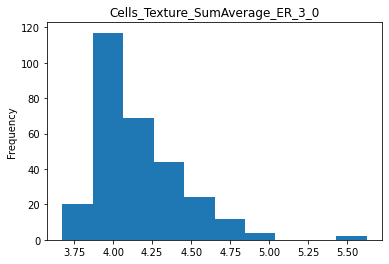

Plotting Cells_Texture_SumAverage_ER_5_0:  30%|██▉       | 79/267 [00:17<00:40,  4.63it/s]

Not normal


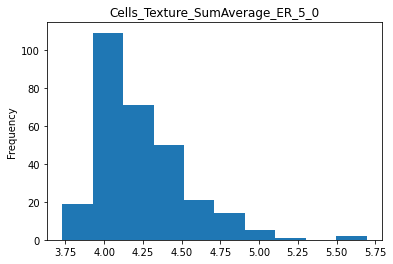

Plotting Cells_Texture_SumEntropy_ER_10_0:  30%|██▉       | 80/267 [00:18<00:40,  4.58it/s]

Not normal


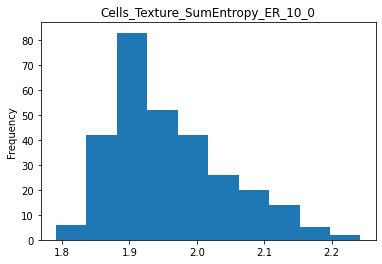

Plotting Cells_Texture_SumEntropy_ER_3_0:  30%|███       | 81/267 [00:18<00:40,  4.54it/s] 

Not normal


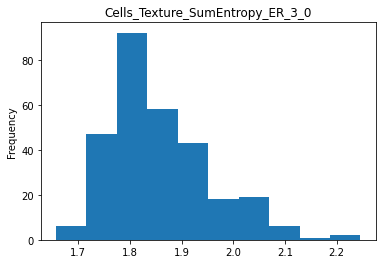

Plotting Cells_Texture_SumEntropy_ER_5_0:  31%|███       | 82/267 [00:18<00:39,  4.73it/s]

Not normal


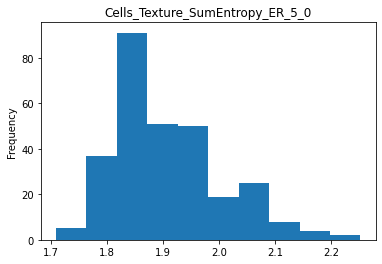

Plotting Cells_Texture_SumVariance_ER_10_0:  31%|███       | 83/267 [00:18<00:37,  4.84it/s]

Not normal


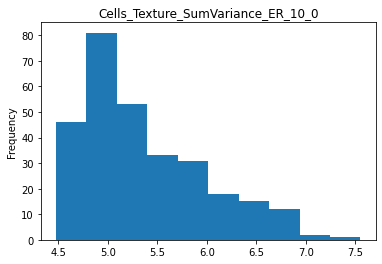

Plotting Cells_Texture_SumVariance_ER_3_0:  31%|███▏      | 84/267 [00:18<00:38,  4.73it/s] 

Not normal


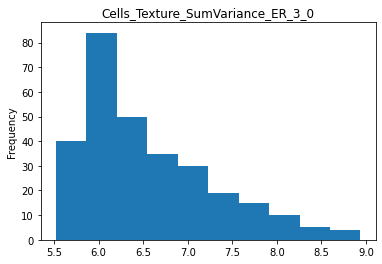

Plotting Cells_Texture_SumVariance_ER_5_0:  32%|███▏      | 85/267 [00:19<00:39,  4.58it/s]

Not normal


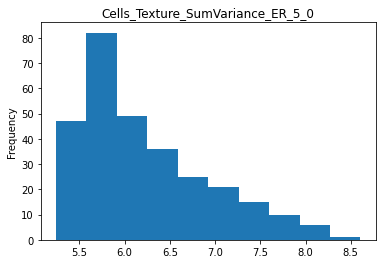

Plotting Cells_Texture_Variance_ER_10_0:  32%|███▏      | 86/267 [00:19<00:40,  4.49it/s]  

Not normal


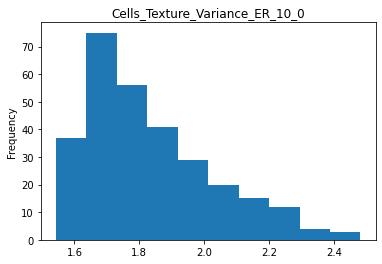

Plotting Cells_Texture_Variance_ER_3_0:  33%|███▎      | 87/267 [00:19<00:39,  4.55it/s] 

Not normal


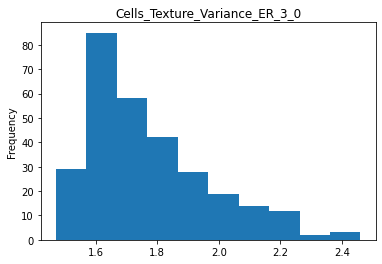

Plotting Cells_Texture_Variance_ER_5_0:  33%|███▎      | 88/267 [00:19<00:38,  4.61it/s]

Not normal


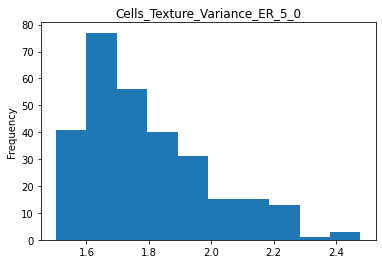

Plotting Cytoplasm_Granularity_10_ER:  33%|███▎      | 89/267 [00:19<00:38,  4.64it/s]  

Not normal


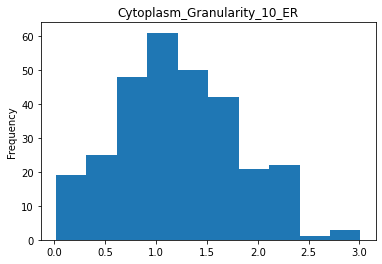

Plotting Cytoplasm_Granularity_11_ER:  34%|███▎      | 90/267 [00:20<00:38,  4.64it/s]

Not normal


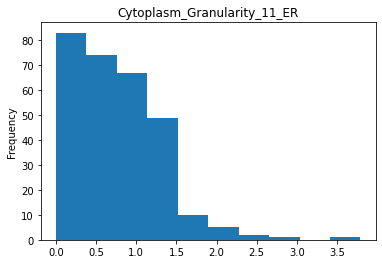

Plotting Cytoplasm_Granularity_12_ER:  34%|███▍      | 91/267 [00:20<00:38,  4.59it/s]

Not normal


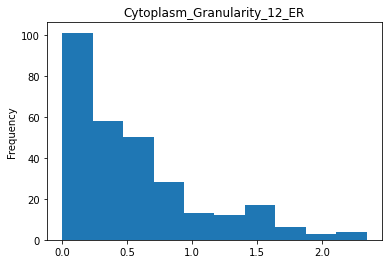

Plotting Cytoplasm_Granularity_13_ER:  34%|███▍      | 92/267 [00:20<00:36,  4.77it/s]

Not normal


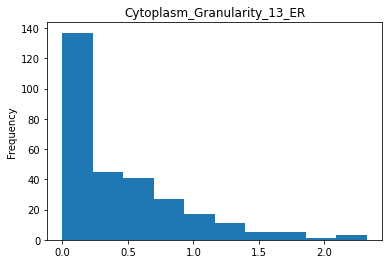

Plotting Cytoplasm_Granularity_14_ER:  35%|███▍      | 93/267 [00:20<00:36,  4.80it/s]

Not normal


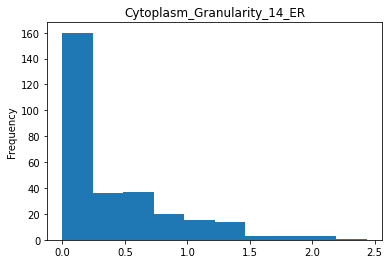

Plotting Cytoplasm_Granularity_15_ER:  35%|███▌      | 94/267 [00:20<00:36,  4.80it/s]

Not normal


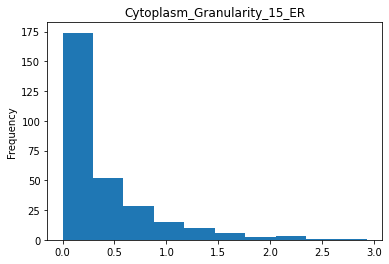

Plotting Cytoplasm_Granularity_16_ER:  36%|███▌      | 95/267 [00:21<00:36,  4.76it/s]

Not normal


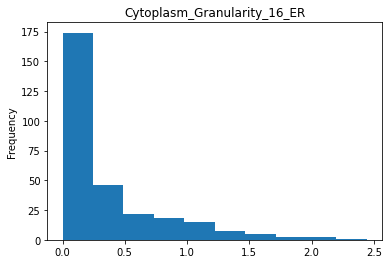

Plotting Cytoplasm_Granularity_1_ER:  36%|███▌      | 96/267 [00:21<00:36,  4.73it/s] 

Not normal


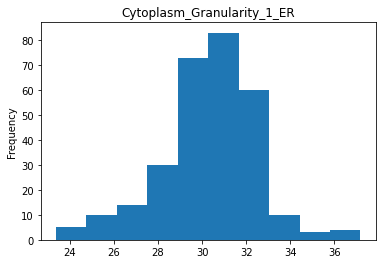

Plotting Cytoplasm_Granularity_2_ER:  36%|███▋      | 97/267 [00:21<00:36,  4.64it/s]

Not normal


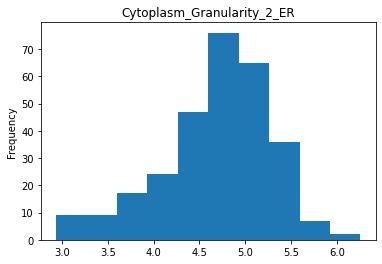

Plotting Cytoplasm_Granularity_3_ER:  37%|███▋      | 98/267 [00:21<00:36,  4.64it/s]

Not normal


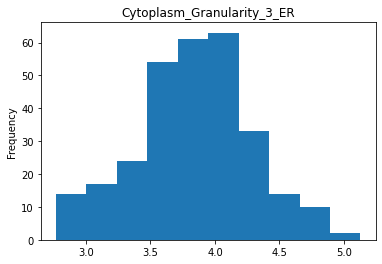

Plotting Cytoplasm_Granularity_4_ER:  37%|███▋      | 99/267 [00:22<00:35,  4.75it/s]

Not normal


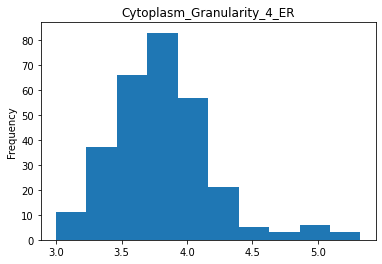

Plotting Cytoplasm_Granularity_5_ER:  37%|███▋      | 100/267 [00:22<00:35,  4.71it/s]

Not normal


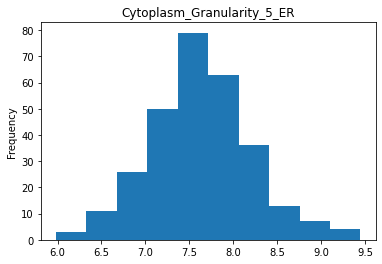

Plotting Cytoplasm_Granularity_6_ER:  38%|███▊      | 101/267 [00:22<00:35,  4.65it/s]

Not normal


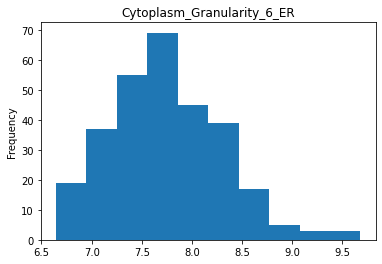

Plotting Cytoplasm_Granularity_7_ER:  38%|███▊      | 102/267 [00:22<00:35,  4.64it/s]

Not normal


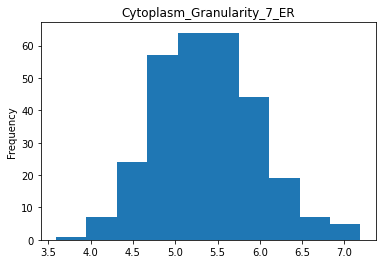

Plotting Cytoplasm_Granularity_8_ER:  39%|███▊      | 103/267 [00:22<00:35,  4.62it/s]

Not normal


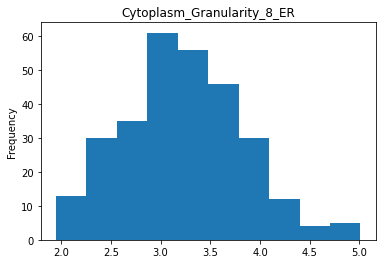

Plotting Cytoplasm_Granularity_9_ER:  39%|███▉      | 104/267 [00:23<00:34,  4.71it/s]

Not normal


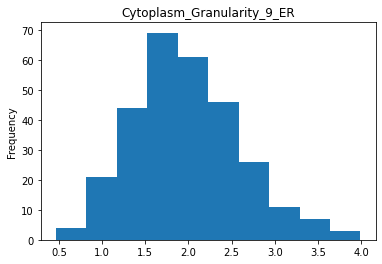

Plotting Cytoplasm_Intensity_IntegratedIntensityEdge_ER:  39%|███▉      | 105/267 [00:23<00:43,  3.75it/s]

Not normal


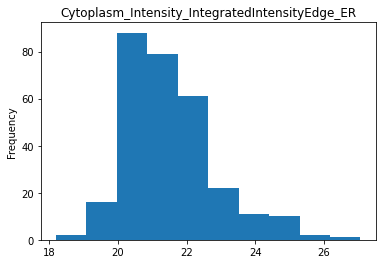

Plotting Cytoplasm_Intensity_IntegratedIntensity_ER:  40%|███▉      | 106/267 [00:23<00:38,  4.13it/s]    

Not normal


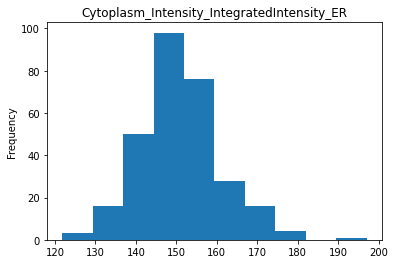

Plotting Cytoplasm_Intensity_LowerQuartileIntensity_ER:  40%|████      | 107/267 [00:23<00:37,  4.31it/s]

Not normal


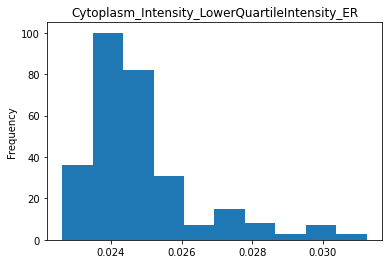

Plotting Cytoplasm_Intensity_MADIntensity_ER:  40%|████      | 108/267 [00:24<00:35,  4.45it/s]          

Not normal


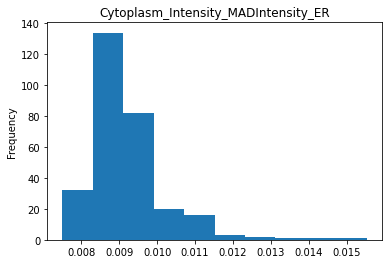

Plotting Cytoplasm_Intensity_MassDisplacement_ER:  41%|████      | 109/267 [00:24<00:36,  4.28it/s]

Not normal


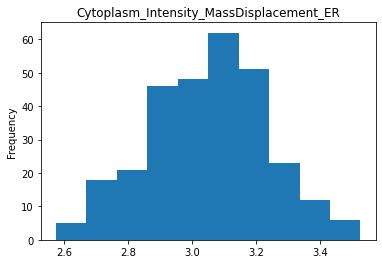

Plotting Cytoplasm_Intensity_MaxIntensityEdge_ER:  41%|████      | 110/267 [00:24<00:35,  4.46it/s]

Not normal


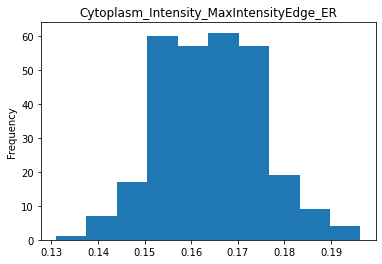

Plotting Cytoplasm_Intensity_MaxIntensity_ER:  42%|████▏     | 111/267 [00:24<00:36,  4.30it/s]    

Not normal


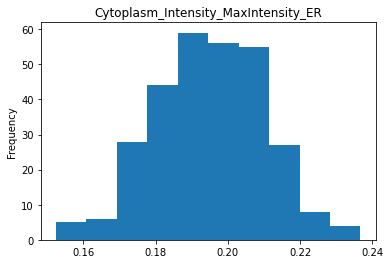

Plotting Cytoplasm_Intensity_MeanIntensityEdge_ER:  42%|████▏     | 112/267 [00:25<00:36,  4.26it/s]

Not normal


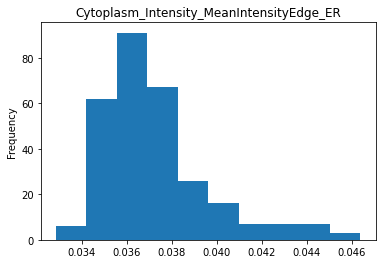

Plotting Cytoplasm_Intensity_MeanIntensity_ER:  42%|████▏     | 113/267 [00:25<00:36,  4.26it/s]    

Not normal


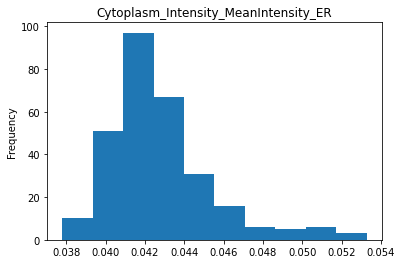

Plotting Cytoplasm_Intensity_MedianIntensity_ER:  43%|████▎     | 114/267 [00:25<00:36,  4.17it/s]

Not normal


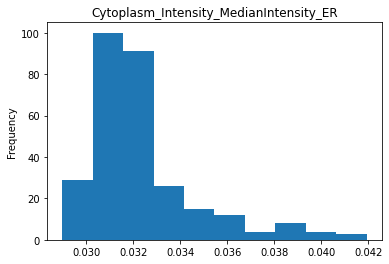

Plotting Cytoplasm_Intensity_MinIntensityEdge_ER:  43%|████▎     | 115/267 [00:25<00:36,  4.15it/s]

Not normal


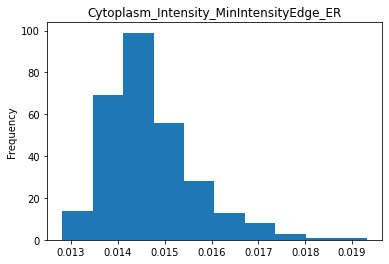

Plotting Cytoplasm_Intensity_MinIntensity_ER:  43%|████▎     | 116/267 [00:26<00:35,  4.19it/s]    

Not normal


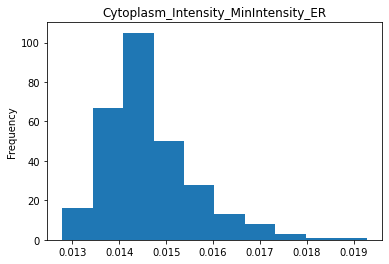

Plotting Cytoplasm_Intensity_StdIntensityEdge_ER:  44%|████▍     | 117/267 [00:26<00:36,  4.13it/s]

Not normal


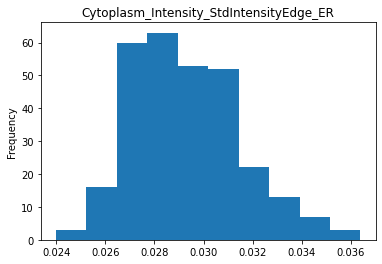

Plotting Cytoplasm_Intensity_StdIntensity_ER:  44%|████▍     | 118/267 [00:26<00:36,  4.06it/s]    

Not normal


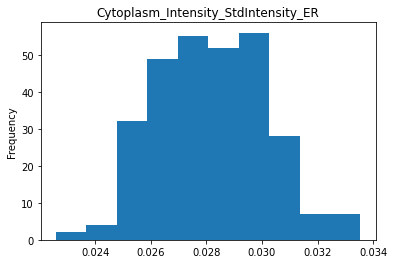

Plotting Cytoplasm_Intensity_UpperQuartileIntensity_ER:  45%|████▍     | 119/267 [00:26<00:35,  4.13it/s]

Not normal


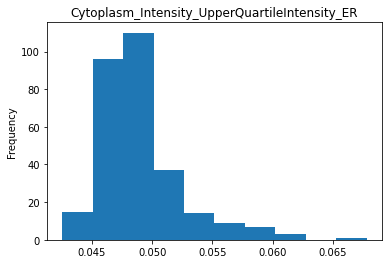

Plotting Cytoplasm_Location_CenterMassIntensity_X_ER:  45%|████▍     | 120/267 [00:26<00:34,  4.27it/s]  

Not normal


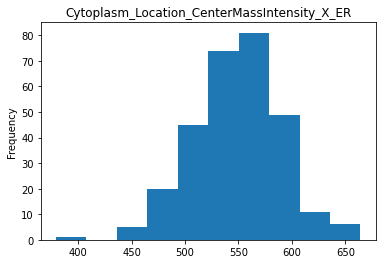

Plotting Cytoplasm_Location_CenterMassIntensity_Y_ER:  45%|████▌     | 121/267 [00:27<00:34,  4.22it/s]

Not normal


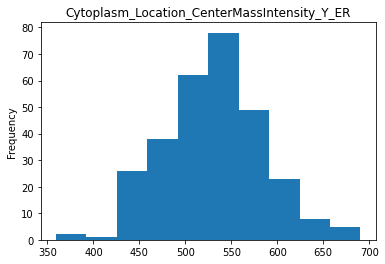

Plotting Cytoplasm_Location_MaxIntensity_X_ER:  46%|████▌     | 122/267 [00:27<00:35,  4.05it/s]       

Not normal


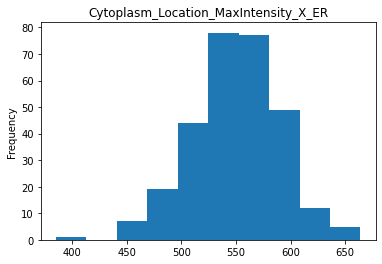

Plotting Cytoplasm_Location_MaxIntensity_Y_ER:  46%|████▌     | 123/267 [00:27<00:35,  4.02it/s]

Not normal


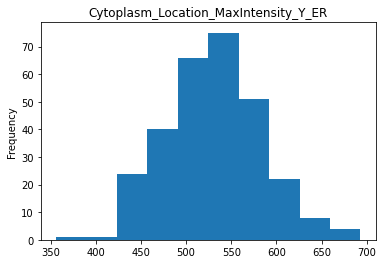

Plotting Cytoplasm_RadialDistribution_FracAtD_ER_1of4:  46%|████▋     | 124/267 [00:28<00:36,  3.95it/s]

Not normal


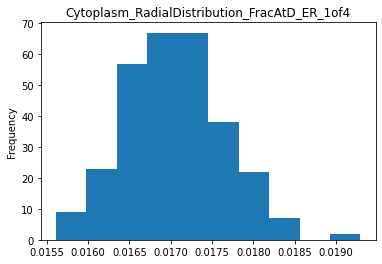

Plotting Cytoplasm_RadialDistribution_FracAtD_ER_2of4:  47%|████▋     | 125/267 [00:28<00:36,  3.94it/s]

Not normal


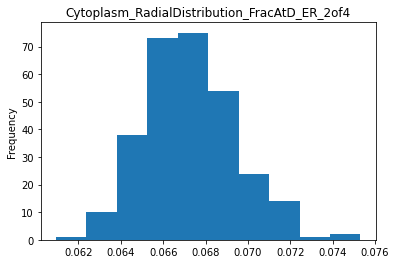

Plotting Cytoplasm_RadialDistribution_FracAtD_ER_3of4:  47%|████▋     | 126/267 [00:28<00:35,  3.92it/s]

Not normal


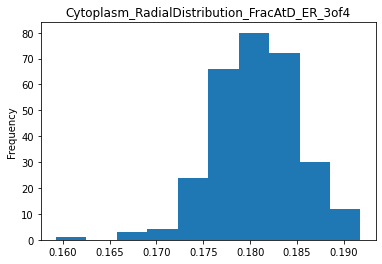

Plotting Cytoplasm_RadialDistribution_FracAtD_ER_4of4:  48%|████▊     | 127/267 [00:28<00:35,  3.95it/s]

Not normal


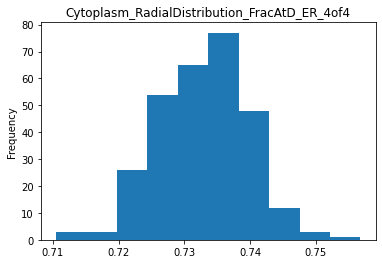

Plotting Cytoplasm_RadialDistribution_MeanFrac_ER_1of4:  48%|████▊     | 128/267 [00:29<00:35,  3.96it/s]

Not normal


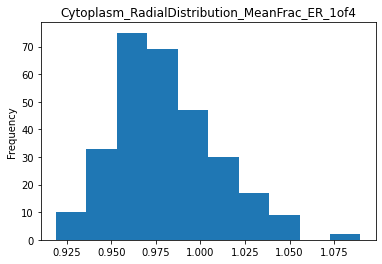

Plotting Cytoplasm_RadialDistribution_MeanFrac_ER_2of4:  48%|████▊     | 129/267 [00:29<00:34,  3.97it/s]

Not normal


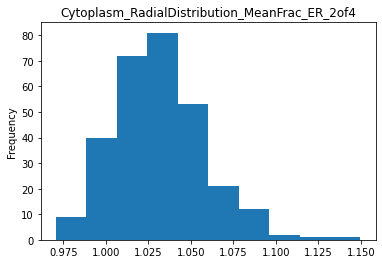

Plotting Cytoplasm_RadialDistribution_MeanFrac_ER_3of4:  49%|████▊     | 130/267 [00:29<00:35,  3.87it/s]

Not normal


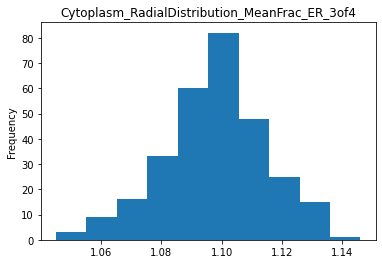

Plotting Cytoplasm_RadialDistribution_MeanFrac_ER_4of4:  49%|████▉     | 131/267 [00:29<00:34,  3.94it/s]

Not normal


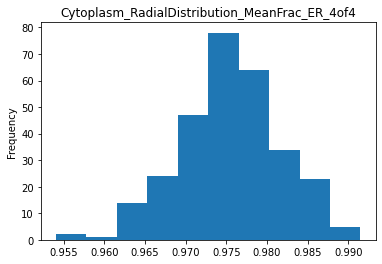

Plotting Cytoplasm_RadialDistribution_RadialCV_ER_1of4:  49%|████▉     | 132/267 [00:30<00:34,  3.94it/s]

Not normal


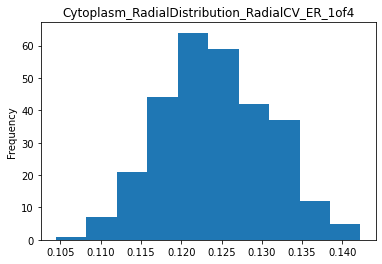

Plotting Cytoplasm_RadialDistribution_RadialCV_ER_2of4:  50%|████▉     | 133/267 [00:30<00:35,  3.83it/s]

Not normal


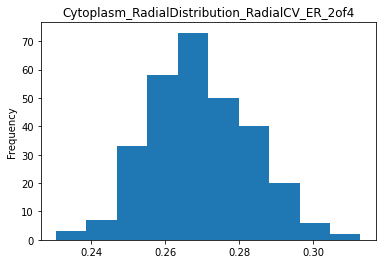

Plotting Cytoplasm_RadialDistribution_RadialCV_ER_3of4:  50%|█████     | 134/267 [00:30<00:33,  3.96it/s]

Not normal


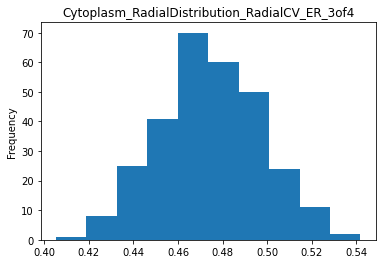

Plotting Cytoplasm_RadialDistribution_RadialCV_ER_4of4:  51%|█████     | 135/267 [00:30<00:33,  3.94it/s]

Not normal


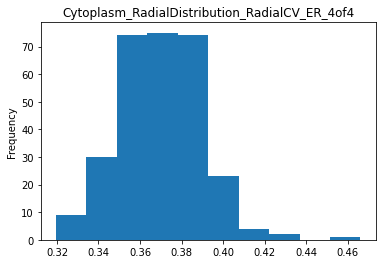

Plotting Cytoplasm_Texture_AngularSecondMoment_ER_10_0:  51%|█████     | 136/267 [00:31<00:33,  3.90it/s]

Not normal


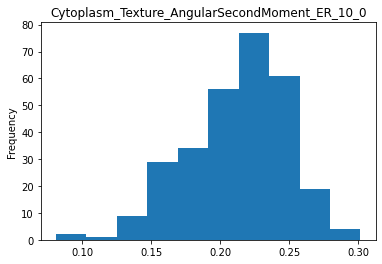

Plotting Cytoplasm_Texture_AngularSecondMoment_ER_3_0:  51%|█████▏    | 137/267 [00:31<00:33,  3.84it/s] 

Not normal


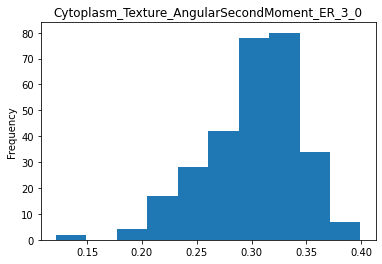

Plotting Cytoplasm_Texture_AngularSecondMoment_ER_5_0:  52%|█████▏    | 138/267 [00:31<00:33,  3.88it/s]

Not normal


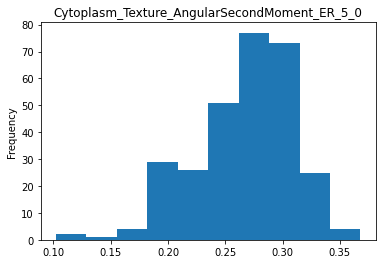

Plotting Cytoplasm_Texture_Contrast_ER_10_0:  52%|█████▏    | 139/267 [00:31<00:33,  3.85it/s]          

Not normal


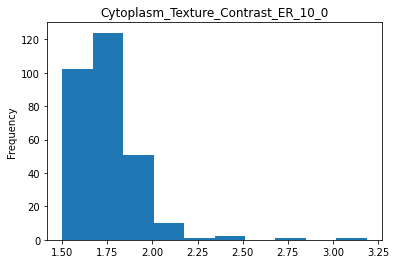

Plotting Cytoplasm_Texture_Contrast_ER_3_0:  52%|█████▏    | 140/267 [00:32<00:32,  3.93it/s] 

Not normal


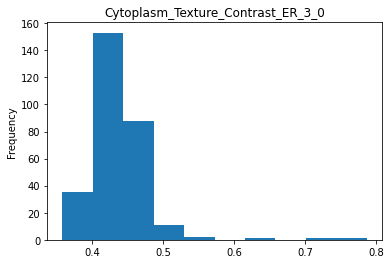

Plotting Cytoplasm_Texture_Contrast_ER_5_0:  53%|█████▎    | 141/267 [00:32<00:32,  3.86it/s]

Not normal


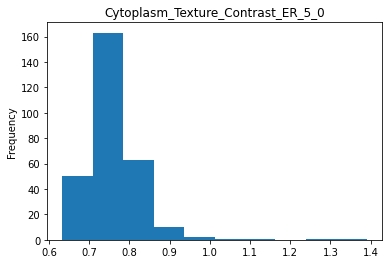

Plotting Cytoplasm_Texture_Correlation_ER_10_0:  53%|█████▎    | 142/267 [00:32<00:33,  3.72it/s]

Not normal


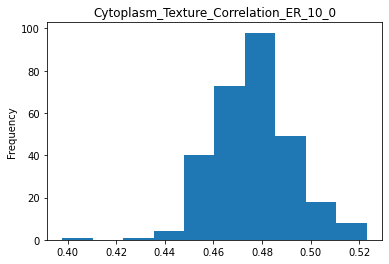

Plotting Cytoplasm_Texture_Correlation_ER_3_0:  54%|█████▎    | 143/267 [00:33<00:41,  2.97it/s] 

Not normal


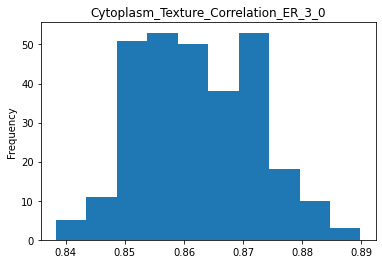

Plotting Cytoplasm_Texture_Correlation_ER_5_0:  54%|█████▍    | 144/267 [00:33<00:37,  3.26it/s]

Not normal


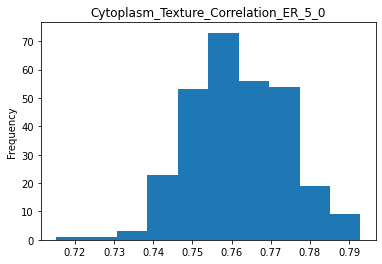

Plotting Cytoplasm_Texture_DifferenceEntropy_ER_10_0:  54%|█████▍    | 145/267 [00:33<00:36,  3.31it/s]

Not normal


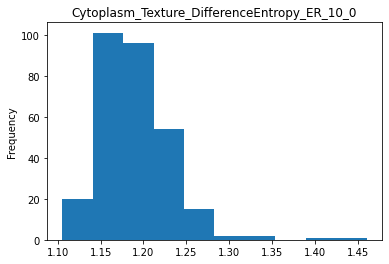

Plotting Cytoplasm_Texture_DifferenceEntropy_ER_3_0:  55%|█████▍    | 146/267 [00:33<00:35,  3.37it/s] 

Not normal


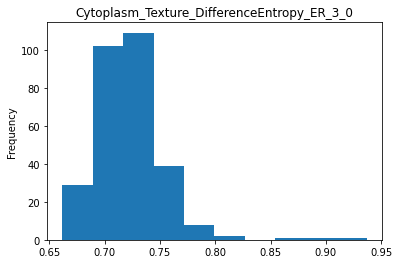

Plotting Cytoplasm_Texture_DifferenceEntropy_ER_5_0:  55%|█████▌    | 147/267 [00:34<00:33,  3.58it/s]

Not normal


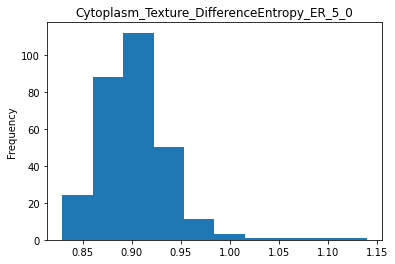

Plotting Cytoplasm_Texture_DifferenceVariance_ER_10_0:  55%|█████▌    | 148/267 [00:34<00:31,  3.78it/s]

Not normal


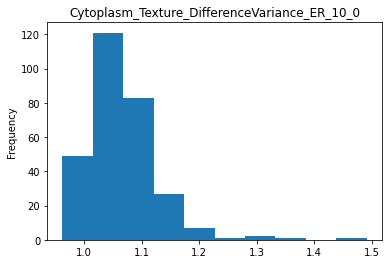

Plotting Cytoplasm_Texture_DifferenceVariance_ER_3_0:  56%|█████▌    | 149/267 [00:34<00:30,  3.91it/s] 

Not normal


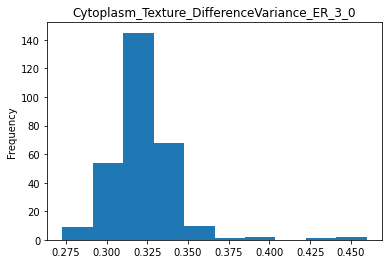

Plotting Cytoplasm_Texture_DifferenceVariance_ER_5_0:  56%|█████▌    | 150/267 [00:34<00:29,  3.94it/s]

Not normal


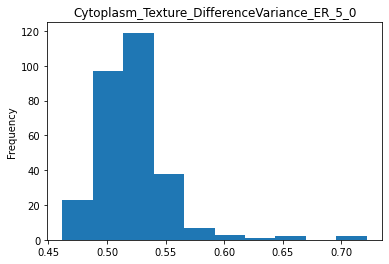

Plotting Cytoplasm_Texture_Entropy_ER_10_0:  57%|█████▋    | 151/267 [00:35<00:28,  4.03it/s]          

Not normal


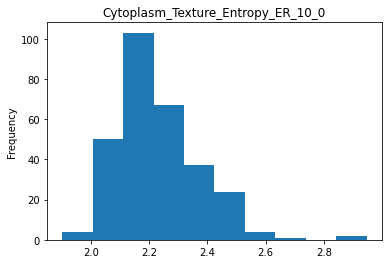

Plotting Cytoplasm_Texture_Entropy_ER_3_0:  57%|█████▋    | 152/267 [00:35<00:28,  4.09it/s] 

Not normal


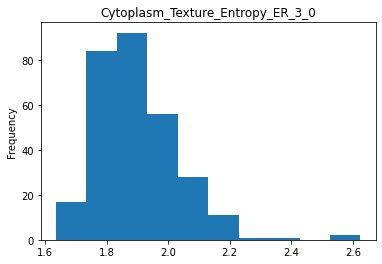

Plotting Cytoplasm_Texture_Entropy_ER_5_0:  57%|█████▋    | 153/267 [00:35<00:27,  4.18it/s]

Not normal


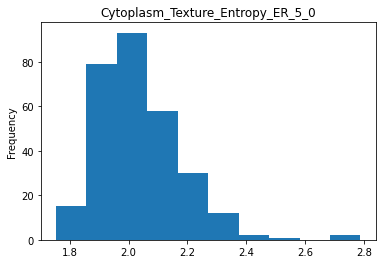

Plotting Cytoplasm_Texture_Gabor_ER_10:  58%|█████▊    | 154/267 [00:35<00:26,  4.27it/s]   

Not normal


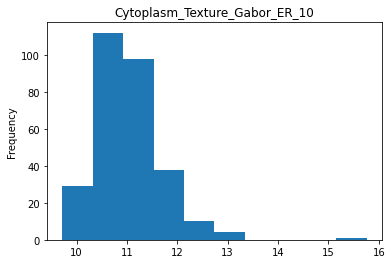

Plotting Cytoplasm_Texture_Gabor_ER_3:  58%|█████▊    | 155/267 [00:36<00:26,  4.19it/s] 

Not normal


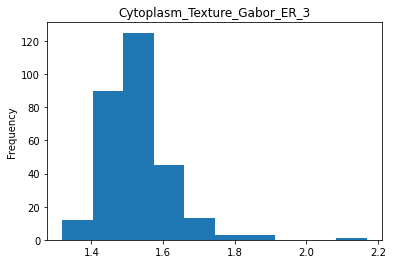

Plotting Cytoplasm_Texture_Gabor_ER_5:  58%|█████▊    | 156/267 [00:36<00:25,  4.28it/s]

Not normal


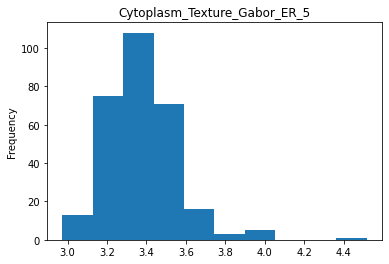

Plotting Cytoplasm_Texture_InfoMeas1_ER_10_0:  59%|█████▉    | 157/267 [00:36<00:26,  4.13it/s]

Not normal


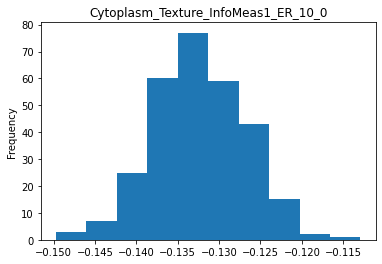

Plotting Cytoplasm_Texture_InfoMeas1_ER_3_0:  59%|█████▉    | 158/267 [00:36<00:27,  4.04it/s] 

Not normal


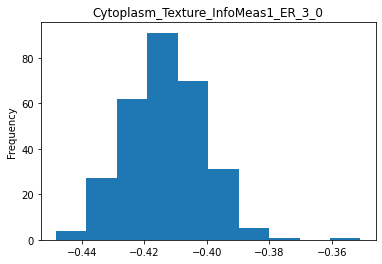

Plotting Cytoplasm_Texture_InfoMeas1_ER_5_0:  60%|█████▉    | 159/267 [00:37<00:25,  4.20it/s]

Not normal


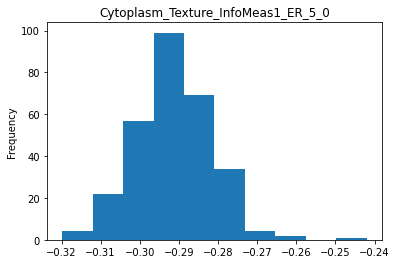

Plotting Cytoplasm_Texture_InfoMeas2_ER_10_0:  60%|█████▉    | 160/267 [00:37<00:24,  4.29it/s]

Not normal


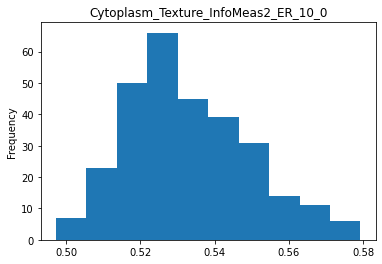

Plotting Cytoplasm_Texture_InfoMeas2_ER_3_0:  60%|██████    | 161/267 [00:37<00:25,  4.20it/s] 

Not normal


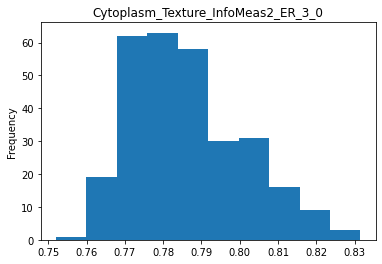

Plotting Cytoplasm_Texture_InfoMeas2_ER_5_0:  61%|██████    | 162/267 [00:37<00:25,  4.14it/s]

Not normal


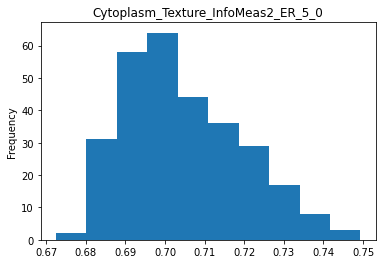

Plotting Cytoplasm_Texture_InverseDifferenceMoment_ER_10_0:  61%|██████    | 163/267 [00:38<00:25,  4.11it/s]

Not normal


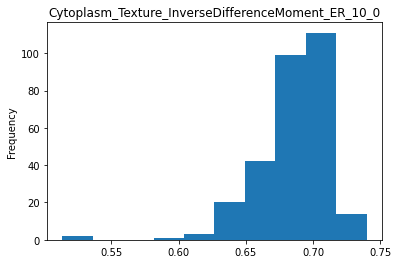

Plotting Cytoplasm_Texture_InverseDifferenceMoment_ER_3_0:  61%|██████▏   | 164/267 [00:38<00:24,  4.20it/s] 

Not normal


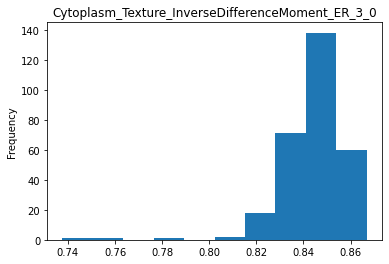

Plotting Cytoplasm_Texture_InverseDifferenceMoment_ER_5_0:  62%|██████▏   | 165/267 [00:38<00:24,  4.14it/s]

Not normal


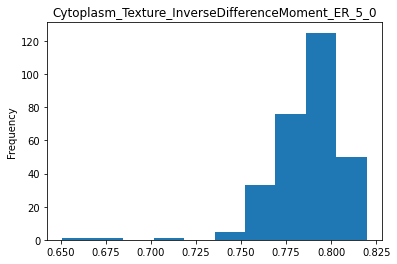

Plotting Cytoplasm_Texture_SumAverage_ER_10_0:  62%|██████▏   | 166/267 [00:38<00:24,  4.07it/s]            

Not normal


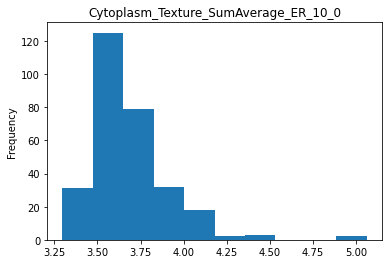

Plotting Cytoplasm_Texture_SumAverage_ER_3_0:  63%|██████▎   | 167/267 [00:38<00:23,  4.22it/s] 

Not normal


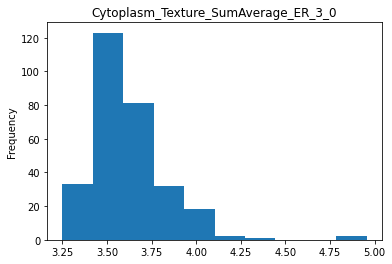

Plotting Cytoplasm_Texture_SumAverage_ER_5_0:  63%|██████▎   | 168/267 [00:39<00:23,  4.17it/s]

Not normal


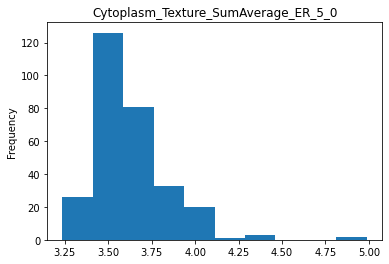

Plotting Cytoplasm_Texture_SumEntropy_ER_10_0:  63%|██████▎   | 169/267 [00:39<00:25,  3.90it/s]

Not normal


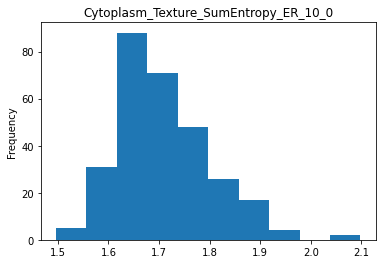

Plotting Cytoplasm_Texture_SumEntropy_ER_3_0:  64%|██████▎   | 170/267 [00:39<00:23,  4.11it/s] 

Not normal


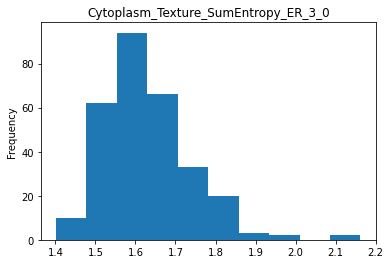

Plotting Cytoplasm_Texture_SumEntropy_ER_5_0:  64%|██████▍   | 171/267 [00:39<00:22,  4.18it/s]

Not normal


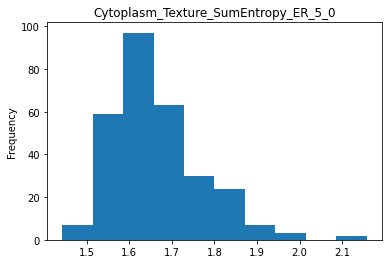

Plotting Cytoplasm_Texture_SumVariance_ER_10_0:  64%|██████▍   | 172/267 [00:40<00:22,  4.19it/s]

Not normal


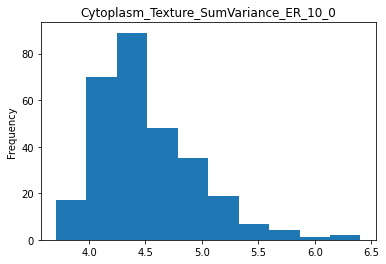

Plotting Cytoplasm_Texture_SumVariance_ER_3_0:  65%|██████▍   | 173/267 [00:40<00:22,  4.26it/s] 

Not normal


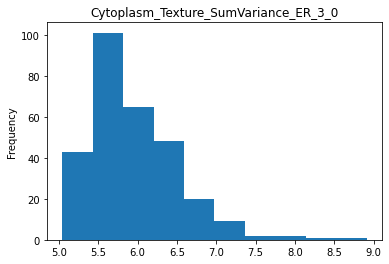

Plotting Cytoplasm_Texture_SumVariance_ER_5_0:  65%|██████▌   | 174/267 [00:40<00:21,  4.31it/s]

Not normal


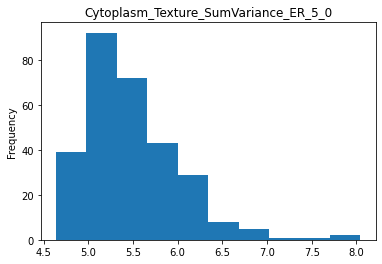

Plotting Cytoplasm_Texture_Variance_ER_10_0:  66%|██████▌   | 175/267 [00:40<00:22,  4.10it/s]  

Not normal


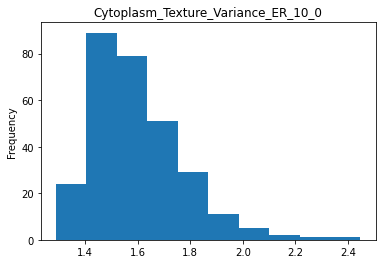

Plotting Cytoplasm_Texture_Variance_ER_3_0:  66%|██████▌   | 176/267 [00:41<00:20,  4.35it/s] 

Not normal


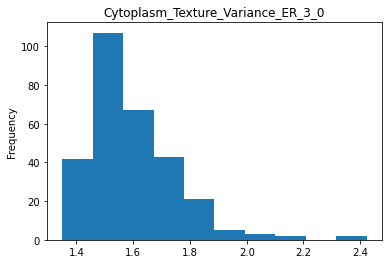

Plotting Cytoplasm_Texture_Variance_ER_5_0:  66%|██████▋   | 177/267 [00:41<00:20,  4.38it/s]

Not normal


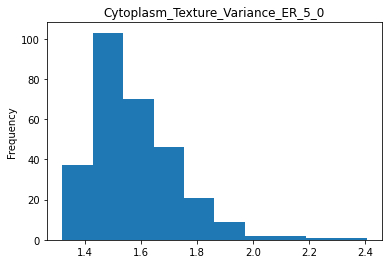

Plotting Nuclei_Granularity_10_ER:  67%|██████▋   | 178/267 [00:41<00:20,  4.44it/s]         

Not normal


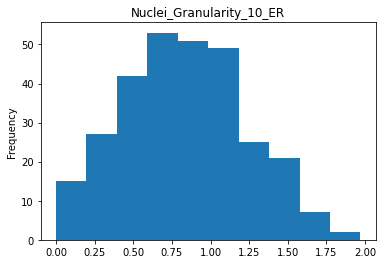

Plotting Nuclei_Granularity_11_ER:  67%|██████▋   | 179/267 [00:41<00:20,  4.34it/s]

Not normal


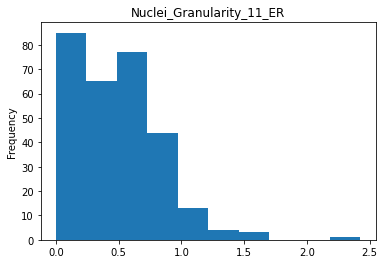

Plotting Nuclei_Granularity_12_ER:  67%|██████▋   | 180/267 [00:42<00:20,  4.23it/s]

Not normal


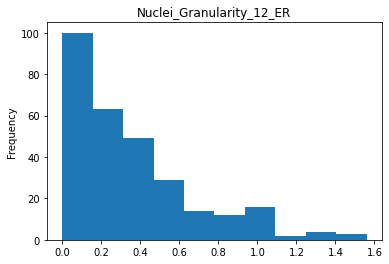

Plotting Nuclei_Granularity_13_ER:  68%|██████▊   | 181/267 [00:42<00:19,  4.30it/s]

Not normal


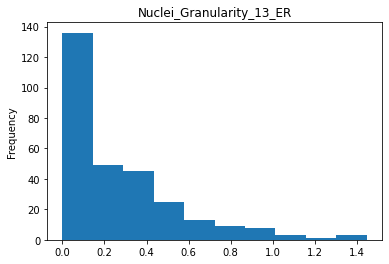

Plotting Nuclei_Granularity_14_ER:  68%|██████▊   | 182/267 [00:42<00:19,  4.25it/s]

Not normal


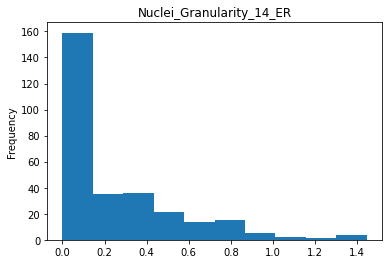

Plotting Nuclei_Granularity_15_ER:  69%|██████▊   | 183/267 [00:42<00:20,  4.19it/s]

Not normal


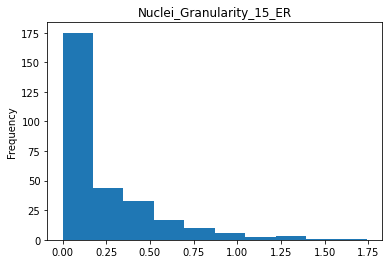

Plotting Nuclei_Granularity_16_ER:  69%|██████▉   | 184/267 [00:43<00:19,  4.23it/s]

Not normal


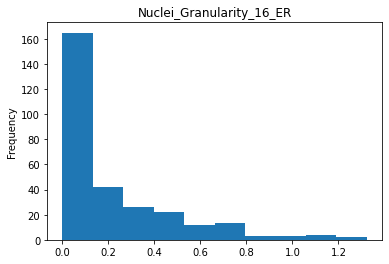

Plotting Nuclei_Granularity_1_ER:  69%|██████▉   | 185/267 [00:43<00:19,  4.18it/s] 

Not normal


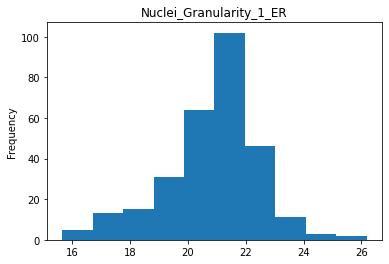

Plotting Nuclei_Granularity_2_ER:  70%|██████▉   | 186/267 [00:43<00:18,  4.35it/s]

Not normal


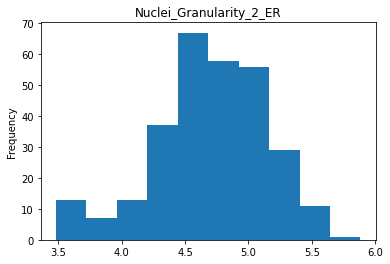

Plotting Nuclei_Granularity_3_ER:  70%|███████   | 187/267 [00:43<00:24,  3.30it/s]

Not normal


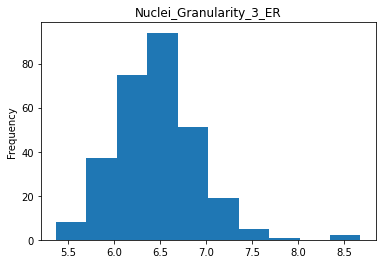

Plotting Nuclei_Granularity_4_ER:  70%|███████   | 188/267 [00:44<00:21,  3.63it/s]

Not normal


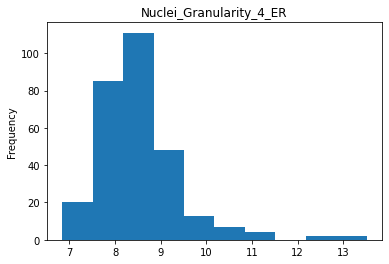

Plotting Nuclei_Granularity_5_ER:  71%|███████   | 189/267 [00:44<00:20,  3.83it/s]

Not normal


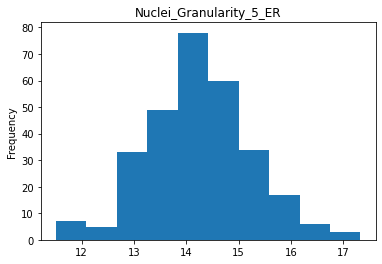

Plotting Nuclei_Granularity_6_ER:  71%|███████   | 190/267 [00:44<00:19,  3.95it/s]

Not normal


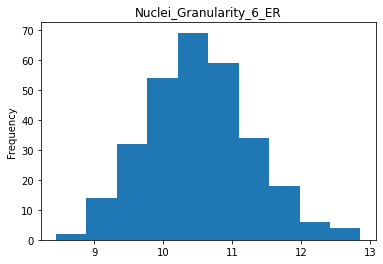

Plotting Nuclei_Granularity_7_ER:  72%|███████▏  | 191/267 [00:44<00:18,  4.07it/s]

Not normal


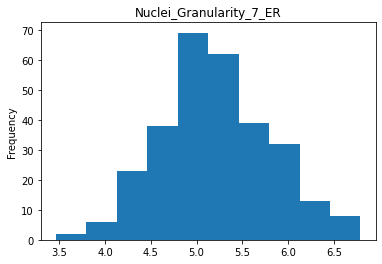

Plotting Nuclei_Granularity_8_ER:  72%|███████▏  | 192/267 [00:45<00:18,  4.11it/s]

Not normal


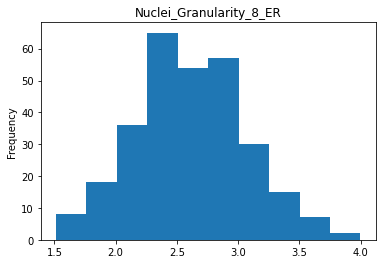

Plotting Nuclei_Granularity_9_ER:  72%|███████▏  | 193/267 [00:45<00:17,  4.19it/s]

Not normal


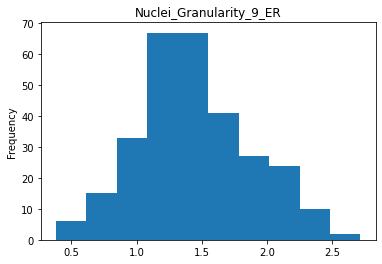

Plotting Nuclei_Intensity_IntegratedIntensityEdge_ER:  73%|███████▎  | 194/267 [00:45<00:17,  4.26it/s]

Not normal


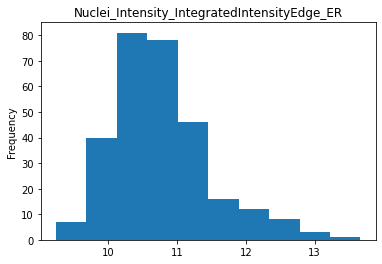

Plotting Nuclei_Intensity_IntegratedIntensity_ER:  73%|███████▎  | 195/267 [00:45<00:16,  4.25it/s]    

Not normal


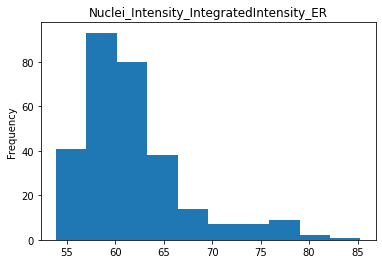

Plotting Nuclei_Intensity_LowerQuartileIntensity_ER:  73%|███████▎  | 196/267 [00:45<00:16,  4.30it/s]

Not normal


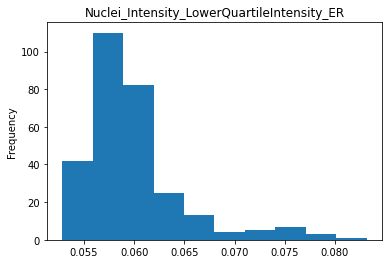

Plotting Nuclei_Intensity_MADIntensity_ER:  74%|███████▍  | 197/267 [00:46<00:16,  4.37it/s]          

Not normal


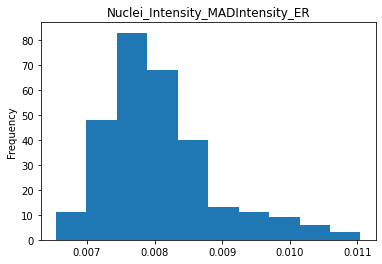

Plotting Nuclei_Intensity_MassDisplacement_ER:  74%|███████▍  | 198/267 [00:46<00:15,  4.33it/s]

Not normal


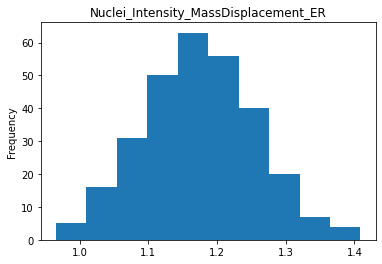

Plotting Nuclei_Intensity_MaxIntensityEdge_ER:  75%|███████▍  | 199/267 [00:46<00:15,  4.31it/s]

Not normal


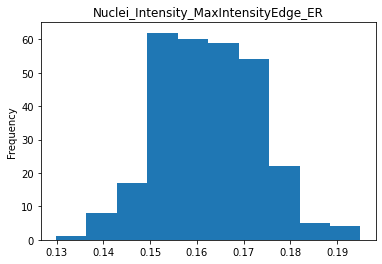

Plotting Nuclei_Intensity_MaxIntensity_ER:  75%|███████▍  | 200/267 [00:46<00:15,  4.39it/s]    

Not normal


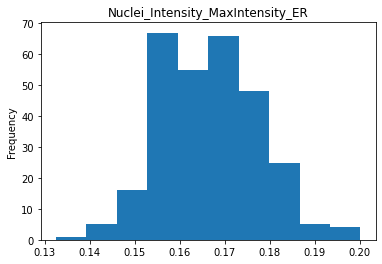

Plotting Nuclei_Intensity_MeanIntensityEdge_ER:  75%|███████▌  | 201/267 [00:47<00:15,  4.29it/s]

Not normal


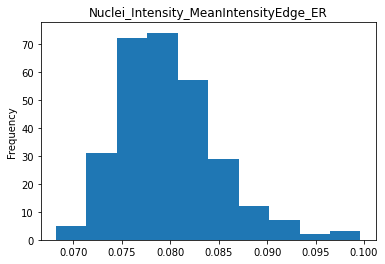

Plotting Nuclei_Intensity_MeanIntensity_ER:  76%|███████▌  | 202/267 [00:47<00:16,  4.02it/s]    

Not normal


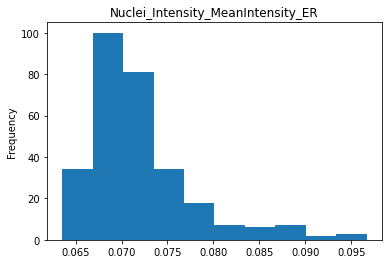

Plotting Nuclei_Intensity_MedianIntensity_ER:  76%|███████▌  | 203/267 [00:47<00:15,  4.18it/s]

Not normal


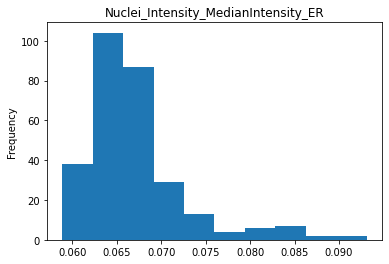

Plotting Nuclei_Intensity_MinIntensityEdge_ER:  76%|███████▋  | 204/267 [00:47<00:14,  4.32it/s]

Not normal


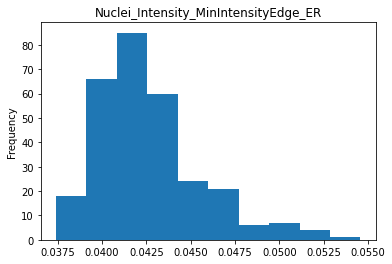

Plotting Nuclei_Intensity_MinIntensity_ER:  77%|███████▋  | 205/267 [00:48<00:14,  4.29it/s]    

Not normal


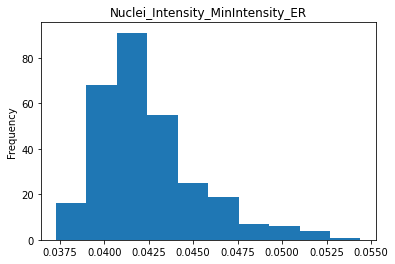

Plotting Nuclei_Intensity_StdIntensityEdge_ER:  77%|███████▋  | 206/267 [00:48<00:14,  4.32it/s]

Not normal


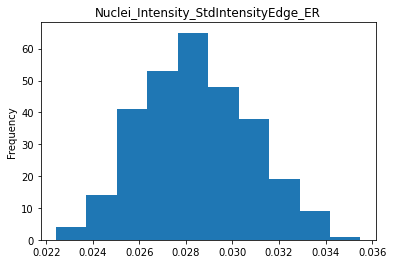

Plotting Nuclei_Intensity_StdIntensity_ER:  78%|███████▊  | 207/267 [00:48<00:13,  4.29it/s]    

Not normal


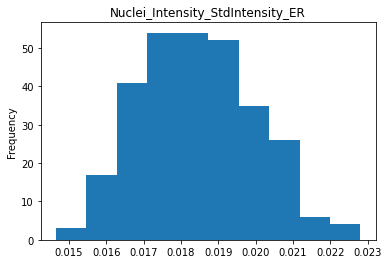

Plotting Nuclei_Intensity_UpperQuartileIntensity_ER:  78%|███████▊  | 208/267 [00:48<00:13,  4.32it/s]

Not normal


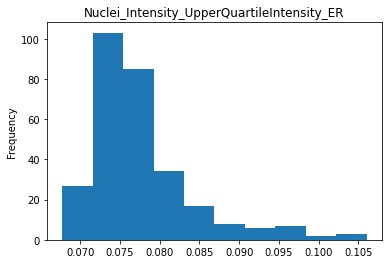

Plotting Nuclei_Location_CenterMassIntensity_X_ER:  78%|███████▊  | 209/267 [00:49<00:13,  4.39it/s]  

Not normal


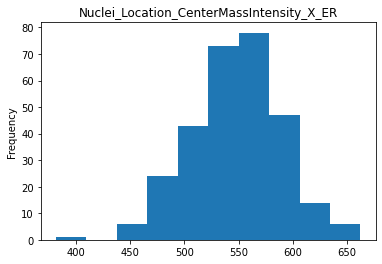

Plotting Nuclei_Location_CenterMassIntensity_Y_ER:  79%|███████▊  | 210/267 [00:49<00:12,  4.45it/s]

Not normal


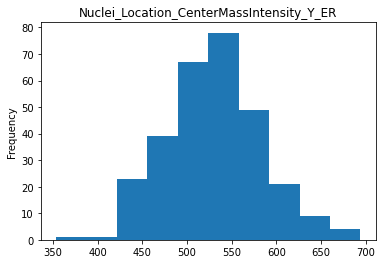

Plotting Nuclei_Location_MaxIntensity_X_ER:  79%|███████▉  | 211/267 [00:49<00:12,  4.39it/s]       

Not normal


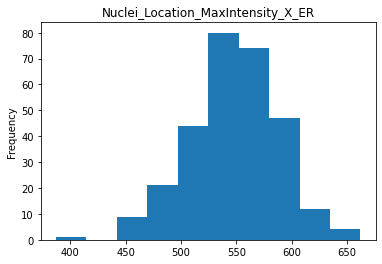

Plotting Nuclei_Location_MaxIntensity_Y_ER:  79%|███████▉  | 212/267 [00:49<00:12,  4.39it/s]

Not normal


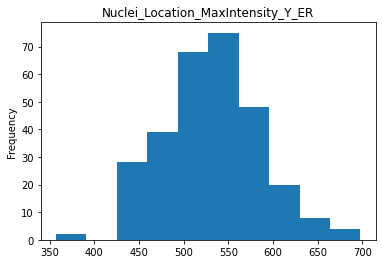

Plotting Nuclei_RadialDistribution_FracAtD_ER_1of4:  80%|███████▉  | 213/267 [00:49<00:12,  4.34it/s]

Not normal


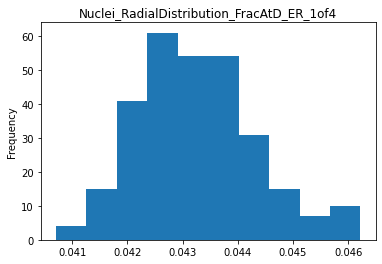

Plotting Nuclei_RadialDistribution_FracAtD_ER_2of4:  80%|████████  | 214/267 [00:50<00:12,  4.42it/s]

Not normal


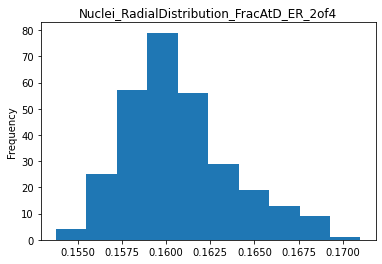

Plotting Nuclei_RadialDistribution_FracAtD_ER_3of4:  81%|████████  | 215/267 [00:50<00:11,  4.41it/s]

Not normal


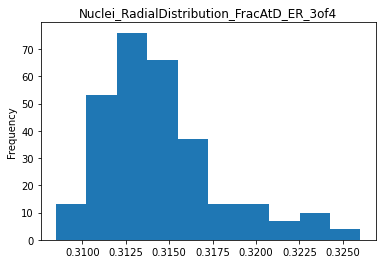

Plotting Nuclei_RadialDistribution_FracAtD_ER_4of4:  81%|████████  | 216/267 [00:50<00:11,  4.30it/s]

Not normal


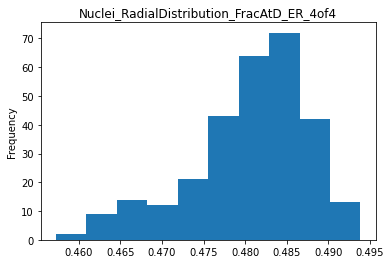

Plotting Nuclei_RadialDistribution_MeanFrac_ER_1of4:  81%|████████▏ | 217/267 [00:50<00:11,  4.24it/s]

Not normal


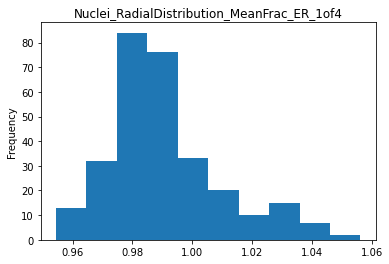

Plotting Nuclei_RadialDistribution_MeanFrac_ER_2of4:  82%|████████▏ | 218/267 [00:51<00:11,  4.28it/s]

Not normal


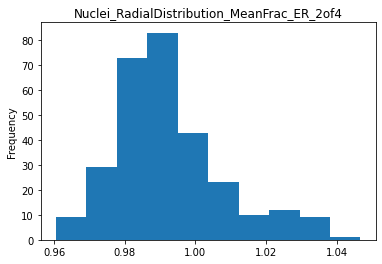

Plotting Nuclei_RadialDistribution_MeanFrac_ER_3of4:  82%|████████▏ | 219/267 [00:51<00:11,  4.18it/s]

Not normal


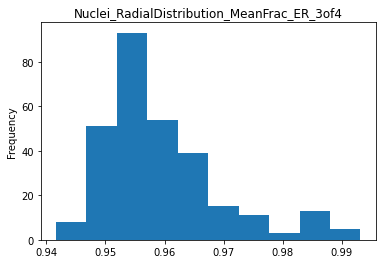

Plotting Nuclei_RadialDistribution_MeanFrac_ER_4of4:  82%|████████▏ | 220/267 [00:51<00:10,  4.41it/s]

Not normal


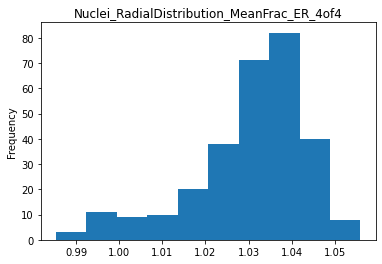

Plotting Nuclei_RadialDistribution_RadialCV_ER_1of4:  83%|████████▎ | 221/267 [00:51<00:10,  4.39it/s]

Not normal


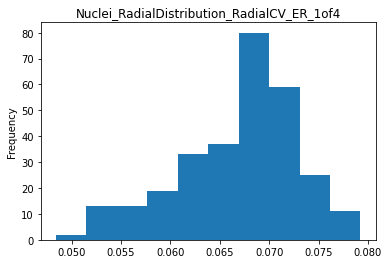

Plotting Nuclei_RadialDistribution_RadialCV_ER_2of4:  83%|████████▎ | 222/267 [00:52<00:10,  4.34it/s]

Not normal


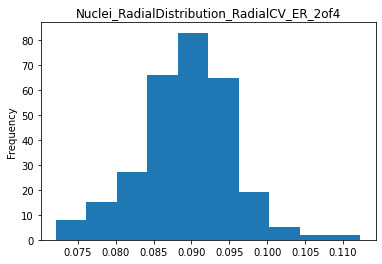

Plotting Nuclei_RadialDistribution_RadialCV_ER_3of4:  84%|████████▎ | 223/267 [00:52<00:10,  4.30it/s]

Not normal


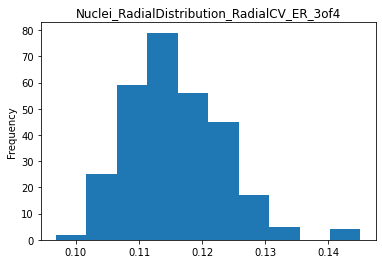

Plotting Nuclei_RadialDistribution_RadialCV_ER_4of4:  84%|████████▍ | 224/267 [00:52<00:10,  4.24it/s]

Not normal


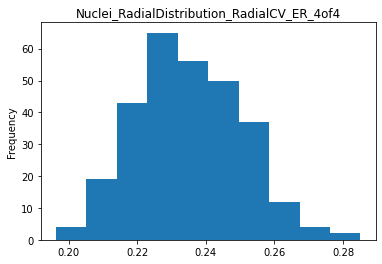

Plotting Nuclei_Texture_AngularSecondMoment_ER_10_0:  84%|████████▍ | 225/267 [00:52<00:09,  4.40it/s]

Not normal


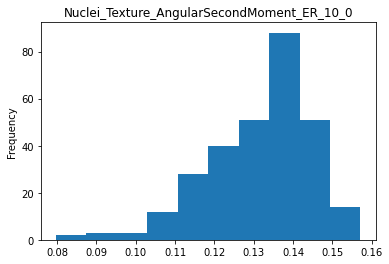

Plotting Nuclei_Texture_AngularSecondMoment_ER_3_0:  85%|████████▍ | 226/267 [00:52<00:09,  4.38it/s] 

Not normal


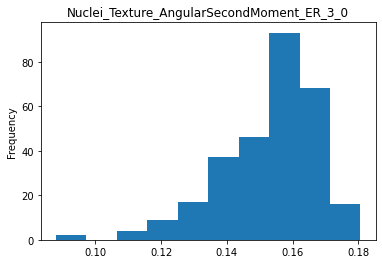

Plotting Nuclei_Texture_AngularSecondMoment_ER_5_0:  85%|████████▌ | 227/267 [00:53<00:08,  4.48it/s]

Not normal


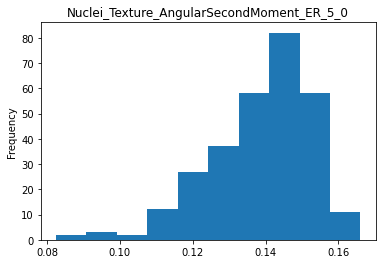

Plotting Nuclei_Texture_Contrast_ER_10_0:  85%|████████▌ | 228/267 [00:53<00:11,  3.40it/s]          

Not normal


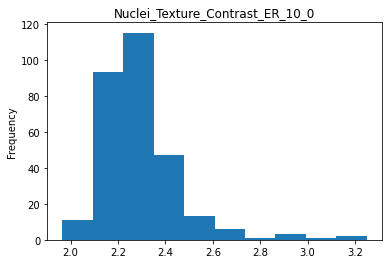

Plotting Nuclei_Texture_Contrast_ER_3_0:  86%|████████▌ | 229/267 [00:53<00:10,  3.58it/s] 

Not normal


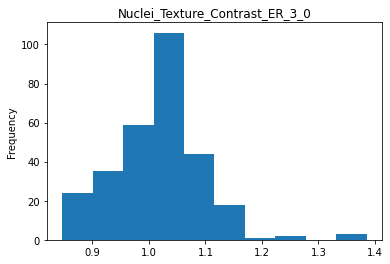

Plotting Nuclei_Texture_Contrast_ER_5_0:  86%|████████▌ | 230/267 [00:54<00:09,  3.84it/s]

Not normal


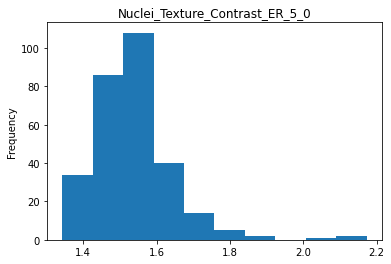

Plotting Nuclei_Texture_Correlation_ER_10_0:  87%|████████▋ | 231/267 [00:54<00:08,  4.05it/s]

Not normal


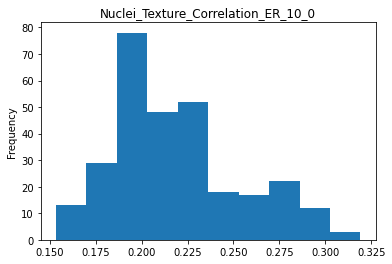

Plotting Nuclei_Texture_Correlation_ER_3_0:  87%|████████▋ | 232/267 [00:54<00:08,  3.97it/s] 

Not normal


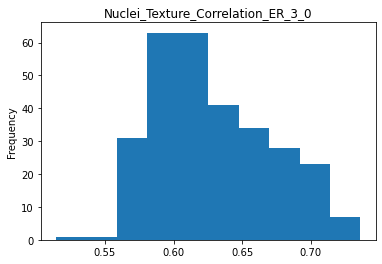

Plotting Nuclei_Texture_Correlation_ER_5_0:  87%|████████▋ | 233/267 [00:54<00:08,  4.14it/s]

Not normal


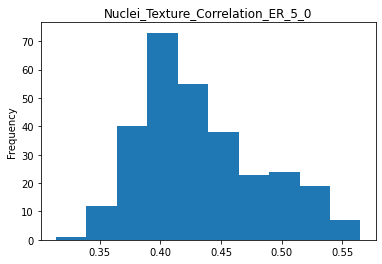

Plotting Nuclei_Texture_DifferenceEntropy_ER_10_0:  88%|████████▊ | 234/267 [00:54<00:07,  4.24it/s]

Not normal


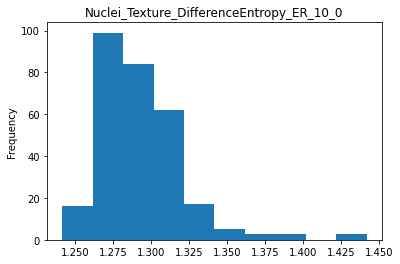

Plotting Nuclei_Texture_DifferenceEntropy_ER_3_0:  88%|████████▊ | 235/267 [00:55<00:07,  4.25it/s] 

Not normal


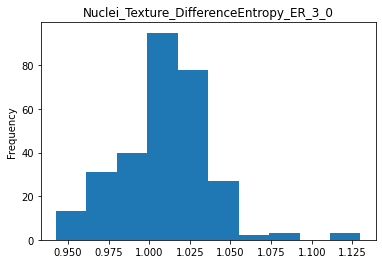

Plotting Nuclei_Texture_DifferenceEntropy_ER_5_0:  88%|████████▊ | 236/267 [00:55<00:07,  4.26it/s]

Not normal


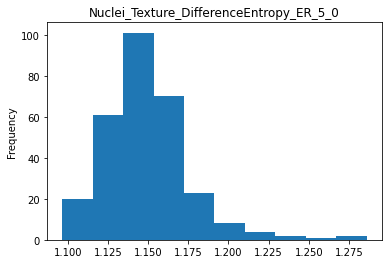

Plotting Nuclei_Texture_DifferenceVariance_ER_10_0:  89%|████████▉ | 237/267 [00:55<00:07,  4.23it/s]

Not normal


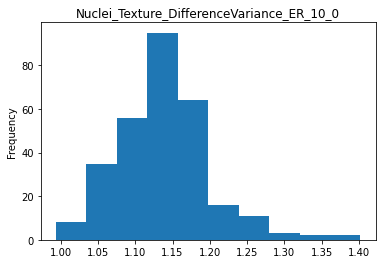

Plotting Nuclei_Texture_DifferenceVariance_ER_3_0:  89%|████████▉ | 238/267 [00:55<00:06,  4.33it/s] 

Not normal


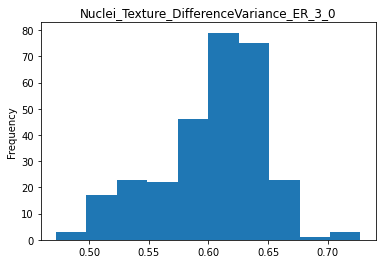

Plotting Nuclei_Texture_DifferenceVariance_ER_5_0:  90%|████████▉ | 239/267 [00:56<00:06,  4.32it/s]

Not normal


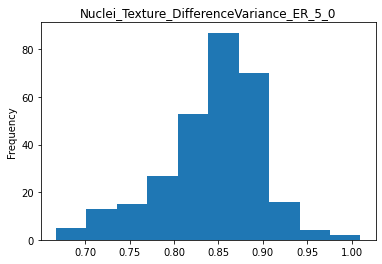

Plotting Nuclei_Texture_Entropy_ER_10_0:  90%|████████▉ | 240/267 [00:56<00:06,  4.42it/s]          

Not normal


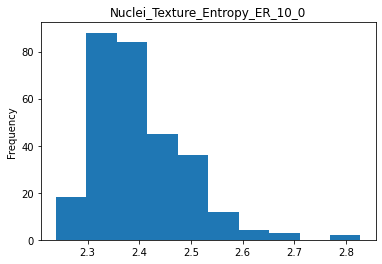

Plotting Nuclei_Texture_Entropy_ER_3_0:  90%|█████████ | 241/267 [00:56<00:05,  4.55it/s] 

Not normal


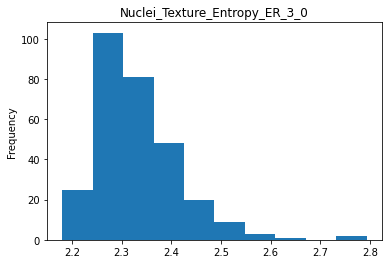

Plotting Nuclei_Texture_Entropy_ER_5_0:  91%|█████████ | 242/267 [00:56<00:05,  4.57it/s]

Not normal


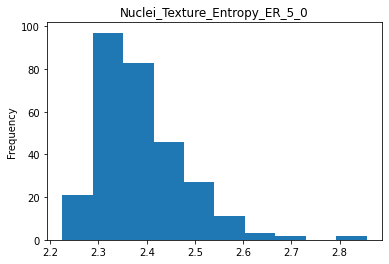

Plotting Nuclei_Texture_Gabor_ER_10:  91%|█████████ | 243/267 [00:56<00:05,  4.57it/s]   

Not normal


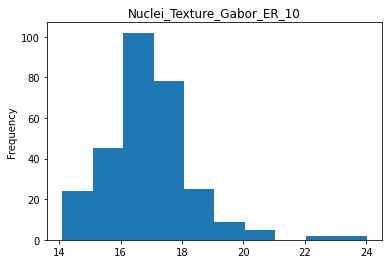

Plotting Nuclei_Texture_Gabor_ER_3:  91%|█████████▏| 244/267 [00:57<00:04,  4.68it/s] 

Not normal


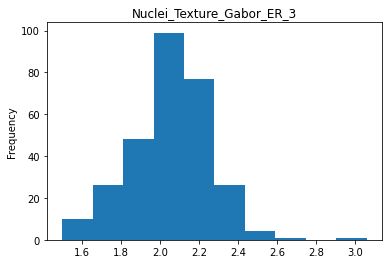

Plotting Nuclei_Texture_Gabor_ER_5:  92%|█████████▏| 245/267 [00:57<00:04,  4.49it/s]

Not normal


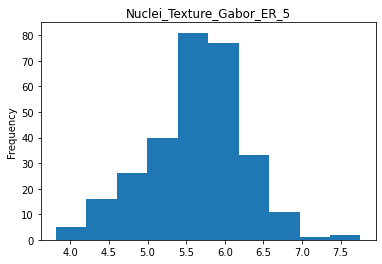

Plotting Nuclei_Texture_InfoMeas1_ER_10_0:  92%|█████████▏| 246/267 [00:57<00:04,  4.41it/s]

Not normal


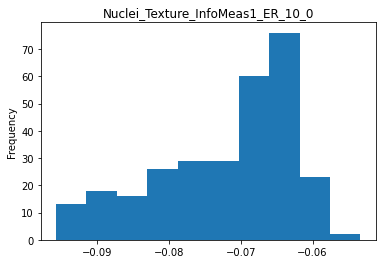

Plotting Nuclei_Texture_InfoMeas1_ER_3_0:  93%|█████████▎| 247/267 [00:57<00:04,  4.57it/s] 

Not normal


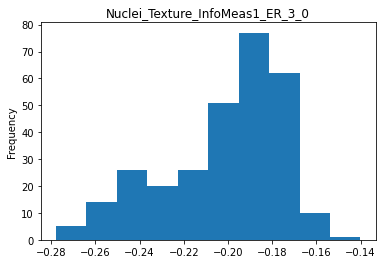

Plotting Nuclei_Texture_InfoMeas1_ER_5_0:  93%|█████████▎| 248/267 [00:58<00:04,  4.36it/s]

Not normal


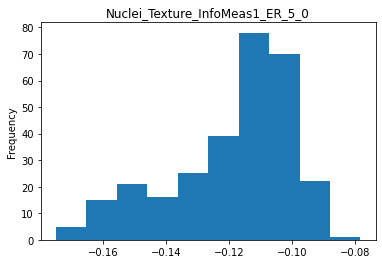

Plotting Nuclei_Texture_InfoMeas2_ER_10_0:  93%|█████████▎| 249/267 [00:58<00:04,  4.39it/s]

Not normal


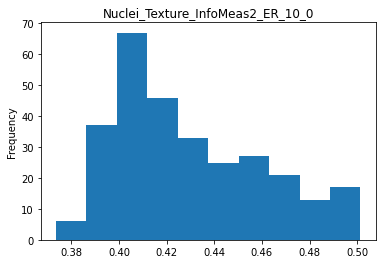

Plotting Nuclei_Texture_InfoMeas2_ER_3_0:  94%|█████████▎| 250/267 [00:58<00:03,  4.36it/s] 

Not normal


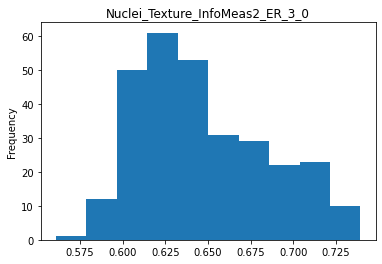

Plotting Nuclei_Texture_InfoMeas2_ER_5_0:  94%|█████████▍| 251/267 [00:58<00:03,  4.32it/s]

Not normal


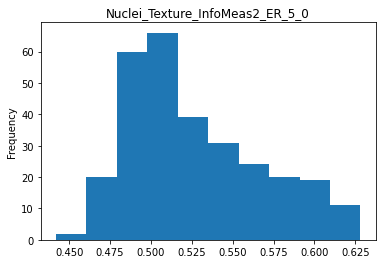

Plotting Nuclei_Texture_InverseDifferenceMoment_ER_10_0:  94%|█████████▍| 252/267 [00:59<00:03,  4.34it/s]

Not normal


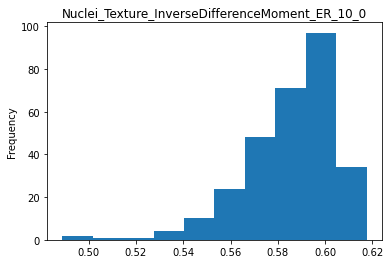

Plotting Nuclei_Texture_InverseDifferenceMoment_ER_3_0:  95%|█████████▍| 253/267 [00:59<00:03,  4.37it/s] 

Not normal


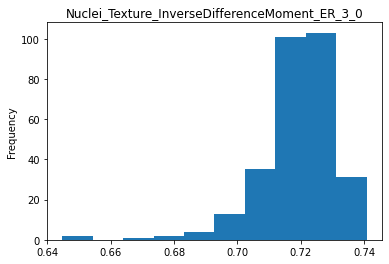

Plotting Nuclei_Texture_InverseDifferenceMoment_ER_5_0:  95%|█████████▌| 254/267 [00:59<00:02,  4.42it/s]

Not normal


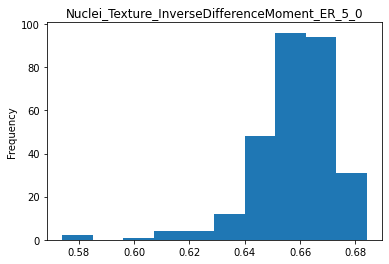

Plotting Nuclei_Texture_SumAverage_ER_10_0:  96%|█████████▌| 255/267 [00:59<00:02,  4.53it/s]            

Not normal


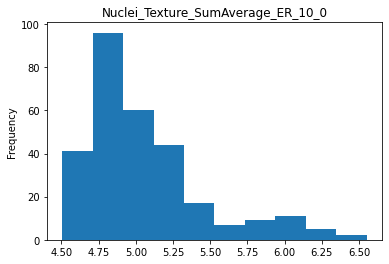

Plotting Nuclei_Texture_SumAverage_ER_3_0:  96%|█████████▌| 256/267 [00:59<00:02,  4.48it/s] 

Not normal


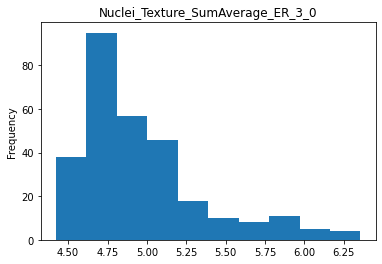

Plotting Nuclei_Texture_SumAverage_ER_5_0:  96%|█████████▋| 257/267 [01:00<00:02,  4.48it/s]

Not normal


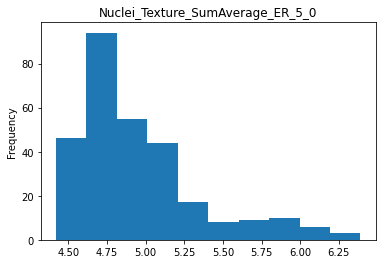

Plotting Nuclei_Texture_SumEntropy_ER_10_0:  97%|█████████▋| 258/267 [01:00<00:02,  4.15it/s]

Not normal


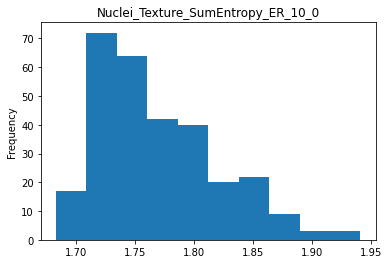

Plotting Nuclei_Texture_SumEntropy_ER_3_0:  97%|█████████▋| 259/267 [01:00<00:01,  4.26it/s] 

Not normal


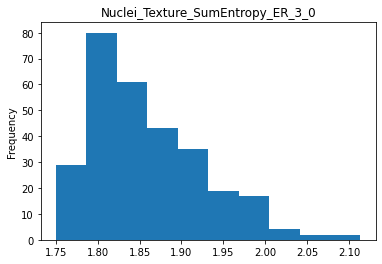

Plotting Nuclei_Texture_SumEntropy_ER_5_0:  97%|█████████▋| 260/267 [01:00<00:01,  4.29it/s]

Not normal


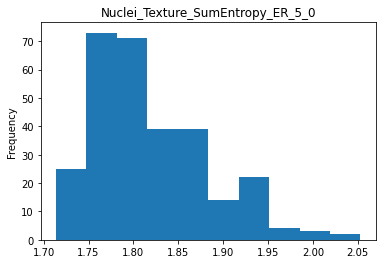

Plotting Nuclei_Texture_SumVariance_ER_10_0:  98%|█████████▊| 261/267 [01:01<00:01,  4.31it/s]

Not normal


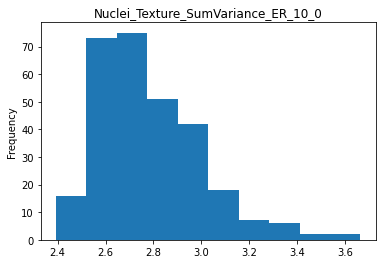

Plotting Nuclei_Texture_SumVariance_ER_3_0:  98%|█████████▊| 262/267 [01:01<00:01,  4.19it/s] 

Not normal


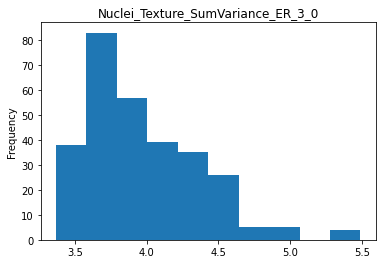

Plotting Nuclei_Texture_SumVariance_ER_5_0:  99%|█████████▊| 263/267 [01:01<00:00,  4.20it/s]

Not normal


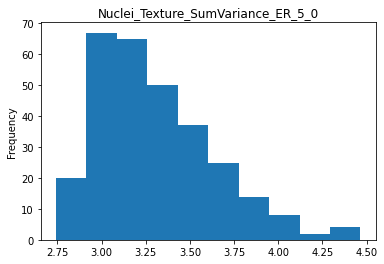

Plotting Nuclei_Texture_Variance_ER_10_0:  99%|█████████▉| 264/267 [01:01<00:00,  4.05it/s]  

Not normal


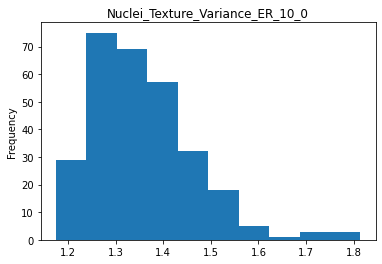

Plotting Nuclei_Texture_Variance_ER_3_0:  99%|█████████▉| 265/267 [01:02<00:00,  4.11it/s] 

Not normal


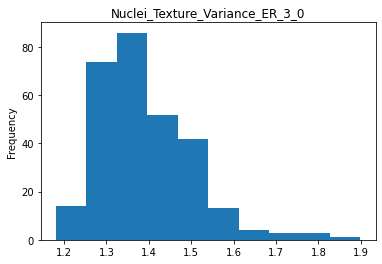

Plotting Nuclei_Texture_Variance_ER_5_0: 100%|█████████▉| 266/267 [01:02<00:00,  4.25it/s]

Not normal


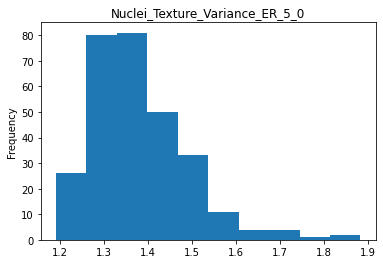

Plotting Nuclei_Texture_Variance_ER_5_0: 100%|██████████| 267/267 [01:02<00:00,  4.27it/s]


In [26]:
ER_df = Data_object.exclude_other_channels("ER")
display_plots(ER_df)

# Mito distribution

Plotting Cells_Granularity_10_Mito:   0%|          | 0/267 [00:00<?, ?it/s]

Not normal


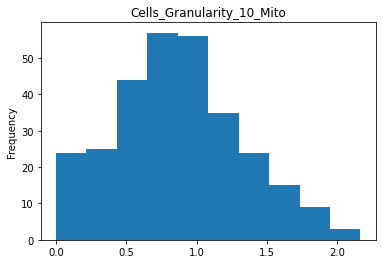

Plotting Cells_Granularity_11_Mito:   0%|          | 1/267 [00:00<01:15,  3.54it/s]

Not normal


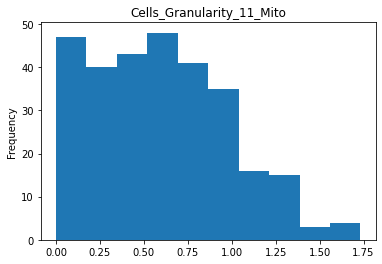

Plotting Cells_Granularity_12_Mito:   1%|          | 2/267 [00:00<01:54,  2.32it/s]

Not normal


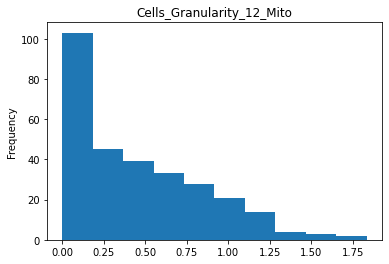

Plotting Cells_Granularity_13_Mito:   1%|          | 3/267 [00:01<01:29,  2.96it/s]

Not normal


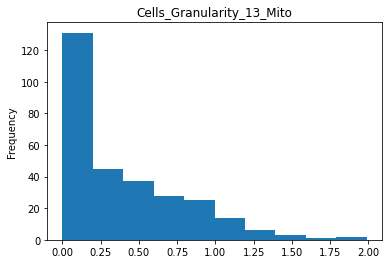

Plotting Cells_Granularity_14_Mito:   1%|▏         | 4/267 [00:01<01:23,  3.17it/s]

Not normal


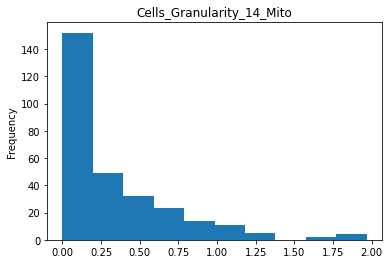

Plotting Cells_Granularity_15_Mito:   2%|▏         | 5/267 [00:01<01:15,  3.49it/s]

Not normal


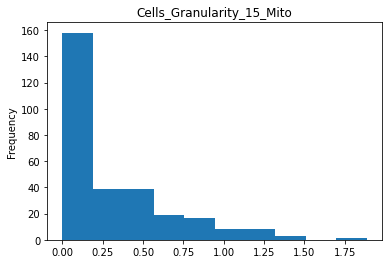

Plotting Cells_Granularity_16_Mito:   2%|▏         | 6/267 [00:01<01:12,  3.60it/s]

Not normal


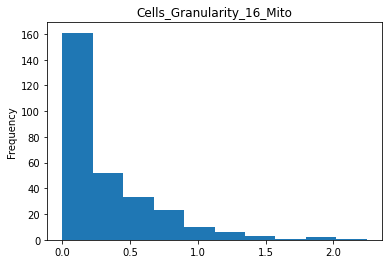

Plotting Cells_Granularity_1_Mito:   3%|▎         | 7/267 [00:02<01:06,  3.88it/s] 

Not normal


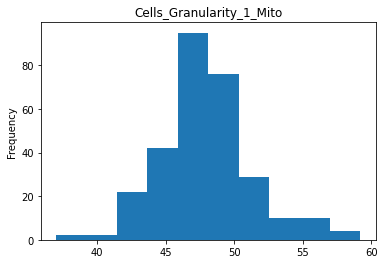

Plotting Cells_Granularity_2_Mito:   3%|▎         | 8/267 [00:02<01:01,  4.21it/s]

Not normal


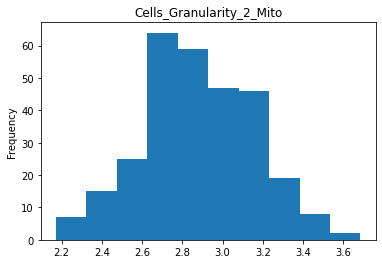

Plotting Cells_Granularity_3_Mito:   3%|▎         | 9/267 [00:02<01:00,  4.27it/s]

Not normal


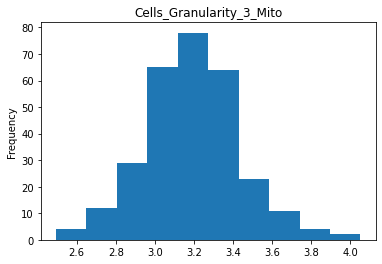

Plotting Cells_Granularity_4_Mito:   4%|▎         | 10/267 [00:02<01:01,  4.19it/s]

Not normal


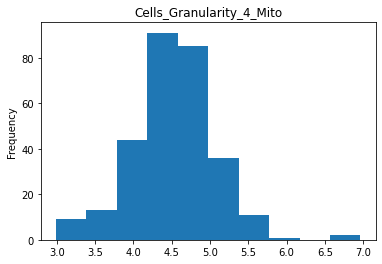

Plotting Cells_Granularity_5_Mito:   4%|▍         | 11/267 [00:02<00:58,  4.35it/s]

Not normal


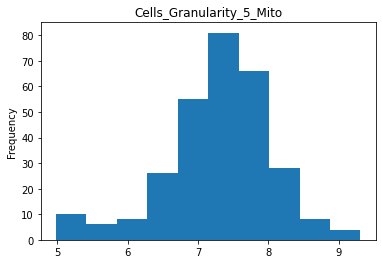

Plotting Cells_Granularity_6_Mito:   4%|▍         | 12/267 [00:03<00:57,  4.44it/s]

Not normal


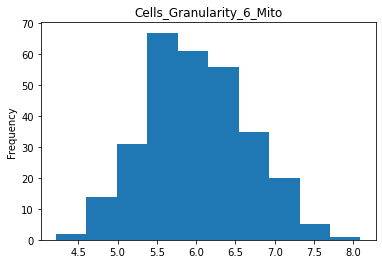

Plotting Cells_Granularity_7_Mito:   5%|▍         | 13/267 [00:03<00:58,  4.33it/s]

Not normal


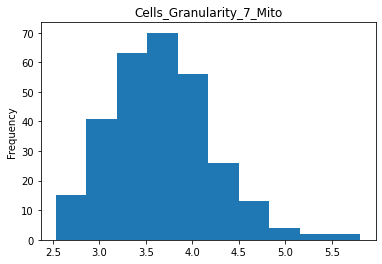

Plotting Cells_Granularity_8_Mito:   5%|▌         | 14/267 [00:03<00:57,  4.37it/s]

Not normal


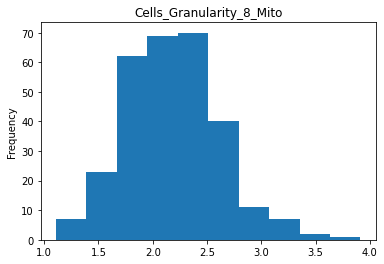

Plotting Cells_Granularity_9_Mito:   6%|▌         | 15/267 [00:03<00:57,  4.36it/s]

Not normal


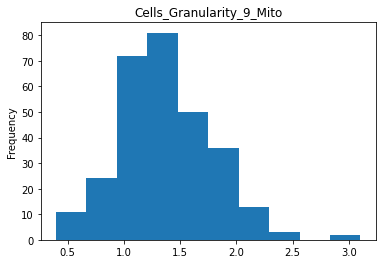

Plotting Cells_Intensity_IntegratedIntensityEdge_Mito:   6%|▌         | 16/267 [00:04<00:55,  4.53it/s]

Not normal


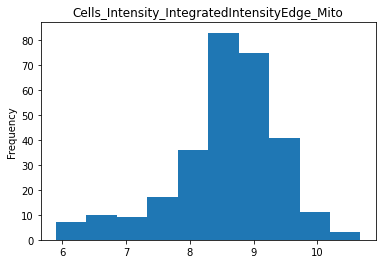

Plotting Cells_Intensity_IntegratedIntensity_Mito:   6%|▋         | 17/267 [00:04<00:53,  4.66it/s]    

Not normal


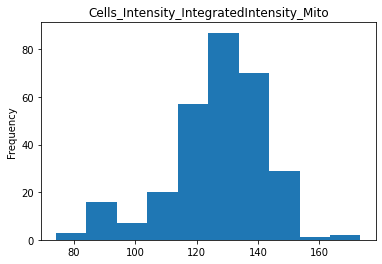

Plotting Cells_Intensity_LowerQuartileIntensity_Mito:   7%|▋         | 18/267 [00:04<00:54,  4.57it/s]

Not normal


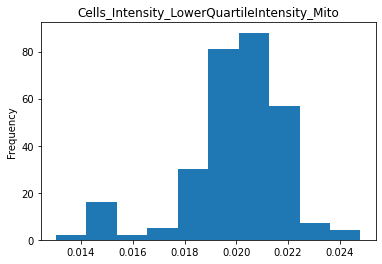

Plotting Cells_Intensity_MADIntensity_Mito:   7%|▋         | 19/267 [00:04<00:53,  4.61it/s]          

Not normal


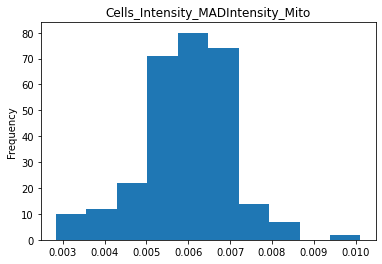

Plotting Cells_Intensity_MassDisplacement_Mito:   7%|▋         | 20/267 [00:04<00:56,  4.40it/s]

Not normal


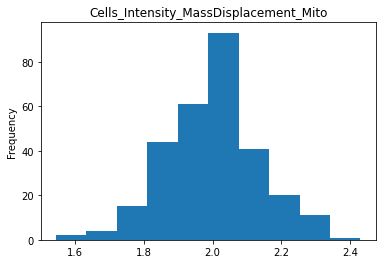

Plotting Cells_Intensity_MaxIntensityEdge_Mito:   8%|▊         | 21/267 [00:05<00:56,  4.38it/s]

Not normal


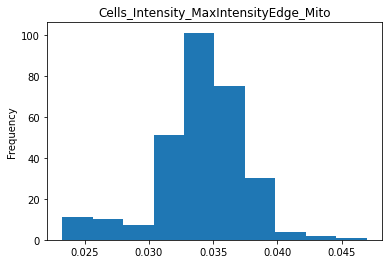

Plotting Cells_Intensity_MaxIntensity_Mito:   8%|▊         | 22/267 [00:05<00:56,  4.30it/s]    

Not normal


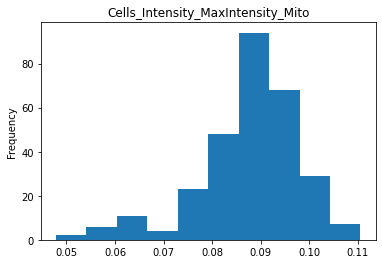

Plotting Cells_Intensity_MeanIntensityEdge_Mito:   9%|▊         | 23/267 [00:05<00:53,  4.54it/s]

Not normal


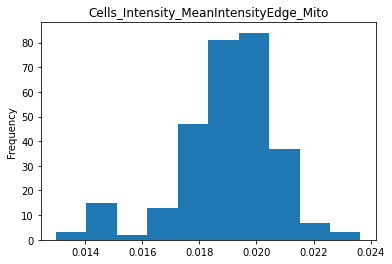

Plotting Cells_Intensity_MeanIntensity_Mito:   9%|▉         | 24/267 [00:05<00:52,  4.64it/s]    

Not normal


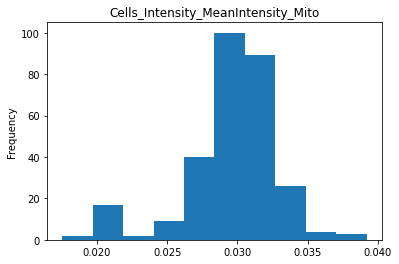

Plotting Cells_Intensity_MedianIntensity_Mito:   9%|▉         | 25/267 [00:05<00:49,  4.87it/s]

Not normal


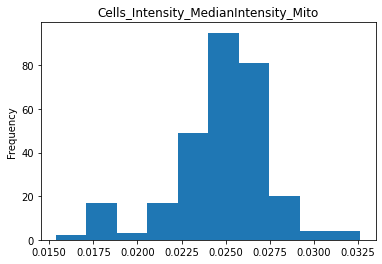

Plotting Cells_Intensity_MinIntensityEdge_Mito:  10%|▉         | 26/267 [00:06<00:49,  4.87it/s]

Not normal


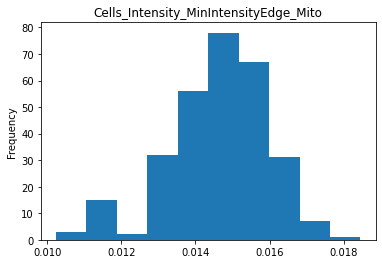

Plotting Cells_Intensity_MinIntensity_Mito:  10%|█         | 27/267 [00:06<00:48,  4.92it/s]    

Not normal


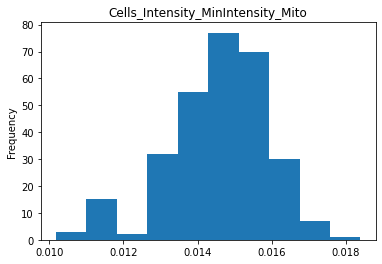

Plotting Cells_Intensity_StdIntensityEdge_Mito:  10%|█         | 28/267 [00:06<00:50,  4.72it/s]

Not normal


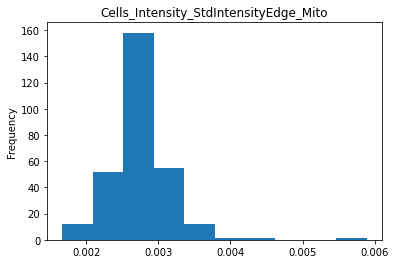

Plotting Cells_Intensity_StdIntensity_Mito:  11%|█         | 29/267 [00:06<00:53,  4.46it/s]    

Not normal


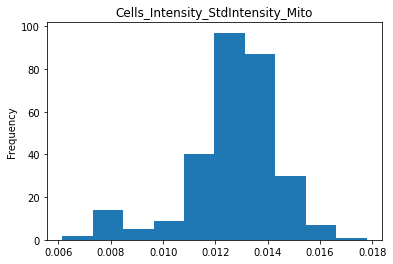

Plotting Cells_Intensity_UpperQuartileIntensity_Mito:  11%|█         | 30/267 [00:07<00:52,  4.50it/s]

Not normal


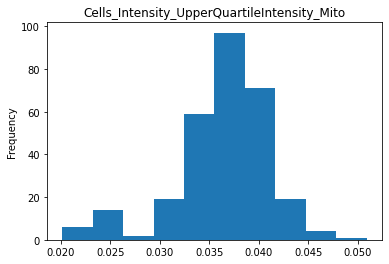

Plotting Cells_Location_CenterMassIntensity_X_Mito:  12%|█▏        | 31/267 [00:07<00:54,  4.31it/s]  

Not normal


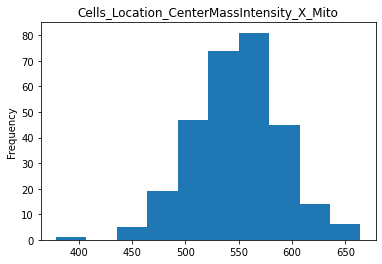

Plotting Cells_Location_CenterMassIntensity_Y_Mito:  12%|█▏        | 32/267 [00:07<00:53,  4.36it/s]

Not normal


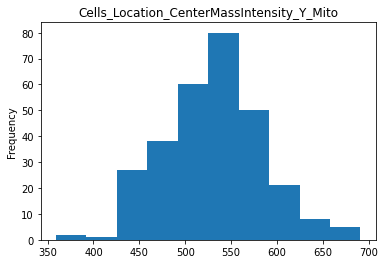

Plotting Cells_Location_MaxIntensity_X_Mito:  12%|█▏        | 33/267 [00:07<00:55,  4.18it/s]       

Not normal


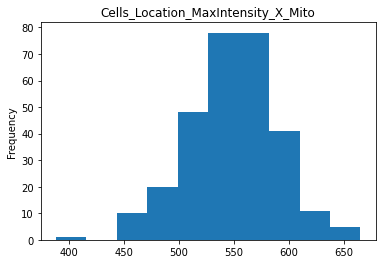

Plotting Cells_Location_MaxIntensity_Y_Mito:  13%|█▎        | 34/267 [00:08<00:58,  4.02it/s]

Not normal


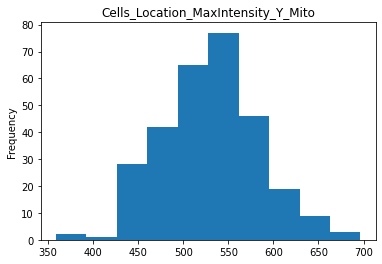

Plotting Cells_RadialDistribution_FracAtD_Mito_1of4:  13%|█▎        | 35/267 [00:08<01:04,  3.61it/s]

Not normal


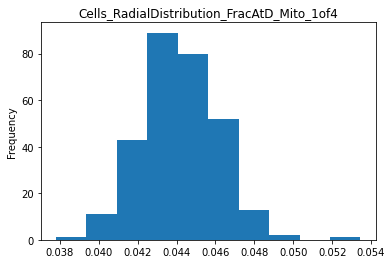

Plotting Cells_RadialDistribution_FracAtD_Mito_2of4:  13%|█▎        | 36/267 [00:08<01:00,  3.83it/s]

Not normal


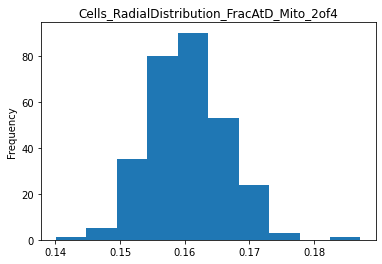

Plotting Cells_RadialDistribution_FracAtD_Mito_3of4:  14%|█▍        | 37/267 [00:08<00:55,  4.11it/s]

Not normal


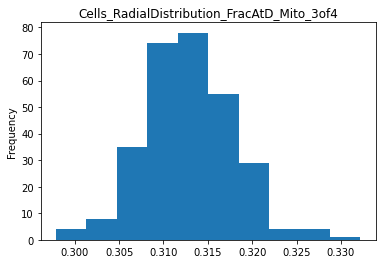

Plotting Cells_RadialDistribution_FracAtD_Mito_4of4:  14%|█▍        | 38/267 [00:09<01:00,  3.82it/s]

Not normal


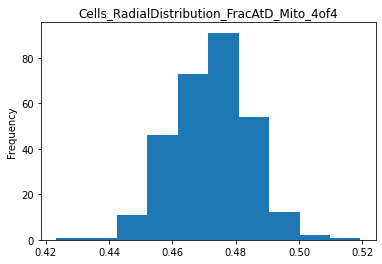

Plotting Cells_RadialDistribution_MeanFrac_Mito_1of4:  15%|█▍        | 39/267 [00:09<01:03,  3.59it/s]

Not normal


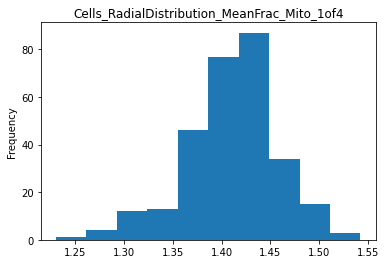

Plotting Cells_RadialDistribution_MeanFrac_Mito_2of4:  15%|█▍        | 40/267 [00:09<01:01,  3.71it/s]

Not normal


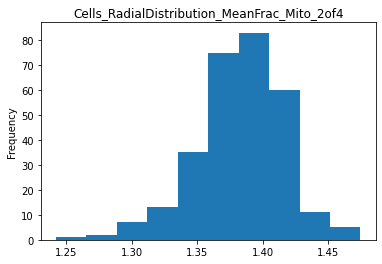

Plotting Cells_RadialDistribution_MeanFrac_Mito_3of4:  15%|█▌        | 41/267 [00:10<01:22,  2.74it/s]

Not normal


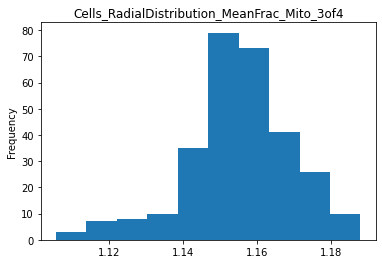

Plotting Cells_RadialDistribution_MeanFrac_Mito_4of4:  16%|█▌        | 42/267 [00:10<01:14,  3.01it/s]

Not normal


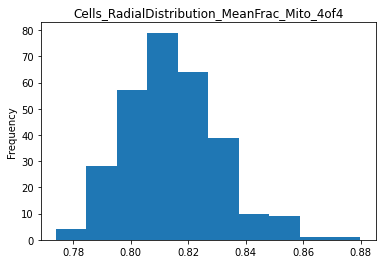

Plotting Cells_RadialDistribution_RadialCV_Mito_1of4:  16%|█▌        | 43/267 [00:10<01:08,  3.27it/s]

Not normal


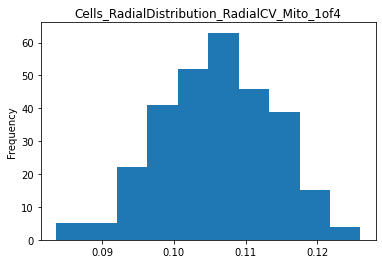

Plotting Cells_RadialDistribution_RadialCV_Mito_2of4:  16%|█▋        | 44/267 [00:11<01:03,  3.50it/s]

Not normal


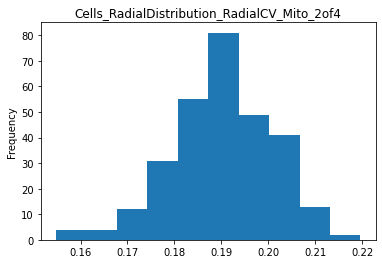

Plotting Cells_RadialDistribution_RadialCV_Mito_3of4:  17%|█▋        | 45/267 [00:11<01:01,  3.60it/s]

Not normal


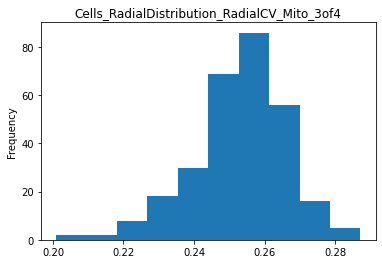

Plotting Cells_RadialDistribution_RadialCV_Mito_4of4:  17%|█▋        | 46/267 [00:11<00:56,  3.92it/s]

Not normal


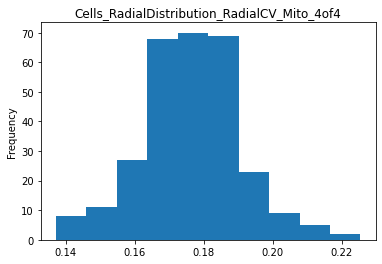

Plotting Cells_Texture_AngularSecondMoment_Mito_10_0:  18%|█▊        | 47/267 [00:11<00:54,  4.06it/s]

Not normal


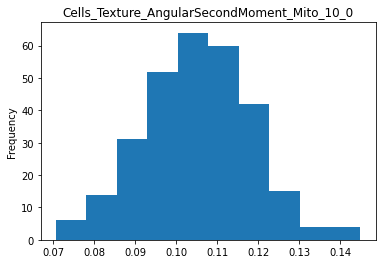

Plotting Cells_Texture_AngularSecondMoment_Mito_3_0:  18%|█▊        | 48/267 [00:11<00:53,  4.12it/s] 

Not normal


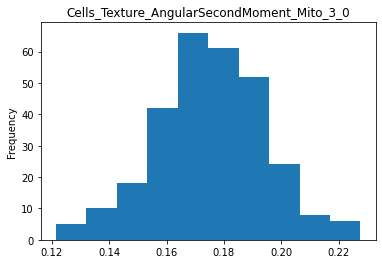

Plotting Cells_Texture_AngularSecondMoment_Mito_5_0:  18%|█▊        | 49/267 [00:12<00:53,  4.09it/s]

Not normal


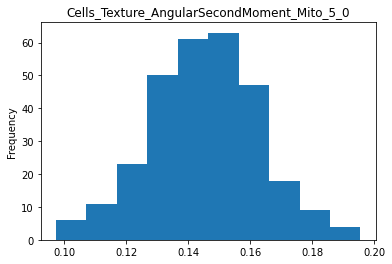

Plotting Cells_Texture_Contrast_Mito_10_0:  19%|█▊        | 50/267 [00:12<00:49,  4.38it/s]          

Not normal


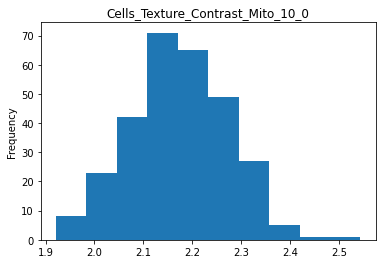

Plotting Cells_Texture_Contrast_Mito_3_0:  19%|█▉        | 51/267 [00:12<00:49,  4.33it/s] 

Not normal


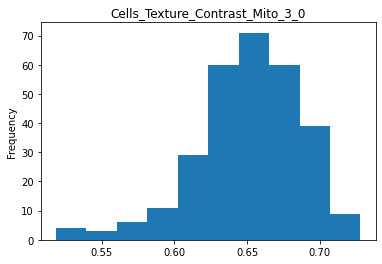

Plotting Cells_Texture_Contrast_Mito_5_0:  19%|█▉        | 52/267 [00:12<00:47,  4.54it/s]

Not normal


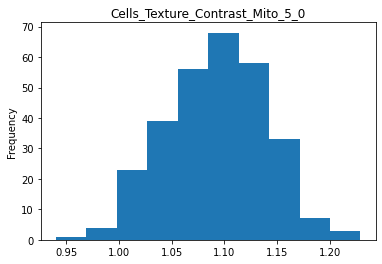

Plotting Cells_Texture_Correlation_Mito_10_0:  20%|█▉        | 53/267 [00:13<00:54,  3.96it/s]

Not normal


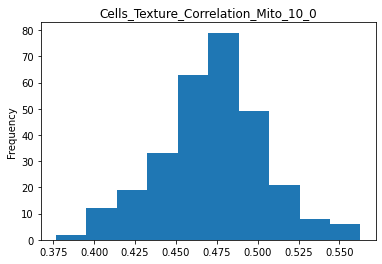

Plotting Cells_Texture_Correlation_Mito_3_0:  20%|██        | 54/267 [00:13<00:53,  3.96it/s] 

Not normal


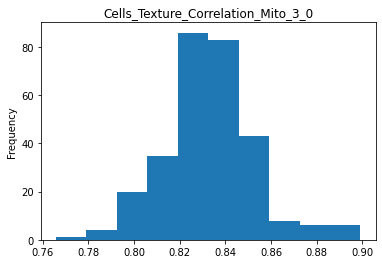

Plotting Cells_Texture_Correlation_Mito_5_0:  21%|██        | 55/267 [00:13<00:57,  3.72it/s]

Not normal


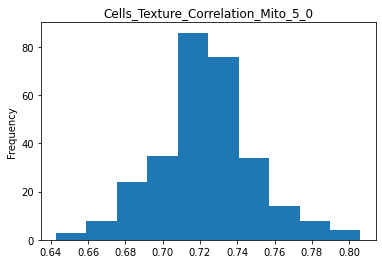

Plotting Cells_Texture_DifferenceEntropy_Mito_10_0:  21%|██        | 56/267 [00:14<01:02,  3.39it/s]

Not normal


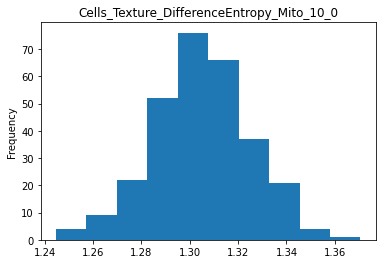

Plotting Cells_Texture_DifferenceEntropy_Mito_3_0:  21%|██▏       | 57/267 [00:14<01:10,  2.97it/s] 

Not normal


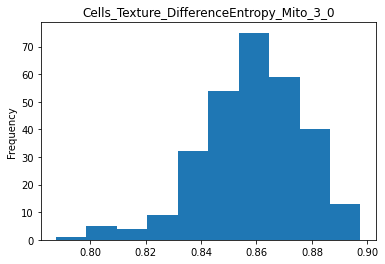

Plotting Cells_Texture_DifferenceEntropy_Mito_5_0:  22%|██▏       | 58/267 [00:14<01:18,  2.68it/s]

Not normal


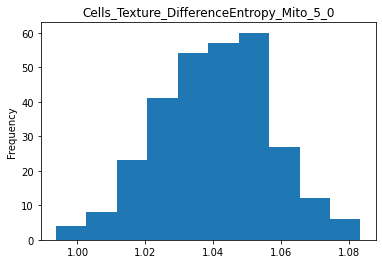

Plotting Cells_Texture_DifferenceVariance_Mito_10_0:  22%|██▏       | 59/267 [00:15<01:16,  2.73it/s]

Not normal


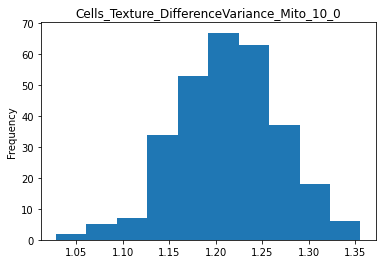

Plotting Cells_Texture_DifferenceVariance_Mito_3_0:  22%|██▏       | 60/267 [00:15<01:18,  2.64it/s] 

Not normal


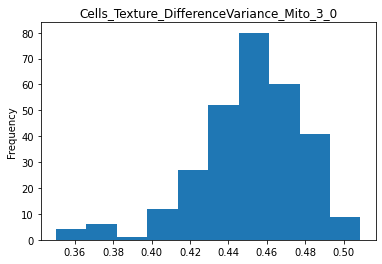

Plotting Cells_Texture_DifferenceVariance_Mito_5_0:  23%|██▎       | 61/267 [00:16<01:21,  2.53it/s]

Not normal


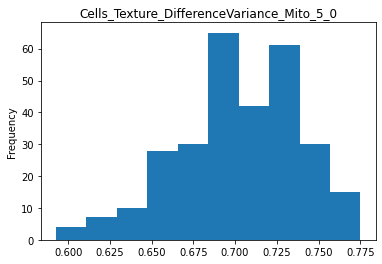

Plotting Cells_Texture_Entropy_Mito_10_0:  23%|██▎       | 62/267 [00:16<01:23,  2.45it/s]          

Not normal


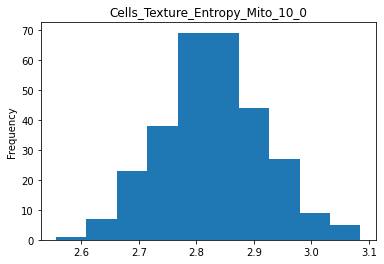

Plotting Cells_Texture_Entropy_Mito_3_0:  24%|██▎       | 63/267 [00:17<01:25,  2.38it/s] 

Not normal


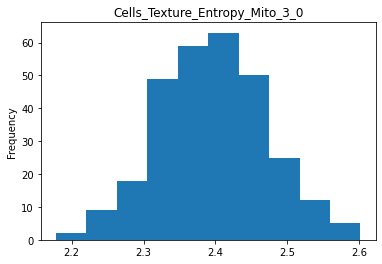

Plotting Cells_Texture_Entropy_Mito_5_0:  24%|██▍       | 64/267 [00:17<01:39,  2.05it/s]

Not normal


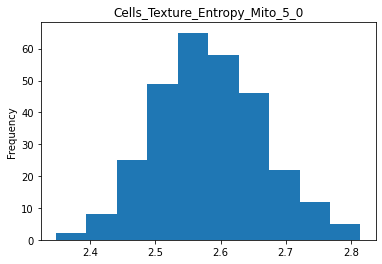

Plotting Cells_Texture_Gabor_Mito_10:  24%|██▍       | 65/267 [00:18<01:47,  1.89it/s]   

Not normal


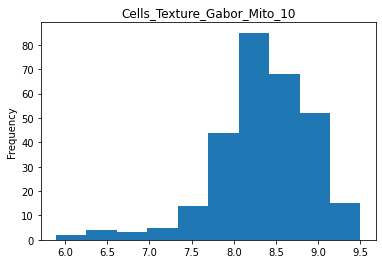

Plotting Cells_Texture_Gabor_Mito_3:  25%|██▍       | 66/267 [00:18<01:49,  1.83it/s] 

Not normal


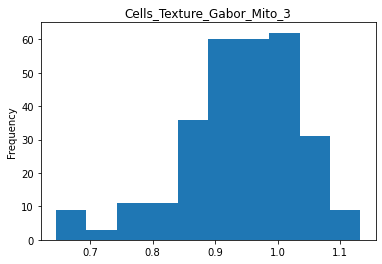

Plotting Cells_Texture_Gabor_Mito_5:  25%|██▌       | 67/267 [00:19<01:41,  1.97it/s]

Not normal


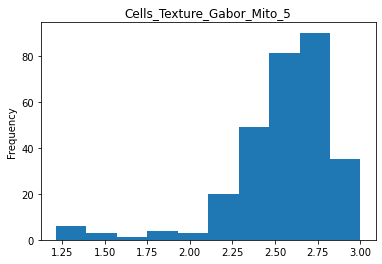

Plotting Cells_Texture_InfoMeas1_Mito_10_0:  25%|██▌       | 68/267 [00:19<01:31,  2.16it/s]

Not normal


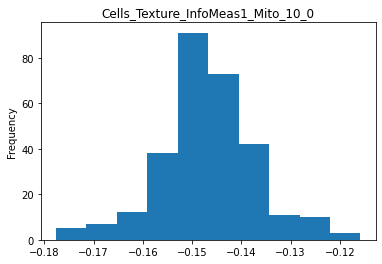

Plotting Cells_Texture_InfoMeas1_Mito_3_0:  26%|██▌       | 69/267 [00:20<01:26,  2.28it/s] 

Not normal


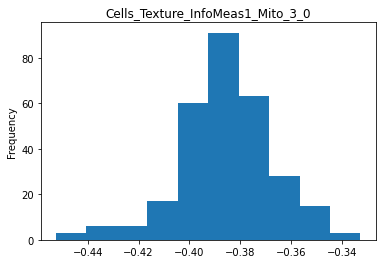

Plotting Cells_Texture_InfoMeas1_Mito_5_0:  26%|██▌       | 70/267 [00:20<01:27,  2.26it/s]

Not normal


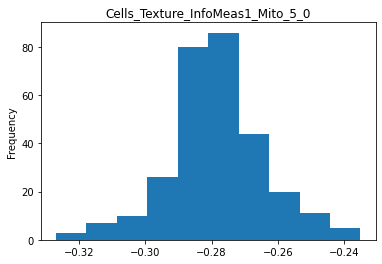

Plotting Cells_Texture_InfoMeas2_Mito_10_0:  27%|██▋       | 71/267 [00:20<01:19,  2.45it/s]

Not normal


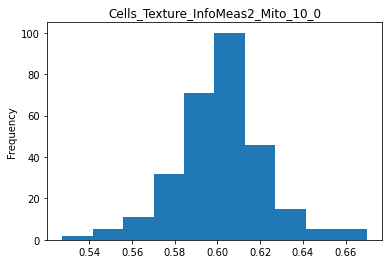

Plotting Cells_Texture_InfoMeas2_Mito_3_0:  27%|██▋       | 72/267 [00:21<01:17,  2.53it/s] 

Not normal


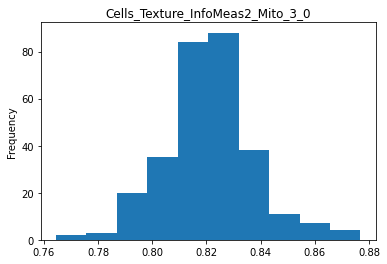

Plotting Cells_Texture_InfoMeas2_Mito_5_0:  27%|██▋       | 73/267 [00:21<01:14,  2.60it/s]

Not normal


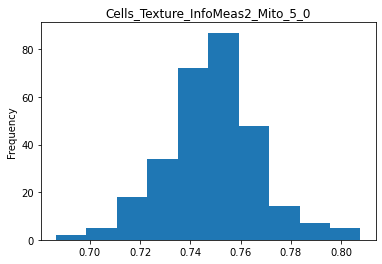

Plotting Cells_Texture_InverseDifferenceMoment_Mito_10_0:  28%|██▊       | 74/267 [00:21<01:12,  2.66it/s]

Not normal


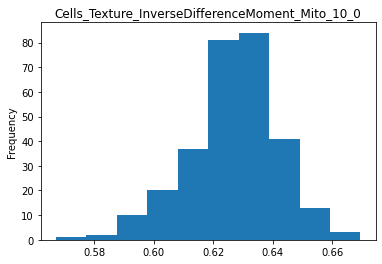

Plotting Cells_Texture_InverseDifferenceMoment_Mito_3_0:  28%|██▊       | 75/267 [00:22<01:12,  2.66it/s] 

Not normal


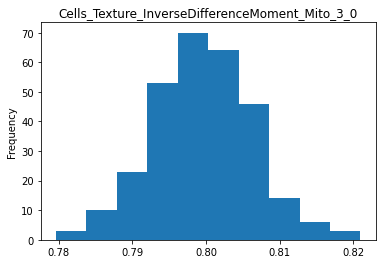

Plotting Cells_Texture_InverseDifferenceMoment_Mito_5_0:  28%|██▊       | 76/267 [00:22<01:13,  2.58it/s]

Not normal


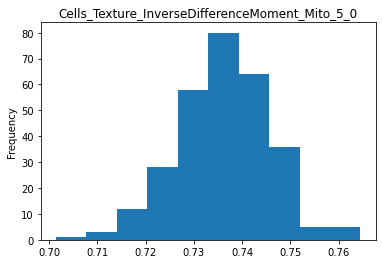

Plotting Cells_Texture_SumAverage_Mito_10_0:  29%|██▉       | 77/267 [00:23<01:14,  2.56it/s]            

Not normal


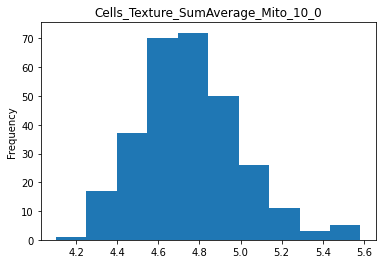

Plotting Cells_Texture_SumAverage_Mito_3_0:  29%|██▉       | 78/267 [00:23<01:29,  2.11it/s] 

Not normal


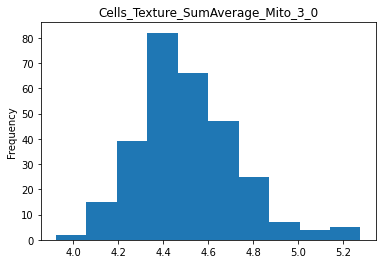

Plotting Cells_Texture_SumAverage_Mito_5_0:  30%|██▉       | 79/267 [00:24<01:34,  2.00it/s]

Not normal


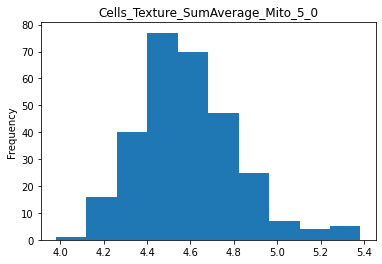

Plotting Cells_Texture_SumEntropy_Mito_10_0:  30%|██▉       | 80/267 [00:24<01:29,  2.10it/s]

Not normal


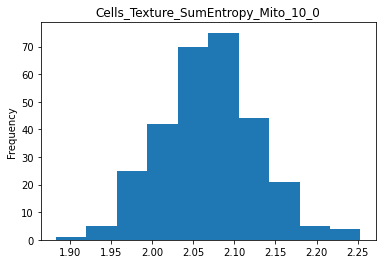

Plotting Cells_Texture_SumEntropy_Mito_3_0:  30%|███       | 81/267 [00:25<01:28,  2.09it/s] 

Not normal


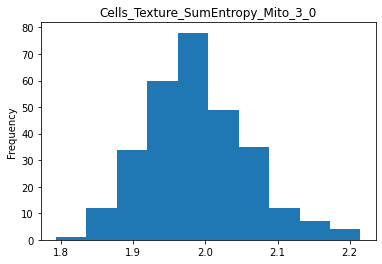

Plotting Cells_Texture_SumEntropy_Mito_5_0:  31%|███       | 82/267 [00:26<01:46,  1.74it/s]

Not normal


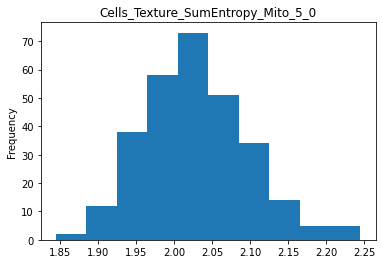

Plotting Cells_Texture_SumVariance_Mito_10_0:  31%|███       | 83/267 [00:26<01:39,  1.85it/s]

Not normal


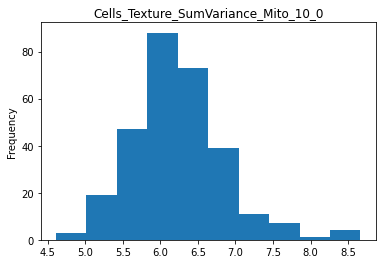

Plotting Cells_Texture_SumVariance_Mito_3_0:  31%|███▏      | 84/267 [00:26<01:30,  2.01it/s] 

Not normal


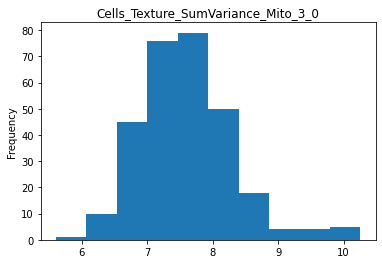

Plotting Cells_Texture_SumVariance_Mito_5_0:  32%|███▏      | 85/267 [00:27<01:23,  2.19it/s]

Not normal


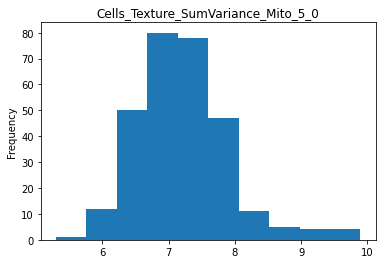

Plotting Cells_Texture_Variance_Mito_10_0:  32%|███▏      | 86/267 [00:27<01:17,  2.34it/s]  

Not normal


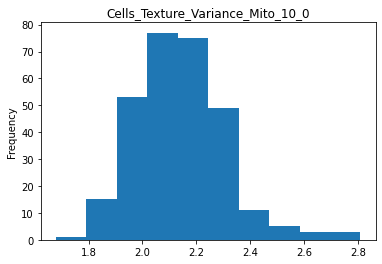

Plotting Cells_Texture_Variance_Mito_3_0:  33%|███▎      | 87/267 [00:28<01:17,  2.34it/s] 

Not normal


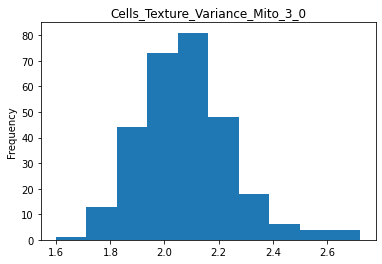

Plotting Cells_Texture_Variance_Mito_5_0:  33%|███▎      | 88/267 [00:28<01:22,  2.17it/s]

Not normal


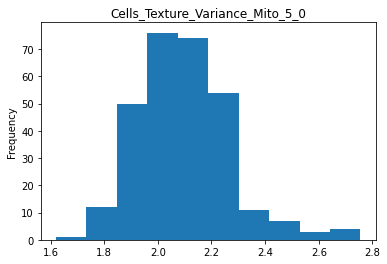

Plotting Cytoplasm_Granularity_10_Mito:  33%|███▎      | 89/267 [00:28<01:15,  2.36it/s]  

Not normal


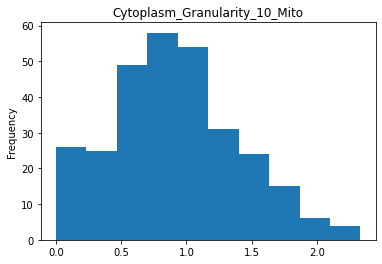

Plotting Cytoplasm_Granularity_11_Mito:  34%|███▎      | 90/267 [00:29<01:03,  2.80it/s]

Not normal


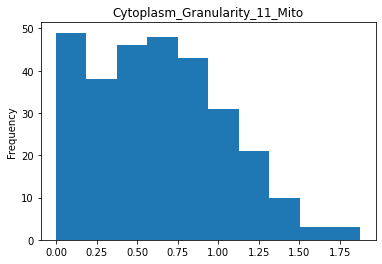

Plotting Cytoplasm_Granularity_12_Mito:  34%|███▍      | 91/267 [00:29<00:55,  3.17it/s]

Not normal


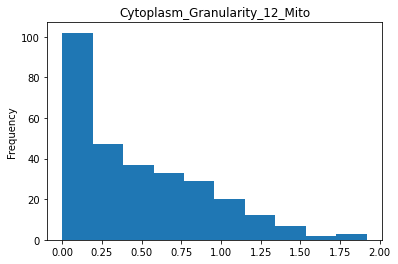

Plotting Cytoplasm_Granularity_13_Mito:  34%|███▍      | 92/267 [00:29<00:48,  3.62it/s]

Not normal


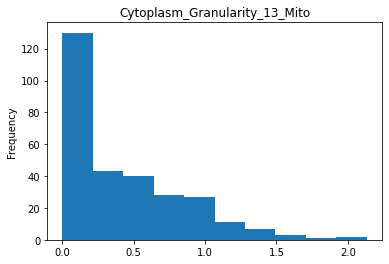

Plotting Cytoplasm_Granularity_14_Mito:  35%|███▍      | 93/267 [00:29<00:44,  3.94it/s]

Not normal


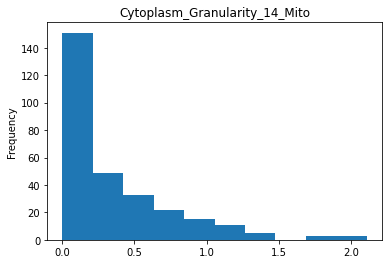

Plotting Cytoplasm_Granularity_15_Mito:  35%|███▌      | 94/267 [00:29<00:41,  4.16it/s]

Not normal


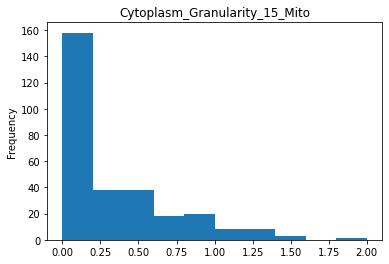

Plotting Cytoplasm_Granularity_16_Mito:  36%|███▌      | 95/267 [00:30<00:41,  4.11it/s]

Not normal


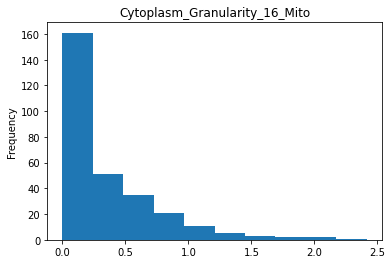

Plotting Cytoplasm_Granularity_1_Mito:  36%|███▌      | 96/267 [00:30<00:41,  4.08it/s] 

Not normal


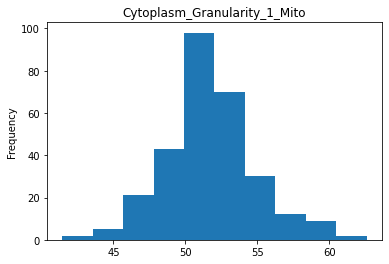

Plotting Cytoplasm_Granularity_2_Mito:  36%|███▋      | 97/267 [00:30<00:39,  4.36it/s]

Not normal


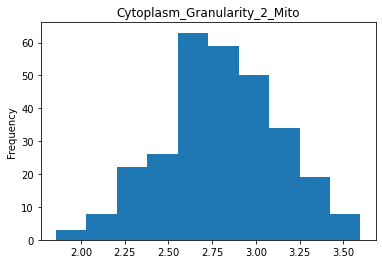

Plotting Cytoplasm_Granularity_3_Mito:  37%|███▋      | 98/267 [00:30<00:36,  4.64it/s]

Not normal


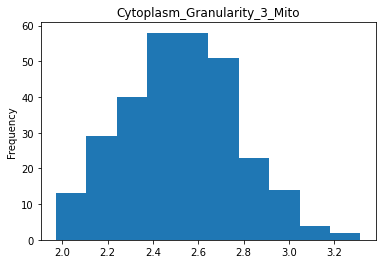

Plotting Cytoplasm_Granularity_4_Mito:  37%|███▋      | 99/267 [00:31<00:34,  4.83it/s]

Not normal


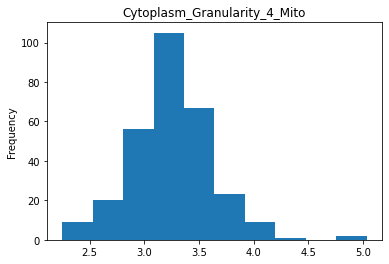

Plotting Cytoplasm_Granularity_5_Mito:  37%|███▋      | 100/267 [00:31<00:33,  4.96it/s]

Not normal


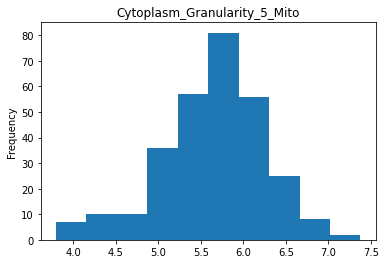

Plotting Cytoplasm_Granularity_6_Mito:  38%|███▊      | 101/267 [00:31<00:33,  4.94it/s]

Not normal


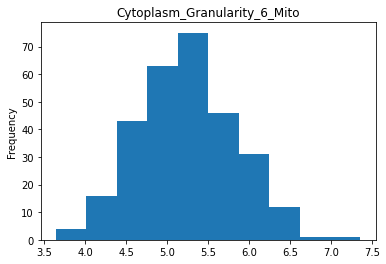

Plotting Cytoplasm_Granularity_7_Mito:  38%|███▊      | 102/267 [00:31<00:34,  4.84it/s]

Not normal


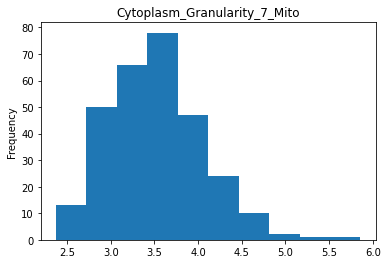

Plotting Cytoplasm_Granularity_8_Mito:  39%|███▊      | 103/267 [00:31<00:33,  4.91it/s]

Not normal


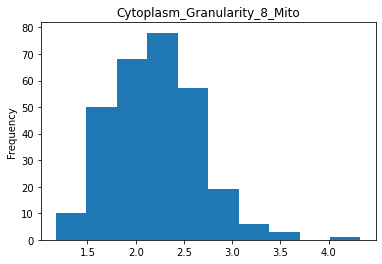

Plotting Cytoplasm_Granularity_9_Mito:  39%|███▉      | 104/267 [00:32<00:32,  4.99it/s]

Not normal


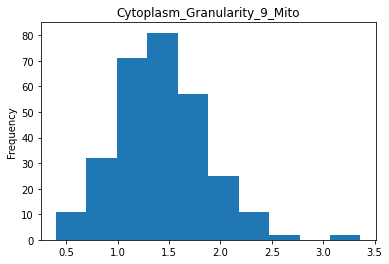

Plotting Cytoplasm_Intensity_IntegratedIntensityEdge_Mito:  39%|███▉      | 105/267 [00:32<00:33,  4.78it/s]

Not normal


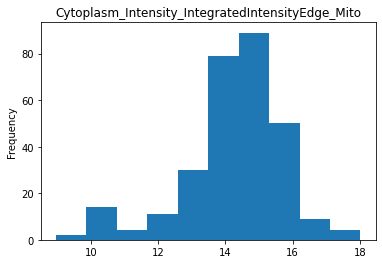

Plotting Cytoplasm_Intensity_IntegratedIntensity_Mito:  40%|███▉      | 106/267 [00:32<00:32,  4.95it/s]    

Not normal


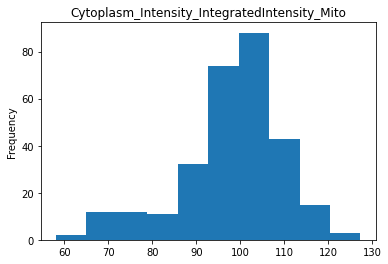

Plotting Cytoplasm_Intensity_LowerQuartileIntensity_Mito:  40%|████      | 107/267 [00:32<00:32,  4.92it/s]

Not normal


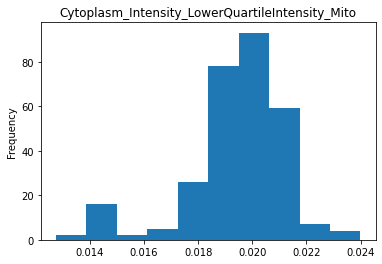

Plotting Cytoplasm_Intensity_MADIntensity_Mito:  40%|████      | 108/267 [00:32<00:31,  5.03it/s]          

Not normal


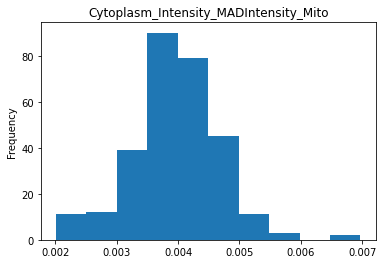

Plotting Cytoplasm_Intensity_MassDisplacement_Mito:  41%|████      | 109/267 [00:33<00:32,  4.93it/s]

Not normal


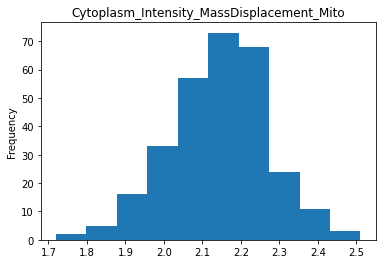

Plotting Cytoplasm_Intensity_MaxIntensityEdge_Mito:  41%|████      | 110/267 [00:33<00:32,  4.83it/s]

Not normal


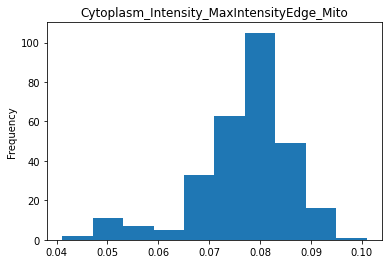

Plotting Cytoplasm_Intensity_MaxIntensity_Mito:  42%|████▏     | 111/267 [00:33<00:33,  4.70it/s]    

Not normal


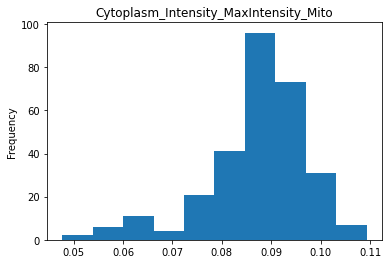

Plotting Cytoplasm_Intensity_MeanIntensityEdge_Mito:  42%|████▏     | 112/267 [00:33<00:32,  4.73it/s]

Not normal


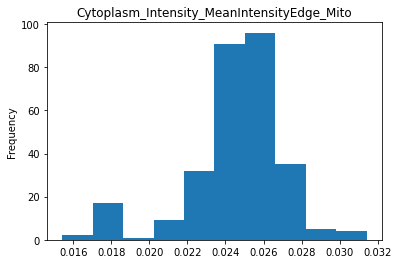

Plotting Cytoplasm_Intensity_MeanIntensity_Mito:  42%|████▏     | 113/267 [00:33<00:31,  4.83it/s]    

Not normal


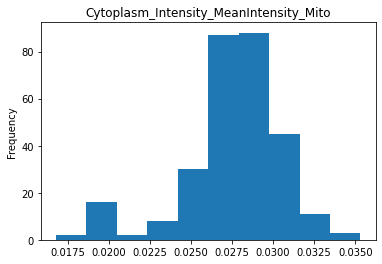

Plotting Cytoplasm_Intensity_MedianIntensity_Mito:  43%|████▎     | 114/267 [00:34<00:31,  4.91it/s]

Not normal


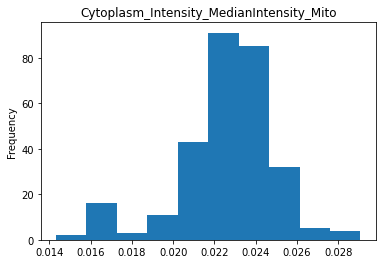

Plotting Cytoplasm_Intensity_MinIntensityEdge_Mito:  43%|████▎     | 115/267 [00:34<00:29,  5.07it/s]

Not normal


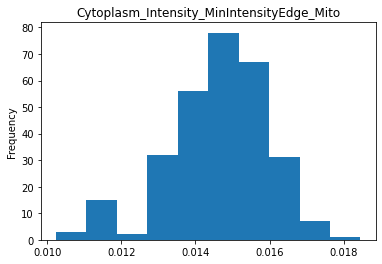

Plotting Cytoplasm_Intensity_MinIntensity_Mito:  43%|████▎     | 116/267 [00:34<00:29,  5.07it/s]    

Not normal


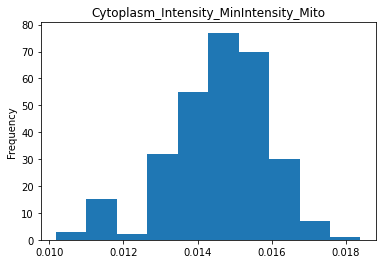

Plotting Cytoplasm_Intensity_StdIntensityEdge_Mito:  44%|████▍     | 117/267 [00:34<00:29,  5.07it/s]

Not normal


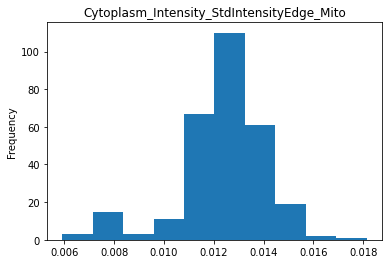

Plotting Cytoplasm_Intensity_StdIntensity_Mito:  44%|████▍     | 118/267 [00:34<00:29,  5.08it/s]    

Not normal


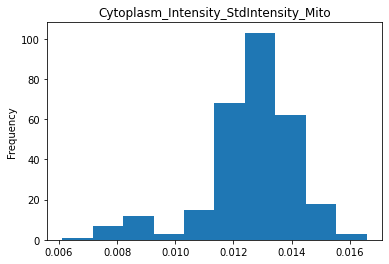

Plotting Cytoplasm_Intensity_UpperQuartileIntensity_Mito:  45%|████▍     | 119/267 [00:35<00:28,  5.17it/s]

Not normal


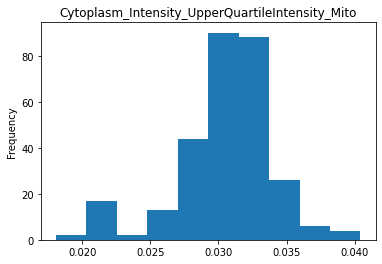

Plotting Cytoplasm_Location_CenterMassIntensity_X_Mito:  45%|████▍     | 120/267 [00:35<00:27,  5.29it/s]  

Not normal


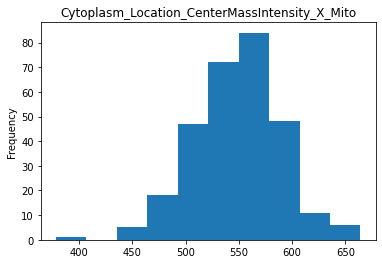

Plotting Cytoplasm_Location_CenterMassIntensity_Y_Mito:  45%|████▌     | 121/267 [00:35<00:28,  5.18it/s]

Not normal


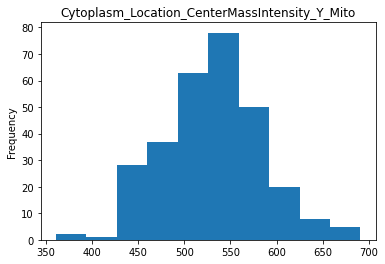

Plotting Cytoplasm_Location_MaxIntensity_X_Mito:  46%|████▌     | 122/267 [00:35<00:42,  3.38it/s]       

Not normal


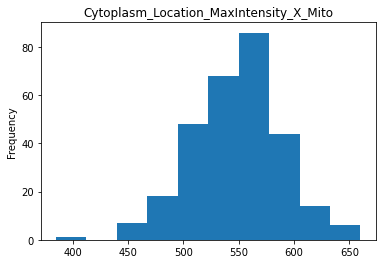

Plotting Cytoplasm_Location_MaxIntensity_Y_Mito:  46%|████▌     | 123/267 [00:36<00:38,  3.79it/s]

Not normal


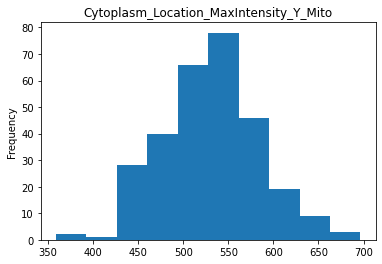

Plotting Cytoplasm_RadialDistribution_FracAtD_Mito_1of4:  46%|████▋     | 124/267 [00:36<00:35,  4.06it/s]

Not normal


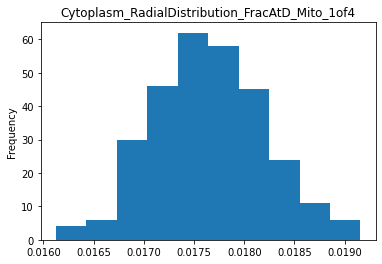

Plotting Cytoplasm_RadialDistribution_FracAtD_Mito_2of4:  47%|████▋     | 125/267 [00:36<00:32,  4.30it/s]

Not normal


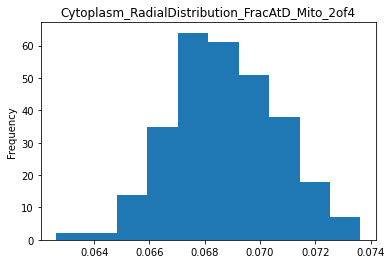

Plotting Cytoplasm_RadialDistribution_FracAtD_Mito_3of4:  47%|████▋     | 126/267 [00:36<00:31,  4.51it/s]

Not normal


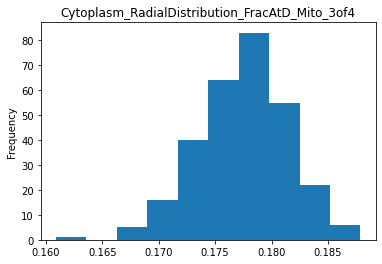

Plotting Cytoplasm_RadialDistribution_FracAtD_Mito_4of4:  48%|████▊     | 127/267 [00:36<00:29,  4.69it/s]

Not normal


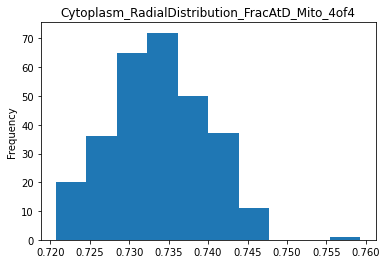

Plotting Cytoplasm_RadialDistribution_MeanFrac_Mito_1of4:  48%|████▊     | 128/267 [00:37<00:29,  4.70it/s]

Not normal


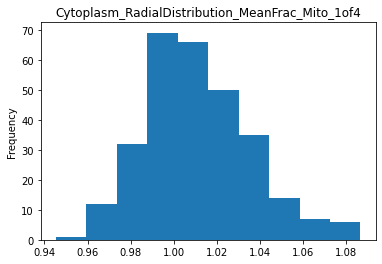

Plotting Cytoplasm_RadialDistribution_MeanFrac_Mito_2of4:  48%|████▊     | 129/267 [00:37<00:30,  4.52it/s]

Not normal


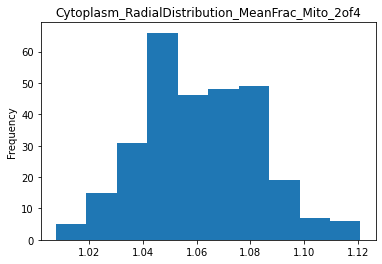

Plotting Cytoplasm_RadialDistribution_MeanFrac_Mito_3of4:  49%|████▊     | 130/267 [00:37<00:30,  4.52it/s]

Not normal


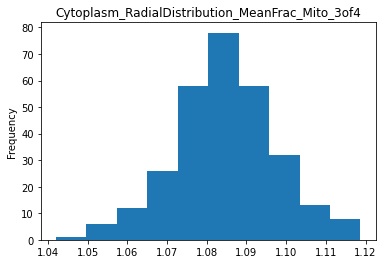

Plotting Cytoplasm_RadialDistribution_MeanFrac_Mito_4of4:  49%|████▉     | 131/267 [00:37<00:31,  4.33it/s]

Not normal


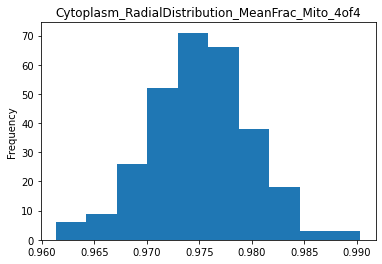

Plotting Cytoplasm_RadialDistribution_RadialCV_Mito_1of4:  49%|████▉     | 132/267 [00:38<00:32,  4.13it/s]

Not normal


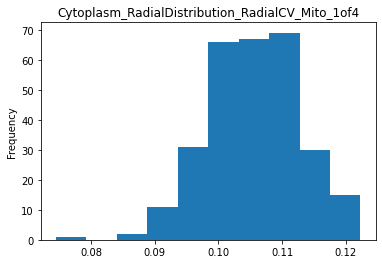

Plotting Cytoplasm_RadialDistribution_RadialCV_Mito_2of4:  50%|████▉     | 133/267 [00:38<00:32,  4.17it/s]

Not normal


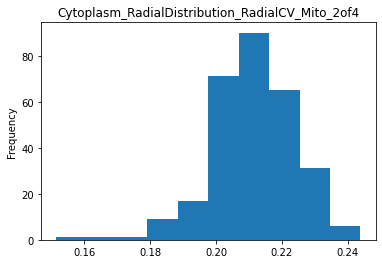

Plotting Cytoplasm_RadialDistribution_RadialCV_Mito_3of4:  50%|█████     | 134/267 [00:38<00:35,  3.72it/s]

Not normal


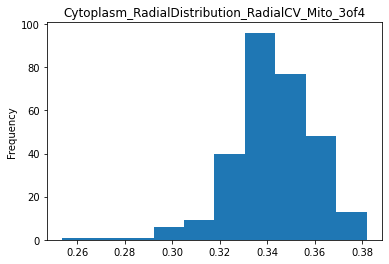

Plotting Cytoplasm_RadialDistribution_RadialCV_Mito_4of4:  51%|█████     | 135/267 [00:38<00:34,  3.83it/s]

Not normal


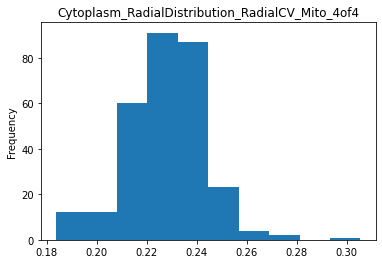

Plotting Cytoplasm_Texture_AngularSecondMoment_Mito_10_0:  51%|█████     | 136/267 [00:39<00:31,  4.11it/s]

Not normal


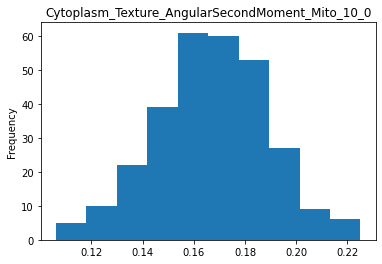

Plotting Cytoplasm_Texture_AngularSecondMoment_Mito_3_0:  51%|█████▏    | 137/267 [00:39<00:30,  4.23it/s] 

Not normal


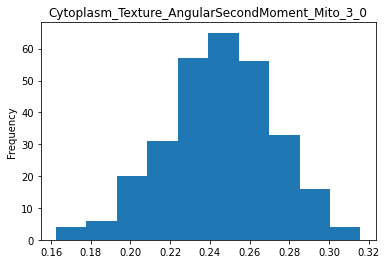

Plotting Cytoplasm_Texture_AngularSecondMoment_Mito_5_0:  52%|█████▏    | 138/267 [00:39<00:30,  4.27it/s]

Not normal


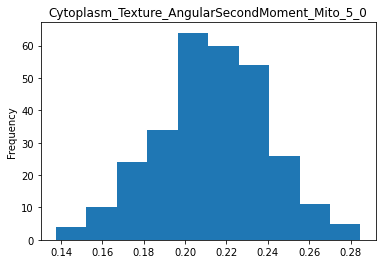

Plotting Cytoplasm_Texture_Contrast_Mito_10_0:  52%|█████▏    | 139/267 [00:39<00:29,  4.36it/s]          

Not normal


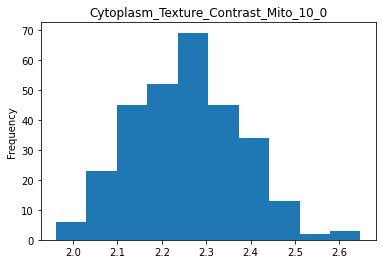

Plotting Cytoplasm_Texture_Contrast_Mito_3_0:  52%|█████▏    | 140/267 [00:40<00:28,  4.43it/s] 

Not normal


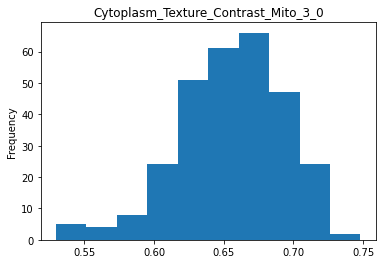

Plotting Cytoplasm_Texture_Contrast_Mito_5_0:  53%|█████▎    | 141/267 [00:40<00:27,  4.64it/s]

Not normal


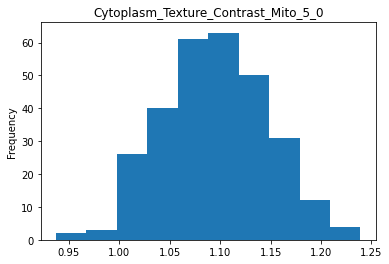

Plotting Cytoplasm_Texture_Correlation_Mito_10_0:  53%|█████▎    | 142/267 [00:40<00:26,  4.70it/s]

Not normal


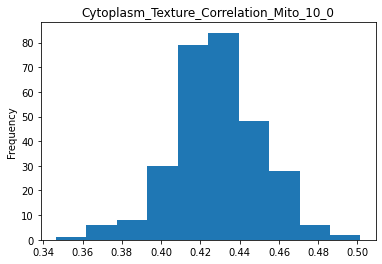

Plotting Cytoplasm_Texture_Correlation_Mito_3_0:  54%|█████▎    | 143/267 [00:40<00:27,  4.45it/s] 

Not normal


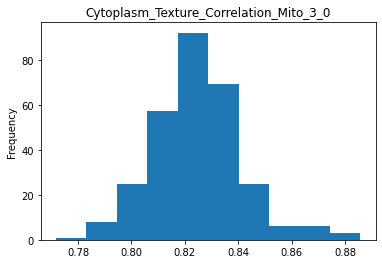

Plotting Cytoplasm_Texture_Correlation_Mito_5_0:  54%|█████▍    | 144/267 [00:40<00:25,  4.79it/s]

Not normal


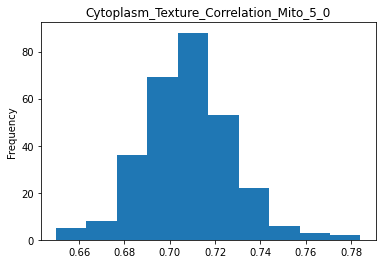

Plotting Cytoplasm_Texture_DifferenceEntropy_Mito_10_0:  54%|█████▍    | 145/267 [00:41<00:24,  5.03it/s]

Not normal


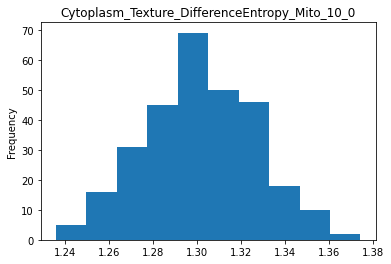

Plotting Cytoplasm_Texture_DifferenceEntropy_Mito_3_0:  55%|█████▍    | 146/267 [00:41<00:23,  5.13it/s] 

Not normal


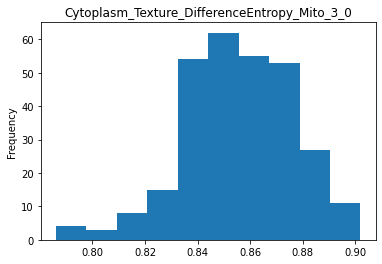

Plotting Cytoplasm_Texture_DifferenceEntropy_Mito_5_0:  55%|█████▌    | 147/267 [00:41<00:22,  5.22it/s]

Not normal


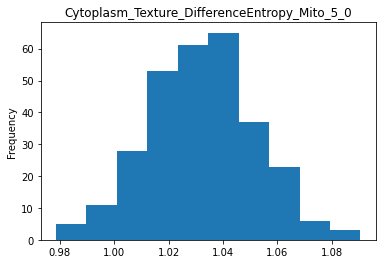

Plotting Cytoplasm_Texture_DifferenceVariance_Mito_10_0:  55%|█████▌    | 148/267 [00:41<00:24,  4.86it/s]

Not normal


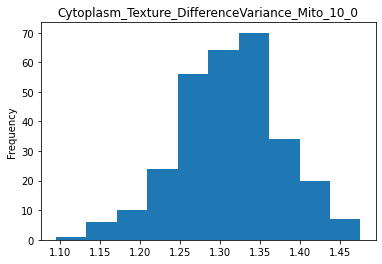

Plotting Cytoplasm_Texture_DifferenceVariance_Mito_3_0:  56%|█████▌    | 149/267 [00:41<00:24,  4.81it/s] 

Not normal


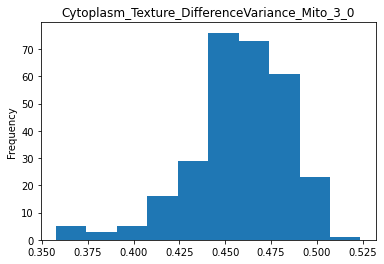

Plotting Cytoplasm_Texture_DifferenceVariance_Mito_5_0:  56%|█████▌    | 150/267 [00:42<00:24,  4.85it/s]

Not normal


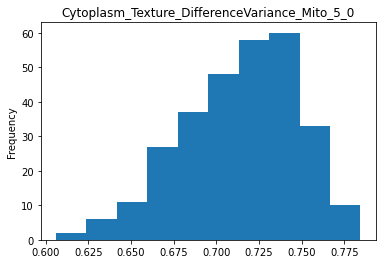

Plotting Cytoplasm_Texture_Entropy_Mito_10_0:  57%|█████▋    | 151/267 [00:42<00:23,  4.88it/s]          

Not normal


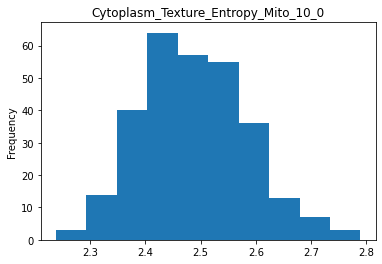

Plotting Cytoplasm_Texture_Entropy_Mito_3_0:  57%|█████▋    | 152/267 [00:42<00:23,  4.87it/s] 

Not normal


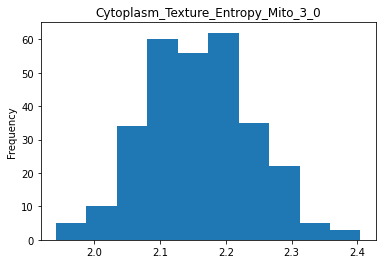

Plotting Cytoplasm_Texture_Entropy_Mito_5_0:  57%|█████▋    | 153/267 [00:42<00:23,  4.77it/s]

Not normal


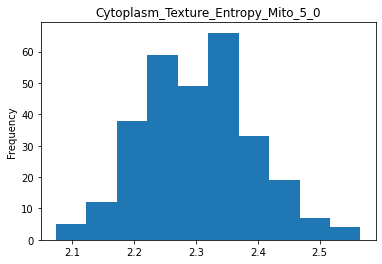

Plotting Cytoplasm_Texture_Gabor_Mito_10:  58%|█████▊    | 154/267 [00:42<00:23,  4.88it/s]   

Not normal


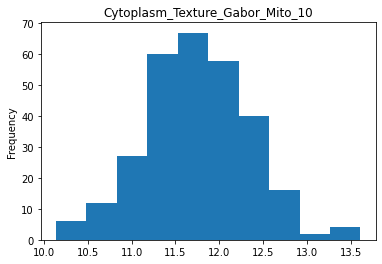

Plotting Cytoplasm_Texture_Gabor_Mito_3:  58%|█████▊    | 155/267 [00:43<00:24,  4.60it/s] 

Not normal


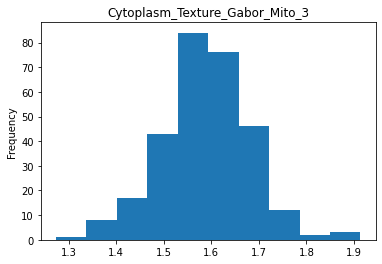

Plotting Cytoplasm_Texture_Gabor_Mito_5:  58%|█████▊    | 156/267 [00:43<00:24,  4.54it/s]

Not normal


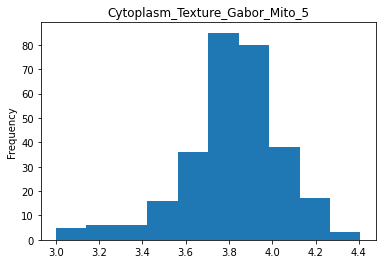

Plotting Cytoplasm_Texture_InfoMeas1_Mito_10_0:  59%|█████▉    | 157/267 [00:43<00:24,  4.58it/s]

Not normal


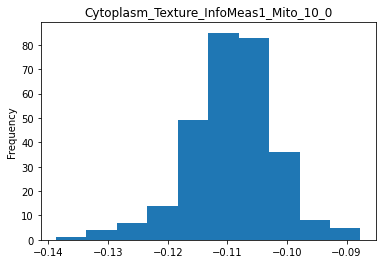

Plotting Cytoplasm_Texture_InfoMeas1_Mito_3_0:  59%|█████▉    | 158/267 [00:43<00:23,  4.66it/s] 

Not normal


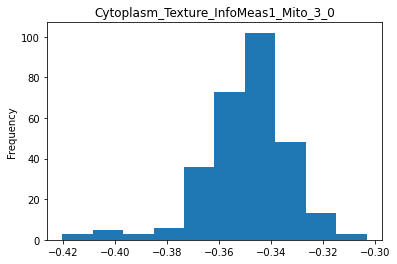

Plotting Cytoplasm_Texture_InfoMeas1_Mito_5_0:  60%|█████▉    | 159/267 [00:43<00:21,  4.92it/s]

Not normal


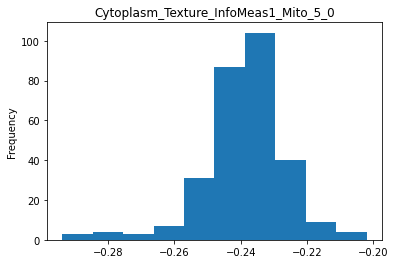

Plotting Cytoplasm_Texture_InfoMeas2_Mito_10_0:  60%|█████▉    | 160/267 [00:44<00:20,  5.14it/s]

Not normal


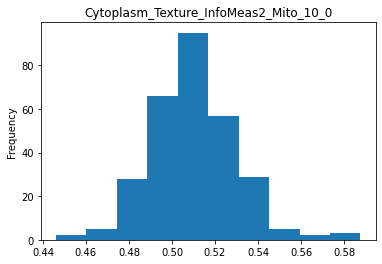

Plotting Cytoplasm_Texture_InfoMeas2_Mito_3_0:  60%|██████    | 161/267 [00:44<00:29,  3.57it/s] 

Not normal


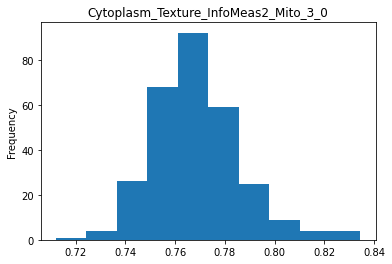

Plotting Cytoplasm_Texture_InfoMeas2_Mito_5_0:  61%|██████    | 162/267 [00:44<00:26,  3.98it/s]

Not normal


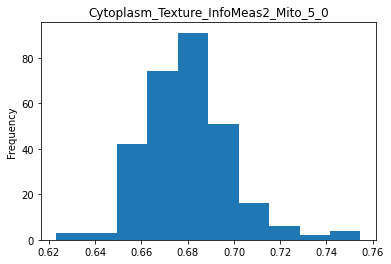

Plotting Cytoplasm_Texture_InverseDifferenceMoment_Mito_10_0:  61%|██████    | 163/267 [00:44<00:23,  4.35it/s]

Not normal


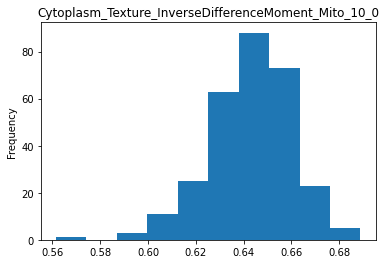

Plotting Cytoplasm_Texture_InverseDifferenceMoment_Mito_3_0:  61%|██████▏   | 164/267 [00:45<00:23,  4.33it/s] 

Not normal


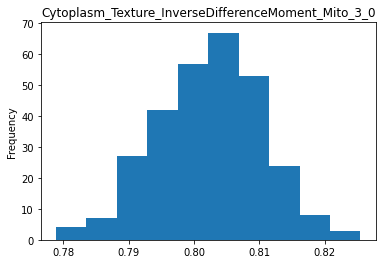

Plotting Cytoplasm_Texture_InverseDifferenceMoment_Mito_5_0:  62%|██████▏   | 165/267 [00:45<00:22,  4.56it/s]

Not normal


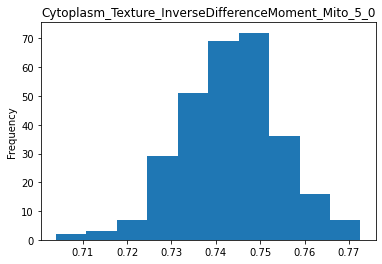

Plotting Cytoplasm_Texture_SumAverage_Mito_10_0:  62%|██████▏   | 166/267 [00:45<00:21,  4.63it/s]            

Not normal


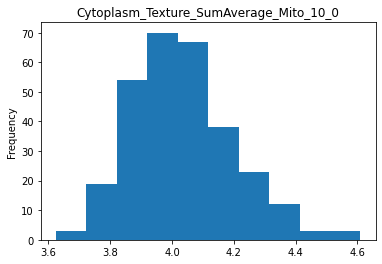

Plotting Cytoplasm_Texture_SumAverage_Mito_3_0:  63%|██████▎   | 167/267 [00:45<00:21,  4.75it/s] 

Not normal


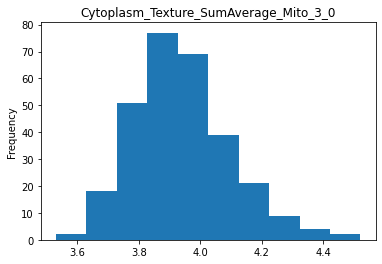

Plotting Cytoplasm_Texture_SumAverage_Mito_5_0:  63%|██████▎   | 168/267 [00:46<00:20,  4.78it/s]

Not normal


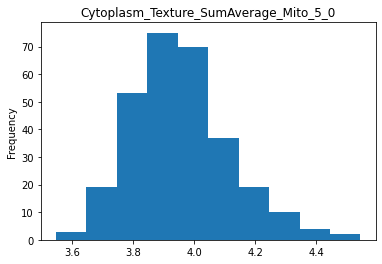

Plotting Cytoplasm_Texture_SumEntropy_Mito_10_0:  63%|██████▎   | 169/267 [00:46<00:19,  4.93it/s]

Not normal


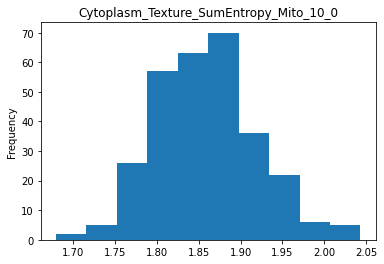

Plotting Cytoplasm_Texture_SumEntropy_Mito_3_0:  64%|██████▎   | 170/267 [00:46<00:19,  4.91it/s] 

Not normal


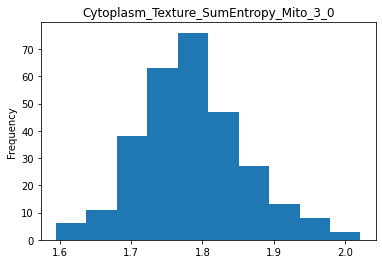

Plotting Cytoplasm_Texture_SumEntropy_Mito_5_0:  64%|██████▍   | 171/267 [00:46<00:26,  3.67it/s]

Not normal


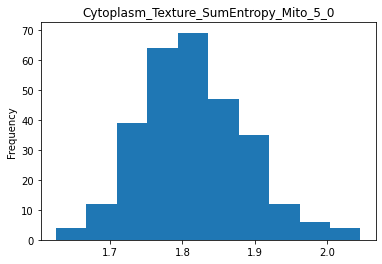

Plotting Cytoplasm_Texture_SumVariance_Mito_10_0:  64%|██████▍   | 172/267 [00:47<00:23,  4.11it/s]

Not normal


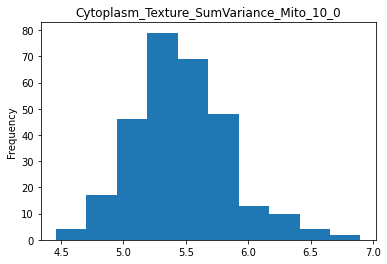

Plotting Cytoplasm_Texture_SumVariance_Mito_3_0:  65%|██████▍   | 173/267 [00:47<00:23,  4.02it/s] 

Not normal


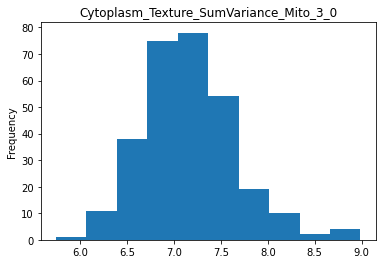

Plotting Cytoplasm_Texture_SumVariance_Mito_5_0:  65%|██████▌   | 174/267 [00:47<00:22,  4.18it/s]

Not normal


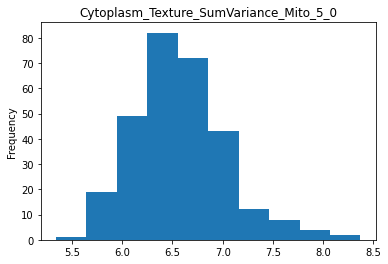

Plotting Cytoplasm_Texture_Variance_Mito_10_0:  66%|██████▌   | 175/267 [00:47<00:24,  3.80it/s]  

Not normal


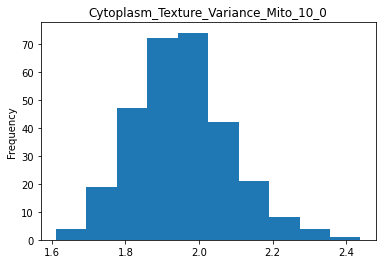

Plotting Cytoplasm_Texture_Variance_Mito_3_0:  66%|██████▌   | 176/267 [00:48<00:22,  4.05it/s] 

Not normal


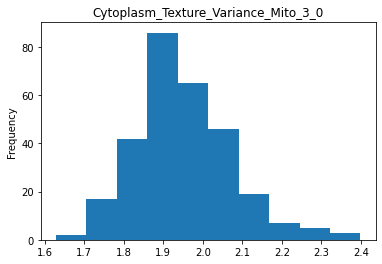

Plotting Cytoplasm_Texture_Variance_Mito_5_0:  66%|██████▋   | 177/267 [00:48<00:20,  4.32it/s]

Not normal


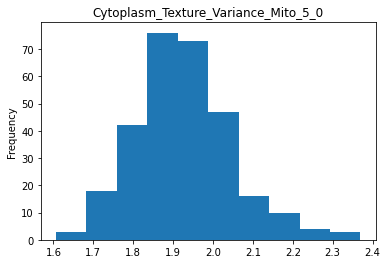

Plotting Nuclei_Granularity_10_Mito:  67%|██████▋   | 178/267 [00:48<00:20,  4.34it/s]         

Not normal


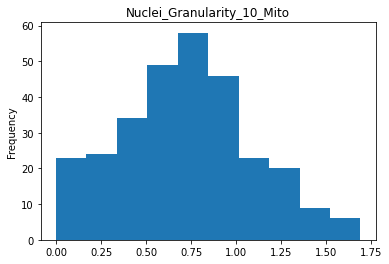

Plotting Nuclei_Granularity_11_Mito:  67%|██████▋   | 179/267 [00:48<00:20,  4.36it/s]

Not normal


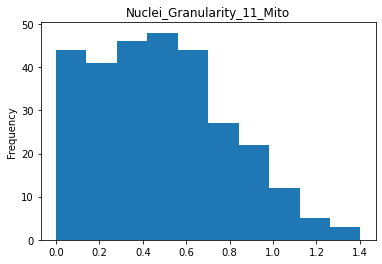

Plotting Nuclei_Granularity_12_Mito:  67%|██████▋   | 180/267 [00:48<00:21,  4.01it/s]

Not normal


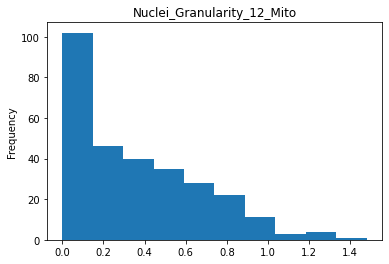

Plotting Nuclei_Granularity_13_Mito:  68%|██████▊   | 181/267 [00:49<00:19,  4.31it/s]

Not normal


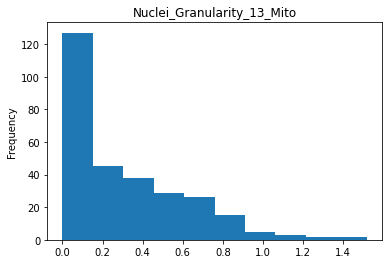

Plotting Nuclei_Granularity_14_Mito:  68%|██████▊   | 182/267 [00:49<00:20,  4.25it/s]

Not normal


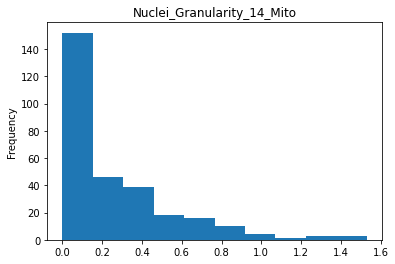

Plotting Nuclei_Granularity_15_Mito:  69%|██████▊   | 183/267 [00:49<00:19,  4.22it/s]

Not normal


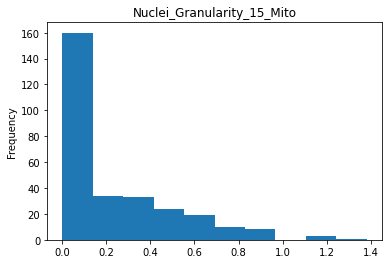

Plotting Nuclei_Granularity_16_Mito:  69%|██████▉   | 184/267 [00:49<00:19,  4.31it/s]

Not normal


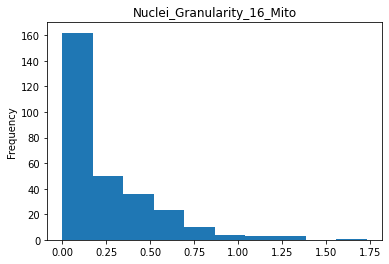

Plotting Nuclei_Granularity_1_Mito:  69%|██████▉   | 185/267 [00:50<00:20,  3.98it/s] 

Not normal


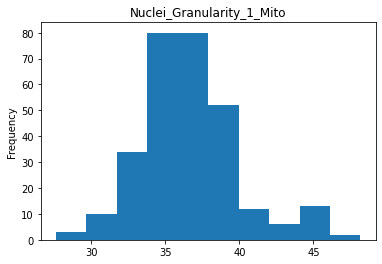

Plotting Nuclei_Granularity_2_Mito:  70%|██████▉   | 186/267 [00:50<00:19,  4.24it/s]

Not normal


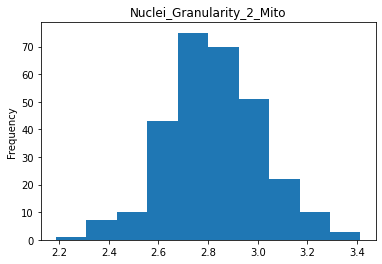

Plotting Nuclei_Granularity_3_Mito:  70%|███████   | 187/267 [00:50<00:17,  4.46it/s]

Not normal


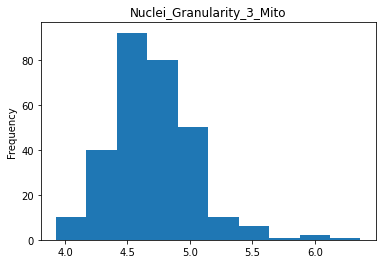

Plotting Nuclei_Granularity_4_Mito:  70%|███████   | 188/267 [00:50<00:17,  4.57it/s]

Not normal


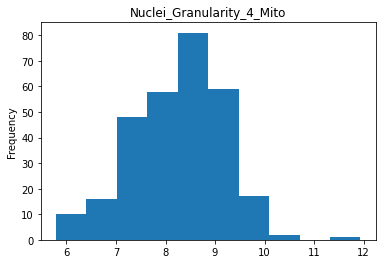

Plotting Nuclei_Granularity_5_Mito:  71%|███████   | 189/267 [00:50<00:17,  4.51it/s]

Not normal


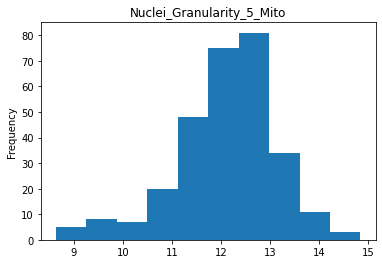

Plotting Nuclei_Granularity_6_Mito:  71%|███████   | 190/267 [00:51<00:17,  4.44it/s]

Not normal


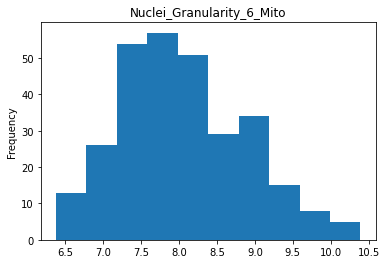

Plotting Nuclei_Granularity_7_Mito:  72%|███████▏  | 191/267 [00:51<00:19,  3.90it/s]

Not normal


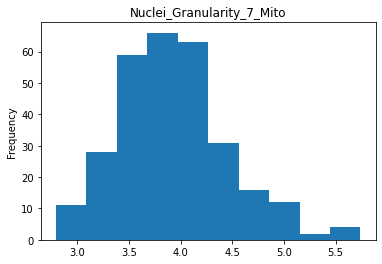

Plotting Nuclei_Granularity_8_Mito:  72%|███████▏  | 192/267 [00:51<00:20,  3.71it/s]

Not normal


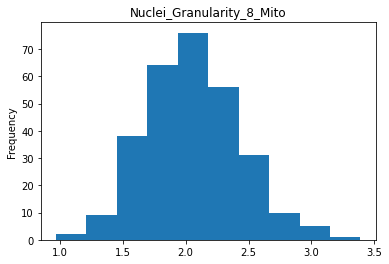

Plotting Nuclei_Granularity_9_Mito:  72%|███████▏  | 193/267 [00:52<00:20,  3.53it/s]

Not normal


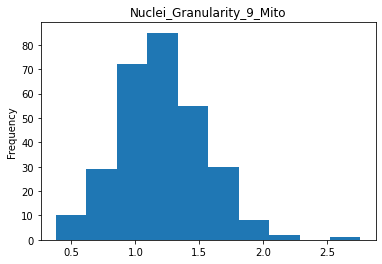

Plotting Nuclei_Intensity_IntegratedIntensityEdge_Mito:  73%|███████▎  | 194/267 [00:52<00:21,  3.47it/s]

Not normal


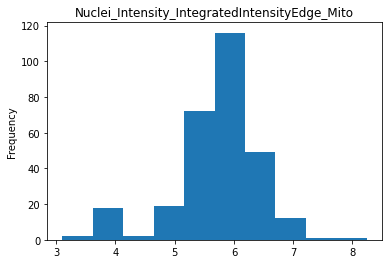

Plotting Nuclei_Intensity_IntegratedIntensity_Mito:  73%|███████▎  | 195/267 [00:52<00:21,  3.40it/s]    

Not normal


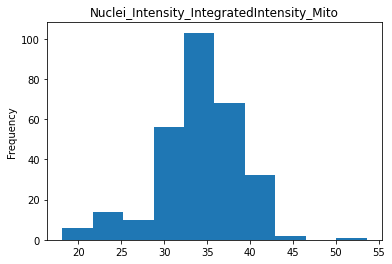

Plotting Nuclei_Intensity_LowerQuartileIntensity_Mito:  73%|███████▎  | 196/267 [00:53<00:21,  3.34it/s]

Not normal


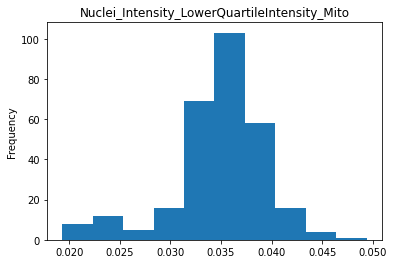

Plotting Nuclei_Intensity_MADIntensity_Mito:  74%|███████▍  | 197/267 [00:53<00:22,  3.12it/s]          

Not normal


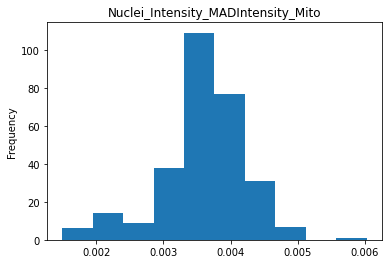

Plotting Nuclei_Intensity_MassDisplacement_Mito:  74%|███████▍  | 198/267 [00:53<00:21,  3.22it/s]

Not normal


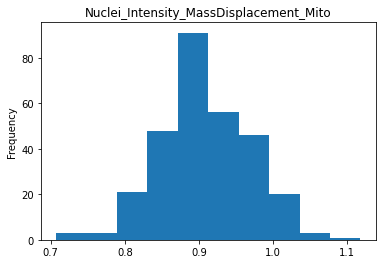

Plotting Nuclei_Intensity_MaxIntensityEdge_Mito:  75%|███████▍  | 199/267 [00:54<00:19,  3.41it/s]

Not normal


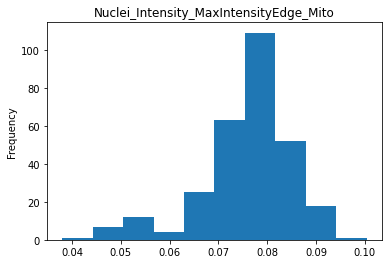

Plotting Nuclei_Intensity_MaxIntensity_Mito:  75%|███████▍  | 200/267 [00:54<00:20,  3.33it/s]    

Not normal


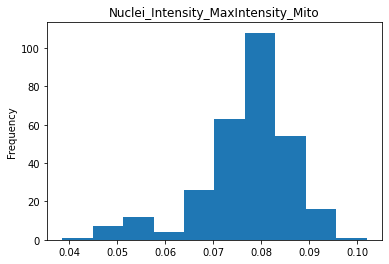

Plotting Nuclei_Intensity_MeanIntensityEdge_Mito:  75%|███████▌  | 201/267 [00:54<00:19,  3.37it/s]

Not normal


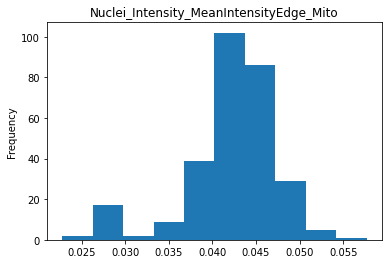

Plotting Nuclei_Intensity_MeanIntensity_Mito:  76%|███████▌  | 202/267 [00:55<00:24,  2.61it/s]    

Not normal


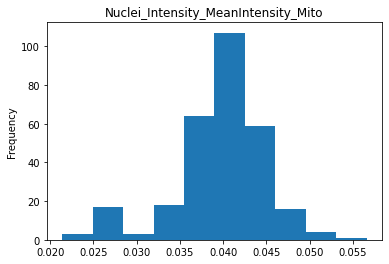

Plotting Nuclei_Intensity_MedianIntensity_Mito:  76%|███████▌  | 203/267 [00:55<00:22,  2.81it/s]

Not normal


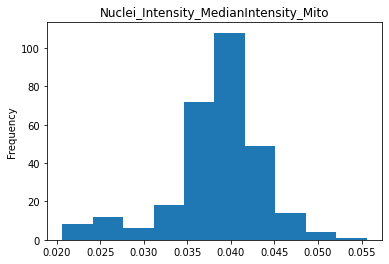

Plotting Nuclei_Intensity_MinIntensityEdge_Mito:  76%|███████▋  | 204/267 [00:55<00:20,  3.07it/s]

Not normal


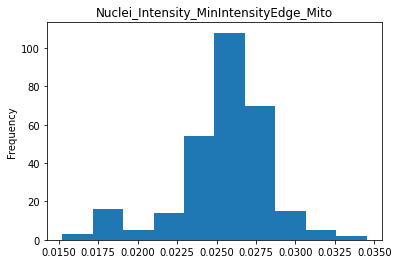

Plotting Nuclei_Intensity_MinIntensity_Mito:  77%|███████▋  | 205/267 [00:56<00:27,  2.29it/s]    

Not normal


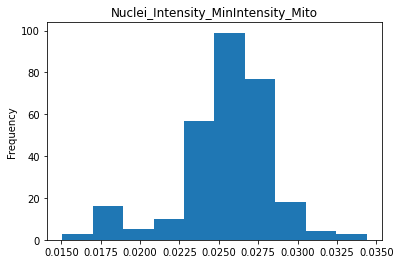

Plotting Nuclei_Intensity_StdIntensityEdge_Mito:  77%|███████▋  | 206/267 [00:56<00:24,  2.48it/s]

Not normal


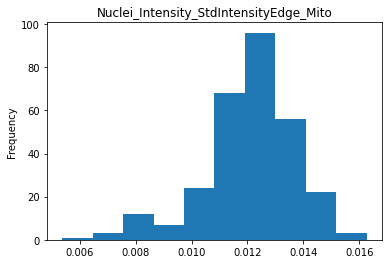

Plotting Nuclei_Intensity_StdIntensity_Mito:  78%|███████▊  | 207/267 [00:56<00:20,  2.96it/s]    

Not normal


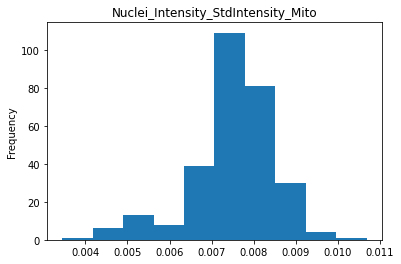

Plotting Nuclei_Intensity_UpperQuartileIntensity_Mito:  78%|███████▊  | 208/267 [00:57<00:18,  3.23it/s]

Not normal


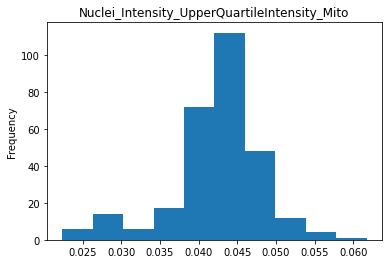

Plotting Nuclei_Location_CenterMassIntensity_X_Mito:  78%|███████▊  | 209/267 [00:57<00:16,  3.41it/s]  

Not normal


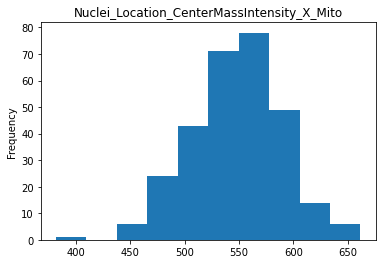

Plotting Nuclei_Location_CenterMassIntensity_Y_Mito:  79%|███████▊  | 210/267 [00:57<00:15,  3.61it/s]

Not normal


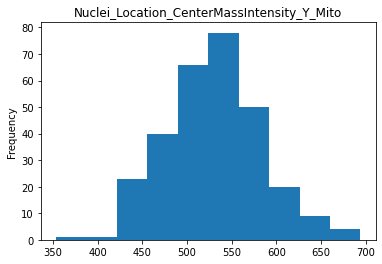

Plotting Nuclei_Location_MaxIntensity_X_Mito:  79%|███████▉  | 211/267 [00:57<00:15,  3.70it/s]       

Not normal


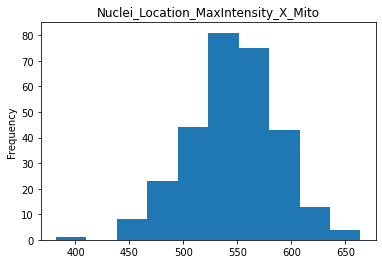

Plotting Nuclei_Location_MaxIntensity_Y_Mito:  79%|███████▉  | 212/267 [00:58<00:13,  4.01it/s]

Not normal


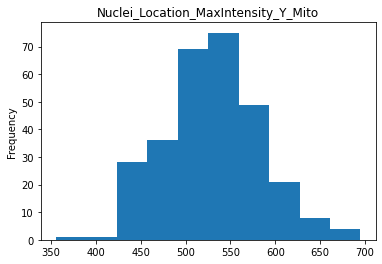

Plotting Nuclei_RadialDistribution_FracAtD_Mito_1of4:  80%|███████▉  | 213/267 [00:58<00:12,  4.23it/s]

Not normal


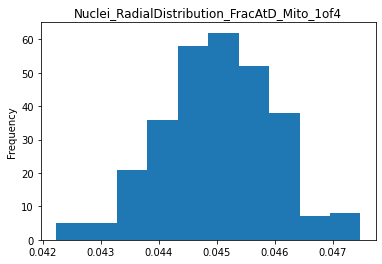

Plotting Nuclei_RadialDistribution_FracAtD_Mito_2of4:  80%|████████  | 214/267 [00:58<00:11,  4.45it/s]

Not normal


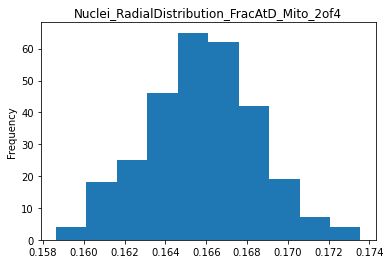

Plotting Nuclei_RadialDistribution_FracAtD_Mito_3of4:  81%|████████  | 215/267 [00:58<00:10,  4.77it/s]

Not normal


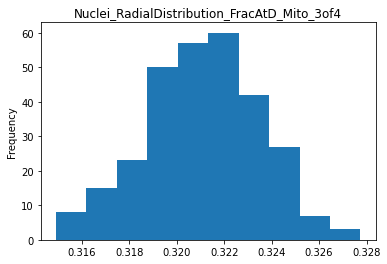

Plotting Nuclei_RadialDistribution_FracAtD_Mito_4of4:  81%|████████  | 216/267 [00:58<00:10,  4.86it/s]

Not normal


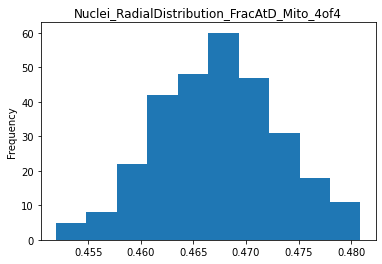

Plotting Nuclei_RadialDistribution_MeanFrac_Mito_1of4:  81%|████████▏ | 217/267 [00:59<00:10,  4.93it/s]

Not normal


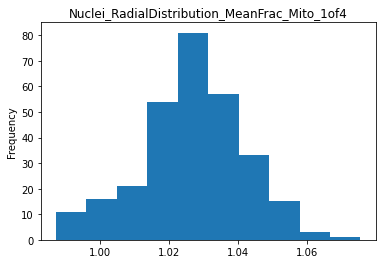

Plotting Nuclei_RadialDistribution_MeanFrac_Mito_2of4:  82%|████████▏ | 218/267 [00:59<00:09,  4.94it/s]

Not normal


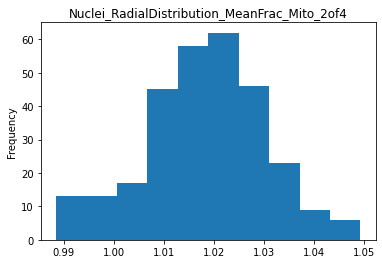

Plotting Nuclei_RadialDistribution_MeanFrac_Mito_3of4:  82%|████████▏ | 219/267 [00:59<00:09,  5.06it/s]

Not normal


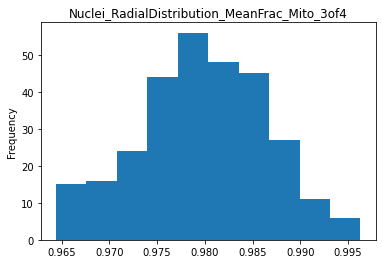

Plotting Nuclei_RadialDistribution_MeanFrac_Mito_4of4:  82%|████████▏ | 220/267 [00:59<00:09,  5.08it/s]

Not normal


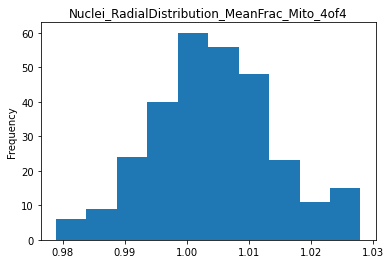

Plotting Nuclei_RadialDistribution_RadialCV_Mito_1of4:  83%|████████▎ | 221/267 [00:59<00:09,  5.09it/s]

Not normal


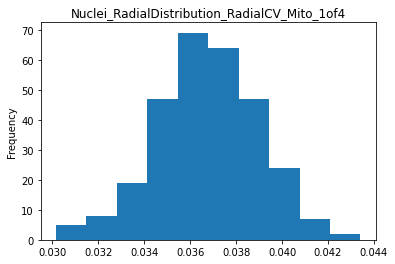

Plotting Nuclei_RadialDistribution_RadialCV_Mito_2of4:  83%|████████▎ | 222/267 [01:00<00:08,  5.00it/s]

Not normal


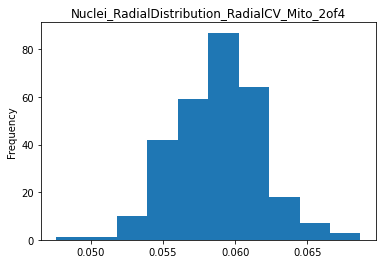

Plotting Nuclei_RadialDistribution_RadialCV_Mito_3of4:  84%|████████▎ | 223/267 [01:00<00:08,  5.23it/s]

Not normal


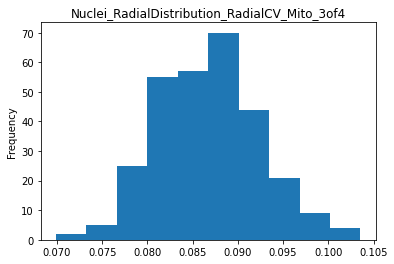

Plotting Nuclei_RadialDistribution_RadialCV_Mito_4of4:  84%|████████▍ | 224/267 [01:00<00:08,  5.20it/s]

Not normal


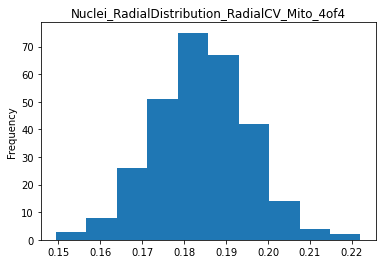

Plotting Nuclei_Texture_AngularSecondMoment_Mito_10_0:  84%|████████▍ | 225/267 [01:00<00:08,  5.13it/s]

Not normal


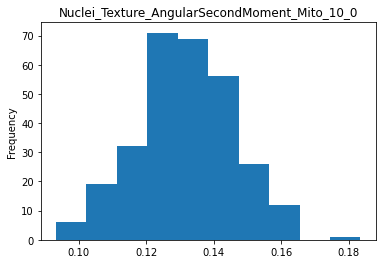

Plotting Nuclei_Texture_AngularSecondMoment_Mito_3_0:  85%|████████▍ | 226/267 [01:00<00:08,  4.98it/s] 

Not normal


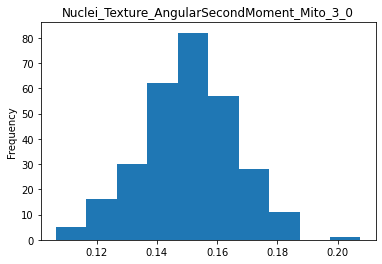

Plotting Nuclei_Texture_AngularSecondMoment_Mito_5_0:  85%|████████▌ | 227/267 [01:01<00:08,  4.98it/s]

Not normal


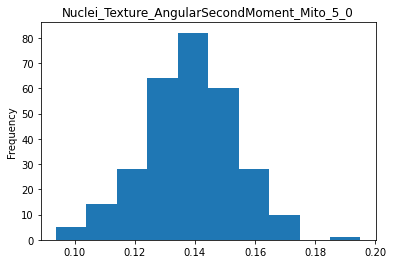

Plotting Nuclei_Texture_Contrast_Mito_10_0:  85%|████████▌ | 228/267 [01:01<00:07,  4.99it/s]          

Not normal


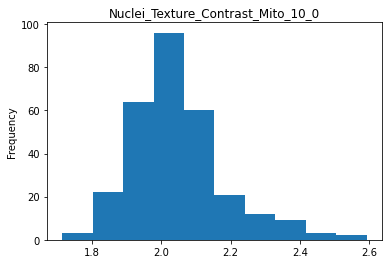

Plotting Nuclei_Texture_Contrast_Mito_3_0:  86%|████████▌ | 229/267 [01:01<00:07,  5.21it/s] 

Not normal


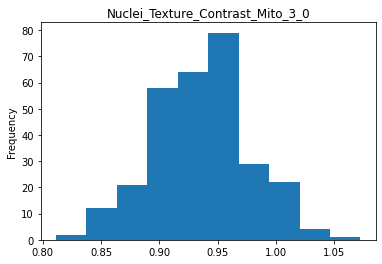

Plotting Nuclei_Texture_Contrast_Mito_5_0:  86%|████████▌ | 230/267 [01:01<00:07,  5.20it/s]

Not normal


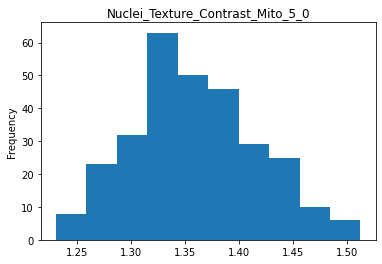

Plotting Nuclei_Texture_Correlation_Mito_10_0:  87%|████████▋ | 231/267 [01:01<00:07,  5.11it/s]

Not normal


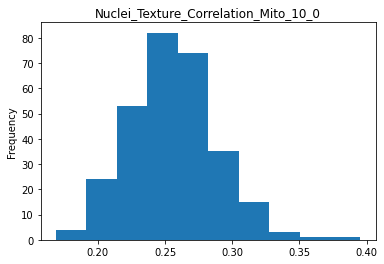

Plotting Nuclei_Texture_Correlation_Mito_3_0:  87%|████████▋ | 232/267 [01:02<00:06,  5.14it/s] 

Not normal


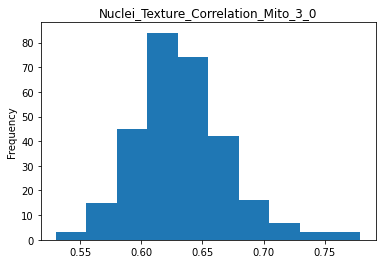

Plotting Nuclei_Texture_Correlation_Mito_5_0:  87%|████████▋ | 233/267 [01:02<00:06,  5.20it/s]

Not normal


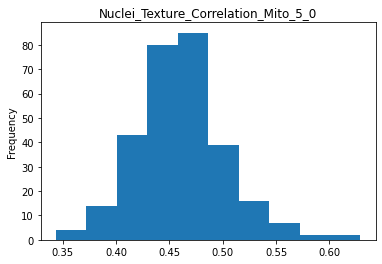

Plotting Nuclei_Texture_DifferenceEntropy_Mito_10_0:  88%|████████▊ | 234/267 [01:02<00:10,  3.27it/s]

Not normal


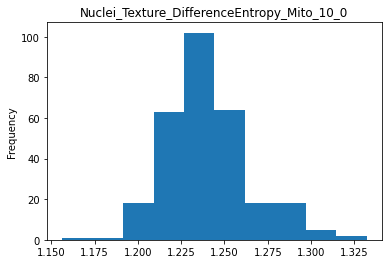

Plotting Nuclei_Texture_DifferenceEntropy_Mito_3_0:  88%|████████▊ | 235/267 [01:03<00:09,  3.47it/s] 

Not normal


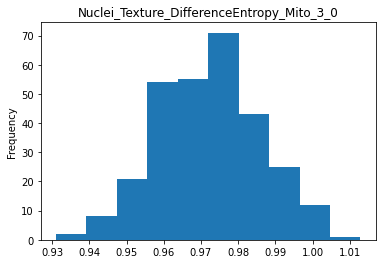

Plotting Nuclei_Texture_DifferenceEntropy_Mito_5_0:  88%|████████▊ | 236/267 [01:03<00:10,  2.97it/s]

Not normal


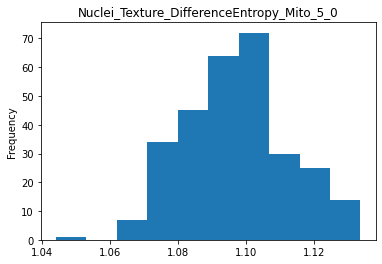

Plotting Nuclei_Texture_DifferenceVariance_Mito_10_0:  89%|████████▉ | 237/267 [01:03<00:08,  3.36it/s]

Not normal


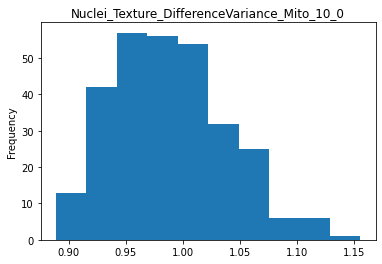

Plotting Nuclei_Texture_DifferenceVariance_Mito_3_0:  89%|████████▉ | 238/267 [01:04<00:09,  3.01it/s] 

Not normal


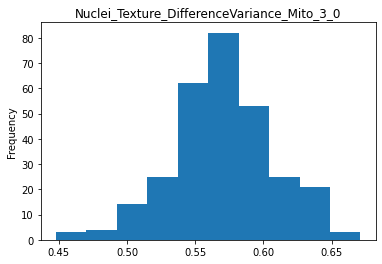

Plotting Nuclei_Texture_DifferenceVariance_Mito_5_0:  90%|████████▉ | 239/267 [01:04<00:08,  3.41it/s]

Not normal


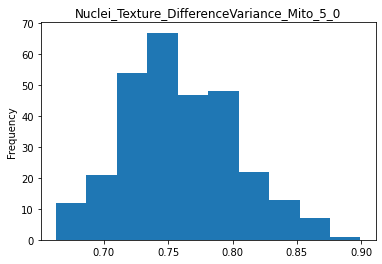

Plotting Nuclei_Texture_Entropy_Mito_10_0:  90%|████████▉ | 240/267 [01:04<00:07,  3.63it/s]          

Not normal


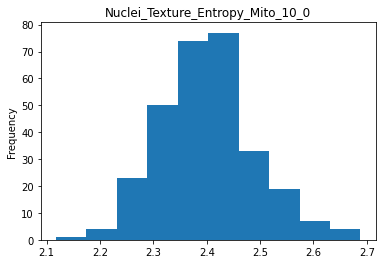

Plotting Nuclei_Texture_Entropy_Mito_3_0:  90%|█████████ | 241/267 [01:05<00:08,  2.99it/s] 

Not normal


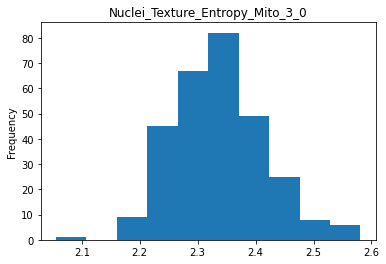

Plotting Nuclei_Texture_Entropy_Mito_5_0:  91%|█████████ | 242/267 [01:05<00:07,  3.30it/s]

Not normal


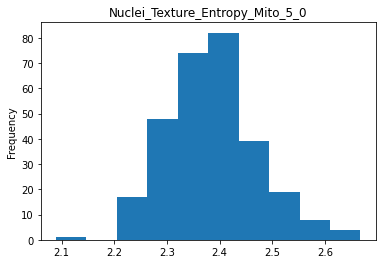

Plotting Nuclei_Texture_Gabor_Mito_10:  91%|█████████ | 243/267 [01:05<00:06,  3.48it/s]   

Not normal


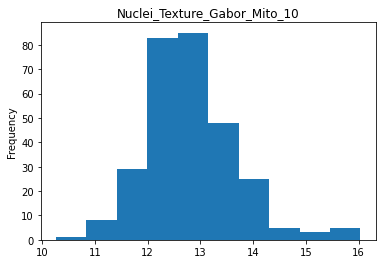

Plotting Nuclei_Texture_Gabor_Mito_3:  91%|█████████▏| 244/267 [01:05<00:05,  3.85it/s] 

Not normal


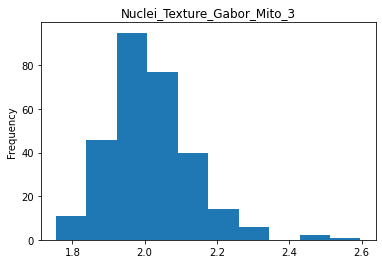

Plotting Nuclei_Texture_Gabor_Mito_5:  92%|█████████▏| 245/267 [01:05<00:05,  4.23it/s]

Not normal


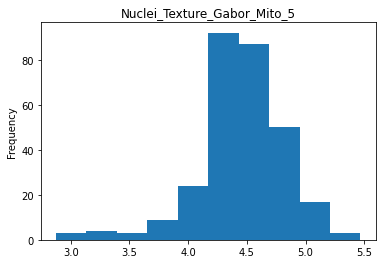

Plotting Nuclei_Texture_InfoMeas1_Mito_10_0:  92%|█████████▏| 246/267 [01:06<00:04,  4.49it/s]

Not normal


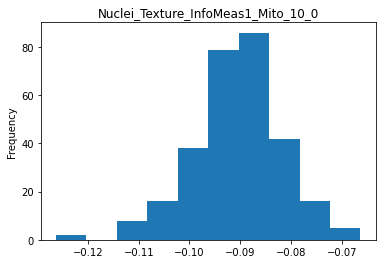

Plotting Nuclei_Texture_InfoMeas1_Mito_3_0:  93%|█████████▎| 247/267 [01:06<00:04,  4.67it/s] 

Not normal


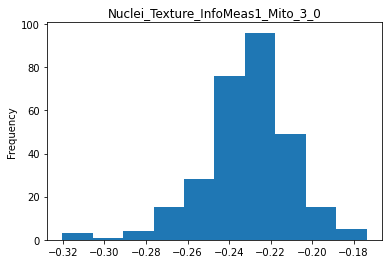

Plotting Nuclei_Texture_InfoMeas1_Mito_5_0:  93%|█████████▎| 248/267 [01:06<00:04,  4.73it/s]

Not normal


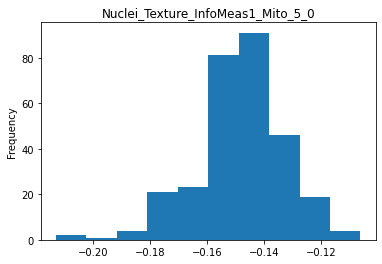

Plotting Nuclei_Texture_InfoMeas2_Mito_10_0:  93%|█████████▎| 249/267 [01:06<00:04,  4.33it/s]

Not normal


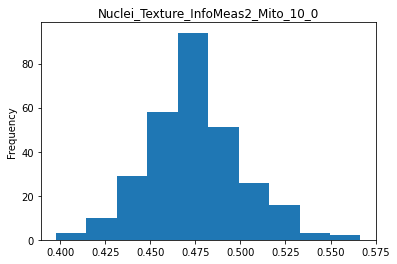

Plotting Nuclei_Texture_InfoMeas2_Mito_3_0:  94%|█████████▎| 250/267 [01:07<00:04,  4.10it/s] 

Not normal


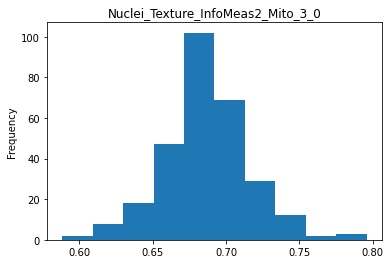

Plotting Nuclei_Texture_InfoMeas2_Mito_5_0:  94%|█████████▍| 251/267 [01:07<00:03,  4.19it/s]

Not normal


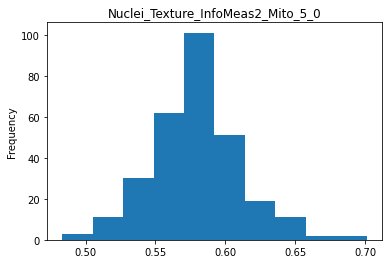

Plotting Nuclei_Texture_InverseDifferenceMoment_Mito_10_0:  94%|█████████▍| 252/267 [01:07<00:03,  4.30it/s]

Not normal


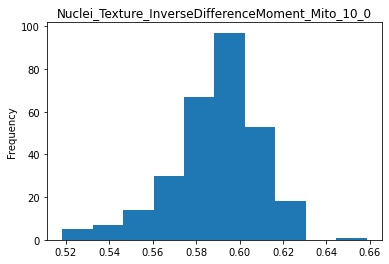

Plotting Nuclei_Texture_InverseDifferenceMoment_Mito_3_0:  95%|█████████▍| 253/267 [01:07<00:03,  4.05it/s] 

Not normal


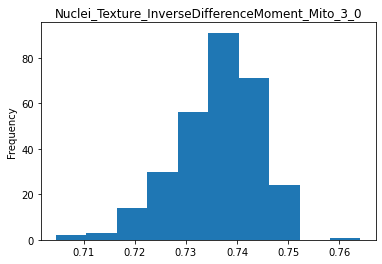

Plotting Nuclei_Texture_InverseDifferenceMoment_Mito_5_0:  95%|█████████▌| 254/267 [01:07<00:03,  4.27it/s]

Not normal


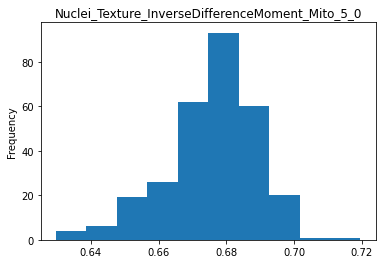

Plotting Nuclei_Texture_SumAverage_Mito_10_0:  96%|█████████▌| 255/267 [01:08<00:02,  4.48it/s]            

Not normal


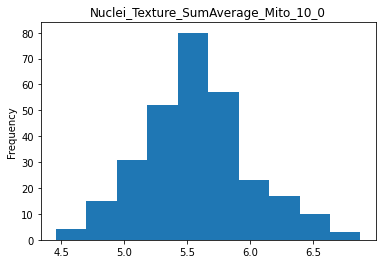

Plotting Nuclei_Texture_SumAverage_Mito_3_0:  96%|█████████▌| 256/267 [01:08<00:02,  4.45it/s] 

Not normal


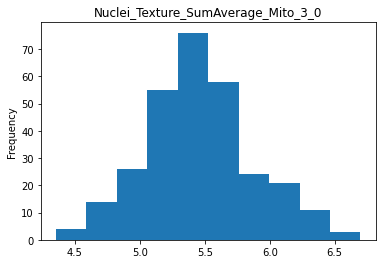

Plotting Nuclei_Texture_SumAverage_Mito_5_0:  96%|█████████▋| 257/267 [01:08<00:02,  4.49it/s]

Not normal


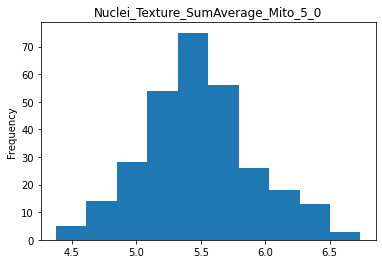

Plotting Nuclei_Texture_SumEntropy_Mito_10_0:  97%|█████████▋| 258/267 [01:08<00:02,  4.47it/s]

Not normal


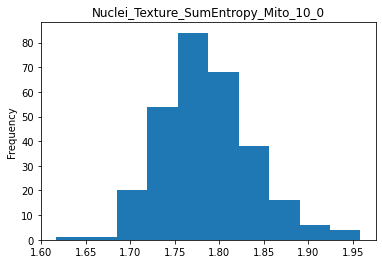

Plotting Nuclei_Texture_SumEntropy_Mito_3_0:  97%|█████████▋| 259/267 [01:09<00:01,  4.31it/s] 

Not normal


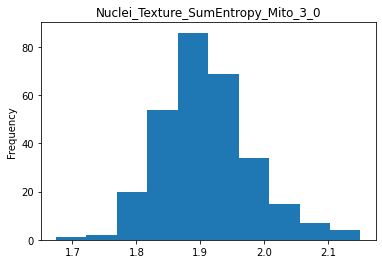

Plotting Nuclei_Texture_SumEntropy_Mito_5_0:  97%|█████████▋| 260/267 [01:09<00:01,  4.05it/s]

Not normal


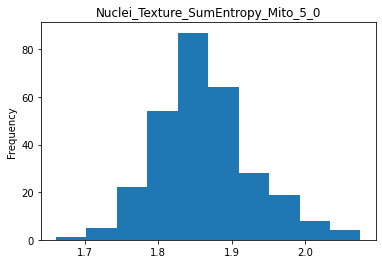

Plotting Nuclei_Texture_SumVariance_Mito_10_0:  98%|█████████▊| 261/267 [01:09<00:01,  3.88it/s]

Not normal


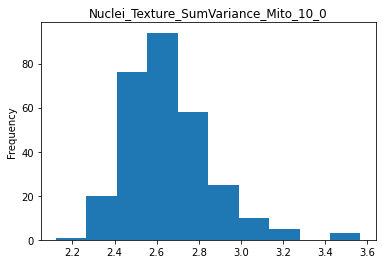

Plotting Nuclei_Texture_SumVariance_Mito_3_0:  98%|█████████▊| 262/267 [01:09<00:01,  4.09it/s] 

Not normal


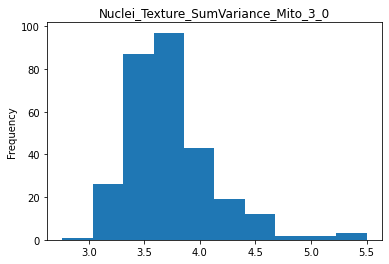

Plotting Nuclei_Texture_SumVariance_Mito_5_0:  99%|█████████▊| 263/267 [01:10<00:00,  4.34it/s]

Not normal


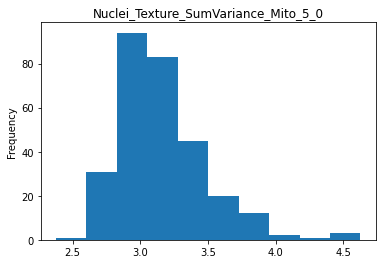

Plotting Nuclei_Texture_Variance_Mito_10_0:  99%|█████████▉| 264/267 [01:10<00:00,  4.65it/s]  

Not normal


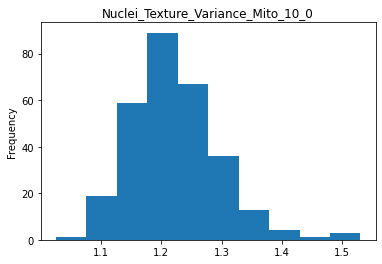

Plotting Nuclei_Texture_Variance_Mito_3_0:  99%|█████████▉| 265/267 [01:10<00:00,  4.94it/s] 

Not normal


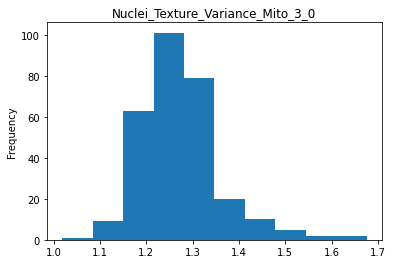

Plotting Nuclei_Texture_Variance_Mito_5_0: 100%|█████████▉| 266/267 [01:10<00:00,  4.83it/s]

Not normal


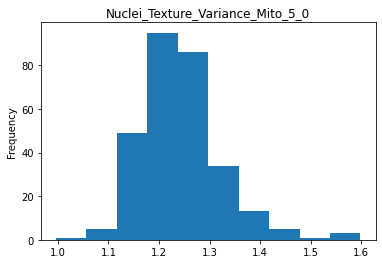

Plotting Nuclei_Texture_Variance_Mito_5_0: 100%|██████████| 267/267 [01:10<00:00,  3.77it/s]


In [27]:
Mito_df = Data_object.exclude_other_channels("Mito")
display_plots(Mito_df)

# RNA distribution

Plotting Cells_Granularity_10_RNA:   0%|          | 0/267 [00:00<?, ?it/s]

Not normal


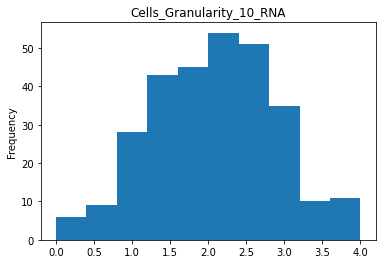

Plotting Cells_Granularity_11_RNA:   0%|          | 1/267 [00:00<00:56,  4.68it/s]

Not normal


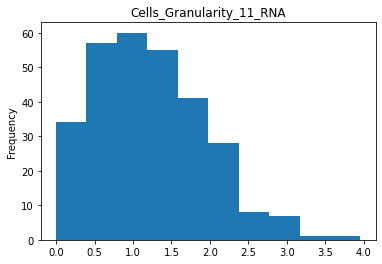

Plotting Cells_Granularity_12_RNA:   1%|          | 2/267 [00:00<00:59,  4.48it/s]

Not normal


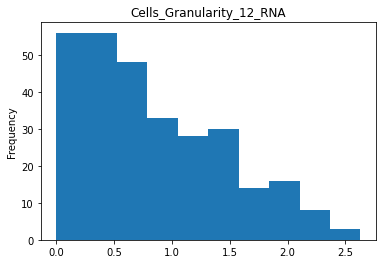

Plotting Cells_Granularity_13_RNA:   1%|          | 3/267 [00:00<00:54,  4.83it/s]

Not normal


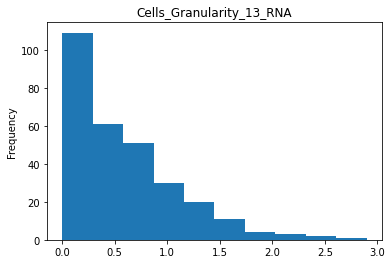

Plotting Cells_Granularity_14_RNA:   1%|▏         | 4/267 [00:00<00:53,  4.89it/s]

Not normal


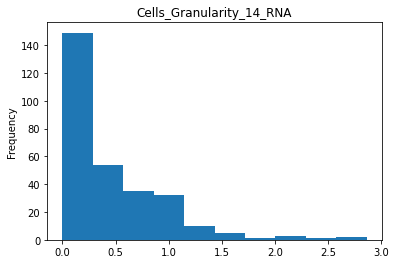

Plotting Cells_Granularity_15_RNA:   2%|▏         | 5/267 [00:01<00:53,  4.93it/s]

Not normal


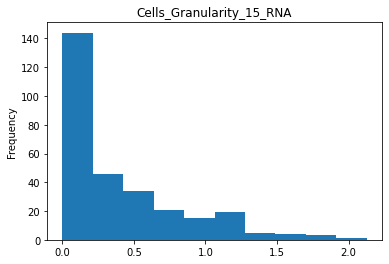

Plotting Cells_Granularity_16_RNA:   2%|▏         | 6/267 [00:01<00:52,  4.96it/s]

Not normal


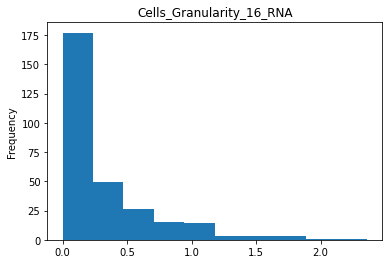

Plotting Cells_Granularity_1_RNA:   3%|▎         | 7/267 [00:01<00:54,  4.76it/s] 

Not normal


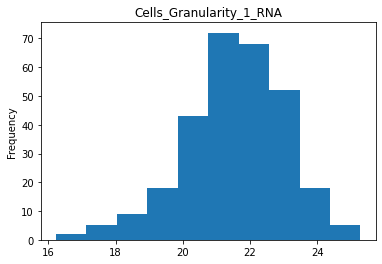

Plotting Cells_Granularity_2_RNA:   3%|▎         | 8/267 [00:01<00:53,  4.85it/s]

Not normal


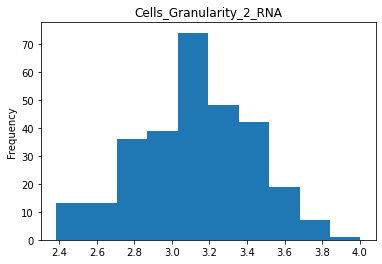

Plotting Cells_Granularity_3_RNA:   3%|▎         | 9/267 [00:01<00:55,  4.68it/s]

Not normal


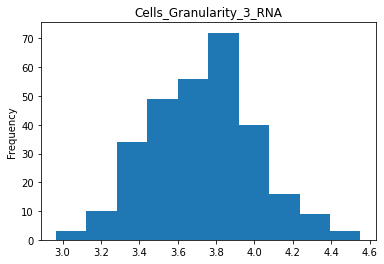

Plotting Cells_Granularity_4_RNA:   4%|▎         | 10/267 [00:02<00:57,  4.48it/s]

Not normal


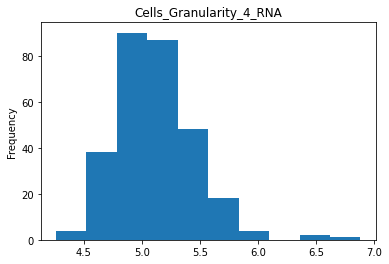

Plotting Cells_Granularity_5_RNA:   4%|▍         | 11/267 [00:02<00:56,  4.50it/s]

Not normal


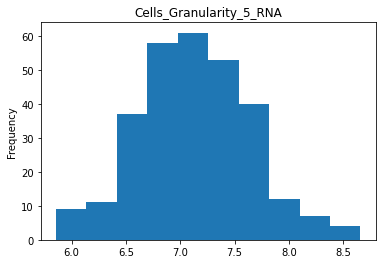

Plotting Cells_Granularity_6_RNA:   4%|▍         | 12/267 [00:02<00:53,  4.74it/s]

Not normal


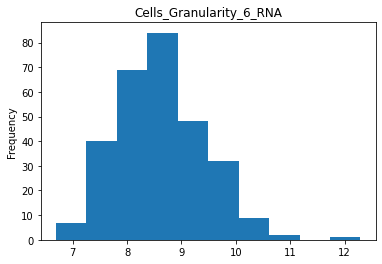

Plotting Cells_Granularity_7_RNA:   5%|▍         | 13/267 [00:02<00:53,  4.77it/s]

Not normal


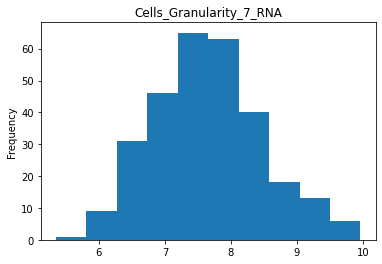

Plotting Cells_Granularity_8_RNA:   5%|▌         | 14/267 [00:02<00:53,  4.72it/s]

Not normal


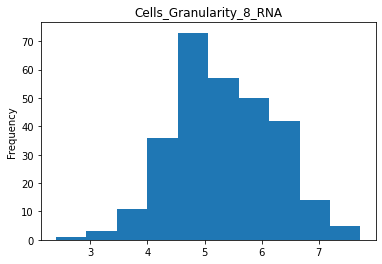

Plotting Cells_Granularity_9_RNA:   6%|▌         | 15/267 [00:03<00:51,  4.90it/s]

Not normal


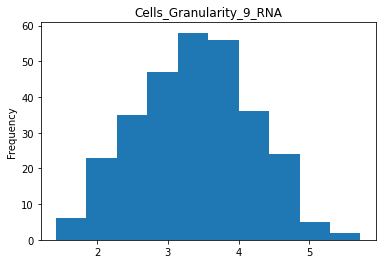

Plotting Cells_Intensity_IntegratedIntensityEdge_RNA:   6%|▌         | 16/267 [00:03<01:06,  3.77it/s]

Not normal


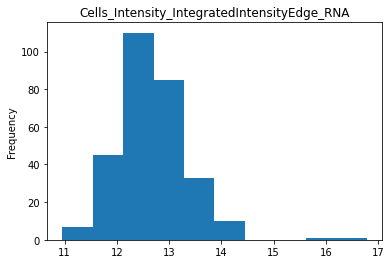

Plotting Cells_Intensity_IntegratedIntensity_RNA:   6%|▋         | 17/267 [00:03<00:59,  4.17it/s]    

Not normal


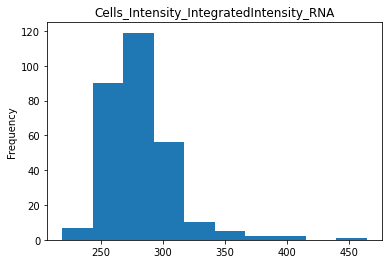

Plotting Cells_Intensity_LowerQuartileIntensity_RNA:   7%|▋         | 18/267 [00:03<00:56,  4.41it/s]

Not normal


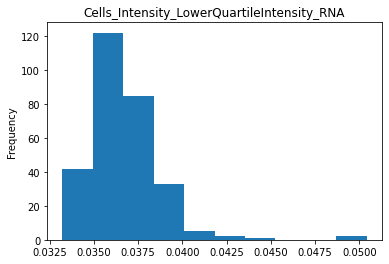

Plotting Cells_Intensity_MADIntensity_RNA:   7%|▋         | 19/267 [00:04<00:54,  4.51it/s]          

Not normal


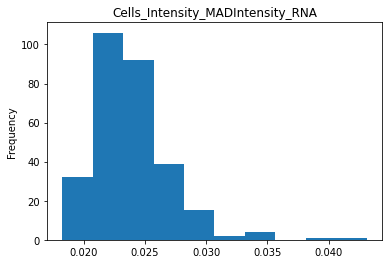

Plotting Cells_Intensity_MassDisplacement_RNA:   7%|▋         | 20/267 [00:04<01:11,  3.46it/s]

Not normal


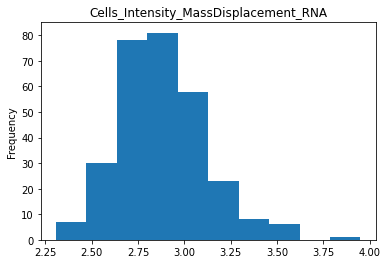

Plotting Cells_Intensity_MaxIntensityEdge_RNA:   8%|▊         | 21/267 [00:04<01:07,  3.65it/s]

Not normal


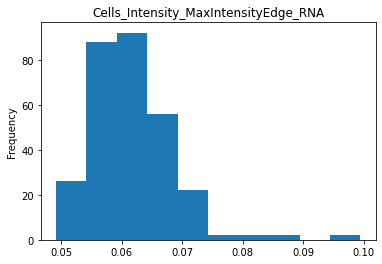

Plotting Cells_Intensity_MaxIntensity_RNA:   8%|▊         | 22/267 [00:05<01:03,  3.88it/s]    

Not normal


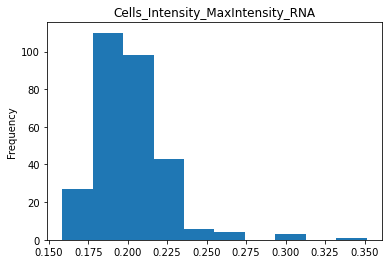

Plotting Cells_Intensity_MeanIntensityEdge_RNA:   9%|▊         | 23/267 [00:05<01:04,  3.80it/s]

Not normal


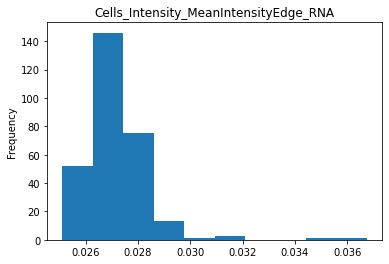

Plotting Cells_Intensity_MeanIntensity_RNA:   9%|▉         | 24/267 [00:05<01:13,  3.28it/s]    

Not normal


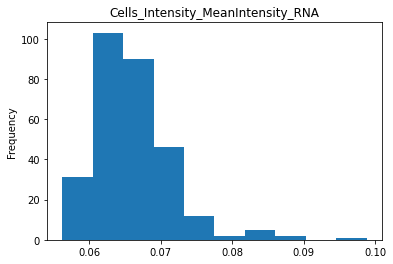

Plotting Cells_Intensity_MedianIntensity_RNA:   9%|▉         | 25/267 [00:06<01:20,  3.02it/s]

Not normal


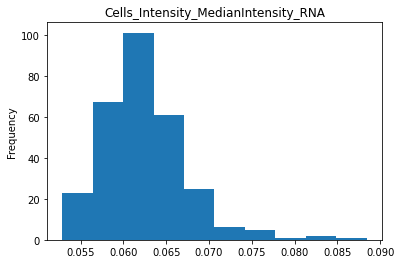

Plotting Cells_Intensity_MinIntensityEdge_RNA:  10%|▉         | 26/267 [00:06<01:26,  2.78it/s]

Not normal


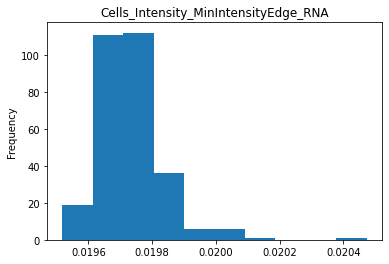

Plotting Cells_Intensity_MinIntensity_RNA:  10%|█         | 27/267 [00:06<01:17,  3.09it/s]    

Not normal


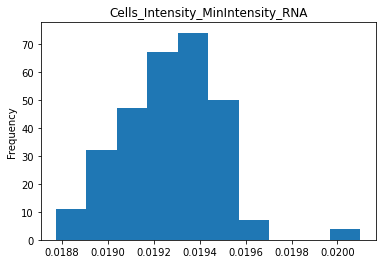

Plotting Cells_Intensity_StdIntensityEdge_RNA:  10%|█         | 28/267 [00:07<01:12,  3.30it/s]

Not normal


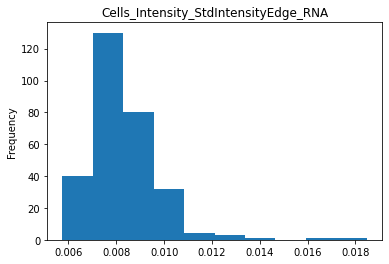

Plotting Cells_Intensity_StdIntensity_RNA:  11%|█         | 29/267 [00:07<01:05,  3.62it/s]    

Not normal


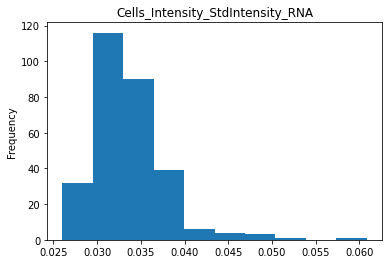

Plotting Cells_Intensity_UpperQuartileIntensity_RNA:  11%|█         | 30/267 [00:07<01:02,  3.80it/s]

Not normal


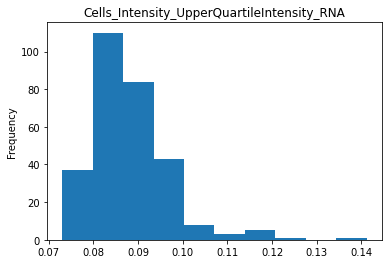

Plotting Cells_Location_CenterMassIntensity_X_RNA:  12%|█▏        | 31/267 [00:07<00:58,  4.04it/s]  

Not normal


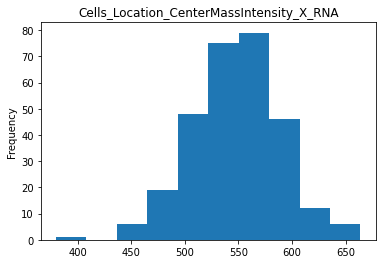

Plotting Cells_Location_CenterMassIntensity_Y_RNA:  12%|█▏        | 32/267 [00:07<00:57,  4.09it/s]

Not normal


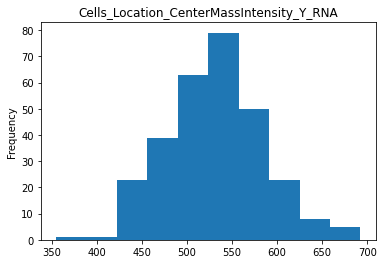

Plotting Cells_Location_MaxIntensity_X_RNA:  12%|█▏        | 33/267 [00:08<00:55,  4.22it/s]       

Not normal


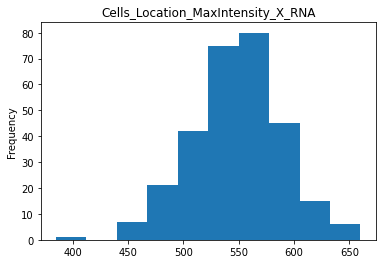

Plotting Cells_Location_MaxIntensity_Y_RNA:  13%|█▎        | 34/267 [00:08<00:55,  4.22it/s]

Not normal


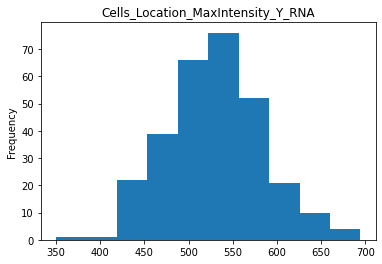

Plotting Cells_RadialDistribution_FracAtD_RNA_1of4:  13%|█▎        | 35/267 [00:08<00:57,  4.04it/s]

Not normal


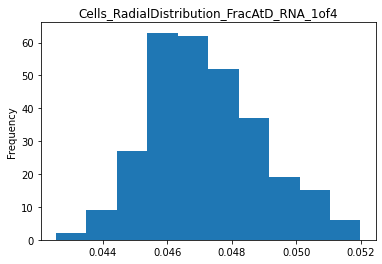

Plotting Cells_RadialDistribution_FracAtD_RNA_2of4:  13%|█▎        | 36/267 [00:08<00:54,  4.22it/s]

Not normal


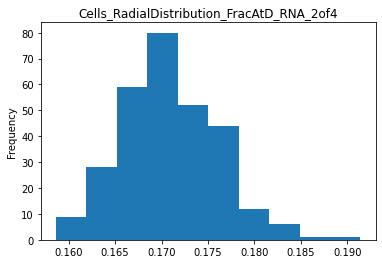

Plotting Cells_RadialDistribution_FracAtD_RNA_3of4:  14%|█▍        | 37/267 [00:09<00:53,  4.32it/s]

Not normal


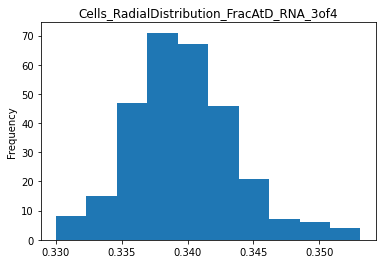

Plotting Cells_RadialDistribution_FracAtD_RNA_4of4:  14%|█▍        | 38/267 [00:09<00:50,  4.58it/s]

Not normal


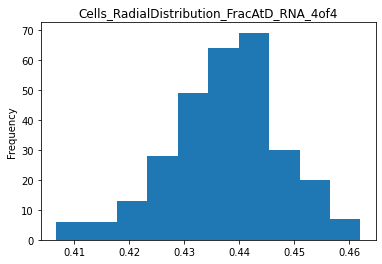

Plotting Cells_RadialDistribution_MeanFrac_RNA_1of4:  15%|█▍        | 39/267 [00:09<00:48,  4.66it/s]

Not normal


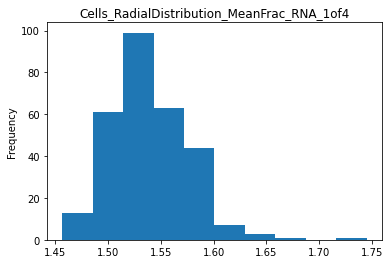

Plotting Cells_RadialDistribution_MeanFrac_RNA_2of4:  15%|█▍        | 40/267 [00:09<00:50,  4.51it/s]

Not normal


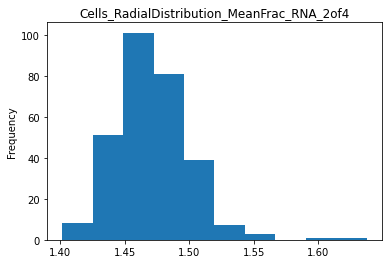

Plotting Cells_RadialDistribution_MeanFrac_RNA_3of4:  15%|█▌        | 41/267 [00:09<00:48,  4.64it/s]

Not normal


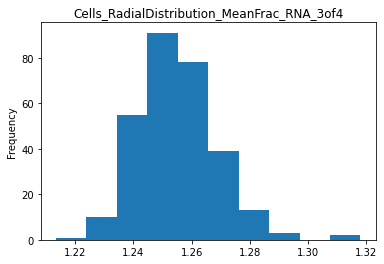

Plotting Cells_RadialDistribution_MeanFrac_RNA_4of4:  16%|█▌        | 42/267 [00:10<00:48,  4.63it/s]

Not normal


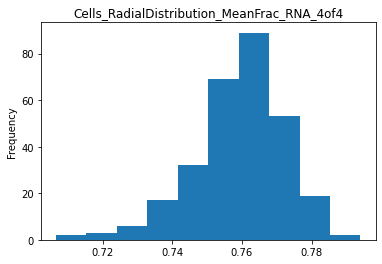

Plotting Cells_RadialDistribution_RadialCV_RNA_1of4:  16%|█▌        | 43/267 [00:10<00:56,  3.94it/s]

Not normal


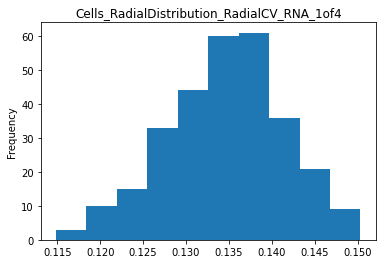

Plotting Cells_RadialDistribution_RadialCV_RNA_2of4:  16%|█▋        | 44/267 [00:10<00:55,  4.03it/s]

Not normal


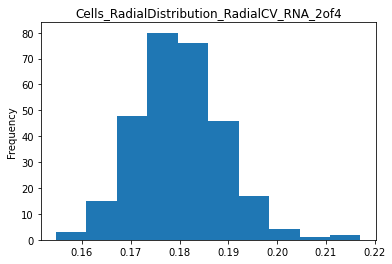

Plotting Cells_RadialDistribution_RadialCV_RNA_3of4:  17%|█▋        | 45/267 [00:10<00:53,  4.14it/s]

Not normal


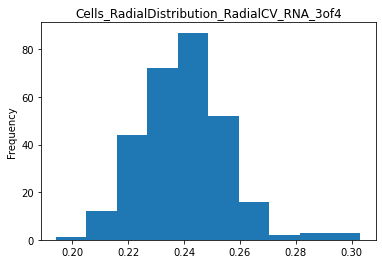

Plotting Cells_RadialDistribution_RadialCV_RNA_4of4:  17%|█▋        | 46/267 [00:11<00:53,  4.09it/s]

Not normal


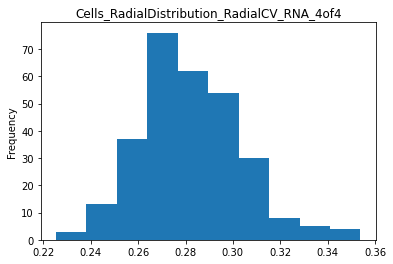

Plotting Cells_Texture_AngularSecondMoment_RNA_10_0:  18%|█▊        | 47/267 [00:11<00:55,  3.98it/s]

Not normal


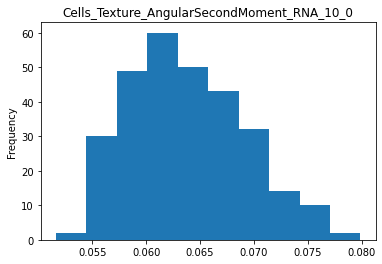

Plotting Cells_Texture_AngularSecondMoment_RNA_3_0:  18%|█▊        | 48/267 [00:11<00:54,  4.00it/s] 

Not normal


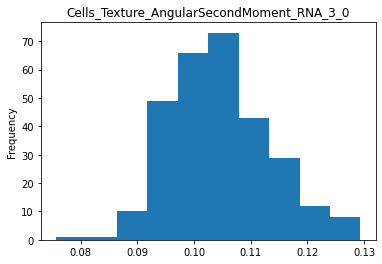

Plotting Cells_Texture_AngularSecondMoment_RNA_5_0:  18%|█▊        | 49/267 [00:11<00:53,  4.09it/s]

Not normal


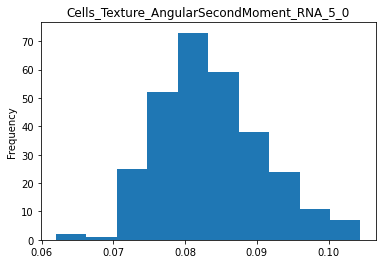

Plotting Cells_Texture_Contrast_RNA_10_0:  19%|█▊        | 50/267 [00:12<00:51,  4.20it/s]          

Not normal


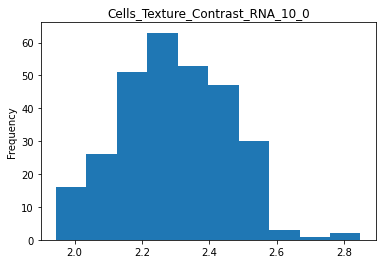

Plotting Cells_Texture_Contrast_RNA_3_0:  19%|█▉        | 51/267 [00:12<00:49,  4.37it/s] 

Not normal


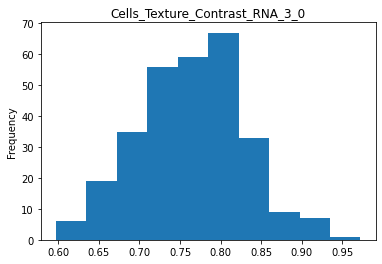

Plotting Cells_Texture_Contrast_RNA_5_0:  19%|█▉        | 52/267 [00:12<00:51,  4.21it/s]

Not normal


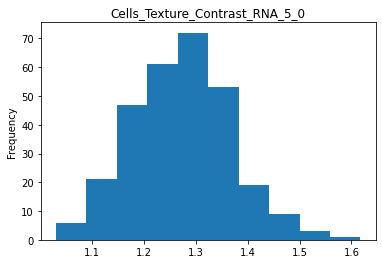

Plotting Cells_Texture_Correlation_RNA_10_0:  20%|█▉        | 53/267 [00:12<00:56,  3.80it/s]

Not normal


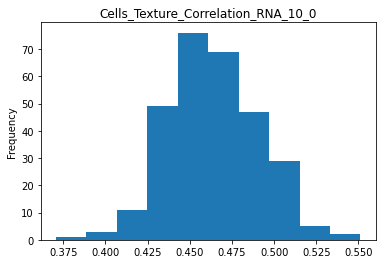

Plotting Cells_Texture_Correlation_RNA_3_0:  20%|██        | 54/267 [00:13<00:56,  3.77it/s] 

Not normal


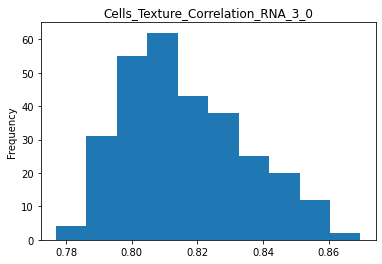

Plotting Cells_Texture_Correlation_RNA_5_0:  21%|██        | 55/267 [00:13<00:59,  3.59it/s]

Not normal


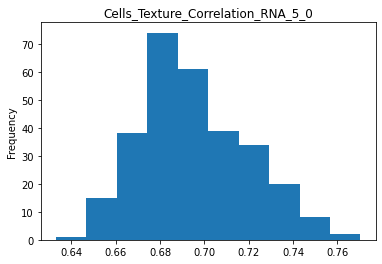

Plotting Cells_Texture_DifferenceEntropy_RNA_10_0:  21%|██        | 56/267 [00:13<00:59,  3.52it/s]

Not normal


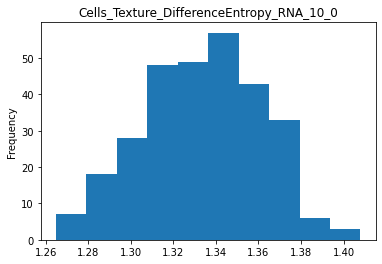

Plotting Cells_Texture_DifferenceEntropy_RNA_3_0:  21%|██▏       | 57/267 [00:14<01:17,  2.72it/s] 

Not normal


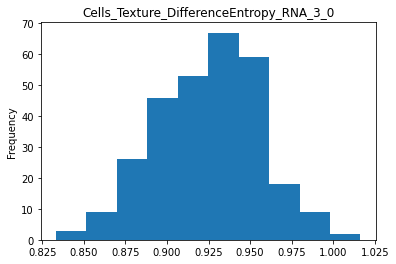

Plotting Cells_Texture_DifferenceEntropy_RNA_5_0:  22%|██▏       | 58/267 [00:15<01:37,  2.14it/s]

Not normal


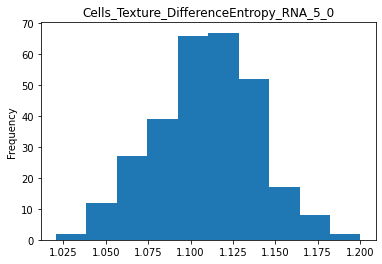

Plotting Cells_Texture_DifferenceVariance_RNA_10_0:  22%|██▏       | 59/267 [00:15<01:26,  2.41it/s]

Not normal


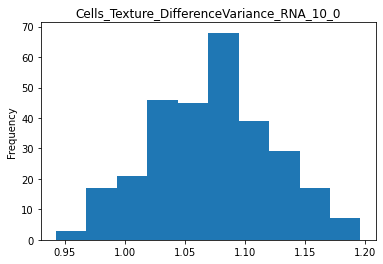

Plotting Cells_Texture_DifferenceVariance_RNA_3_0:  22%|██▏       | 60/267 [00:15<01:14,  2.78it/s] 

Not normal


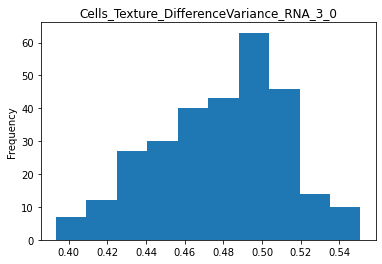

Plotting Cells_Texture_DifferenceVariance_RNA_5_0:  23%|██▎       | 61/267 [00:15<01:08,  2.99it/s]

Not normal


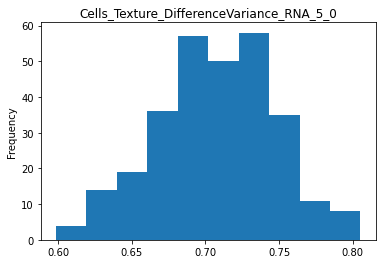

Plotting Cells_Texture_Entropy_RNA_10_0:  23%|██▎       | 62/267 [00:16<01:01,  3.34it/s]          

Not normal


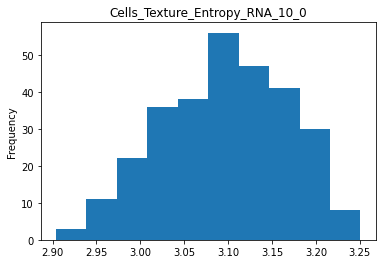

Plotting Cells_Texture_Entropy_RNA_3_0:  24%|██▎       | 63/267 [00:16<01:01,  3.32it/s] 

Not normal


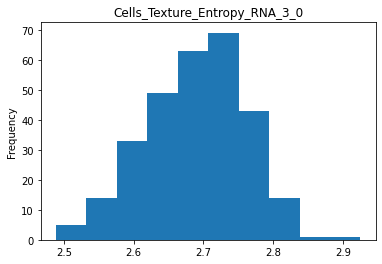

Plotting Cells_Texture_Entropy_RNA_5_0:  24%|██▍       | 64/267 [00:16<01:02,  3.27it/s]

Not normal


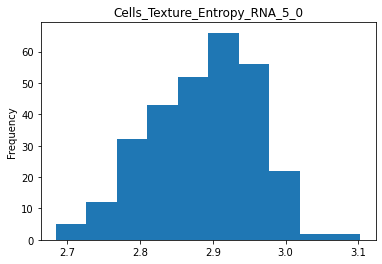

Plotting Cells_Texture_Gabor_RNA_10:  24%|██▍       | 65/267 [00:16<00:56,  3.58it/s]   

Not normal


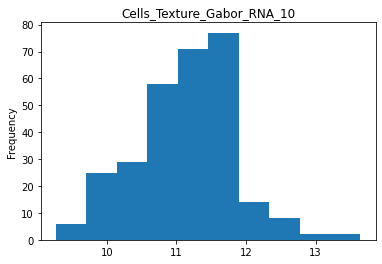

Plotting Cells_Texture_Gabor_RNA_3:  25%|██▍       | 66/267 [00:17<00:53,  3.78it/s] 

Not normal


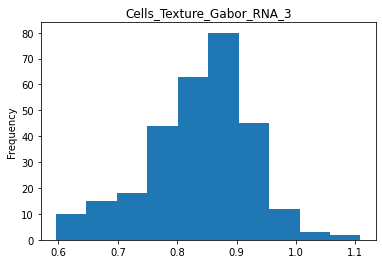

Plotting Cells_Texture_Gabor_RNA_5:  25%|██▌       | 67/267 [00:17<00:53,  3.76it/s]

Not normal


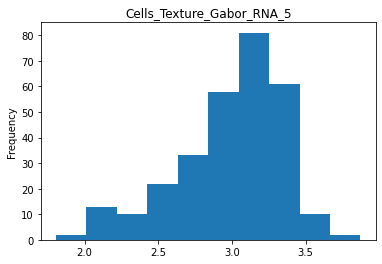

Plotting Cells_Texture_InfoMeas1_RNA_10_0:  25%|██▌       | 68/267 [00:17<00:54,  3.67it/s]

Not normal


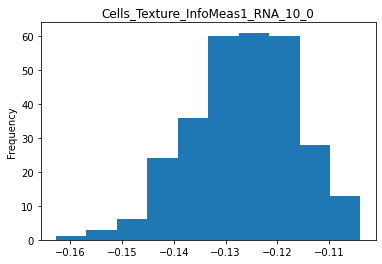

Plotting Cells_Texture_InfoMeas1_RNA_3_0:  26%|██▌       | 69/267 [00:18<00:56,  3.50it/s] 

Not normal


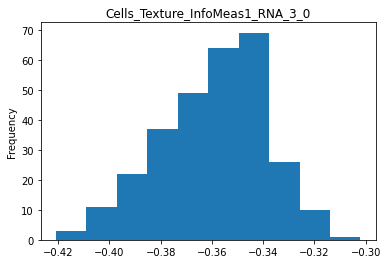

Plotting Cells_Texture_InfoMeas1_RNA_5_0:  26%|██▌       | 70/267 [00:18<00:57,  3.40it/s]

Not normal


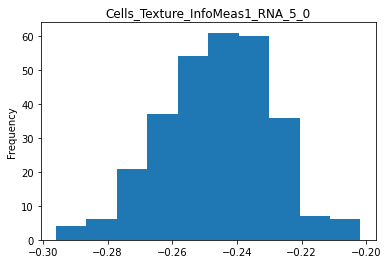

Plotting Cells_Texture_InfoMeas2_RNA_10_0:  27%|██▋       | 71/267 [00:18<01:04,  3.02it/s]

Not normal


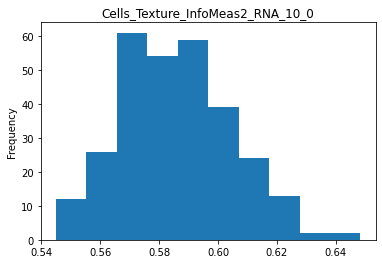

Plotting Cells_Texture_InfoMeas2_RNA_3_0:  27%|██▋       | 72/267 [00:19<01:07,  2.89it/s] 

Not normal


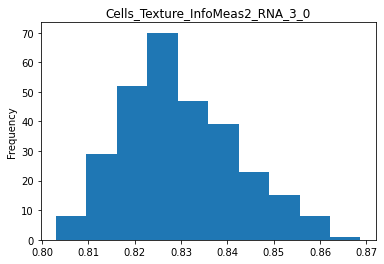

Plotting Cells_Texture_InfoMeas2_RNA_5_0:  27%|██▋       | 73/267 [00:19<01:07,  2.89it/s]

Not normal


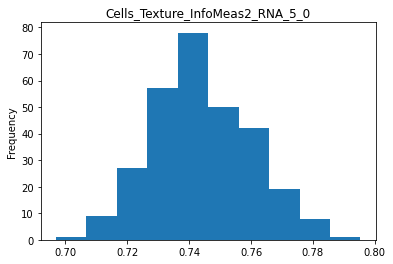

Plotting Cells_Texture_InverseDifferenceMoment_RNA_10_0:  28%|██▊       | 74/267 [00:19<01:05,  2.95it/s]

Not normal


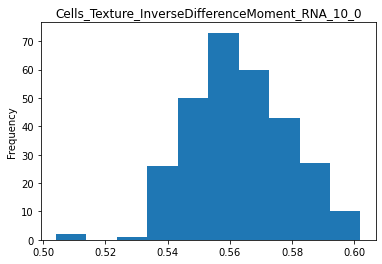

Plotting Cells_Texture_InverseDifferenceMoment_RNA_3_0:  28%|██▊       | 75/267 [00:20<01:00,  3.16it/s] 

Not normal


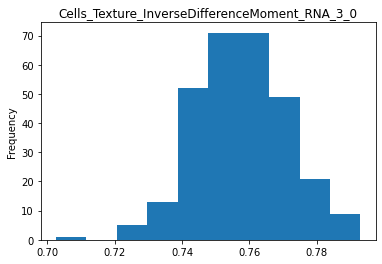

Plotting Cells_Texture_InverseDifferenceMoment_RNA_5_0:  28%|██▊       | 76/267 [00:20<00:56,  3.39it/s]

Not normal


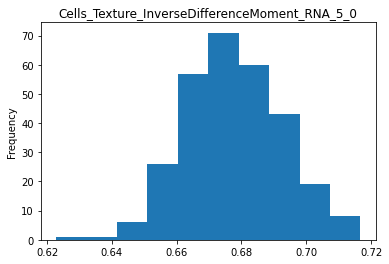

Plotting Cells_Texture_SumAverage_RNA_10_0:  29%|██▉       | 77/267 [00:20<00:54,  3.48it/s]            

Not normal


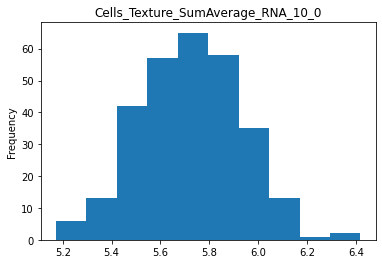

Plotting Cells_Texture_SumAverage_RNA_3_0:  29%|██▉       | 78/267 [00:20<00:52,  3.59it/s] 

Not normal


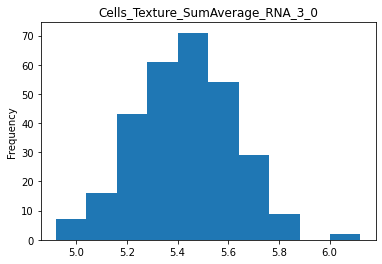

Plotting Cells_Texture_SumAverage_RNA_5_0:  30%|██▉       | 79/267 [00:21<00:51,  3.65it/s]

Not normal


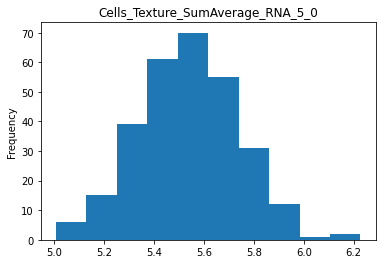

Plotting Cells_Texture_SumEntropy_RNA_10_0:  30%|██▉       | 80/267 [00:21<00:50,  3.73it/s]

Not normal


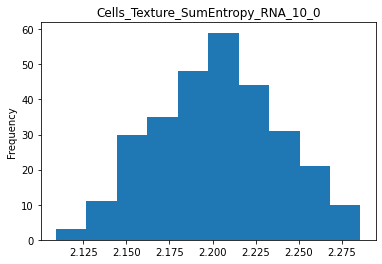

Plotting Cells_Texture_SumEntropy_RNA_3_0:  30%|███       | 81/267 [00:21<00:48,  3.82it/s] 

Not normal


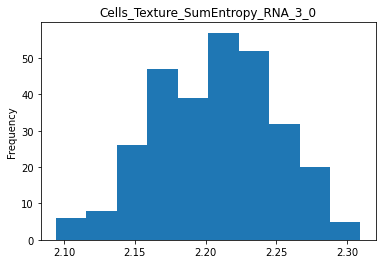

Plotting Cells_Texture_SumEntropy_RNA_5_0:  31%|███       | 82/267 [00:21<00:49,  3.76it/s]

Not normal


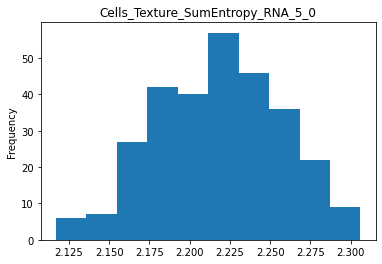

Plotting Cells_Texture_SumVariance_RNA_10_0:  31%|███       | 83/267 [00:22<00:49,  3.76it/s]

Not normal


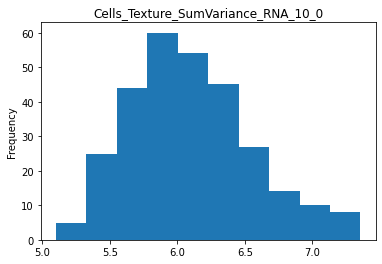

Plotting Cells_Texture_SumVariance_RNA_3_0:  31%|███▏      | 84/267 [00:22<00:47,  3.88it/s] 

Not normal


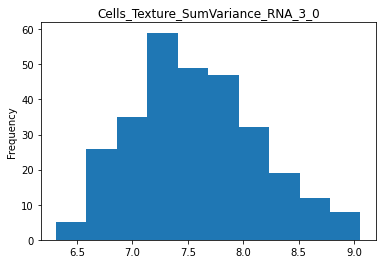

Plotting Cells_Texture_SumVariance_RNA_5_0:  32%|███▏      | 85/267 [00:22<00:44,  4.07it/s]

Not normal


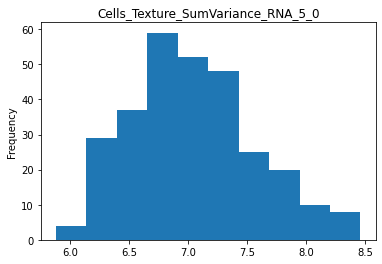

Plotting Cells_Texture_Variance_RNA_10_0:  32%|███▏      | 86/267 [00:22<00:42,  4.27it/s]  

Not normal


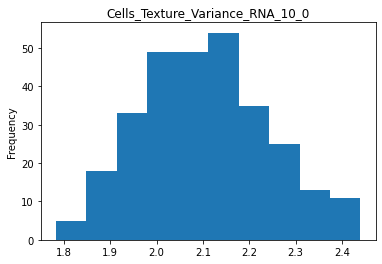

Plotting Cells_Texture_Variance_RNA_3_0:  33%|███▎      | 87/267 [00:23<00:40,  4.41it/s] 

Not normal


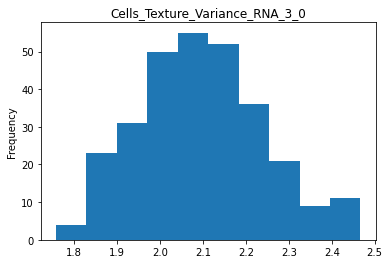

Plotting Cells_Texture_Variance_RNA_5_0:  33%|███▎      | 88/267 [00:23<00:39,  4.57it/s]

Not normal


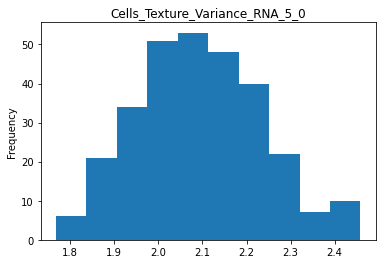

Plotting Cytoplasm_Granularity_10_RNA:  33%|███▎      | 89/267 [00:23<00:37,  4.70it/s]  

Not normal


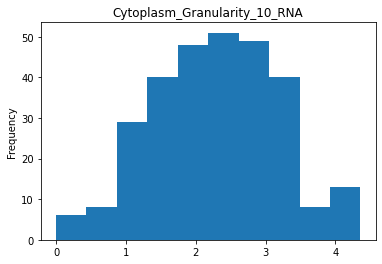

Plotting Cytoplasm_Granularity_11_RNA:  34%|███▎      | 90/267 [00:23<00:42,  4.20it/s]

Not normal


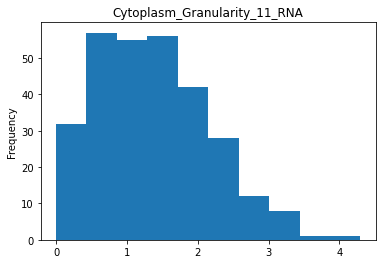

Plotting Cytoplasm_Granularity_12_RNA:  34%|███▍      | 91/267 [00:23<00:41,  4.24it/s]

Not normal


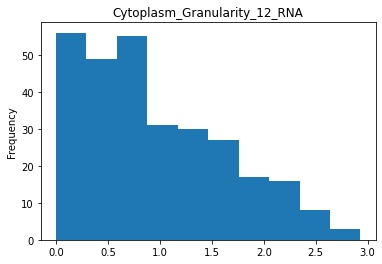

Plotting Cytoplasm_Granularity_13_RNA:  34%|███▍      | 92/267 [00:24<00:42,  4.08it/s]

Not normal


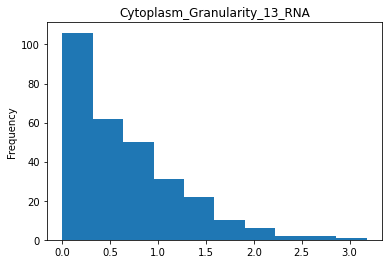

Plotting Cytoplasm_Granularity_14_RNA:  35%|███▍      | 93/267 [00:24<00:39,  4.40it/s]

Not normal


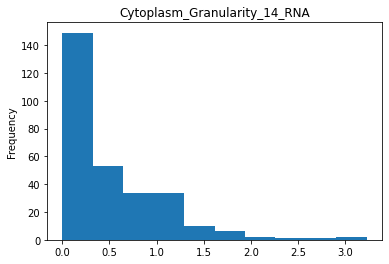

Plotting Cytoplasm_Granularity_15_RNA:  35%|███▌      | 94/267 [00:24<00:38,  4.55it/s]

Not normal


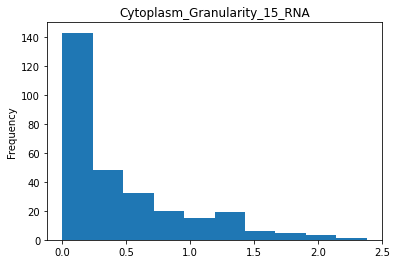

Plotting Cytoplasm_Granularity_16_RNA:  36%|███▌      | 95/267 [00:24<00:38,  4.43it/s]

Not normal


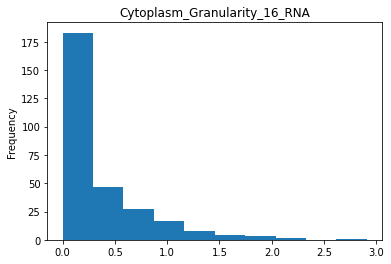

Plotting Cytoplasm_Granularity_1_RNA:  36%|███▌      | 96/267 [00:25<00:37,  4.61it/s] 

Not normal


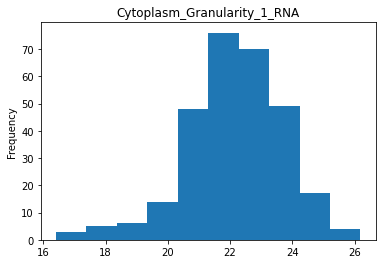

Plotting Cytoplasm_Granularity_2_RNA:  36%|███▋      | 97/267 [00:25<00:47,  3.60it/s]

Not normal


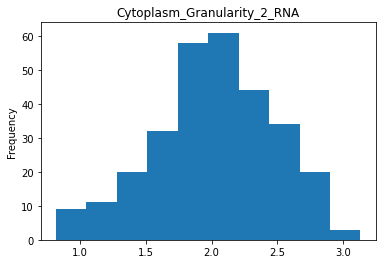

Plotting Cytoplasm_Granularity_3_RNA:  37%|███▋      | 98/267 [00:25<00:41,  4.04it/s]

Not normal


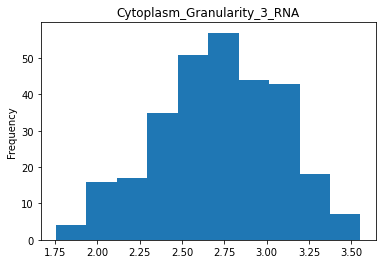

Plotting Cytoplasm_Granularity_4_RNA:  37%|███▋      | 99/267 [00:25<00:40,  4.14it/s]

Not normal


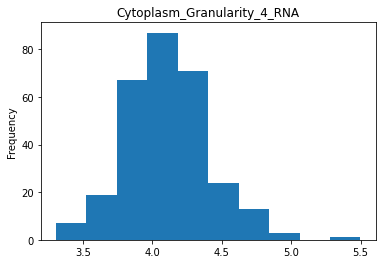

Plotting Cytoplasm_Granularity_5_RNA:  37%|███▋      | 100/267 [00:26<00:37,  4.46it/s]

Not normal


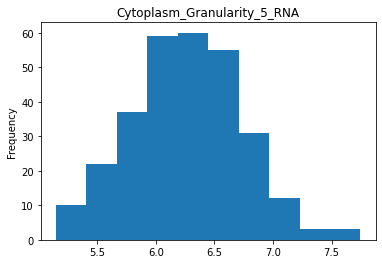

Plotting Cytoplasm_Granularity_6_RNA:  38%|███▊      | 101/267 [00:26<00:35,  4.66it/s]

Not normal


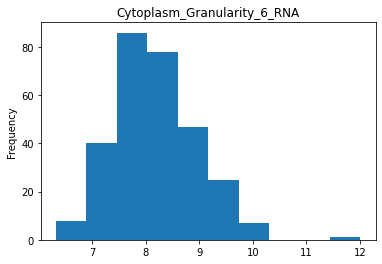

Plotting Cytoplasm_Granularity_7_RNA:  38%|███▊      | 102/267 [00:26<00:34,  4.77it/s]

Not normal


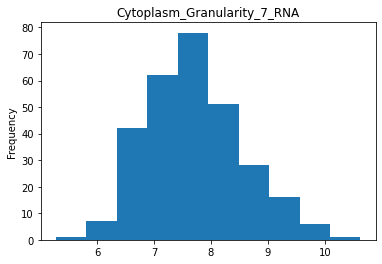

Plotting Cytoplasm_Granularity_8_RNA:  39%|███▊      | 103/267 [00:26<00:36,  4.45it/s]

Not normal


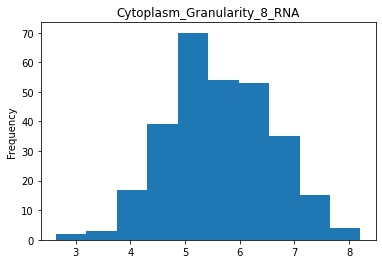

Plotting Cytoplasm_Granularity_9_RNA:  39%|███▉      | 104/267 [00:26<00:35,  4.57it/s]

Not normal


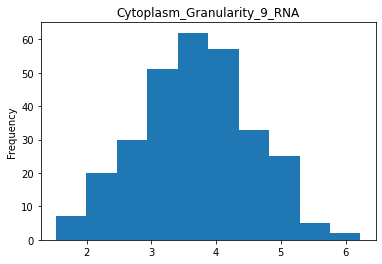

Plotting Cytoplasm_Intensity_IntegratedIntensityEdge_RNA:  39%|███▉      | 105/267 [00:27<00:34,  4.65it/s]

Not normal


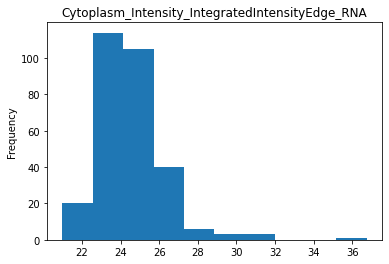

Plotting Cytoplasm_Intensity_IntegratedIntensity_RNA:  40%|███▉      | 106/267 [00:27<00:34,  4.62it/s]    

Not normal


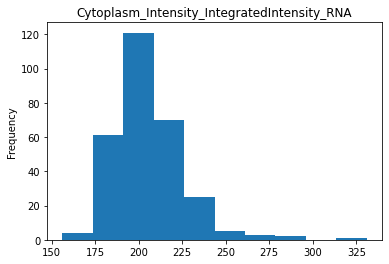

Plotting Cytoplasm_Intensity_LowerQuartileIntensity_RNA:  40%|████      | 107/267 [00:27<00:34,  4.67it/s]

Not normal


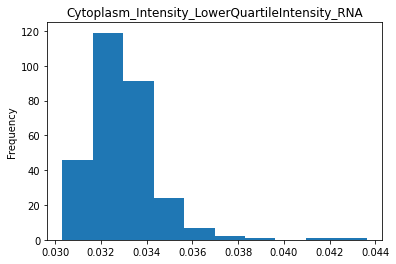

Plotting Cytoplasm_Intensity_MADIntensity_RNA:  40%|████      | 108/267 [00:27<00:33,  4.73it/s]          

Not normal


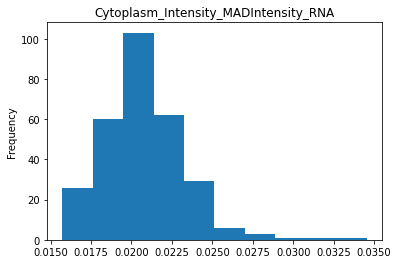

Plotting Cytoplasm_Intensity_MassDisplacement_RNA:  41%|████      | 109/267 [00:27<00:33,  4.71it/s]

Not normal


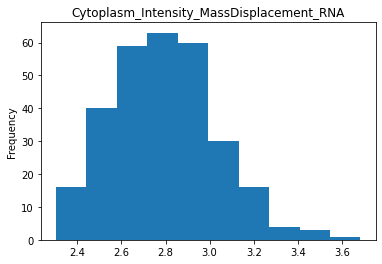

Plotting Cytoplasm_Intensity_MaxIntensityEdge_RNA:  41%|████      | 110/267 [00:28<00:39,  3.99it/s]

Not normal


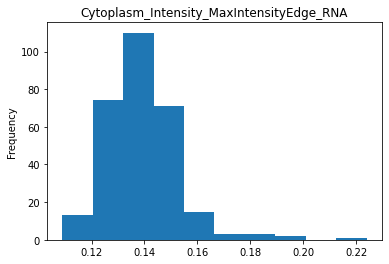

Plotting Cytoplasm_Intensity_MaxIntensity_RNA:  42%|████▏     | 111/267 [00:28<00:35,  4.43it/s]    

Not normal


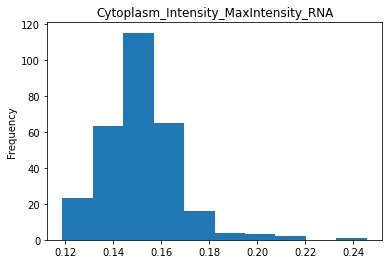

Plotting Cytoplasm_Intensity_MeanIntensityEdge_RNA:  42%|████▏     | 112/267 [00:28<00:34,  4.47it/s]

Not normal


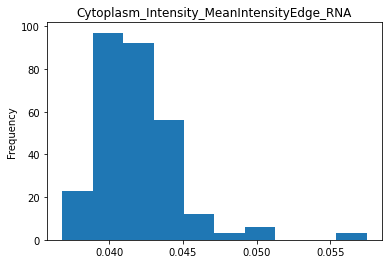

Plotting Cytoplasm_Intensity_MeanIntensity_RNA:  42%|████▏     | 113/267 [00:28<00:33,  4.62it/s]    

Not normal


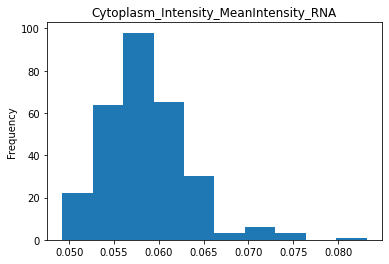

Plotting Cytoplasm_Intensity_MedianIntensity_RNA:  43%|████▎     | 114/267 [00:29<00:33,  4.59it/s]

Not normal


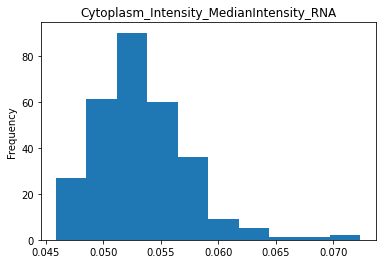

Plotting Cytoplasm_Intensity_MinIntensityEdge_RNA:  43%|████▎     | 115/267 [00:29<00:31,  4.78it/s]

Not normal


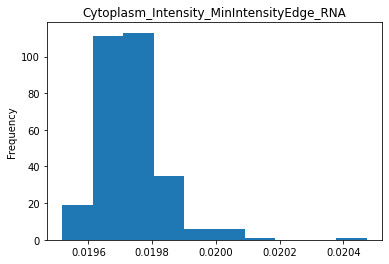

Plotting Cytoplasm_Intensity_MinIntensity_RNA:  43%|████▎     | 116/267 [00:29<00:31,  4.86it/s]    

Not normal


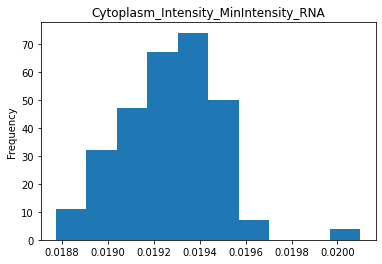

Plotting Cytoplasm_Intensity_StdIntensityEdge_RNA:  44%|████▍     | 117/267 [00:29<00:31,  4.70it/s]

Not normal


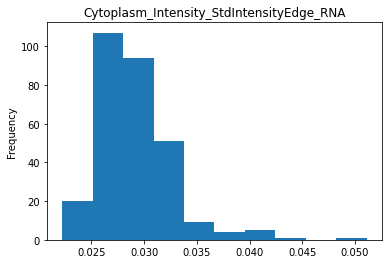

Plotting Cytoplasm_Intensity_StdIntensity_RNA:  44%|████▍     | 118/267 [00:29<00:31,  4.69it/s]    

Not normal


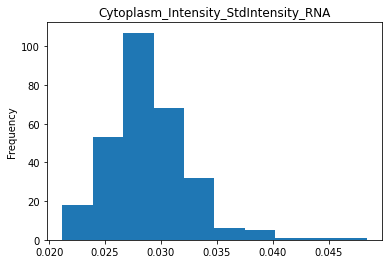

Plotting Cytoplasm_Intensity_UpperQuartileIntensity_RNA:  45%|████▍     | 119/267 [00:30<00:30,  4.79it/s]

Not normal


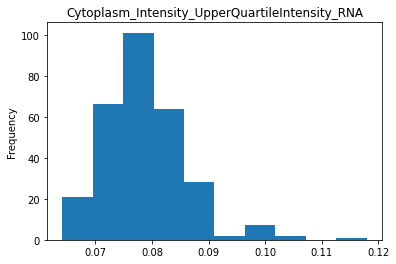

Plotting Cytoplasm_Location_CenterMassIntensity_X_RNA:  45%|████▍     | 120/267 [00:30<00:30,  4.90it/s]  

Not normal


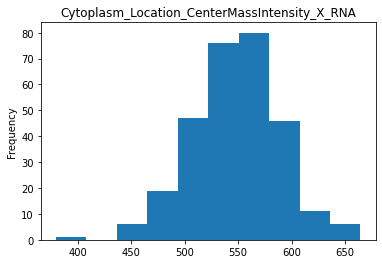

Plotting Cytoplasm_Location_CenterMassIntensity_Y_RNA:  45%|████▌     | 121/267 [00:30<00:30,  4.76it/s]

Not normal


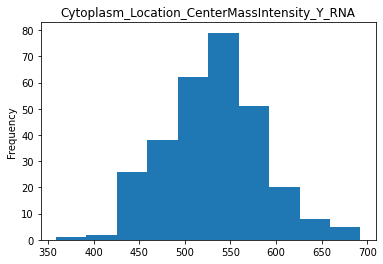

Plotting Cytoplasm_Location_MaxIntensity_X_RNA:  46%|████▌     | 122/267 [00:30<00:31,  4.67it/s]       

Not normal


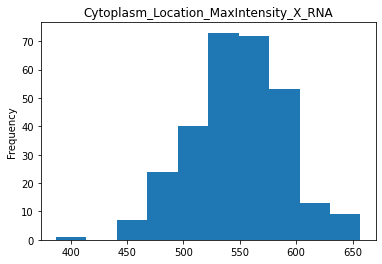

Plotting Cytoplasm_Location_MaxIntensity_Y_RNA:  46%|████▌     | 123/267 [00:31<00:30,  4.76it/s]

Not normal


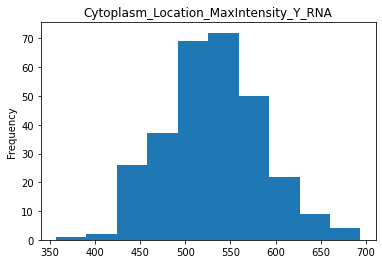

Plotting Cytoplasm_RadialDistribution_FracAtD_RNA_1of4:  46%|████▋     | 124/267 [00:31<00:30,  4.69it/s]

Not normal


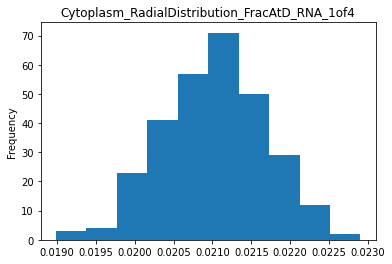

Plotting Cytoplasm_RadialDistribution_FracAtD_RNA_2of4:  47%|████▋     | 125/267 [00:31<00:30,  4.58it/s]

Not normal


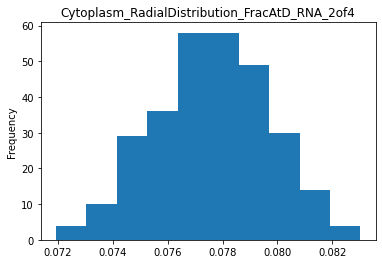

Plotting Cytoplasm_RadialDistribution_FracAtD_RNA_3of4:  47%|████▋     | 126/267 [00:31<00:30,  4.65it/s]

Not normal


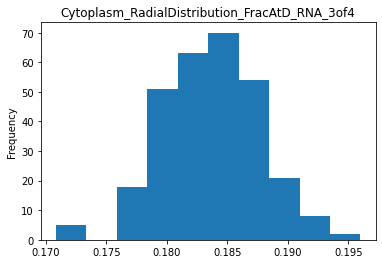

Plotting Cytoplasm_RadialDistribution_FracAtD_RNA_4of4:  48%|████▊     | 127/267 [00:31<00:30,  4.63it/s]

Not normal


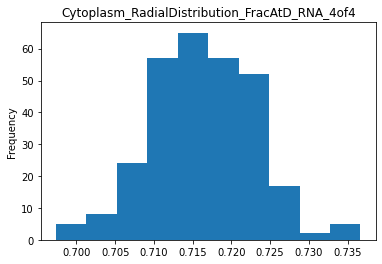

Plotting Cytoplasm_RadialDistribution_MeanFrac_RNA_1of4:  48%|████▊     | 128/267 [00:32<00:30,  4.57it/s]

Not normal


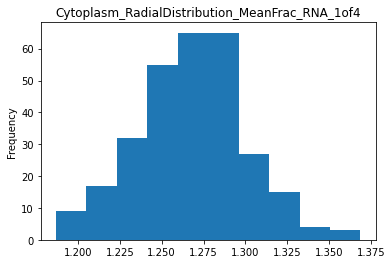

Plotting Cytoplasm_RadialDistribution_MeanFrac_RNA_2of4:  48%|████▊     | 129/267 [00:32<00:29,  4.67it/s]

Not normal


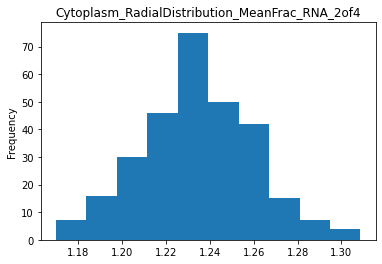

Plotting Cytoplasm_RadialDistribution_MeanFrac_RNA_3of4:  49%|████▊     | 130/267 [00:32<00:29,  4.66it/s]

Not normal


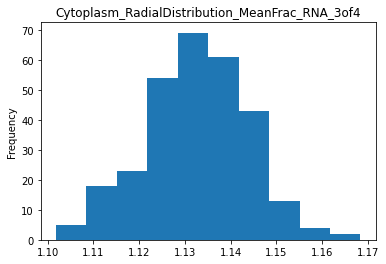

Plotting Cytoplasm_RadialDistribution_MeanFrac_RNA_4of4:  49%|████▉     | 131/267 [00:32<00:29,  4.62it/s]

Not normal


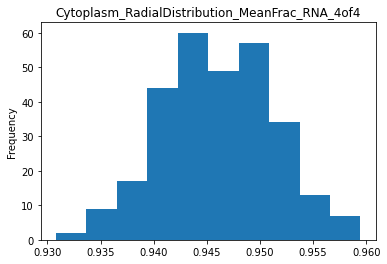

Plotting Cytoplasm_RadialDistribution_RadialCV_RNA_1of4:  49%|████▉     | 132/267 [00:32<00:28,  4.73it/s]

Not normal


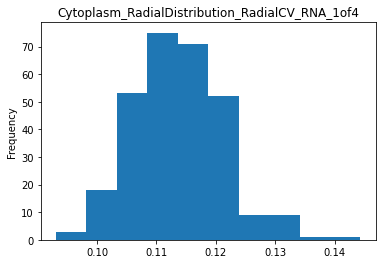

Plotting Cytoplasm_RadialDistribution_RadialCV_RNA_2of4:  50%|████▉     | 133/267 [00:33<00:28,  4.73it/s]

Not normal


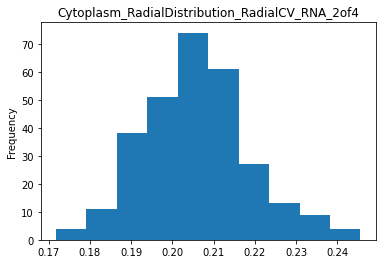

Plotting Cytoplasm_RadialDistribution_RadialCV_RNA_3of4:  50%|█████     | 134/267 [00:33<00:28,  4.61it/s]

Not normal


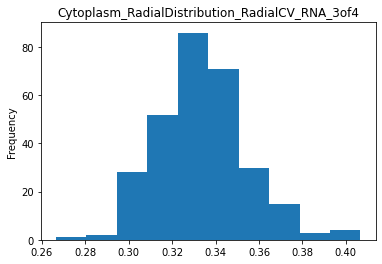

Plotting Cytoplasm_RadialDistribution_RadialCV_RNA_4of4:  51%|█████     | 135/267 [00:33<00:29,  4.47it/s]

Not normal


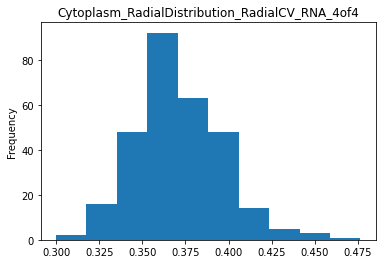

Plotting Cytoplasm_Texture_AngularSecondMoment_RNA_10_0:  51%|█████     | 136/267 [00:33<00:30,  4.35it/s]

Not normal


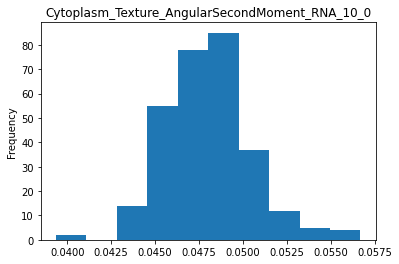

Plotting Cytoplasm_Texture_AngularSecondMoment_RNA_3_0:  51%|█████▏    | 137/267 [00:34<00:30,  4.26it/s] 

Not normal


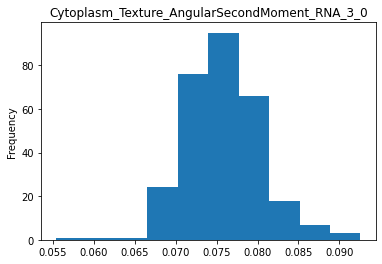

Plotting Cytoplasm_Texture_AngularSecondMoment_RNA_5_0:  52%|█████▏    | 138/267 [00:34<00:38,  3.36it/s]

Not normal


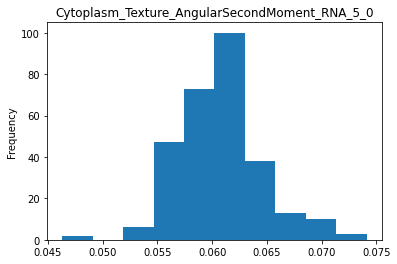

Plotting Cytoplasm_Texture_Contrast_RNA_10_0:  52%|█████▏    | 139/267 [00:34<00:34,  3.69it/s]          

Not normal


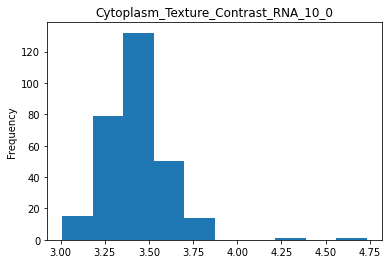

Plotting Cytoplasm_Texture_Contrast_RNA_3_0:  52%|█████▏    | 140/267 [00:34<00:32,  3.93it/s] 

Not normal


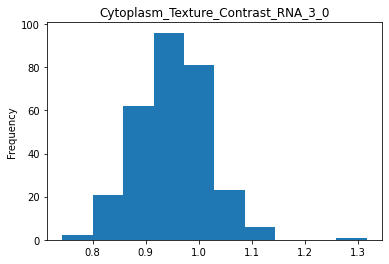

Plotting Cytoplasm_Texture_Contrast_RNA_5_0:  53%|█████▎    | 141/267 [00:35<00:29,  4.28it/s]

Not normal


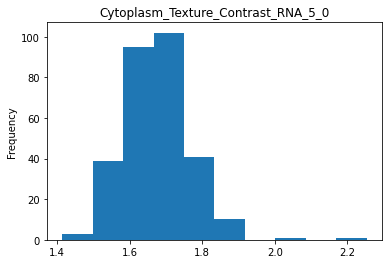

Plotting Cytoplasm_Texture_Correlation_RNA_10_0:  53%|█████▎    | 142/267 [00:35<00:27,  4.56it/s]

Not normal


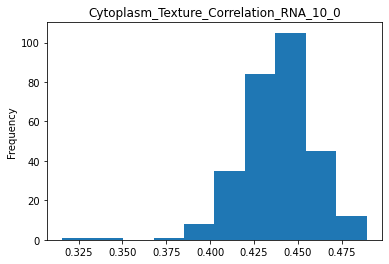

Plotting Cytoplasm_Texture_Correlation_RNA_3_0:  54%|█████▎    | 143/267 [00:35<00:26,  4.71it/s] 

Not normal


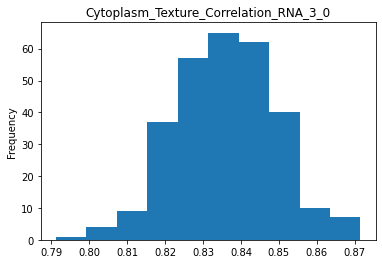

Plotting Cytoplasm_Texture_Correlation_RNA_5_0:  54%|█████▍    | 144/267 [00:35<00:26,  4.69it/s]

Not normal


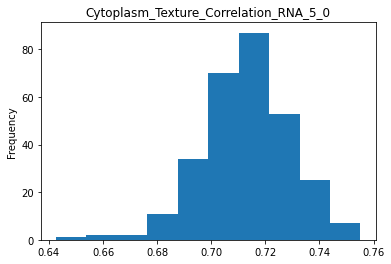

Plotting Cytoplasm_Texture_DifferenceEntropy_RNA_10_0:  54%|█████▍    | 145/267 [00:35<00:24,  4.94it/s]

Not normal


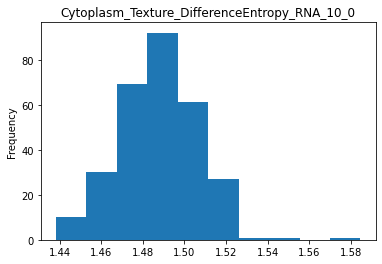

Plotting Cytoplasm_Texture_DifferenceEntropy_RNA_3_0:  55%|█████▍    | 146/267 [00:36<00:24,  4.90it/s] 

Not normal


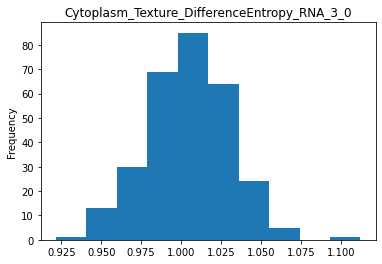

Plotting Cytoplasm_Texture_DifferenceEntropy_RNA_5_0:  55%|█████▌    | 147/267 [00:36<00:26,  4.58it/s]

Not normal


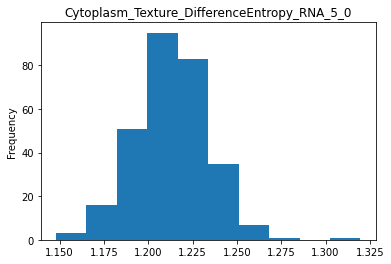

Plotting Cytoplasm_Texture_DifferenceVariance_RNA_10_0:  55%|█████▌    | 148/267 [00:36<00:26,  4.42it/s]

Not normal


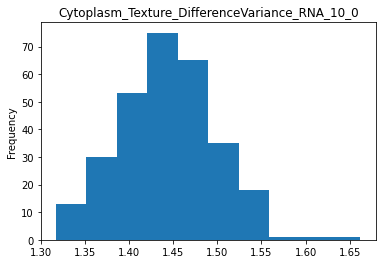

Plotting Cytoplasm_Texture_DifferenceVariance_RNA_3_0:  56%|█████▌    | 149/267 [00:36<00:26,  4.48it/s] 

Not normal


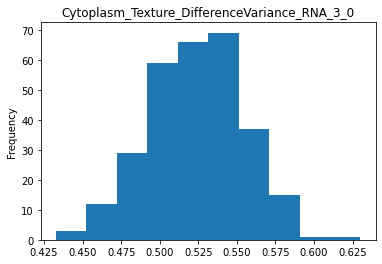

Plotting Cytoplasm_Texture_DifferenceVariance_RNA_5_0:  56%|█████▌    | 150/267 [00:37<00:26,  4.42it/s]

Not normal


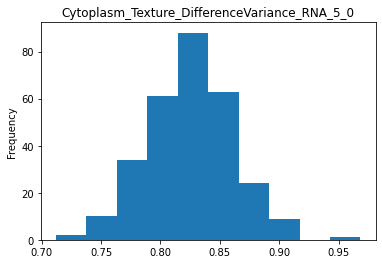

Plotting Cytoplasm_Texture_Entropy_RNA_10_0:  57%|█████▋    | 151/267 [00:37<00:24,  4.75it/s]          

Not normal


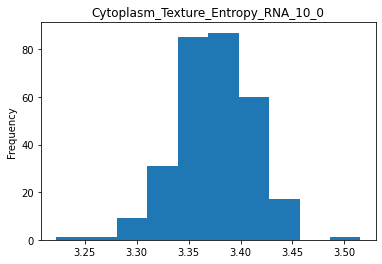

Plotting Cytoplasm_Texture_Entropy_RNA_3_0:  57%|█████▋    | 152/267 [00:37<00:23,  4.87it/s] 

Not normal


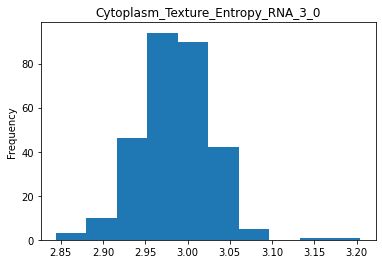

Plotting Cytoplasm_Texture_Entropy_RNA_5_0:  57%|█████▋    | 153/267 [00:37<00:22,  5.05it/s]

Not normal


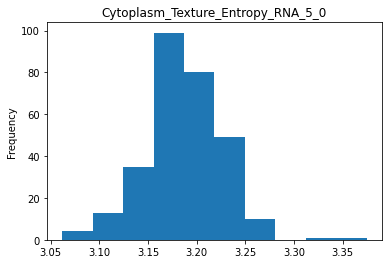

Plotting Cytoplasm_Texture_Gabor_RNA_10:  58%|█████▊    | 154/267 [00:37<00:22,  5.12it/s]   

Not normal


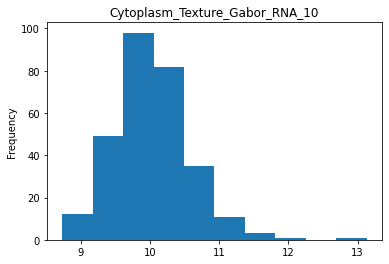

Plotting Cytoplasm_Texture_Gabor_RNA_3:  58%|█████▊    | 155/267 [00:38<00:22,  5.05it/s] 

Not normal


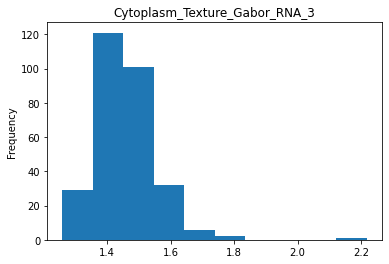

Plotting Cytoplasm_Texture_Gabor_RNA_5:  58%|█████▊    | 156/267 [00:38<00:21,  5.08it/s]

Not normal


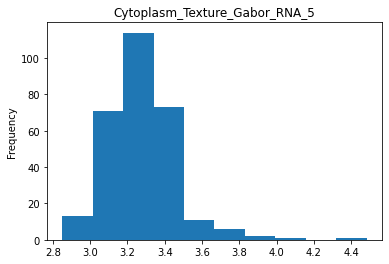

Plotting Cytoplasm_Texture_InfoMeas1_RNA_10_0:  59%|█████▉    | 157/267 [00:38<00:21,  5.05it/s]

Not normal


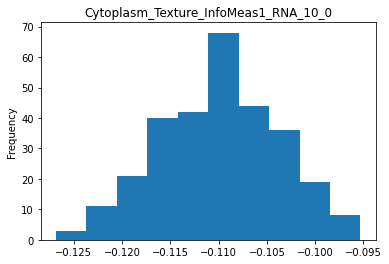

Plotting Cytoplasm_Texture_InfoMeas1_RNA_3_0:  59%|█████▉    | 158/267 [00:38<00:22,  4.88it/s] 

Not normal


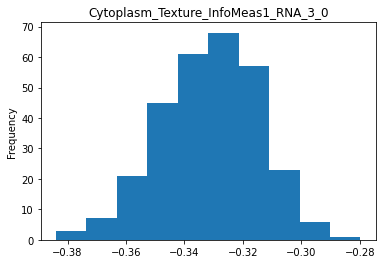

Plotting Cytoplasm_Texture_InfoMeas1_RNA_5_0:  60%|█████▉    | 159/267 [00:38<00:21,  4.96it/s]

Not normal


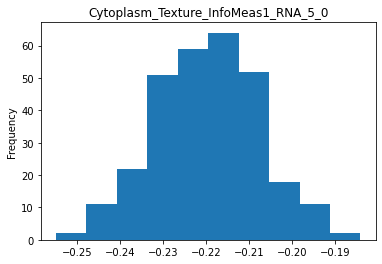

Plotting Cytoplasm_Texture_InfoMeas2_RNA_10_0:  60%|█████▉    | 160/267 [00:39<00:21,  4.90it/s]

Not normal


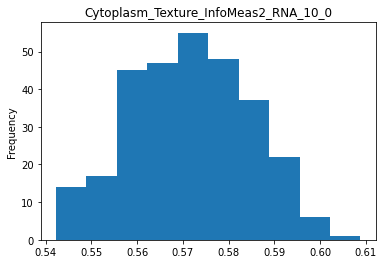

Plotting Cytoplasm_Texture_InfoMeas2_RNA_3_0:  60%|██████    | 161/267 [00:39<00:20,  5.07it/s] 

Not normal


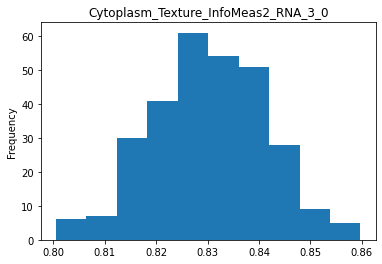

Plotting Cytoplasm_Texture_InfoMeas2_RNA_5_0:  61%|██████    | 162/267 [00:39<00:20,  5.05it/s]

Not normal


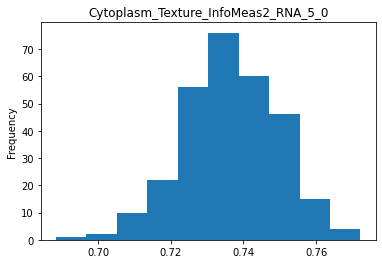

Plotting Cytoplasm_Texture_InverseDifferenceMoment_RNA_10_0:  61%|██████    | 163/267 [00:39<00:20,  5.02it/s]

Not normal


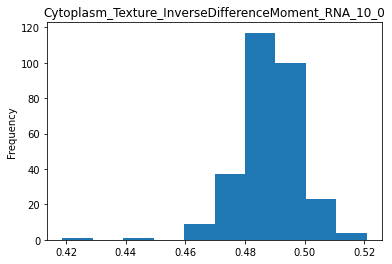

Plotting Cytoplasm_Texture_InverseDifferenceMoment_RNA_3_0:  61%|██████▏   | 164/267 [00:39<00:20,  4.95it/s] 

Not normal


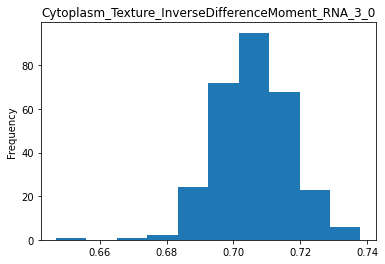

Plotting Cytoplasm_Texture_InverseDifferenceMoment_RNA_5_0:  62%|██████▏   | 165/267 [00:40<00:20,  5.01it/s]

Not normal


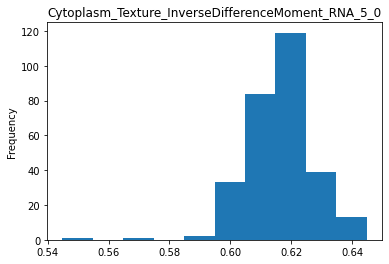

Plotting Cytoplasm_Texture_SumAverage_RNA_10_0:  62%|██████▏   | 166/267 [00:40<00:20,  4.89it/s]            

Not normal


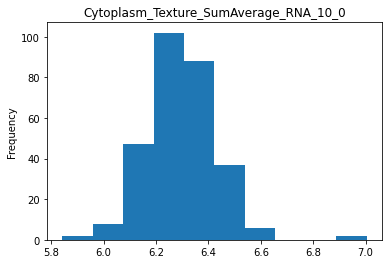

Plotting Cytoplasm_Texture_SumAverage_RNA_3_0:  63%|██████▎   | 167/267 [00:40<00:20,  4.95it/s] 

Not normal


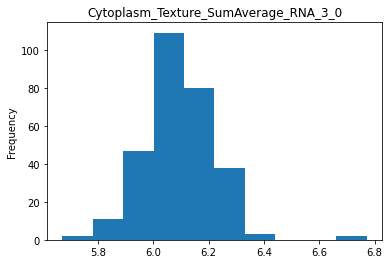

Plotting Cytoplasm_Texture_SumAverage_RNA_5_0:  63%|██████▎   | 168/267 [00:40<00:19,  4.96it/s]

Not normal


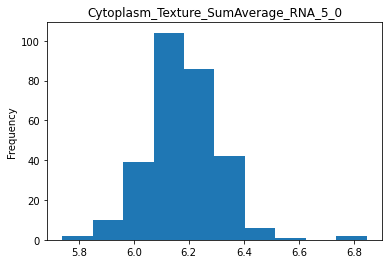

Plotting Cytoplasm_Texture_SumEntropy_RNA_10_0:  63%|██████▎   | 169/267 [00:40<00:19,  5.13it/s]

Not normal


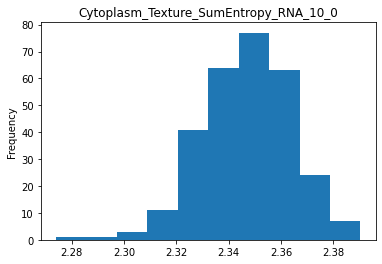

Plotting Cytoplasm_Texture_SumEntropy_RNA_3_0:  64%|██████▎   | 170/267 [00:41<00:19,  4.96it/s] 

Not normal


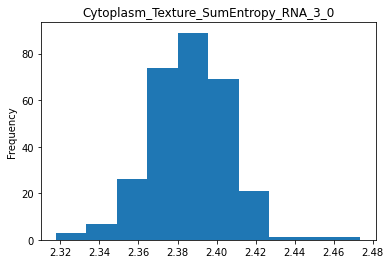

Plotting Cytoplasm_Texture_SumEntropy_RNA_5_0:  64%|██████▍   | 171/267 [00:41<00:19,  5.03it/s]

Not normal


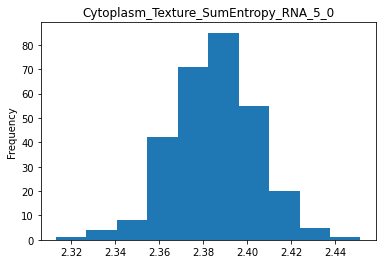

Plotting Cytoplasm_Texture_SumVariance_RNA_10_0:  64%|██████▍   | 172/267 [00:41<00:19,  4.96it/s]

Not normal


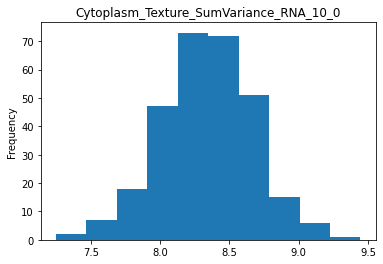

Plotting Cytoplasm_Texture_SumVariance_RNA_3_0:  65%|██████▍   | 173/267 [00:41<00:19,  4.94it/s] 

Not normal


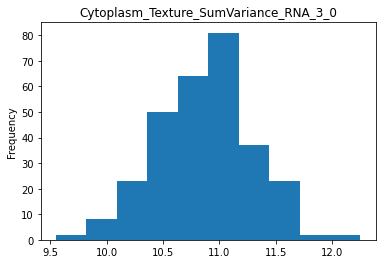

Plotting Cytoplasm_Texture_SumVariance_RNA_5_0:  65%|██████▌   | 174/267 [00:41<00:18,  4.95it/s]

Not normal


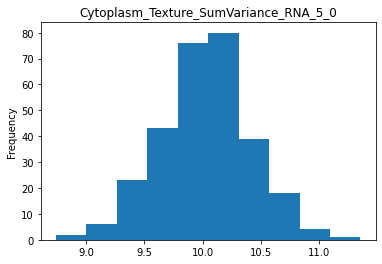

Plotting Cytoplasm_Texture_Variance_RNA_10_0:  66%|██████▌   | 175/267 [00:42<00:19,  4.82it/s]  

Not normal


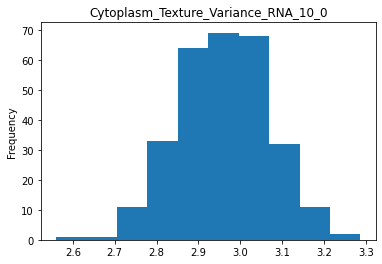

Plotting Cytoplasm_Texture_Variance_RNA_3_0:  66%|██████▌   | 176/267 [00:42<00:19,  4.76it/s] 

Not normal


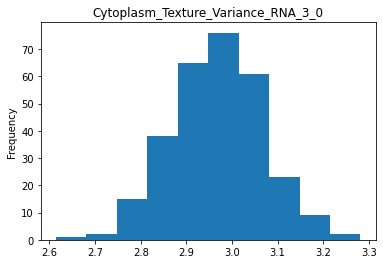

Plotting Cytoplasm_Texture_Variance_RNA_5_0:  66%|██████▋   | 177/267 [00:42<00:18,  4.89it/s]

Not normal


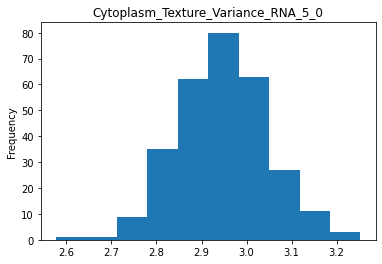

Plotting Nuclei_Granularity_10_RNA:  67%|██████▋   | 178/267 [00:42<00:20,  4.43it/s]         

Not normal


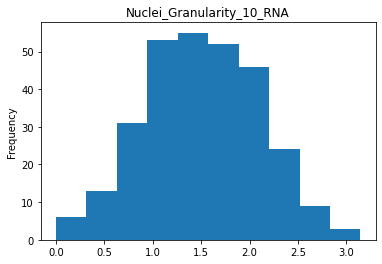

Plotting Nuclei_Granularity_11_RNA:  67%|██████▋   | 179/267 [00:42<00:19,  4.43it/s]

Not normal


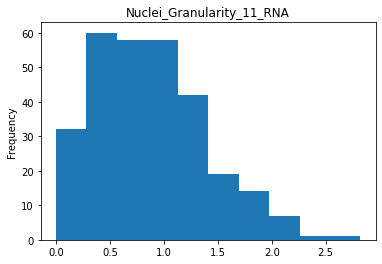

Plotting Nuclei_Granularity_12_RNA:  67%|██████▋   | 180/267 [00:43<00:25,  3.40it/s]

Not normal


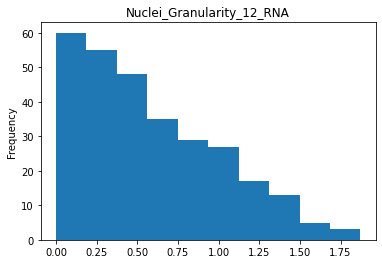

Plotting Nuclei_Granularity_13_RNA:  68%|██████▊   | 181/267 [00:43<00:23,  3.65it/s]

Not normal


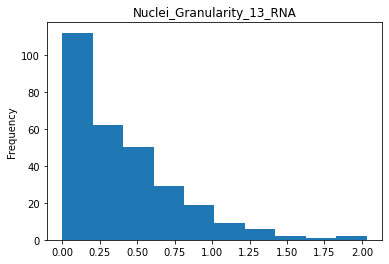

Plotting Nuclei_Granularity_14_RNA:  68%|██████▊   | 182/267 [00:43<00:22,  3.83it/s]

Not normal


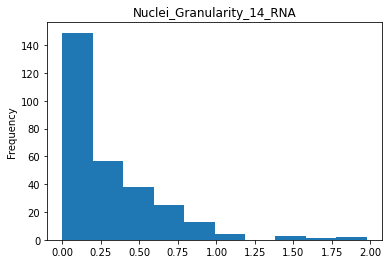

Plotting Nuclei_Granularity_15_RNA:  69%|██████▊   | 183/267 [00:44<00:20,  4.01it/s]

Not normal


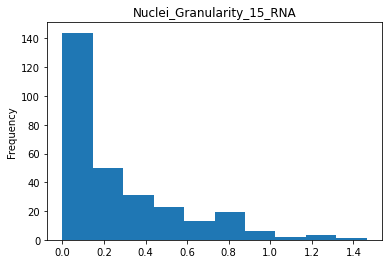

Plotting Nuclei_Granularity_16_RNA:  69%|██████▉   | 184/267 [00:44<00:20,  4.14it/s]

Not normal


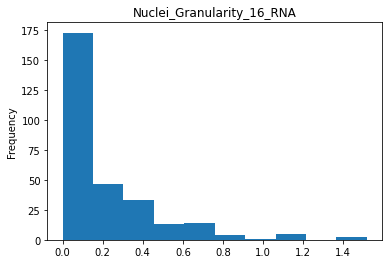

Plotting Nuclei_Granularity_1_RNA:  69%|██████▉   | 185/267 [00:44<00:19,  4.31it/s] 

Not normal


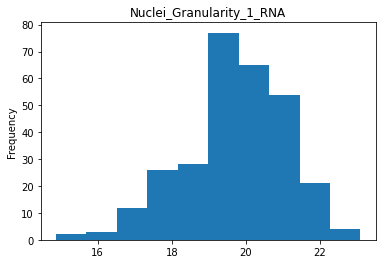

Plotting Nuclei_Granularity_2_RNA:  70%|██████▉   | 186/267 [00:44<00:18,  4.40it/s]

Not normal


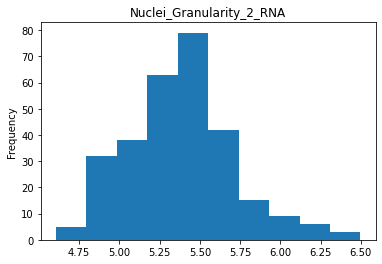

Plotting Nuclei_Granularity_3_RNA:  70%|███████   | 187/267 [00:44<00:18,  4.41it/s]

Not normal


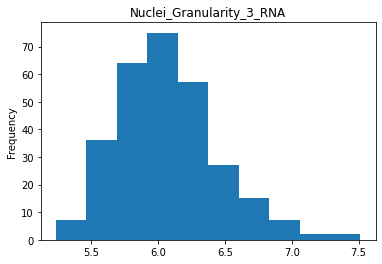

Plotting Nuclei_Granularity_4_RNA:  70%|███████   | 188/267 [00:45<00:17,  4.49it/s]

Not normal


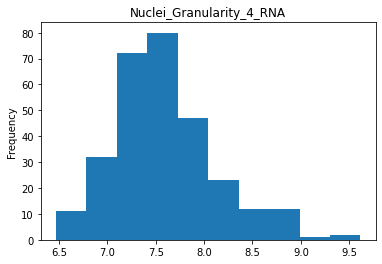

Plotting Nuclei_Granularity_5_RNA:  71%|███████   | 189/267 [00:45<00:17,  4.40it/s]

Not normal


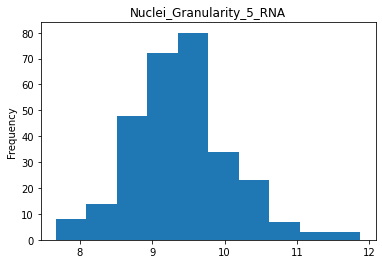

Plotting Nuclei_Granularity_6_RNA:  71%|███████   | 190/267 [00:45<00:17,  4.47it/s]

Not normal


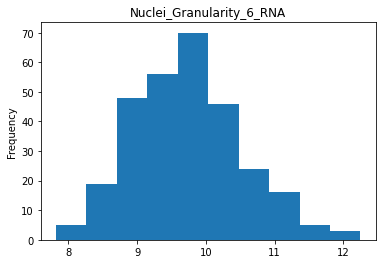

Plotting Nuclei_Granularity_7_RNA:  72%|███████▏  | 191/267 [00:45<00:16,  4.58it/s]

Not normal


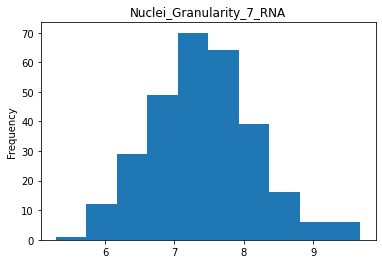

Plotting Nuclei_Granularity_8_RNA:  72%|███████▏  | 192/267 [00:46<00:16,  4.57it/s]

Not normal


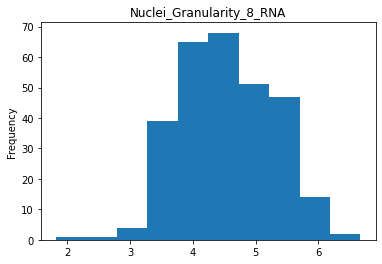

Plotting Nuclei_Granularity_9_RNA:  72%|███████▏  | 193/267 [00:46<00:16,  4.57it/s]

Not normal


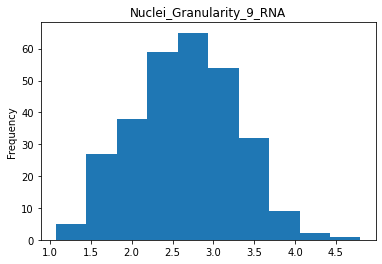

Plotting Nuclei_Intensity_IntegratedIntensityEdge_RNA:  73%|███████▎  | 194/267 [00:46<00:16,  4.56it/s]

Not normal


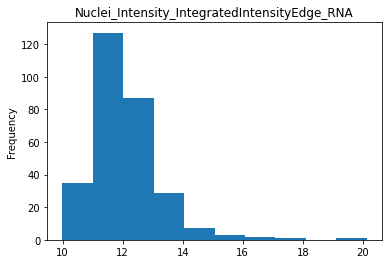

Plotting Nuclei_Intensity_IntegratedIntensity_RNA:  73%|███████▎  | 195/267 [00:46<00:15,  4.57it/s]    

Not normal


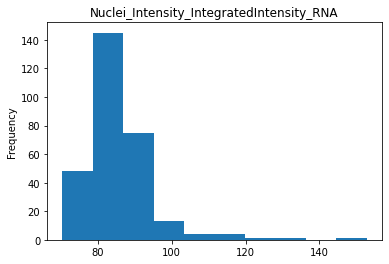

Plotting Nuclei_Intensity_LowerQuartileIntensity_RNA:  73%|███████▎  | 196/267 [00:46<00:15,  4.60it/s]

Not normal


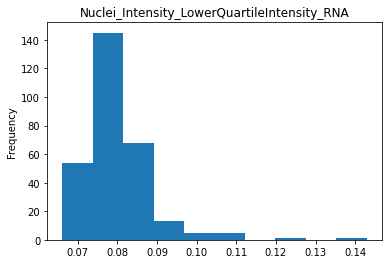

Plotting Nuclei_Intensity_MADIntensity_RNA:  74%|███████▍  | 197/267 [00:47<00:15,  4.48it/s]          

Not normal


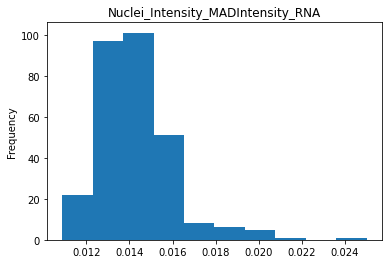

Plotting Nuclei_Intensity_MassDisplacement_RNA:  74%|███████▍  | 198/267 [00:47<00:15,  4.48it/s]

Not normal


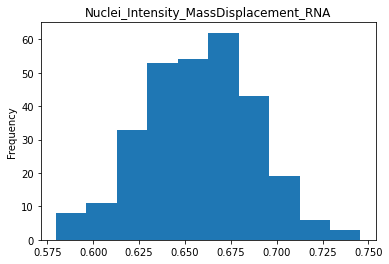

Plotting Nuclei_Intensity_MaxIntensityEdge_RNA:  75%|███████▍  | 199/267 [00:47<00:14,  4.57it/s]

Not normal


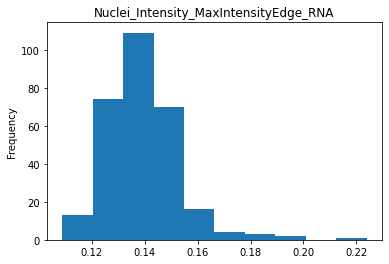

Plotting Nuclei_Intensity_MaxIntensity_RNA:  75%|███████▍  | 200/267 [00:47<00:14,  4.56it/s]    

Not normal


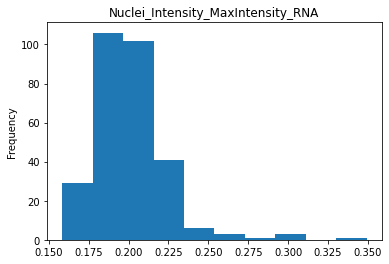

Plotting Nuclei_Intensity_MeanIntensityEdge_RNA:  75%|███████▌  | 201/267 [00:48<00:14,  4.47it/s]

Not normal


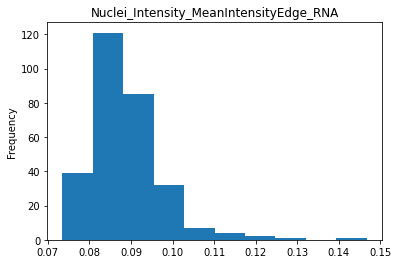

Plotting Nuclei_Intensity_MeanIntensity_RNA:  76%|███████▌  | 202/267 [00:48<00:14,  4.34it/s]    

Not normal


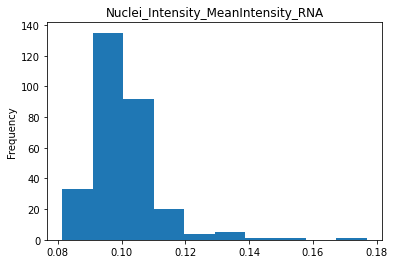

Plotting Nuclei_Intensity_MedianIntensity_RNA:  76%|███████▌  | 203/267 [00:48<00:14,  4.36it/s]

Not normal


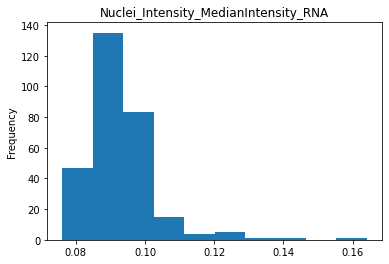

Plotting Nuclei_Intensity_MinIntensityEdge_RNA:  76%|███████▋  | 204/267 [00:48<00:14,  4.35it/s]

Not normal


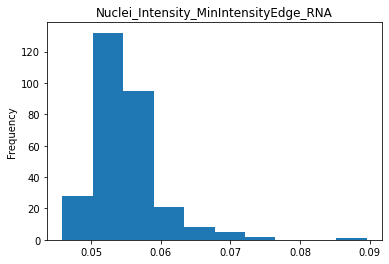

Plotting Nuclei_Intensity_MinIntensity_RNA:  77%|███████▋  | 205/267 [00:49<00:14,  4.40it/s]    

Not normal


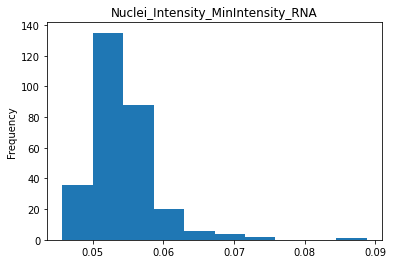

Plotting Nuclei_Intensity_StdIntensityEdge_RNA:  77%|███████▋  | 206/267 [00:49<00:13,  4.62it/s]

Not normal


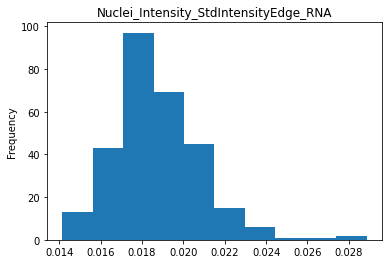

Plotting Nuclei_Intensity_StdIntensity_RNA:  78%|███████▊  | 207/267 [00:49<00:13,  4.46it/s]    

Not normal


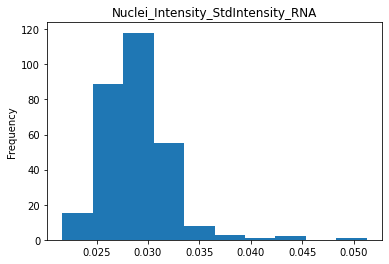

Plotting Nuclei_Intensity_UpperQuartileIntensity_RNA:  78%|███████▊  | 208/267 [00:49<00:13,  4.44it/s]

Not normal


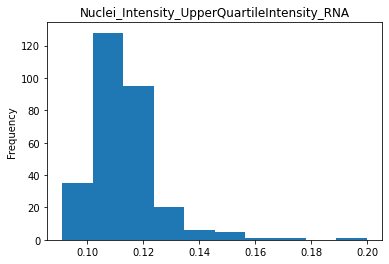

Plotting Nuclei_Location_CenterMassIntensity_X_RNA:  78%|███████▊  | 209/267 [00:49<00:12,  4.60it/s]  

Not normal


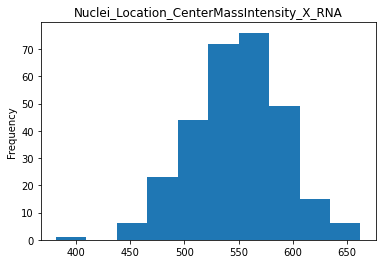

Plotting Nuclei_Location_CenterMassIntensity_Y_RNA:  79%|███████▊  | 210/267 [00:50<00:11,  4.83it/s]

Not normal


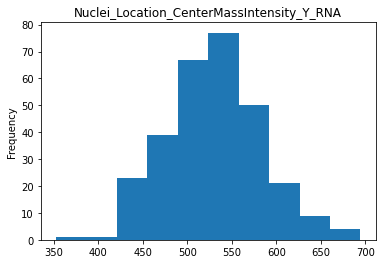

Plotting Nuclei_Location_MaxIntensity_X_RNA:  79%|███████▉  | 211/267 [00:50<00:12,  4.62it/s]       

Not normal


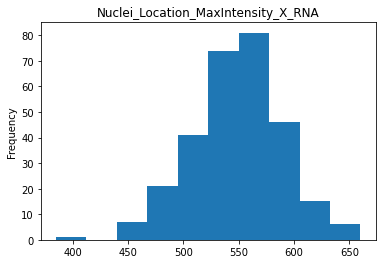

Plotting Nuclei_Location_MaxIntensity_Y_RNA:  79%|███████▉  | 212/267 [00:50<00:11,  4.63it/s]

Not normal


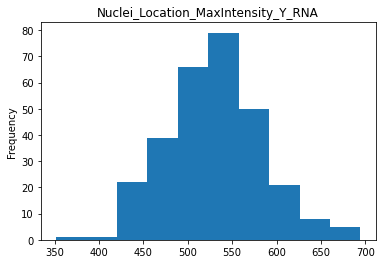

Plotting Nuclei_RadialDistribution_FracAtD_RNA_1of4:  80%|███████▉  | 213/267 [00:50<00:11,  4.62it/s]

Not normal


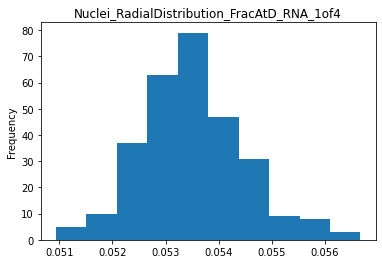

Plotting Nuclei_RadialDistribution_FracAtD_RNA_2of4:  80%|████████  | 214/267 [00:50<00:11,  4.70it/s]

Not normal


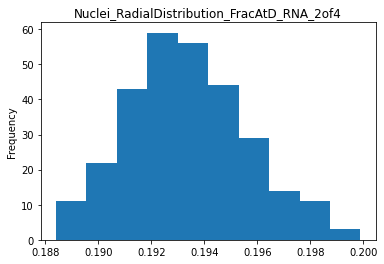

Plotting Nuclei_RadialDistribution_FracAtD_RNA_3of4:  81%|████████  | 215/267 [00:51<00:11,  4.71it/s]

Not normal


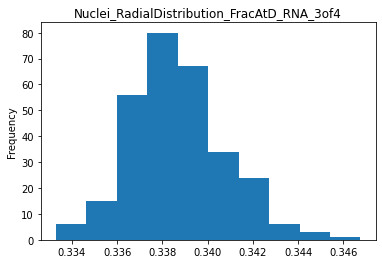

Plotting Nuclei_RadialDistribution_FracAtD_RNA_4of4:  81%|████████  | 216/267 [00:51<00:10,  4.67it/s]

Not normal


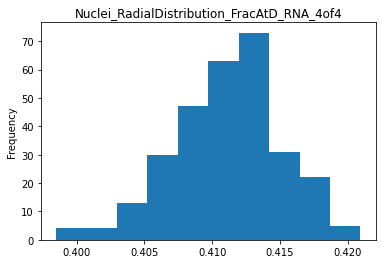

Plotting Nuclei_RadialDistribution_MeanFrac_RNA_1of4:  81%|████████▏ | 217/267 [00:51<00:10,  4.79it/s]

Not normal


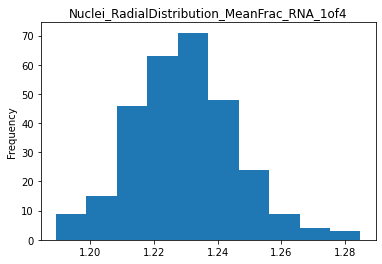

Plotting Nuclei_RadialDistribution_MeanFrac_RNA_2of4:  82%|████████▏ | 218/267 [00:51<00:10,  4.82it/s]

Not normal


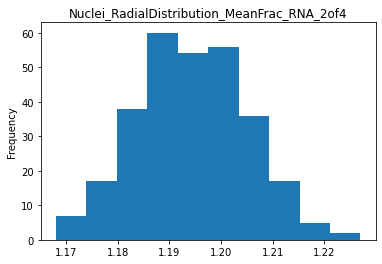

Plotting Nuclei_RadialDistribution_MeanFrac_RNA_3of4:  82%|████████▏ | 219/267 [00:51<00:09,  4.96it/s]

Not normal


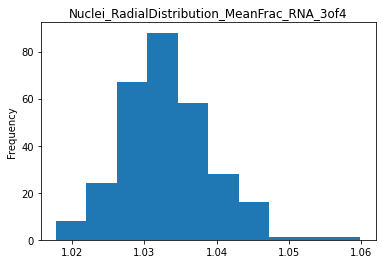

Plotting Nuclei_RadialDistribution_MeanFrac_RNA_4of4:  82%|████████▏ | 220/267 [00:52<00:09,  5.11it/s]

Not normal


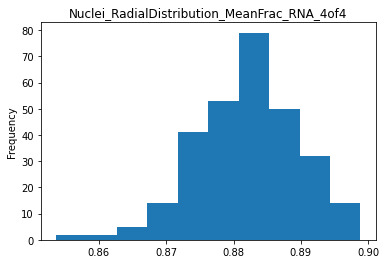

Plotting Nuclei_RadialDistribution_RadialCV_RNA_1of4:  83%|████████▎ | 221/267 [00:52<00:12,  3.74it/s]

Not normal


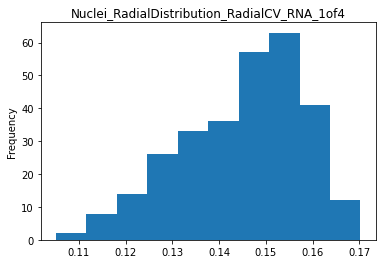

Plotting Nuclei_RadialDistribution_RadialCV_RNA_2of4:  83%|████████▎ | 222/267 [00:52<00:10,  4.09it/s]

Not normal


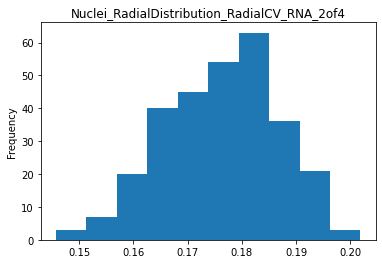

Plotting Nuclei_RadialDistribution_RadialCV_RNA_3of4:  84%|████████▎ | 223/267 [00:52<00:10,  4.29it/s]

Not normal


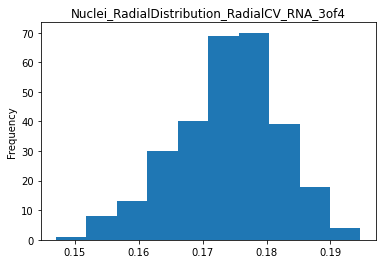

Plotting Nuclei_RadialDistribution_RadialCV_RNA_4of4:  84%|████████▍ | 224/267 [00:53<00:09,  4.51it/s]

Not normal


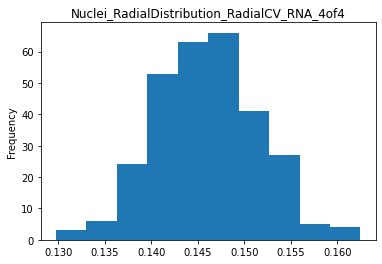

Plotting Nuclei_Texture_AngularSecondMoment_RNA_10_0:  84%|████████▍ | 225/267 [00:53<00:09,  4.61it/s]

Not normal


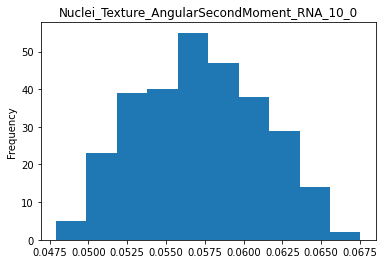

Plotting Nuclei_Texture_AngularSecondMoment_RNA_3_0:  85%|████████▍ | 226/267 [00:53<00:08,  4.63it/s] 

Not normal


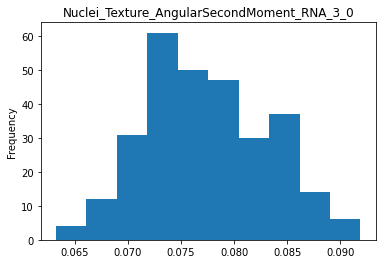

Plotting Nuclei_Texture_AngularSecondMoment_RNA_5_0:  85%|████████▌ | 227/267 [00:53<00:08,  4.81it/s]

Not normal


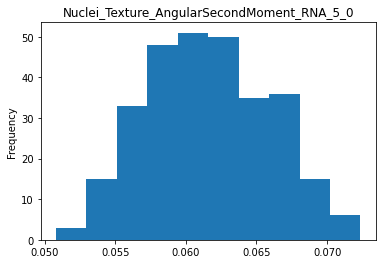

Plotting Nuclei_Texture_Contrast_RNA_10_0:  85%|████████▌ | 228/267 [00:53<00:07,  4.91it/s]          

Not normal


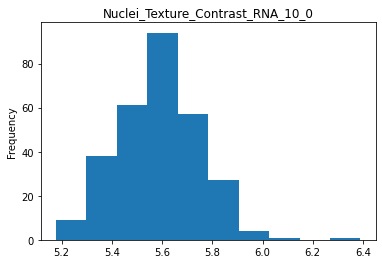

Plotting Nuclei_Texture_Contrast_RNA_3_0:  86%|████████▌ | 229/267 [00:54<00:07,  5.03it/s] 

Not normal


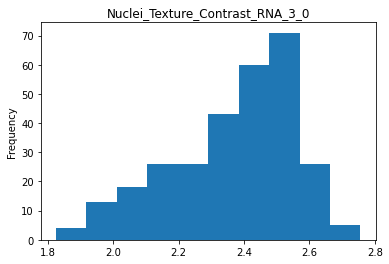

Plotting Nuclei_Texture_Contrast_RNA_5_0:  86%|████████▌ | 230/267 [00:54<00:07,  5.07it/s]

Not normal


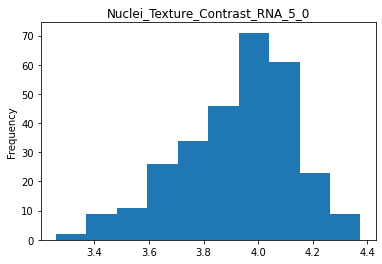

Plotting Nuclei_Texture_Correlation_RNA_10_0:  87%|████████▋ | 231/267 [00:54<00:07,  4.97it/s]

Not normal


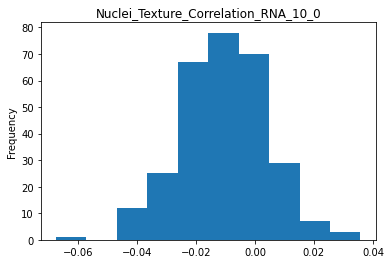

Plotting Nuclei_Texture_Correlation_RNA_3_0:  87%|████████▋ | 232/267 [00:54<00:07,  4.97it/s] 

Not normal


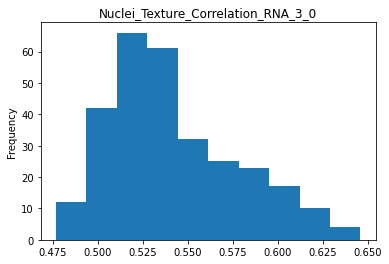

Plotting Nuclei_Texture_Correlation_RNA_5_0:  87%|████████▋ | 233/267 [00:54<00:06,  4.93it/s]

Not normal


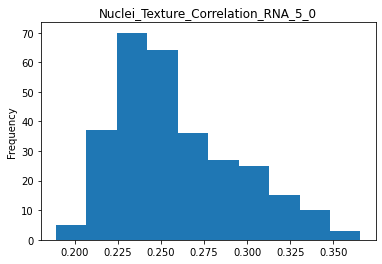

Plotting Nuclei_Texture_DifferenceEntropy_RNA_10_0:  88%|████████▊ | 234/267 [00:55<00:06,  4.89it/s]

Not normal


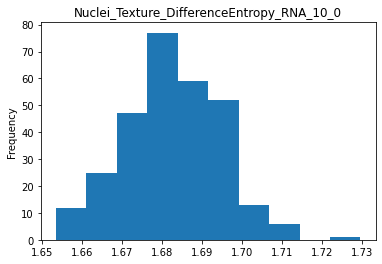

Plotting Nuclei_Texture_DifferenceEntropy_RNA_3_0:  88%|████████▊ | 235/267 [00:55<00:06,  4.78it/s] 

Not normal


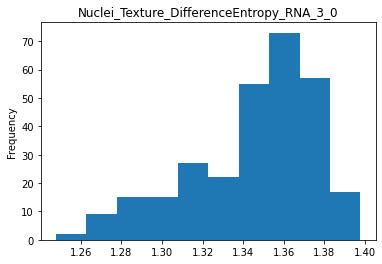

Plotting Nuclei_Texture_DifferenceEntropy_RNA_5_0:  88%|████████▊ | 236/267 [00:55<00:06,  4.73it/s]

Not normal


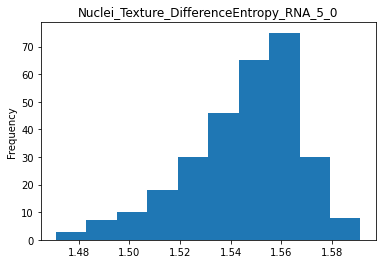

Plotting Nuclei_Texture_DifferenceVariance_RNA_10_0:  89%|████████▉ | 237/267 [00:55<00:06,  4.82it/s]

Not normal


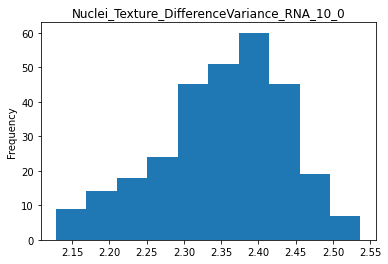

Plotting Nuclei_Texture_DifferenceVariance_RNA_3_0:  89%|████████▉ | 238/267 [00:56<00:06,  4.82it/s] 

Not normal


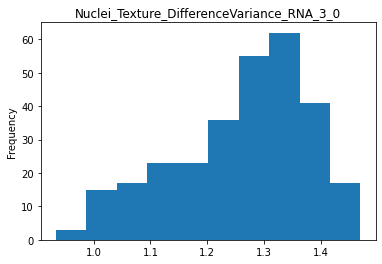

Plotting Nuclei_Texture_DifferenceVariance_RNA_5_0:  90%|████████▉ | 239/267 [00:56<00:05,  4.90it/s]

Not normal


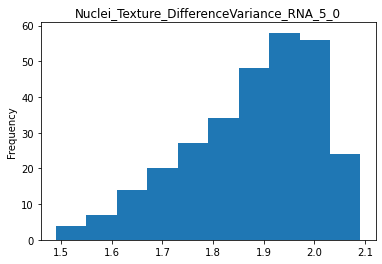

Plotting Nuclei_Texture_Entropy_RNA_10_0:  90%|████████▉ | 240/267 [00:56<00:05,  4.71it/s]          

Not normal


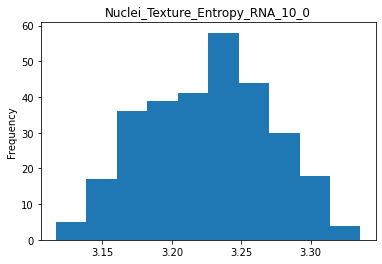

Plotting Nuclei_Texture_Entropy_RNA_3_0:  90%|█████████ | 241/267 [00:56<00:05,  4.82it/s] 

Not normal


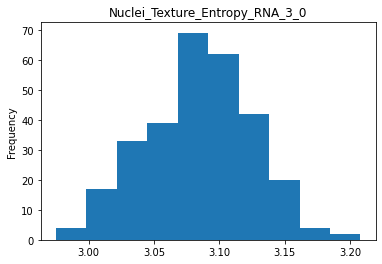

Plotting Nuclei_Texture_Entropy_RNA_5_0:  91%|█████████ | 242/267 [00:56<00:05,  4.88it/s]

Not normal


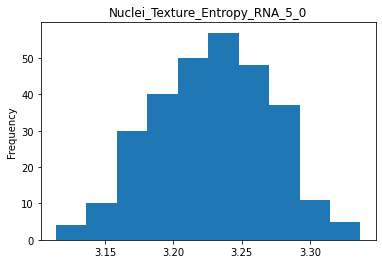

Plotting Nuclei_Texture_Gabor_RNA_10:  91%|█████████ | 243/267 [00:57<00:04,  5.00it/s]   

Not normal


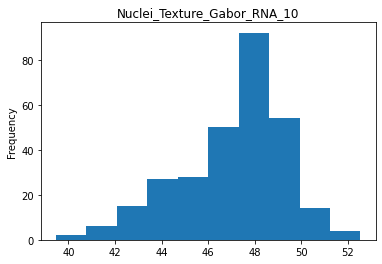

Plotting Nuclei_Texture_Gabor_RNA_3:  91%|█████████▏| 244/267 [00:57<00:04,  5.01it/s] 

Not normal


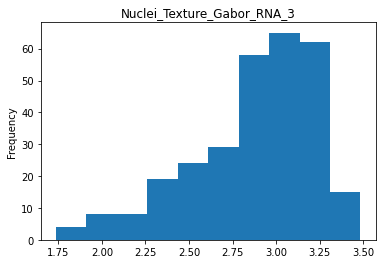

Plotting Nuclei_Texture_Gabor_RNA_5:  92%|█████████▏| 245/267 [00:57<00:04,  5.02it/s]

Not normal


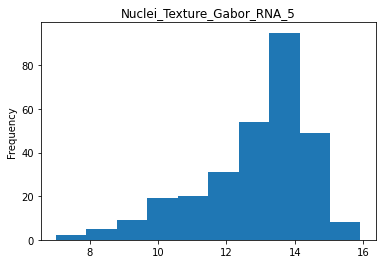

Plotting Nuclei_Texture_InfoMeas1_RNA_10_0:  92%|█████████▏| 246/267 [00:57<00:04,  5.19it/s]

Not normal


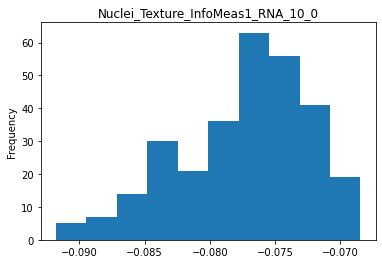

Plotting Nuclei_Texture_InfoMeas1_RNA_3_0:  93%|█████████▎| 247/267 [00:57<00:03,  5.20it/s] 

Not normal


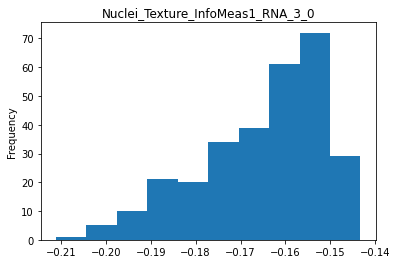

Plotting Nuclei_Texture_InfoMeas1_RNA_5_0:  93%|█████████▎| 248/267 [00:57<00:03,  5.05it/s]

Not normal


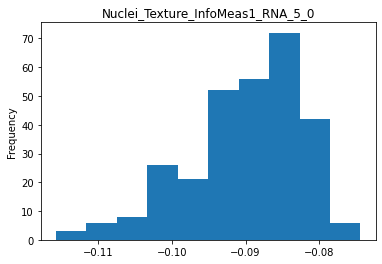

Plotting Nuclei_Texture_InfoMeas2_RNA_10_0:  93%|█████████▎| 249/267 [00:58<00:03,  5.05it/s]

Not normal


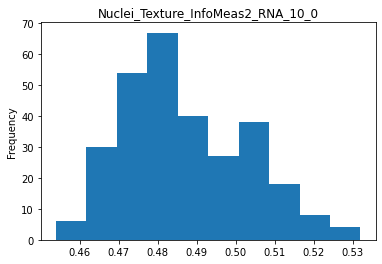

Plotting Nuclei_Texture_InfoMeas2_RNA_3_0:  94%|█████████▎| 250/267 [00:58<00:03,  4.92it/s] 

Not normal


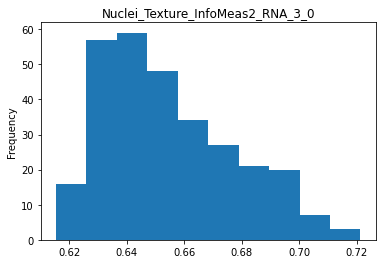

Plotting Nuclei_Texture_InfoMeas2_RNA_5_0:  94%|█████████▍| 251/267 [00:58<00:03,  4.97it/s]

Not normal


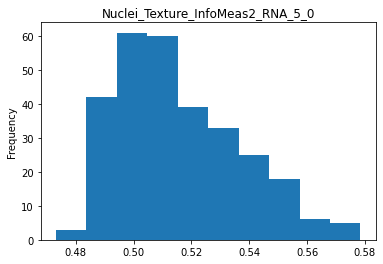

Plotting Nuclei_Texture_InverseDifferenceMoment_RNA_10_0:  94%|█████████▍| 252/267 [00:58<00:03,  4.78it/s]

Not normal


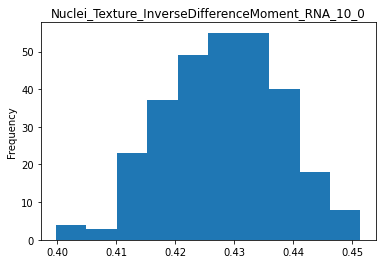

Plotting Nuclei_Texture_InverseDifferenceMoment_RNA_3_0:  95%|█████████▍| 253/267 [00:59<00:02,  4.86it/s] 

Not normal


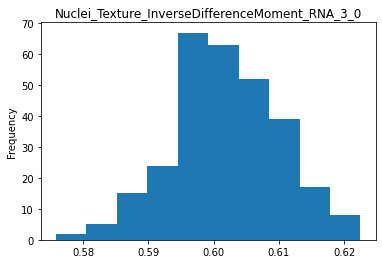

Plotting Nuclei_Texture_InverseDifferenceMoment_RNA_5_0:  95%|█████████▌| 254/267 [00:59<00:02,  4.93it/s]

Not normal


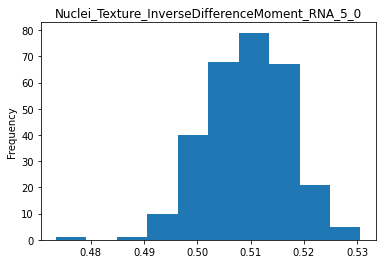

Plotting Nuclei_Texture_SumAverage_RNA_10_0:  96%|█████████▌| 255/267 [00:59<00:02,  4.82it/s]            

Not normal


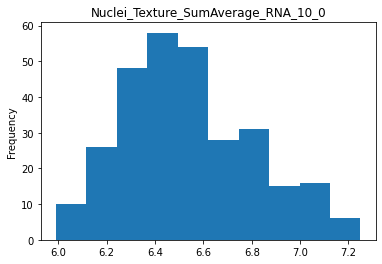

Plotting Nuclei_Texture_SumAverage_RNA_3_0:  96%|█████████▌| 256/267 [00:59<00:02,  4.93it/s] 

Not normal


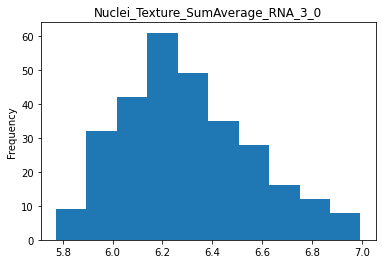

Plotting Nuclei_Texture_SumAverage_RNA_5_0:  96%|█████████▋| 257/267 [00:59<00:02,  4.87it/s]

Not normal


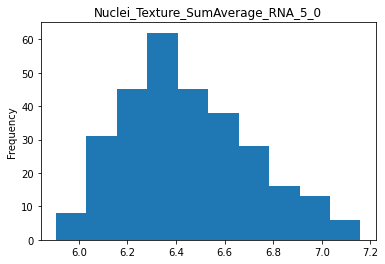

Plotting Nuclei_Texture_SumEntropy_RNA_10_0:  97%|█████████▋| 258/267 [01:00<00:01,  4.93it/s]

Not normal


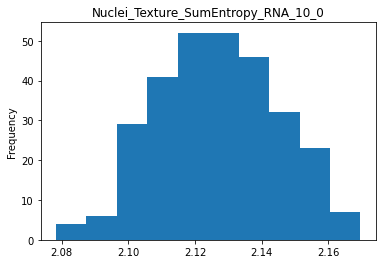

Plotting Nuclei_Texture_SumEntropy_RNA_3_0:  97%|█████████▋| 259/267 [01:00<00:01,  5.07it/s] 

Not normal


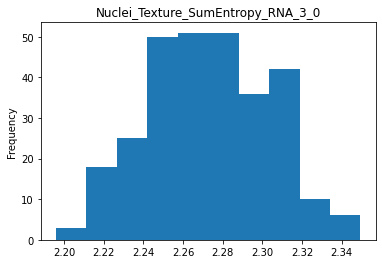

Plotting Nuclei_Texture_SumEntropy_RNA_5_0:  97%|█████████▋| 260/267 [01:00<00:01,  5.04it/s]

Not normal


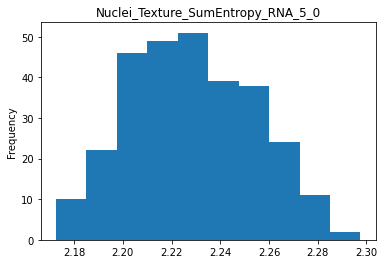

Plotting Nuclei_Texture_SumVariance_RNA_10_0:  98%|█████████▊| 261/267 [01:00<00:01,  5.02it/s]

Not normal


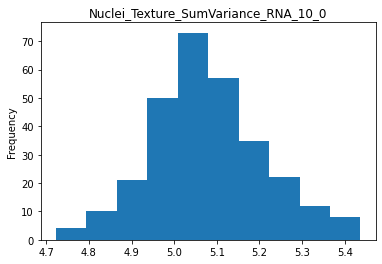

Plotting Nuclei_Texture_SumVariance_RNA_3_0:  98%|█████████▊| 262/267 [01:01<00:01,  3.71it/s] 

Not normal


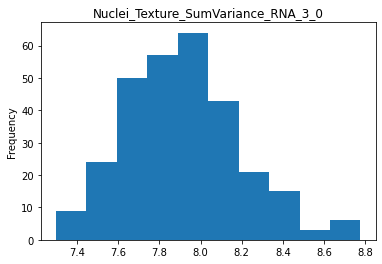

Plotting Nuclei_Texture_SumVariance_RNA_5_0:  99%|█████████▊| 263/267 [01:01<00:00,  4.04it/s]

Not normal


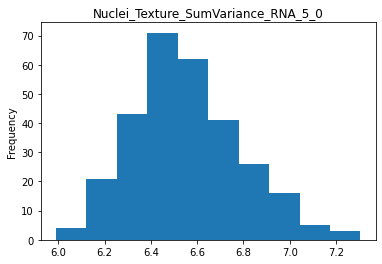

Plotting Nuclei_Texture_Variance_RNA_10_0:  99%|█████████▉| 264/267 [01:01<00:00,  4.24it/s]  

Not normal


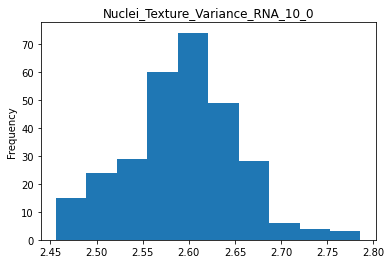

Plotting Nuclei_Texture_Variance_RNA_3_0:  99%|█████████▉| 265/267 [01:01<00:00,  4.39it/s] 

Not normal


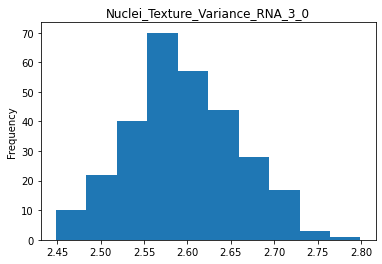

Plotting Nuclei_Texture_Variance_RNA_5_0: 100%|█████████▉| 266/267 [01:01<00:00,  4.54it/s]

Not normal


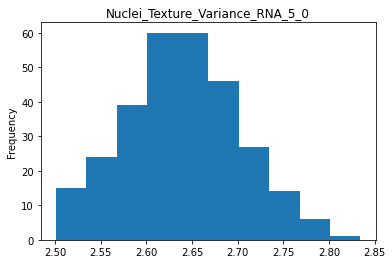

Plotting Nuclei_Texture_Variance_RNA_5_0: 100%|██████████| 267/267 [01:02<00:00,  4.30it/s]


In [28]:
RNA_df = Data_object.exclude_other_channels("RNA")
display_plots(RNA_df)

In [14]:
del RNA_df, DNA_df, AGP_df, Mito_df, ER_df